# Init results

In [106]:
#%%capture
%load_ext autoreload
%autoreload 2
%matplotlib notebook

import os
import cortex
import numpy as np
import matplotlib.pyplot as pl
from matplotlib import cm
import sys
import yaml
import time
from collections import defaultdict as dd
from scipy.stats import sem, ks_2samp
import seaborn as sns
import pandas as pds
import dill
from skimage import filters

opj = os.path.join

sys.path.append("..")

from prfpy.stimulus import PRFStimulus2D
from prfpy.model import Iso2DGaussianModel, CSS_Iso2DGaussianModel, Norm_Iso2DGaussianModel, DoG_Iso2DGaussianModel
from prfpy.fit import Iso2DGaussianFitter, Norm_Iso2DGaussianFitter, DoG_Iso2DGaussianFitter, CSS_Iso2DGaussianFitter

from utils.preproc_utils import *
from utils.postproc_utils import *
from utils.visualize_results import visualize_results

from IPython.core.display import display, HTML

sound_file = '/Users/marcoaqil/Downloads/filling-your-inbox.mp3'

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [107]:
#results object
current_results = results()
                        

## Combine & Process results

In [ ]:
current_results.combine_results(results_folder='/Volumes/Crucial X8/PRFMapping/PRFMapping-Deriv-hires/prfpy/FS7_results/separate_conds_noCV/ZSC', 
                    timecourse_folder='/Volumes/Crucial X8/PRFMapping/PRFMapping-Deriv-hires/prfpy/FS7_results/timecourses/',
                               calculate_CCrsq=False,
                               calculate_noise_ceiling=False)

In [251]:
current_results.combine_results(results_folder='/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/prfpy/TC', 
                    timecourse_folder='/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/timecourses',
                               calculate_CCrsq=False,
                               calculate_noise_ceiling=False)

100%|██████████| 24/24 [00:01<00:00, 16.37it/s]


In [8]:
current_results.combine_results(results_folder='/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/prfpy/999999_tc', 
                            timecourse_folder='/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/timecourses',
                               calculate_CCrsq=False,
                               calculate_noise_ceiling=False)

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10.12it/s]


In [32]:
current_results.combine_results(results_folder='/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/prfpy/crossvalidated_tc', 
                            timecourse_folder='/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/timecourses',
                               calculate_CCrsq=False,
                               calculate_noise_ceiling=True,
                               screenshot_paths = ['/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/HCP_data/7T_RETBAR_small.hdf5'])

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████| 360/360 [14:59<00:00,  2.50s/it]


In [9]:
current_results.combine_results(results_folder='/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/prfpy/TC_nocv', 
                            timecourse_folder='/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/timecourses',
                               calculate_CCrsq=False,
                               calculate_noise_ceiling=False)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████| 180/180 [00:09<00:00, 18.07it/s]


In [ ]:
current_results.combine_results(results_folder='/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/prfpy/TC_nocv', 
                            timecourse_folder='/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/timecourses',
                               calculate_CCrsq=False,
                               calculate_noise_ceiling=False)

In [100]:
current_results.combine_results(results_folder='/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/prfpy/allconds_nocv', 
                            timecourse_folder='/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/timecourses',
                               calculate_CCrsq=False,
                               calculate_noise_ceiling=False)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 78/78 [00:03<00:00, 21.44it/s]


In [101]:
current_results.process_results(current_results.main_dict,
                                compute_suppression_index = False,
                                return_norm_profiles = False)

  0%|                                                                                                                                     | 0/1 [00:00<?, ?it/s]

  0%|                                                                                                                                    | 0/78 [00:00<?, ?it/s]/Users/marcoaqil/prfpy_tools/test/../utils/postproc_utils.py:503: RuntimeWarning: divide by zero encountered in true_divide
  prf = params[...,3] * np.exp(-0.5*x[...,np.newaxis]**2 / params[...,2]**2)
/Users/marcoaqil/prfpy_tools/test/../utils/postproc_utils.py:374: RuntimeWarning: invalid value encountered in true_divide
  processed_results['Size ratio (sigma_2/sigma_1)'][k2][mask] = v2[:,6]/v2[:,2]
/Users/marcoaqil/prfpy_tools/test/../utils/postproc_utils.py:377: RuntimeWarning: invalid value encountered in true_divide
  processed_results['Ratio (B/D)'][k2][mask] = v2[:,7]/v2[:,8]
/Users/marcoaqil/prfpy_tools/test/../utils/postproc_utils.py:378: RuntimeWarning: invali

 50%|█████████████████████████████████████████████████████████████▌                                                             | 39/78 [10:47<11:20, 17.45s/it]

 51%|███████████████████████████████████████████████████████████████                                                            | 40/78 [11:03<10:45, 17.00s/it]

 53%|████████████████████████████████████████████████████████████████▋                                                          | 41/78 [11:18<10:05, 16.37s/it]

 54%|██████████████████████████████████████████████████████████████████▏                                                        | 42/78 [11:33<09:33, 15.92s/it]

 55%|███████████████████████████████████████████████████████████████████▊                                                       | 43/78 [11:49<09:19, 15.98s/it]

 56%|█████████████████████████████████████████████████████████████████████▍                                                     | 44/78 [12:05<08:57, 15.80s/it]

 58%|███████████████████████

# Init visualize results

In [108]:
vis_res = visualize_results(current_results)

## Fix HCP MSMall ordering (run once on HCP data)

In [103]:
#fix HCP ordering
if 'HCP' in vis_res.main_dict:
    hcp_atlas_mask_path = ['/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/HCP_data/atlas/L.atlasroi.59k_fs_LR.shape.gii',
                          '/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/HCP_data/atlas/R.atlasroi.59k_fs_LR.shape.gii']
    vis_res.fix_hcp_ordering(vis_res.main_dict['HCP'], hcp_atlas_mask_path)

## Load previous visualize_result.main_dict

In [109]:
#rsqwm have rsq-weighted means over subjects on fsaverage
#maindict_ #allall, allruns_sepcond_rsqwm, 5050CV, allruns_sepcond_zsc, HCP_181subjects_rsqwm, HCP_999999, 99mean181, 99split20, HCP_cv (tcfit), HCP_tc_nocv
#HCP_allruns_allconds_23sj.pickle
with open('/Volumes/Crucial X8/maindict_HCP_allruns_allconds_78sj.pickle', 'rb') as handle:
    vis_res.main_dict=dill.load(handle)

## Save current visualize_result.main_dict

In [105]:
with open('/Volumes/Crucial X8/maindict_HCP_allruns_allconds_78sj.pickle', 'wb') as handle:
     dill.dump(vis_res.main_dict, handle)

## Load/Save rois (run always)

In [110]:
#this function parses or imports labaled ROIs for all subjects (run always)
#set to list of ROI names to output indices of rois for roi-only fitting. empty list for no output
output_rois = []#['custom.OccPole', 'custom.V1','custom.V2','custom.V3','custom.hV4','custom.VO',
                      #'custom.V3AB','custom.LO','custom.TO','custom.IPS','custom.FO']
    
#import flatmaps from freesurfer, if created, and import freesurfer custom rois to pycortex overlays.svg (need pre-imported flatmaps for this)
import_flatmaps = False

output_rois_path = '/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP' #/Volumes/Crucial X8/PRFMapping/PRFMapping-Deriv-hires
#freesurfer directory
fs_dir = '/Volumes/Crucial X8/PRFMapping/PRFMapping-Deriv-hires/freesurfer'

#HCP atlas path (without .{hemi}.gii)
hcp_atlas_path = '/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/HCP_data/atlas/Q1-Q6_RelatedParcellation210.CorticalAreas_dil_Colors.59k_fs_LR.dlabel' 

vis_res.define_rois_and_flatmaps(fs_dir, output_rois_path, import_flatmaps, output_rois, hcp_atlas_path)
    

Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HC

## Project to fsaverage

In [104]:
#projecting results to fsaverage surface
vis_res.project_to_fsaverage(models = ['Norm_abcd'], #'Noise Ceiling (RSq)'],
                             parameters = ['x_pos', 'y_pos','Norm Param. B','Norm Param. D','Size (sigma_1)','Size (sigma_2)','Amplitude', 'Surround Amplitude','Size (fwhmax)','Surround Size (fwatmin)'],# 'Noise Ceiling'],#[
                             space_names = 'HCP',
                             analysis_names = 'all', 
                             subject_ids = 'all',#['HCP_cvrsq'],#['725751','100610','765864','109123','158136']
                             hcp_atlas_mask_path = ['/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/HCP_data/atlas/L.atlasroi.59k_fs_LR.shape.gii',
                                                    '/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/HCP_data/atlas/R.atlasroi.59k_fs_LR.shape.gii'],
                             hcp_cii_file_path = '/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/HCP_data/100610/MNINonLinear/Results/tfMRI_RETBAR1_7T_AP/tfMRI_RETBAR1_7T_AP_Atlas_1.6mm_MSMAll_hp2000_clean.dtseries.nii',
                             hcp_old_sphere = '/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/HCP_data/atlas/resample_fsaverage/fs_LR-deformed_to-fsaverage.?.sphere.59k_fs_LR.surf.gii',
                             hcp_new_sphere = '/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/HCP_data/atlas/resample_fsaverage/fsaverage_std_sphere.?.164k_fsavg_?.surf.gii',
                             hcp_old_area = '/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/HCP_data/atlas/resample_fsaverage/fs_LR.?.midthickness_va_avg.59k_fs_LR.shape.gii',
                             hcp_new_area = '/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/HCP_data/atlas/resample_fsaverage/fsaverage.?.midthickness_va_avg.164k_fsavg_?.shape.gii',
                             hcp_temp_folder = '/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/temp_files')

  0%|                                                                                                                                    | 0/78 [00:00<?, ?it/s]

HCP fit-task-all_fit-runs-all 100610


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  1%|█▌                                                                                                                          | 1/78 [00:10<12:55, 10.07s/it]

False
False
HCP fit-task-all_fit-runs-all 102311


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  3%|███▏                                                                                                                        | 2/78 [00:18<11:39,  9.20s/it]

False
False
HCP fit-task-all_fit-runs-all 102816


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  4%|████▊                                                                                                                       | 3/78 [00:27<11:06,  8.88s/it]

False
False
HCP fit-task-all_fit-runs-all 104416


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  5%|██████▎                                                                                                                     | 4/78 [00:35<10:53,  8.84s/it]

False
False
HCP fit-task-all_fit-runs-all 105923


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  6%|███████▉                                                                                                                    | 5/78 [00:44<10:28,  8.61s/it]

False
False
HCP fit-task-all_fit-runs-all 108323


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  8%|█████████▌                                                                                                                  | 6/78 [00:51<09:57,  8.30s/it]

False
False
HCP fit-task-all_fit-runs-all 109123


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  9%|███████████▏                                                                                                                | 7/78 [00:59<09:33,  8.07s/it]

False
False
HCP fit-task-all_fit-runs-all 111312


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 10%|████████████▋                                                                                                               | 8/78 [01:06<09:06,  7.80s/it]

False
False
HCP fit-task-all_fit-runs-all 111514


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 12%|██████████████▎                                                                                                             | 9/78 [01:15<09:19,  8.12s/it]

False
False
HCP fit-task-all_fit-runs-all 114823


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 13%|███████████████▊                                                                                                           | 10/78 [01:22<08:55,  7.87s/it]

False
False
HCP fit-task-all_fit-runs-all 115825


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 14%|█████████████████▎                                                                                                         | 11/78 [01:30<08:35,  7.69s/it]

False
False
HCP fit-task-all_fit-runs-all 116726


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 15%|██████████████████▉                                                                                                        | 12/78 [01:37<08:23,  7.63s/it]

False
False
HCP fit-task-all_fit-runs-all 118225


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 17%|████████████████████▌                                                                                                      | 13/78 [01:45<08:22,  7.73s/it]

False
False
HCP fit-task-all_fit-runs-all 125525


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 18%|██████████████████████                                                                                                     | 14/78 [01:53<08:18,  7.79s/it]

False
False
HCP fit-task-all_fit-runs-all 126426


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 19%|███████████████████████▋                                                                                                   | 15/78 [02:01<08:10,  7.78s/it]

False
False
HCP fit-task-all_fit-runs-all 128935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 21%|█████████████████████████▏                                                                                                 | 16/78 [02:08<07:54,  7.66s/it]

False
False
HCP fit-task-all_fit-runs-all 130114


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 22%|██████████████████████████▊                                                                                                | 17/78 [02:15<07:41,  7.57s/it]

False
False
HCP fit-task-all_fit-runs-all 130518


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 23%|████████████████████████████▍                                                                                              | 18/78 [02:23<07:27,  7.46s/it]

False
False
HCP fit-task-all_fit-runs-all 131217


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 24%|█████████████████████████████▉                                                                                             | 19/78 [02:30<07:22,  7.51s/it]

False
False
HCP fit-task-all_fit-runs-all 131722


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 26%|███████████████████████████████▌                                                                                           | 20/78 [02:38<07:12,  7.45s/it]

False
False
HCP fit-task-all_fit-runs-all 132118


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 27%|█████████████████████████████████                                                                                          | 21/78 [02:45<07:11,  7.56s/it]

False
False
HCP fit-task-all_fit-runs-all 134627


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 28%|██████████████████████████████████▋                                                                                        | 22/78 [02:53<07:05,  7.60s/it]

False
False
HCP fit-task-all_fit-runs-all 134829


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 29%|████████████████████████████████████▎                                                                                      | 23/78 [03:02<07:14,  7.89s/it]

False
False
HCP fit-task-all_fit-runs-all 135124


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 31%|█████████████████████████████████████▊                                                                                     | 24/78 [03:10<07:07,  7.91s/it]

False
False
HCP fit-task-all_fit-runs-all 137128


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 32%|███████████████████████████████████████▍                                                                                   | 25/78 [03:18<07:06,  8.05s/it]

False
False
HCP fit-task-all_fit-runs-all 140117


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 33%|█████████████████████████████████████████                                                                                  | 26/78 [03:26<06:55,  7.99s/it]

False
False
HCP fit-task-all_fit-runs-all 144226


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 35%|██████████████████████████████████████████▌                                                                                | 27/78 [03:33<06:37,  7.80s/it]

False
False
HCP fit-task-all_fit-runs-all 145834


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 36%|████████████████████████████████████████████▏                                                                              | 28/78 [03:41<06:26,  7.72s/it]

False
False
HCP fit-task-all_fit-runs-all 146129


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 37%|█████████████████████████████████████████████▋                                                                             | 29/78 [03:49<06:19,  7.74s/it]

False
False
HCP fit-task-all_fit-runs-all 146432


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 38%|███████████████████████████████████████████████▎                                                                           | 30/78 [03:57<06:16,  7.85s/it]

False
False
HCP fit-task-all_fit-runs-all 146735


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 40%|████████████████████████████████████████████████▉                                                                          | 31/78 [04:05<06:11,  7.91s/it]

False
False
HCP fit-task-all_fit-runs-all 146937


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 41%|██████████████████████████████████████████████████▍                                                                        | 32/78 [04:13<06:04,  7.92s/it]

False
False
HCP fit-task-all_fit-runs-all 148133


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 42%|████████████████████████████████████████████████████                                                                       | 33/78 [04:20<05:55,  7.90s/it]

False
False
HCP fit-task-all_fit-runs-all 150423


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 44%|█████████████████████████████████████████████████████▌                                                                     | 34/78 [04:28<05:47,  7.90s/it]

False
False
HCP fit-task-all_fit-runs-all 155938


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 45%|███████████████████████████████████████████████████████▏                                                                   | 35/78 [04:36<05:37,  7.86s/it]

False
False
HCP fit-task-all_fit-runs-all 156334


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 46%|████████████████████████████████████████████████████████▊                                                                  | 36/78 [04:44<05:32,  7.91s/it]

False
False
HCP fit-task-all_fit-runs-all 157336


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 47%|██████████████████████████████████████████████████████████▎                                                                | 37/78 [04:52<05:24,  7.91s/it]

False
False
HCP fit-task-all_fit-runs-all 158035


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 49%|███████████████████████████████████████████████████████████▉                                                               | 38/78 [05:00<05:18,  7.97s/it]

False
False
HCP fit-task-all_fit-runs-all 158136


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 50%|█████████████████████████████████████████████████████████████▌                                                             | 39/78 [05:08<05:06,  7.85s/it]

False
False
HCP fit-task-all_fit-runs-all 159239


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 51%|███████████████████████████████████████████████████████████████                                                            | 40/78 [05:16<05:04,  8.02s/it]

False
False
HCP fit-task-all_fit-runs-all 162935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 53%|████████████████████████████████████████████████████████████████▋                                                          | 41/78 [05:25<05:01,  8.15s/it]

False
False
HCP fit-task-all_fit-runs-all 164131


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 54%|██████████████████████████████████████████████████████████████████▏                                                        | 42/78 [05:32<04:42,  7.84s/it]

False
False
HCP fit-task-all_fit-runs-all 164636


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 55%|███████████████████████████████████████████████████████████████████▊                                                       | 43/78 [05:39<04:30,  7.71s/it]

False
False
HCP fit-task-all_fit-runs-all 165436


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 56%|█████████████████████████████████████████████████████████████████████▍                                                     | 44/78 [05:48<04:28,  7.90s/it]

False
False
HCP fit-task-all_fit-runs-all 167036


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 58%|██████████████████████████████████████████████████████████████████████▉                                                    | 45/78 [05:55<04:15,  7.74s/it]

False
False
HCP fit-task-all_fit-runs-all 167440


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 59%|████████████████████████████████████████████████████████████████████████▌                                                  | 46/78 [06:02<04:01,  7.55s/it]

False
False
HCP fit-task-all_fit-runs-all 169040


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 60%|██████████████████████████████████████████████████████████████████████████                                                 | 47/78 [06:09<03:49,  7.41s/it]

False
False
HCP fit-task-all_fit-runs-all 169343


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 62%|███████████████████████████████████████████████████████████████████████████▋                                               | 48/78 [06:17<03:42,  7.42s/it]

False
False
HCP fit-task-all_fit-runs-all 169444


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 63%|█████████████████████████████████████████████████████████████████████████████▎                                             | 49/78 [06:24<03:39,  7.56s/it]

False
False
HCP fit-task-all_fit-runs-all 169747


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 64%|██████████████████████████████████████████████████████████████████████████████▊                                            | 50/78 [06:32<03:29,  7.50s/it]

False
False
HCP fit-task-all_fit-runs-all 171633


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 65%|████████████████████████████████████████████████████████████████████████████████▍                                          | 51/78 [06:39<03:22,  7.51s/it]

False
False
HCP fit-task-all_fit-runs-all 172130


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 67%|██████████████████████████████████████████████████████████████████████████████████                                         | 52/78 [06:47<03:17,  7.58s/it]

False
False
HCP fit-task-all_fit-runs-all 173334


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 68%|███████████████████████████████████████████████████████████████████████████████████▌                                       | 53/78 [06:55<03:10,  7.63s/it]

False
False
HCP fit-task-all_fit-runs-all 175237


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 69%|█████████████████████████████████████████████████████████████████████████████████████▏                                     | 54/78 [07:02<03:01,  7.58s/it]

False
False
HCP fit-task-all_fit-runs-all 176542


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 71%|██████████████████████████████████████████████████████████████████████████████████████▋                                    | 55/78 [07:10<02:55,  7.61s/it]

False
False
HCP fit-task-all_fit-runs-all 177140


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 72%|████████████████████████████████████████████████████████████████████████████████████████▎                                  | 56/78 [07:18<02:47,  7.60s/it]

False
False
HCP fit-task-all_fit-runs-all 177645


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 73%|█████████████████████████████████████████████████████████████████████████████████████████▉                                 | 57/78 [07:25<02:39,  7.62s/it]

False
False
HCP fit-task-all_fit-runs-all 177746


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 74%|███████████████████████████████████████████████████████████████████████████████████████████▍                               | 58/78 [07:33<02:32,  7.61s/it]

False
False
HCP fit-task-all_fit-runs-all 178142


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 76%|█████████████████████████████████████████████████████████████████████████████████████████████                              | 59/78 [07:40<02:23,  7.54s/it]

False
False
HCP fit-task-all_fit-runs-all 178243


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 77%|██████████████████████████████████████████████████████████████████████████████████████████████▌                            | 60/78 [07:48<02:16,  7.60s/it]

False
False
HCP fit-task-all_fit-runs-all 178647


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 78%|████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 61/78 [07:55<02:08,  7.58s/it]

False
False
HCP fit-task-all_fit-runs-all 180533


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 79%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 62/78 [08:02<01:58,  7.40s/it]

False
False
HCP fit-task-all_fit-runs-all 181232


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 81%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 63/78 [08:10<01:52,  7.47s/it]

False
False
HCP fit-task-all_fit-runs-all 181636


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 82%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 64/78 [08:17<01:44,  7.43s/it]

False
False
HCP fit-task-all_fit-runs-all 182436


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 83%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 65/78 [08:25<01:35,  7.36s/it]

False
False
HCP fit-task-all_fit-runs-all 182739


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 66/78 [08:32<01:27,  7.30s/it]

False
False
HCP fit-task-all_fit-runs-all 185442


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 67/78 [08:39<01:19,  7.26s/it]

False
False
HCP fit-task-all_fit-runs-all 186949


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 68/78 [08:46<01:13,  7.31s/it]

False
False
HCP fit-task-all_fit-runs-all 191336


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 69/78 [08:54<01:05,  7.31s/it]

False
False
HCP fit-task-all_fit-runs-all 191841


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 70/78 [09:01<00:57,  7.25s/it]

False
False
HCP fit-task-all_fit-runs-all 192439


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 71/78 [09:08<00:50,  7.27s/it]

False
False
HCP fit-task-all_fit-runs-all 192641


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 72/78 [09:17<00:46,  7.69s/it]

False
False
HCP fit-task-all_fit-runs-all 193845


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 73/78 [09:24<00:37,  7.52s/it]

False
False
HCP fit-task-all_fit-runs-all 195041


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 74/78 [09:31<00:29,  7.37s/it]

False
False
HCP fit-task-all_fit-runs-all 196144


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 75/78 [09:38<00:21,  7.31s/it]

False
False
HCP fit-task-all_fit-runs-all 197348


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 76/78 [09:45<00:14,  7.27s/it]

False
False
HCP fit-task-all_fit-runs-all 198653


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 77/78 [09:52<00:07,  7.25s/it]

False
False
HCP fit-task-all_fit-runs-all 199655


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 78/78 [09:59<00:00,  7.69s/it]

False
False



  0%|                                                                                                                                    | 0/78 [00:00<?, ?it/s]

HCP fit-task-all_fit-runs-all 100610


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  1%|█▌                                                                                                                          | 1/78 [00:07<09:15,  7.21s/it]

False
False
HCP fit-task-all_fit-runs-all 102311


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  3%|███▏                                                                                                                        | 2/78 [00:14<09:08,  7.21s/it]

False
False
HCP fit-task-all_fit-runs-all 102816


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  4%|████▊                                                                                                                       | 3/78 [00:22<09:32,  7.64s/it]

False
False
HCP fit-task-all_fit-runs-all 104416


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  5%|██████▎                                                                                                                     | 4/78 [00:30<09:38,  7.82s/it]

False
False
HCP fit-task-all_fit-runs-all 105923


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  6%|███████▉                                                                                                                    | 5/78 [00:38<09:41,  7.97s/it]

False
False
HCP fit-task-all_fit-runs-all 108323


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  8%|█████████▌                                                                                                                  | 6/78 [00:48<10:05,  8.41s/it]

False
False
HCP fit-task-all_fit-runs-all 109123


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  9%|███████████▏                                                                                                                | 7/78 [00:57<10:19,  8.72s/it]

False
False
HCP fit-task-all_fit-runs-all 111312


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 10%|████████████▋                                                                                                               | 8/78 [01:05<09:47,  8.40s/it]

False
False
HCP fit-task-all_fit-runs-all 111514


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 12%|██████████████▎                                                                                                             | 9/78 [01:12<09:21,  8.13s/it]

False
False
HCP fit-task-all_fit-runs-all 114823


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 13%|███████████████▊                                                                                                           | 10/78 [01:21<09:28,  8.36s/it]

False
False
HCP fit-task-all_fit-runs-all 115825


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 14%|█████████████████▎                                                                                                         | 11/78 [01:29<09:07,  8.17s/it]

False
False
HCP fit-task-all_fit-runs-all 116726


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 15%|██████████████████▉                                                                                                        | 12/78 [01:37<09:03,  8.23s/it]

False
False
HCP fit-task-all_fit-runs-all 118225


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 17%|████████████████████▌                                                                                                      | 13/78 [01:45<08:42,  8.04s/it]

False
False
HCP fit-task-all_fit-runs-all 125525


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 18%|██████████████████████                                                                                                     | 14/78 [01:53<08:41,  8.14s/it]

False
False
HCP fit-task-all_fit-runs-all 126426


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 19%|███████████████████████▋                                                                                                   | 15/78 [02:01<08:32,  8.13s/it]

False
False
HCP fit-task-all_fit-runs-all 128935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 21%|█████████████████████████▏                                                                                                 | 16/78 [02:09<08:19,  8.05s/it]

False
False
HCP fit-task-all_fit-runs-all 130114


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 22%|██████████████████████████▊                                                                                                | 17/78 [02:18<08:24,  8.27s/it]

False
False
HCP fit-task-all_fit-runs-all 130518


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 23%|████████████████████████████▍                                                                                              | 18/78 [02:26<08:17,  8.29s/it]

False
False
HCP fit-task-all_fit-runs-all 131217


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 24%|█████████████████████████████▉                                                                                             | 19/78 [02:34<07:55,  8.07s/it]

False
False
HCP fit-task-all_fit-runs-all 131722


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 26%|███████████████████████████████▌                                                                                           | 20/78 [02:42<07:45,  8.02s/it]

False
False
HCP fit-task-all_fit-runs-all 132118


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 27%|█████████████████████████████████                                                                                          | 21/78 [02:50<07:34,  7.98s/it]

False
False
HCP fit-task-all_fit-runs-all 134627


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 28%|██████████████████████████████████▋                                                                                        | 22/78 [02:57<07:20,  7.87s/it]

False
False
HCP fit-task-all_fit-runs-all 134829


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 29%|████████████████████████████████████▎                                                                                      | 23/78 [03:05<07:05,  7.74s/it]

False
False
HCP fit-task-all_fit-runs-all 135124


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 31%|█████████████████████████████████████▊                                                                                     | 24/78 [03:12<06:51,  7.62s/it]

False
False
HCP fit-task-all_fit-runs-all 137128


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 32%|███████████████████████████████████████▍                                                                                   | 25/78 [03:19<06:38,  7.51s/it]

False
False
HCP fit-task-all_fit-runs-all 140117


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 33%|█████████████████████████████████████████                                                                                  | 26/78 [03:27<06:25,  7.42s/it]

False
False
HCP fit-task-all_fit-runs-all 144226


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 35%|██████████████████████████████████████████▌                                                                                | 27/78 [03:34<06:13,  7.33s/it]

False
False
HCP fit-task-all_fit-runs-all 145834


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 36%|████████████████████████████████████████████▏                                                                              | 28/78 [03:41<06:02,  7.24s/it]

False
False
HCP fit-task-all_fit-runs-all 146129


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 37%|█████████████████████████████████████████████▋                                                                             | 29/78 [03:48<05:53,  7.21s/it]

False
False
HCP fit-task-all_fit-runs-all 146432


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 38%|███████████████████████████████████████████████▎                                                                           | 30/78 [03:55<05:47,  7.25s/it]

False
False
HCP fit-task-all_fit-runs-all 146735


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 40%|████████████████████████████████████████████████▉                                                                          | 31/78 [04:02<05:39,  7.22s/it]

False
False
HCP fit-task-all_fit-runs-all 146937


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 41%|██████████████████████████████████████████████████▍                                                                        | 32/78 [04:09<05:27,  7.12s/it]

False
False
HCP fit-task-all_fit-runs-all 148133


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 42%|████████████████████████████████████████████████████                                                                       | 33/78 [04:16<05:22,  7.16s/it]

False
False
HCP fit-task-all_fit-runs-all 150423


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 44%|█████████████████████████████████████████████████████▌                                                                     | 34/78 [04:24<05:13,  7.14s/it]

False
False
HCP fit-task-all_fit-runs-all 155938


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 45%|███████████████████████████████████████████████████████▏                                                                   | 35/78 [04:31<05:05,  7.12s/it]

False
False
HCP fit-task-all_fit-runs-all 156334


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 46%|████████████████████████████████████████████████████████▊                                                                  | 36/78 [04:38<04:56,  7.07s/it]

False
False
HCP fit-task-all_fit-runs-all 157336


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 47%|██████████████████████████████████████████████████████████▎                                                                | 37/78 [04:45<04:50,  7.10s/it]

False
False
HCP fit-task-all_fit-runs-all 158035


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 49%|███████████████████████████████████████████████████████████▉                                                               | 38/78 [04:52<04:44,  7.12s/it]

False
False
HCP fit-task-all_fit-runs-all 158136


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 50%|█████████████████████████████████████████████████████████████▌                                                             | 39/78 [04:59<04:38,  7.15s/it]

False
False
HCP fit-task-all_fit-runs-all 159239


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 51%|███████████████████████████████████████████████████████████████                                                            | 40/78 [05:06<04:29,  7.10s/it]

False
False
HCP fit-task-all_fit-runs-all 162935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 53%|████████████████████████████████████████████████████████████████▋                                                          | 41/78 [05:13<04:21,  7.06s/it]

False
False
HCP fit-task-all_fit-runs-all 164131


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 54%|██████████████████████████████████████████████████████████████████▏                                                        | 42/78 [05:20<04:15,  7.09s/it]

False
False
HCP fit-task-all_fit-runs-all 164636


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 55%|███████████████████████████████████████████████████████████████████▊                                                       | 43/78 [05:27<04:08,  7.09s/it]

False
False
HCP fit-task-all_fit-runs-all 165436


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 56%|█████████████████████████████████████████████████████████████████████▍                                                     | 44/78 [05:34<04:00,  7.06s/it]

False
False
HCP fit-task-all_fit-runs-all 167036


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 58%|██████████████████████████████████████████████████████████████████████▉                                                    | 45/78 [05:41<03:53,  7.06s/it]

False
False
HCP fit-task-all_fit-runs-all 167440


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 59%|████████████████████████████████████████████████████████████████████████▌                                                  | 46/78 [05:49<03:47,  7.10s/it]

False
False
HCP fit-task-all_fit-runs-all 169040


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 60%|██████████████████████████████████████████████████████████████████████████                                                 | 47/78 [05:56<03:40,  7.10s/it]

False
False
HCP fit-task-all_fit-runs-all 169343


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 62%|███████████████████████████████████████████████████████████████████████████▋                                               | 48/78 [06:03<03:31,  7.05s/it]

False
False
HCP fit-task-all_fit-runs-all 169444


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 63%|█████████████████████████████████████████████████████████████████████████████▎                                             | 49/78 [06:10<03:24,  7.05s/it]

False
False
HCP fit-task-all_fit-runs-all 169747


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 64%|██████████████████████████████████████████████████████████████████████████████▊                                            | 50/78 [06:17<03:17,  7.06s/it]

False
False
HCP fit-task-all_fit-runs-all 171633


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 65%|████████████████████████████████████████████████████████████████████████████████▍                                          | 51/78 [06:24<03:10,  7.07s/it]

False
False
HCP fit-task-all_fit-runs-all 172130


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 67%|██████████████████████████████████████████████████████████████████████████████████                                         | 52/78 [06:31<03:03,  7.06s/it]

False
False
HCP fit-task-all_fit-runs-all 173334


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 68%|███████████████████████████████████████████████████████████████████████████████████▌                                       | 53/78 [06:38<02:56,  7.07s/it]

False
False
HCP fit-task-all_fit-runs-all 175237


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 69%|█████████████████████████████████████████████████████████████████████████████████████▏                                     | 54/78 [06:45<02:51,  7.15s/it]

False
False
HCP fit-task-all_fit-runs-all 176542


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 71%|██████████████████████████████████████████████████████████████████████████████████████▋                                    | 55/78 [06:53<02:45,  7.22s/it]

False
False
HCP fit-task-all_fit-runs-all 177140


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 72%|████████████████████████████████████████████████████████████████████████████████████████▎                                  | 56/78 [07:00<02:37,  7.17s/it]

False
False
HCP fit-task-all_fit-runs-all 177645


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 73%|█████████████████████████████████████████████████████████████████████████████████████████▉                                 | 57/78 [07:07<02:29,  7.11s/it]

False
False
HCP fit-task-all_fit-runs-all 177746


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 74%|███████████████████████████████████████████████████████████████████████████████████████████▍                               | 58/78 [07:14<02:21,  7.09s/it]

False
False
HCP fit-task-all_fit-runs-all 178142


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 76%|█████████████████████████████████████████████████████████████████████████████████████████████                              | 59/78 [07:21<02:14,  7.10s/it]

False
False
HCP fit-task-all_fit-runs-all 178243


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 77%|██████████████████████████████████████████████████████████████████████████████████████████████▌                            | 60/78 [07:28<02:06,  7.05s/it]

False
False
HCP fit-task-all_fit-runs-all 178647


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 78%|████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 61/78 [07:35<02:00,  7.07s/it]

False
False
HCP fit-task-all_fit-runs-all 180533


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 79%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 62/78 [07:42<01:55,  7.21s/it]

False
False
HCP fit-task-all_fit-runs-all 181232


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 81%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 63/78 [07:50<01:47,  7.18s/it]

False
False
HCP fit-task-all_fit-runs-all 181636


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 82%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 64/78 [07:56<01:39,  7.09s/it]

False
False
HCP fit-task-all_fit-runs-all 182436


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 83%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 65/78 [08:03<01:31,  7.07s/it]

False
False
HCP fit-task-all_fit-runs-all 182739


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 66/78 [08:10<01:24,  7.05s/it]

False
False
HCP fit-task-all_fit-runs-all 185442


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 67/78 [08:17<01:17,  7.04s/it]

False
False
HCP fit-task-all_fit-runs-all 186949


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 68/78 [08:24<01:10,  7.02s/it]

False
False
HCP fit-task-all_fit-runs-all 191336


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 69/78 [08:32<01:03,  7.04s/it]

False
False
HCP fit-task-all_fit-runs-all 191841


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 70/78 [08:39<00:56,  7.02s/it]

False
False
HCP fit-task-all_fit-runs-all 192439


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 71/78 [08:46<00:49,  7.08s/it]

False
False
HCP fit-task-all_fit-runs-all 192641


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 72/78 [08:53<00:42,  7.06s/it]

False
False
HCP fit-task-all_fit-runs-all 193845


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 73/78 [09:00<00:35,  7.02s/it]

False
False
HCP fit-task-all_fit-runs-all 195041


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 74/78 [09:07<00:28,  7.02s/it]

False
False
HCP fit-task-all_fit-runs-all 196144


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 75/78 [09:14<00:21,  7.01s/it]

False
False
HCP fit-task-all_fit-runs-all 197348


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 76/78 [09:21<00:13,  7.00s/it]

False
False
HCP fit-task-all_fit-runs-all 198653


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 77/78 [09:28<00:07,  7.01s/it]

False
False
HCP fit-task-all_fit-runs-all 199655


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 78/78 [09:35<00:00,  7.37s/it]

False
False



/Users/marcoaqil/prfpy_tools/test/../utils/visualize_results.py:1387: RuntimeWarning: invalid value encountered in true_divide
  fsaverage_group_average = (data*weights).sum(0)/weights.sum(0)
  0%|                                                                                                                                    | 0/78 [00:00<?, ?it/s]

HCP fit-task-all_fit-runs-all 100610


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  1%|█▌                                                                                                                          | 1/78 [00:07<09:03,  7.06s/it]

False
False
HCP fit-task-all_fit-runs-all 102311


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  3%|███▏                                                                                                                        | 2/78 [00:14<08:55,  7.05s/it]

False
False
HCP fit-task-all_fit-runs-all 102816


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  4%|████▊                                                                                                                       | 3/78 [00:21<08:47,  7.04s/it]

False
False
HCP fit-task-all_fit-runs-all 104416


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  5%|██████▎                                                                                                                     | 4/78 [00:28<08:39,  7.02s/it]

False
False
HCP fit-task-all_fit-runs-all 105923


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  6%|███████▉                                                                                                                    | 5/78 [00:35<08:33,  7.04s/it]

False
False
HCP fit-task-all_fit-runs-all 108323


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  8%|█████████▌                                                                                                                  | 6/78 [00:42<08:26,  7.03s/it]

False
False
HCP fit-task-all_fit-runs-all 109123


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  9%|███████████▏                                                                                                                | 7/78 [00:49<08:19,  7.04s/it]

False
False
HCP fit-task-all_fit-runs-all 111312


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 10%|████████████▋                                                                                                               | 8/78 [00:56<08:12,  7.03s/it]

False
False
HCP fit-task-all_fit-runs-all 111514


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 12%|██████████████▎                                                                                                             | 9/78 [01:03<08:03,  7.01s/it]

False
False
HCP fit-task-all_fit-runs-all 114823


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 13%|███████████████▊                                                                                                           | 10/78 [01:10<08:08,  7.18s/it]

False
False
HCP fit-task-all_fit-runs-all 115825


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 14%|█████████████████▎                                                                                                         | 11/78 [01:18<08:01,  7.19s/it]

False
False
HCP fit-task-all_fit-runs-all 116726


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 15%|██████████████████▉                                                                                                        | 12/78 [01:24<07:49,  7.12s/it]

False
False
HCP fit-task-all_fit-runs-all 118225


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 17%|████████████████████▌                                                                                                      | 13/78 [01:32<07:58,  7.36s/it]

False
False
HCP fit-task-all_fit-runs-all 125525


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 18%|██████████████████████                                                                                                     | 14/78 [01:40<07:50,  7.35s/it]

False
False
HCP fit-task-all_fit-runs-all 126426


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 19%|███████████████████████▋                                                                                                   | 15/78 [01:48<07:57,  7.59s/it]

False
False
HCP fit-task-all_fit-runs-all 128935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 21%|█████████████████████████▏                                                                                                 | 16/78 [01:56<07:54,  7.66s/it]

False
False
HCP fit-task-all_fit-runs-all 130114


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 22%|██████████████████████████▊                                                                                                | 17/78 [02:03<07:49,  7.70s/it]

False
False
HCP fit-task-all_fit-runs-all 130518


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 23%|████████████████████████████▍                                                                                              | 18/78 [02:12<07:52,  7.87s/it]

False
False
HCP fit-task-all_fit-runs-all 131217


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 24%|█████████████████████████████▉                                                                                             | 19/78 [02:20<07:55,  8.06s/it]

False
False
HCP fit-task-all_fit-runs-all 131722


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 26%|███████████████████████████████▌                                                                                           | 20/78 [02:28<07:43,  8.00s/it]

False
False
HCP fit-task-all_fit-runs-all 132118


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 27%|█████████████████████████████████                                                                                          | 21/78 [02:36<07:33,  7.95s/it]

False
False
HCP fit-task-all_fit-runs-all 134627


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 28%|██████████████████████████████████▋                                                                                        | 22/78 [02:44<07:34,  8.12s/it]

False
False
HCP fit-task-all_fit-runs-all 134829


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 29%|████████████████████████████████████▎                                                                                      | 23/78 [02:52<07:25,  8.10s/it]

False
False
HCP fit-task-all_fit-runs-all 135124


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 31%|█████████████████████████████████████▊                                                                                     | 24/78 [03:00<07:10,  7.98s/it]

False
False
HCP fit-task-all_fit-runs-all 137128


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 32%|███████████████████████████████████████▍                                                                                   | 25/78 [03:08<07:02,  7.96s/it]

False
False
HCP fit-task-all_fit-runs-all 140117


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 33%|█████████████████████████████████████████                                                                                  | 26/78 [03:16<06:50,  7.89s/it]

False
False
HCP fit-task-all_fit-runs-all 144226


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 35%|██████████████████████████████████████████▌                                                                                | 27/78 [03:24<06:40,  7.86s/it]

False
False
HCP fit-task-all_fit-runs-all 145834


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 36%|████████████████████████████████████████████▏                                                                              | 28/78 [03:31<06:30,  7.82s/it]

False
False
HCP fit-task-all_fit-runs-all 146129


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 37%|█████████████████████████████████████████████▋                                                                             | 29/78 [03:39<06:21,  7.79s/it]

False
False
HCP fit-task-all_fit-runs-all 146432


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 38%|███████████████████████████████████████████████▎                                                                           | 30/78 [03:47<06:12,  7.75s/it]

False
False
HCP fit-task-all_fit-runs-all 146735


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 40%|████████████████████████████████████████████████▉                                                                          | 31/78 [03:54<06:04,  7.75s/it]

False
False
HCP fit-task-all_fit-runs-all 146937


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 41%|██████████████████████████████████████████████████▍                                                                        | 32/78 [04:02<05:57,  7.76s/it]

False
False
HCP fit-task-all_fit-runs-all 148133


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 42%|████████████████████████████████████████████████████                                                                       | 33/78 [04:10<05:48,  7.75s/it]

False
False
HCP fit-task-all_fit-runs-all 150423


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 44%|█████████████████████████████████████████████████████▌                                                                     | 34/78 [04:18<05:40,  7.73s/it]

False
False
HCP fit-task-all_fit-runs-all 155938


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 45%|███████████████████████████████████████████████████████▏                                                                   | 35/78 [04:25<05:32,  7.72s/it]

False
False
HCP fit-task-all_fit-runs-all 156334


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 46%|████████████████████████████████████████████████████████▊                                                                  | 36/78 [04:33<05:24,  7.73s/it]

False
False
HCP fit-task-all_fit-runs-all 157336


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 47%|██████████████████████████████████████████████████████████▎                                                                | 37/78 [04:41<05:16,  7.72s/it]

False
False
HCP fit-task-all_fit-runs-all 158035


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 49%|███████████████████████████████████████████████████████████▉                                                               | 38/78 [04:49<05:09,  7.73s/it]

False
False
HCP fit-task-all_fit-runs-all 158136


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 50%|█████████████████████████████████████████████████████████████▌                                                             | 39/78 [04:56<05:02,  7.76s/it]

False
False
HCP fit-task-all_fit-runs-all 159239


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 51%|███████████████████████████████████████████████████████████████                                                            | 40/78 [05:04<04:55,  7.79s/it]

False
False
HCP fit-task-all_fit-runs-all 162935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 53%|████████████████████████████████████████████████████████████████▋                                                          | 41/78 [05:12<04:48,  7.80s/it]

False
False
HCP fit-task-all_fit-runs-all 164131


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 54%|██████████████████████████████████████████████████████████████████▏                                                        | 42/78 [05:20<04:40,  7.80s/it]

False
False
HCP fit-task-all_fit-runs-all 164636


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 55%|███████████████████████████████████████████████████████████████████▊                                                       | 43/78 [05:28<04:32,  7.79s/it]

False
False
HCP fit-task-all_fit-runs-all 165436


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 56%|█████████████████████████████████████████████████████████████████████▍                                                     | 44/78 [05:35<04:24,  7.77s/it]

False
False
HCP fit-task-all_fit-runs-all 167036


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 58%|██████████████████████████████████████████████████████████████████████▉                                                    | 45/78 [05:43<04:17,  7.79s/it]

False
False
HCP fit-task-all_fit-runs-all 167440


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 59%|████████████████████████████████████████████████████████████████████████▌                                                  | 46/78 [05:51<04:07,  7.73s/it]

False
False
HCP fit-task-all_fit-runs-all 169040


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 60%|██████████████████████████████████████████████████████████████████████████                                                 | 47/78 [05:59<03:59,  7.73s/it]

False
False
HCP fit-task-all_fit-runs-all 169343


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 62%|███████████████████████████████████████████████████████████████████████████▋                                               | 48/78 [06:06<03:51,  7.72s/it]

False
False
HCP fit-task-all_fit-runs-all 169444


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 63%|█████████████████████████████████████████████████████████████████████████████▎                                             | 49/78 [06:14<03:44,  7.74s/it]

False
False
HCP fit-task-all_fit-runs-all 169747


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 64%|██████████████████████████████████████████████████████████████████████████████▊                                            | 50/78 [06:22<03:36,  7.73s/it]

False
False
HCP fit-task-all_fit-runs-all 171633


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 65%|████████████████████████████████████████████████████████████████████████████████▍                                          | 51/78 [06:30<03:29,  7.75s/it]

False
False
HCP fit-task-all_fit-runs-all 172130


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 67%|██████████████████████████████████████████████████████████████████████████████████                                         | 52/78 [06:37<03:21,  7.76s/it]

False
False
HCP fit-task-all_fit-runs-all 173334


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 68%|███████████████████████████████████████████████████████████████████████████████████▌                                       | 53/78 [06:45<03:13,  7.76s/it]

False
False
HCP fit-task-all_fit-runs-all 175237


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 69%|█████████████████████████████████████████████████████████████████████████████████████▏                                     | 54/78 [06:53<03:06,  7.76s/it]

False
False
HCP fit-task-all_fit-runs-all 176542


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 71%|██████████████████████████████████████████████████████████████████████████████████████▋                                    | 55/78 [07:01<02:58,  7.77s/it]

False
False
HCP fit-task-all_fit-runs-all 177140


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 72%|████████████████████████████████████████████████████████████████████████████████████████▎                                  | 56/78 [07:09<02:52,  7.86s/it]

False
False
HCP fit-task-all_fit-runs-all 177645


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 73%|█████████████████████████████████████████████████████████████████████████████████████████▉                                 | 57/78 [07:17<02:45,  7.89s/it]

False
False
HCP fit-task-all_fit-runs-all 177746


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 74%|███████████████████████████████████████████████████████████████████████████████████████████▍                               | 58/78 [07:24<02:36,  7.83s/it]

False
False
HCP fit-task-all_fit-runs-all 178142


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 76%|█████████████████████████████████████████████████████████████████████████████████████████████                              | 59/78 [07:32<02:28,  7.83s/it]

False
False
HCP fit-task-all_fit-runs-all 178243


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 77%|██████████████████████████████████████████████████████████████████████████████████████████████▌                            | 60/78 [07:40<02:20,  7.80s/it]

False
False
HCP fit-task-all_fit-runs-all 178647


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 78%|████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 61/78 [07:48<02:12,  7.78s/it]

False
False
HCP fit-task-all_fit-runs-all 180533


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 79%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 62/78 [07:55<02:03,  7.75s/it]

False
False
HCP fit-task-all_fit-runs-all 181232


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 81%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 63/78 [08:03<01:56,  7.74s/it]

False
False
HCP fit-task-all_fit-runs-all 181636


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 82%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 64/78 [08:11<01:48,  7.77s/it]

False
False
HCP fit-task-all_fit-runs-all 182436


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 83%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 65/78 [08:19<01:41,  7.79s/it]

False
False
HCP fit-task-all_fit-runs-all 182739


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 66/78 [08:26<01:33,  7.77s/it]

False
False
HCP fit-task-all_fit-runs-all 185442


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 67/78 [08:34<01:25,  7.80s/it]

False
False
HCP fit-task-all_fit-runs-all 186949


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 68/78 [08:42<01:17,  7.78s/it]

False
False
HCP fit-task-all_fit-runs-all 191336


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 69/78 [08:50<01:10,  7.78s/it]

False
False
HCP fit-task-all_fit-runs-all 191841


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 70/78 [08:57<01:01,  7.72s/it]

False
False
HCP fit-task-all_fit-runs-all 192439


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 71/78 [09:05<00:54,  7.73s/it]

False
False
HCP fit-task-all_fit-runs-all 192641


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 72/78 [09:13<00:46,  7.80s/it]

False
False
HCP fit-task-all_fit-runs-all 193845


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 73/78 [09:21<00:38,  7.79s/it]

False
False
HCP fit-task-all_fit-runs-all 195041


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 74/78 [09:29<00:31,  7.76s/it]

False
False
HCP fit-task-all_fit-runs-all 196144


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 75/78 [09:36<00:23,  7.76s/it]

False
False
HCP fit-task-all_fit-runs-all 197348


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 76/78 [09:44<00:15,  7.78s/it]

False
False
HCP fit-task-all_fit-runs-all 198653


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 77/78 [09:52<00:07,  7.78s/it]

False
False
HCP fit-task-all_fit-runs-all 199655


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  0%|                                                                                                                                    | 0/78 [00:00<?, ?it/s]

False
False
HCP fit-task-all_fit-runs-all 100610


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  1%|█▌                                                                                                                          | 1/78 [00:08<10:28,  8.17s/it]

False
False
HCP fit-task-all_fit-runs-all 102311


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  3%|███▏                                                                                                                        | 2/78 [00:16<10:16,  8.12s/it]

False
False
HCP fit-task-all_fit-runs-all 102816


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  4%|████▊                                                                                                                       | 3/78 [00:24<10:08,  8.11s/it]

False
False
HCP fit-task-all_fit-runs-all 104416


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  5%|██████▎                                                                                                                     | 4/78 [00:32<09:48,  7.95s/it]

False
False
HCP fit-task-all_fit-runs-all 105923


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  6%|███████▉                                                                                                                    | 5/78 [00:39<09:34,  7.87s/it]

False
False
HCP fit-task-all_fit-runs-all 108323


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  8%|█████████▌                                                                                                                  | 6/78 [00:47<09:24,  7.84s/it]

False
False
HCP fit-task-all_fit-runs-all 109123


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  9%|███████████▏                                                                                                                | 7/78 [00:55<09:15,  7.82s/it]

False
False
HCP fit-task-all_fit-runs-all 111312


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 10%|████████████▋                                                                                                               | 8/78 [01:03<09:04,  7.78s/it]

False
False
HCP fit-task-all_fit-runs-all 111514


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 12%|██████████████▎                                                                                                             | 9/78 [01:10<08:58,  7.80s/it]

False
False
HCP fit-task-all_fit-runs-all 114823


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 13%|███████████████▊                                                                                                           | 10/78 [01:18<08:50,  7.80s/it]

False
False
HCP fit-task-all_fit-runs-all 115825


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 14%|█████████████████▎                                                                                                         | 11/78 [01:26<08:43,  7.81s/it]

False
False
HCP fit-task-all_fit-runs-all 116726


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 15%|██████████████████▉                                                                                                        | 12/78 [01:34<08:33,  7.78s/it]

False
False
HCP fit-task-all_fit-runs-all 118225


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 17%|████████████████████▌                                                                                                      | 13/78 [01:42<08:26,  7.80s/it]

False
False
HCP fit-task-all_fit-runs-all 125525


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 18%|██████████████████████                                                                                                     | 14/78 [01:49<08:17,  7.78s/it]

False
False
HCP fit-task-all_fit-runs-all 126426


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 19%|███████████████████████▋                                                                                                   | 15/78 [01:57<08:10,  7.78s/it]

False
False
HCP fit-task-all_fit-runs-all 128935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 21%|█████████████████████████▏                                                                                                 | 16/78 [02:05<08:00,  7.75s/it]

False
False
HCP fit-task-all_fit-runs-all 130114


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 22%|██████████████████████████▊                                                                                                | 17/78 [02:13<07:56,  7.81s/it]

False
False
HCP fit-task-all_fit-runs-all 130518


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 23%|████████████████████████████▍                                                                                              | 18/78 [02:21<07:50,  7.84s/it]

False
False
HCP fit-task-all_fit-runs-all 131217


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 24%|█████████████████████████████▉                                                                                             | 19/78 [02:28<07:42,  7.84s/it]

False
False
HCP fit-task-all_fit-runs-all 131722


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 26%|███████████████████████████████▌                                                                                           | 20/78 [02:36<07:31,  7.79s/it]

False
False
HCP fit-task-all_fit-runs-all 132118


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 27%|█████████████████████████████████                                                                                          | 21/78 [02:44<07:30,  7.90s/it]

False
False
HCP fit-task-all_fit-runs-all 134627


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 28%|██████████████████████████████████▋                                                                                        | 22/78 [02:52<07:26,  7.97s/it]

False
False
HCP fit-task-all_fit-runs-all 134829


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 29%|████████████████████████████████████▎                                                                                      | 23/78 [03:02<07:45,  8.46s/it]

False
False
HCP fit-task-all_fit-runs-all 135124


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 31%|█████████████████████████████████████▊                                                                                     | 24/78 [03:14<08:32,  9.49s/it]

False
False
HCP fit-task-all_fit-runs-all 137128


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 32%|███████████████████████████████████████▍                                                                                   | 25/78 [03:22<07:58,  9.02s/it]

False
False
HCP fit-task-all_fit-runs-all 140117


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 33%|█████████████████████████████████████████                                                                                  | 26/78 [03:30<07:30,  8.66s/it]

False
False
HCP fit-task-all_fit-runs-all 144226


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 35%|██████████████████████████████████████████▌                                                                                | 27/78 [03:38<07:10,  8.43s/it]

False
False
HCP fit-task-all_fit-runs-all 145834


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 36%|████████████████████████████████████████████▏                                                                              | 28/78 [03:45<06:49,  8.20s/it]

False
False
HCP fit-task-all_fit-runs-all 146129


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 37%|█████████████████████████████████████████████▋                                                                             | 29/78 [03:53<06:36,  8.09s/it]

False
False
HCP fit-task-all_fit-runs-all 146432


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 38%|███████████████████████████████████████████████▎                                                                           | 30/78 [04:01<06:23,  7.99s/it]

False
False
HCP fit-task-all_fit-runs-all 146735


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 40%|████████████████████████████████████████████████▉                                                                          | 31/78 [04:09<06:13,  7.95s/it]

False
False
HCP fit-task-all_fit-runs-all 146937


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 41%|██████████████████████████████████████████████████▍                                                                        | 32/78 [04:16<06:02,  7.88s/it]

False
False
HCP fit-task-all_fit-runs-all 148133


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 42%|████████████████████████████████████████████████████                                                                       | 33/78 [04:24<05:52,  7.83s/it]

False
False
HCP fit-task-all_fit-runs-all 150423


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 44%|█████████████████████████████████████████████████████▌                                                                     | 34/78 [04:32<05:45,  7.86s/it]

False
False
HCP fit-task-all_fit-runs-all 155938


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 45%|███████████████████████████████████████████████████████▏                                                                   | 35/78 [04:40<05:36,  7.83s/it]

False
False
HCP fit-task-all_fit-runs-all 156334


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 46%|████████████████████████████████████████████████████████▊                                                                  | 36/78 [04:47<05:26,  7.77s/it]

False
False
HCP fit-task-all_fit-runs-all 157336


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 47%|██████████████████████████████████████████████████████████▎                                                                | 37/78 [04:56<05:26,  7.95s/it]

False
False
HCP fit-task-all_fit-runs-all 158035


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 49%|███████████████████████████████████████████████████████████▉                                                               | 38/78 [05:04<05:21,  8.03s/it]

False
False
HCP fit-task-all_fit-runs-all 158136


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 50%|█████████████████████████████████████████████████████████████▌                                                             | 39/78 [05:12<05:11,  7.98s/it]

False
False
HCP fit-task-all_fit-runs-all 159239


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 51%|███████████████████████████████████████████████████████████████                                                            | 40/78 [05:20<05:00,  7.92s/it]

False
False
HCP fit-task-all_fit-runs-all 162935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 53%|████████████████████████████████████████████████████████████████▋                                                          | 41/78 [05:27<04:51,  7.88s/it]

False
False
HCP fit-task-all_fit-runs-all 164131


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 54%|██████████████████████████████████████████████████████████████████▏                                                        | 42/78 [05:35<04:42,  7.85s/it]

False
False
HCP fit-task-all_fit-runs-all 164636


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 55%|███████████████████████████████████████████████████████████████████▊                                                       | 43/78 [05:43<04:33,  7.80s/it]

False
False
HCP fit-task-all_fit-runs-all 165436


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 56%|█████████████████████████████████████████████████████████████████████▍                                                     | 44/78 [05:51<04:27,  7.87s/it]

False
False
HCP fit-task-all_fit-runs-all 167036


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 58%|██████████████████████████████████████████████████████████████████████▉                                                    | 45/78 [05:59<04:18,  7.83s/it]

False
False
HCP fit-task-all_fit-runs-all 167440


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 59%|████████████████████████████████████████████████████████████████████████▌                                                  | 46/78 [06:06<04:10,  7.82s/it]

False
False
HCP fit-task-all_fit-runs-all 169040


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 60%|██████████████████████████████████████████████████████████████████████████                                                 | 47/78 [06:14<04:02,  7.83s/it]

False
False
HCP fit-task-all_fit-runs-all 169343


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 62%|███████████████████████████████████████████████████████████████████████████▋                                               | 48/78 [06:22<03:53,  7.77s/it]

False
False
HCP fit-task-all_fit-runs-all 169444


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 63%|█████████████████████████████████████████████████████████████████████████████▎                                             | 49/78 [06:29<03:40,  7.61s/it]

False
False
HCP fit-task-all_fit-runs-all 169747


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 64%|██████████████████████████████████████████████████████████████████████████████▊                                            | 50/78 [06:36<03:27,  7.43s/it]

False
False
HCP fit-task-all_fit-runs-all 171633


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 65%|████████████████████████████████████████████████████████████████████████████████▍                                          | 51/78 [06:43<03:17,  7.30s/it]

False
False
HCP fit-task-all_fit-runs-all 172130


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 67%|██████████████████████████████████████████████████████████████████████████████████                                         | 52/78 [06:50<03:06,  7.19s/it]

False
False
HCP fit-task-all_fit-runs-all 173334


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 68%|███████████████████████████████████████████████████████████████████████████████████▌                                       | 53/78 [06:57<02:58,  7.14s/it]

False
False
HCP fit-task-all_fit-runs-all 175237


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 69%|█████████████████████████████████████████████████████████████████████████████████████▏                                     | 54/78 [07:04<02:50,  7.11s/it]

False
False
HCP fit-task-all_fit-runs-all 176542


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 71%|██████████████████████████████████████████████████████████████████████████████████████▋                                    | 55/78 [07:11<02:43,  7.12s/it]

False
False
HCP fit-task-all_fit-runs-all 177140


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 72%|████████████████████████████████████████████████████████████████████████████████████████▎                                  | 56/78 [07:18<02:35,  7.08s/it]

False
False
HCP fit-task-all_fit-runs-all 177645


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 73%|█████████████████████████████████████████████████████████████████████████████████████████▉                                 | 57/78 [07:25<02:28,  7.07s/it]

False
False
HCP fit-task-all_fit-runs-all 177746


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 74%|███████████████████████████████████████████████████████████████████████████████████████████▍                               | 58/78 [07:32<02:20,  7.03s/it]

False
False
HCP fit-task-all_fit-runs-all 178142


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 76%|█████████████████████████████████████████████████████████████████████████████████████████████                              | 59/78 [07:39<02:13,  7.04s/it]

False
False
HCP fit-task-all_fit-runs-all 178243


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 77%|██████████████████████████████████████████████████████████████████████████████████████████████▌                            | 60/78 [07:46<02:05,  6.98s/it]

False
False
HCP fit-task-all_fit-runs-all 178647


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 78%|████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 61/78 [07:53<01:58,  6.98s/it]

False
False
HCP fit-task-all_fit-runs-all 180533


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 79%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 62/78 [08:00<01:51,  7.00s/it]

False
False
HCP fit-task-all_fit-runs-all 181232


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 81%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 63/78 [08:07<01:44,  6.98s/it]

False
False
HCP fit-task-all_fit-runs-all 181636


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 82%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 64/78 [08:14<01:37,  6.95s/it]

False
False
HCP fit-task-all_fit-runs-all 182436


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 83%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 65/78 [08:21<01:30,  7.00s/it]

False
False
HCP fit-task-all_fit-runs-all 182739


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 66/78 [08:28<01:23,  6.99s/it]

False
False
HCP fit-task-all_fit-runs-all 185442


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 67/78 [08:35<01:16,  7.00s/it]

False
False
HCP fit-task-all_fit-runs-all 186949


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 68/78 [08:42<01:09,  6.97s/it]

False
False
HCP fit-task-all_fit-runs-all 191336


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 69/78 [08:49<01:03,  7.02s/it]

False
False
HCP fit-task-all_fit-runs-all 191841


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 70/78 [08:56<00:56,  7.06s/it]

False
False
HCP fit-task-all_fit-runs-all 192439


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 71/78 [09:03<00:49,  7.09s/it]

False
False
HCP fit-task-all_fit-runs-all 192641


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 72/78 [09:11<00:42,  7.15s/it]

False
False
HCP fit-task-all_fit-runs-all 193845


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 73/78 [09:18<00:35,  7.17s/it]

False
False
HCP fit-task-all_fit-runs-all 195041


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 74/78 [09:25<00:28,  7.14s/it]

False
False
HCP fit-task-all_fit-runs-all 196144


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 75/78 [09:32<00:21,  7.12s/it]

False
False
HCP fit-task-all_fit-runs-all 197348


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 76/78 [09:39<00:14,  7.06s/it]

False
False
HCP fit-task-all_fit-runs-all 198653


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 77/78 [09:46<00:07,  7.05s/it]

False
False
HCP fit-task-all_fit-runs-all 199655


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  0%|                                                                                                                                    | 0/78 [00:00<?, ?it/s]

False
False
HCP fit-task-all_fit-runs-all 100610


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  1%|█▌                                                                                                                          | 1/78 [00:07<09:00,  7.02s/it]

False
False
HCP fit-task-all_fit-runs-all 102311


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  3%|███▏                                                                                                                        | 2/78 [00:13<08:51,  6.99s/it]

False
False
HCP fit-task-all_fit-runs-all 102816


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  4%|████▊                                                                                                                       | 3/78 [00:21<08:50,  7.07s/it]

False
False
HCP fit-task-all_fit-runs-all 104416


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  5%|██████▎                                                                                                                     | 4/78 [00:29<09:32,  7.74s/it]

False
False
HCP fit-task-all_fit-runs-all 105923


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  6%|███████▉                                                                                                                    | 5/78 [00:38<09:43,  7.99s/it]

False
False
HCP fit-task-all_fit-runs-all 108323


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  8%|█████████▌                                                                                                                  | 6/78 [00:46<09:38,  8.03s/it]

False
False
HCP fit-task-all_fit-runs-all 109123


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  9%|███████████▏                                                                                                                | 7/78 [00:54<09:31,  8.05s/it]

False
False
HCP fit-task-all_fit-runs-all 111312


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 10%|████████████▋                                                                                                               | 8/78 [01:02<09:26,  8.10s/it]

False
False
HCP fit-task-all_fit-runs-all 111514


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 12%|██████████████▎                                                                                                             | 9/78 [01:10<09:20,  8.12s/it]

False
False
HCP fit-task-all_fit-runs-all 114823


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 13%|███████████████▊                                                                                                           | 10/78 [01:19<09:12,  8.13s/it]

False
False
HCP fit-task-all_fit-runs-all 115825


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 14%|█████████████████▎                                                                                                         | 11/78 [01:27<09:03,  8.11s/it]

False
False
HCP fit-task-all_fit-runs-all 116726


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 15%|██████████████████▉                                                                                                        | 12/78 [01:34<08:48,  8.01s/it]

False
False
HCP fit-task-all_fit-runs-all 118225


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 17%|████████████████████▌                                                                                                      | 13/78 [01:42<08:38,  7.98s/it]

False
False
HCP fit-task-all_fit-runs-all 125525


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 18%|██████████████████████                                                                                                     | 14/78 [01:50<08:32,  8.01s/it]

False
False
HCP fit-task-all_fit-runs-all 126426


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 19%|███████████████████████▋                                                                                                   | 15/78 [01:58<08:24,  8.01s/it]

False
False
HCP fit-task-all_fit-runs-all 128935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 21%|█████████████████████████▏                                                                                                 | 16/78 [02:06<08:18,  8.03s/it]

False
False
HCP fit-task-all_fit-runs-all 130114


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 22%|██████████████████████████▊                                                                                                | 17/78 [02:15<08:12,  8.07s/it]

False
False
HCP fit-task-all_fit-runs-all 130518


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 23%|████████████████████████████▍                                                                                              | 18/78 [02:23<08:13,  8.22s/it]

False
False
HCP fit-task-all_fit-runs-all 131217


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 24%|█████████████████████████████▉                                                                                             | 19/78 [02:31<08:04,  8.21s/it]

False
False
HCP fit-task-all_fit-runs-all 131722


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 26%|███████████████████████████████▌                                                                                           | 20/78 [02:39<07:50,  8.10s/it]

False
False
HCP fit-task-all_fit-runs-all 132118


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 27%|█████████████████████████████████                                                                                          | 21/78 [02:47<07:35,  7.99s/it]

False
False
HCP fit-task-all_fit-runs-all 134627


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 28%|██████████████████████████████████▋                                                                                        | 22/78 [02:55<07:25,  7.95s/it]

False
False
HCP fit-task-all_fit-runs-all 134829


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 29%|████████████████████████████████████▎                                                                                      | 23/78 [03:03<07:16,  7.93s/it]

False
False
HCP fit-task-all_fit-runs-all 135124


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 31%|█████████████████████████████████████▊                                                                                     | 24/78 [03:11<07:05,  7.89s/it]

False
False
HCP fit-task-all_fit-runs-all 137128


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 32%|███████████████████████████████████████▍                                                                                   | 25/78 [03:18<06:56,  7.85s/it]

False
False
HCP fit-task-all_fit-runs-all 140117


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 33%|█████████████████████████████████████████                                                                                  | 26/78 [03:26<06:49,  7.88s/it]

False
False
HCP fit-task-all_fit-runs-all 144226


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 35%|██████████████████████████████████████████▌                                                                                | 27/78 [03:34<06:39,  7.83s/it]

False
False
HCP fit-task-all_fit-runs-all 145834


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 36%|████████████████████████████████████████████▏                                                                              | 28/78 [03:42<06:31,  7.83s/it]

False
False
HCP fit-task-all_fit-runs-all 146129


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 37%|█████████████████████████████████████████████▋                                                                             | 29/78 [03:50<06:23,  7.83s/it]

False
False
HCP fit-task-all_fit-runs-all 146432


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 38%|███████████████████████████████████████████████▎                                                                           | 30/78 [03:57<06:14,  7.80s/it]

False
False
HCP fit-task-all_fit-runs-all 146735


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 40%|████████████████████████████████████████████████▉                                                                          | 31/78 [04:05<06:03,  7.73s/it]

False
False
HCP fit-task-all_fit-runs-all 146937


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 41%|██████████████████████████████████████████████████▍                                                                        | 32/78 [04:12<05:51,  7.65s/it]

False
False
HCP fit-task-all_fit-runs-all 148133


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 42%|████████████████████████████████████████████████████                                                                       | 33/78 [04:20<05:42,  7.61s/it]

False
False
HCP fit-task-all_fit-runs-all 150423


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 44%|█████████████████████████████████████████████████████▌                                                                     | 34/78 [04:27<05:31,  7.54s/it]

False
False
HCP fit-task-all_fit-runs-all 155938


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 45%|███████████████████████████████████████████████████████▏                                                                   | 35/78 [04:35<05:23,  7.52s/it]

False
False
HCP fit-task-all_fit-runs-all 156334


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 46%|████████████████████████████████████████████████████████▊                                                                  | 36/78 [04:42<05:13,  7.47s/it]

False
False
HCP fit-task-all_fit-runs-all 157336


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 47%|██████████████████████████████████████████████████████████▎                                                                | 37/78 [04:50<05:07,  7.49s/it]

False
False
HCP fit-task-all_fit-runs-all 158035


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 49%|███████████████████████████████████████████████████████████▉                                                               | 38/78 [04:57<04:58,  7.45s/it]

False
False
HCP fit-task-all_fit-runs-all 158136


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 50%|█████████████████████████████████████████████████████████████▌                                                             | 39/78 [05:04<04:47,  7.38s/it]

False
False
HCP fit-task-all_fit-runs-all 159239


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 51%|███████████████████████████████████████████████████████████████                                                            | 40/78 [05:12<04:40,  7.39s/it]

False
False
HCP fit-task-all_fit-runs-all 162935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 53%|████████████████████████████████████████████████████████████████▋                                                          | 41/78 [05:19<04:37,  7.50s/it]

False
False
HCP fit-task-all_fit-runs-all 164131


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 54%|██████████████████████████████████████████████████████████████████▏                                                        | 42/78 [05:27<04:29,  7.49s/it]

False
False
HCP fit-task-all_fit-runs-all 164636


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 55%|███████████████████████████████████████████████████████████████████▊                                                       | 43/78 [05:35<04:27,  7.65s/it]

False
False
HCP fit-task-all_fit-runs-all 165436


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 56%|█████████████████████████████████████████████████████████████████████▍                                                     | 44/78 [05:43<04:23,  7.75s/it]

False
False
HCP fit-task-all_fit-runs-all 167036


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 58%|██████████████████████████████████████████████████████████████████████▉                                                    | 45/78 [05:51<04:20,  7.89s/it]

False
False
HCP fit-task-all_fit-runs-all 167440


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 59%|████████████████████████████████████████████████████████████████████████▌                                                  | 46/78 [05:58<04:07,  7.72s/it]

False
False
HCP fit-task-all_fit-runs-all 169040


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 60%|██████████████████████████████████████████████████████████████████████████                                                 | 47/78 [06:06<03:57,  7.65s/it]

False
False
HCP fit-task-all_fit-runs-all 169343


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 62%|███████████████████████████████████████████████████████████████████████████▋                                               | 48/78 [06:14<03:50,  7.67s/it]

False
False
HCP fit-task-all_fit-runs-all 169444


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 63%|█████████████████████████████████████████████████████████████████████████████▎                                             | 49/78 [06:22<03:44,  7.75s/it]

False
False
HCP fit-task-all_fit-runs-all 169747


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 64%|██████████████████████████████████████████████████████████████████████████████▊                                            | 50/78 [06:29<03:36,  7.74s/it]

False
False
HCP fit-task-all_fit-runs-all 171633


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 65%|████████████████████████████████████████████████████████████████████████████████▍                                          | 51/78 [06:37<03:30,  7.81s/it]

False
False
HCP fit-task-all_fit-runs-all 172130


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 67%|██████████████████████████████████████████████████████████████████████████████████                                         | 52/78 [06:45<03:20,  7.71s/it]

False
False
HCP fit-task-all_fit-runs-all 173334


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 68%|███████████████████████████████████████████████████████████████████████████████████▌                                       | 53/78 [06:52<03:11,  7.65s/it]

False
False
HCP fit-task-all_fit-runs-all 175237


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 69%|█████████████████████████████████████████████████████████████████████████████████████▏                                     | 54/78 [06:59<02:58,  7.46s/it]

False
False
HCP fit-task-all_fit-runs-all 176542


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 71%|██████████████████████████████████████████████████████████████████████████████████████▋                                    | 55/78 [07:06<02:48,  7.34s/it]

False
False
HCP fit-task-all_fit-runs-all 177140


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 72%|████████████████████████████████████████████████████████████████████████████████████████▎                                  | 56/78 [07:14<02:43,  7.42s/it]

False
False
HCP fit-task-all_fit-runs-all 177645


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 73%|█████████████████████████████████████████████████████████████████████████████████████████▉                                 | 57/78 [07:21<02:33,  7.32s/it]

False
False
HCP fit-task-all_fit-runs-all 177746


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 74%|███████████████████████████████████████████████████████████████████████████████████████████▍                               | 58/78 [07:28<02:27,  7.35s/it]

False
False
HCP fit-task-all_fit-runs-all 178142


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 76%|█████████████████████████████████████████████████████████████████████████████████████████████                              | 59/78 [07:36<02:18,  7.31s/it]

False
False
HCP fit-task-all_fit-runs-all 178243


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 77%|██████████████████████████████████████████████████████████████████████████████████████████████▌                            | 60/78 [07:43<02:10,  7.25s/it]

False
False
HCP fit-task-all_fit-runs-all 178647


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 78%|████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 61/78 [07:50<02:02,  7.18s/it]

False
False
HCP fit-task-all_fit-runs-all 180533


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 79%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 62/78 [07:57<01:54,  7.18s/it]

False
False
HCP fit-task-all_fit-runs-all 181232


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 81%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 63/78 [08:04<01:47,  7.19s/it]

False
False
HCP fit-task-all_fit-runs-all 181636


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 82%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 64/78 [08:12<01:44,  7.47s/it]

False
False
HCP fit-task-all_fit-runs-all 182436


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 83%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 65/78 [08:20<01:39,  7.68s/it]

False
False
HCP fit-task-all_fit-runs-all 182739


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 66/78 [08:28<01:30,  7.54s/it]

False
False
HCP fit-task-all_fit-runs-all 185442


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 67/78 [08:35<01:22,  7.49s/it]

False
False
HCP fit-task-all_fit-runs-all 186949


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 68/78 [08:42<01:14,  7.41s/it]

False
False
HCP fit-task-all_fit-runs-all 191336


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 69/78 [08:50<01:07,  7.54s/it]

False
False
HCP fit-task-all_fit-runs-all 191841


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 70/78 [08:58<01:01,  7.73s/it]

False
False
HCP fit-task-all_fit-runs-all 192439


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 71/78 [09:05<00:53,  7.57s/it]

False
False
HCP fit-task-all_fit-runs-all 192641


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 72/78 [09:12<00:44,  7.42s/it]

False
False
HCP fit-task-all_fit-runs-all 193845


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 73/78 [09:21<00:38,  7.63s/it]

False
False
HCP fit-task-all_fit-runs-all 195041


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 74/78 [09:29<00:30,  7.71s/it]

False
False
HCP fit-task-all_fit-runs-all 196144


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 75/78 [09:37<00:23,  7.87s/it]

False
False
HCP fit-task-all_fit-runs-all 197348


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 76/78 [09:45<00:15,  7.86s/it]

False
False
HCP fit-task-all_fit-runs-all 198653


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 77/78 [09:52<00:07,  7.77s/it]

False
False
HCP fit-task-all_fit-runs-all 199655


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  0%|                                                                                                                                    | 0/78 [00:00<?, ?it/s]

False
False
HCP fit-task-all_fit-runs-all 100610


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  1%|█▌                                                                                                                          | 1/78 [00:08<11:00,  8.58s/it]

False
False
HCP fit-task-all_fit-runs-all 102311


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  3%|███▏                                                                                                                        | 2/78 [00:18<11:36,  9.16s/it]

False
False
HCP fit-task-all_fit-runs-all 102816


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  4%|████▊                                                                                                                       | 3/78 [00:26<10:48,  8.64s/it]

False
False
HCP fit-task-all_fit-runs-all 104416


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  5%|██████▎                                                                                                                     | 4/78 [00:35<11:08,  9.04s/it]

False
False
HCP fit-task-all_fit-runs-all 105923


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  6%|███████▉                                                                                                                    | 5/78 [00:44<10:40,  8.77s/it]

False
False
HCP fit-task-all_fit-runs-all 108323


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  8%|█████████▌                                                                                                                  | 6/78 [00:52<10:25,  8.69s/it]

False
False
HCP fit-task-all_fit-runs-all 109123


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  9%|███████████▏                                                                                                                | 7/78 [01:00<09:56,  8.40s/it]

False
False
HCP fit-task-all_fit-runs-all 111312


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 10%|████████████▋                                                                                                               | 8/78 [01:08<09:47,  8.39s/it]

False
False
HCP fit-task-all_fit-runs-all 111514


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 12%|██████████████▎                                                                                                             | 9/78 [01:17<09:46,  8.50s/it]

False
False
HCP fit-task-all_fit-runs-all 114823


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 13%|███████████████▊                                                                                                           | 10/78 [01:25<09:18,  8.22s/it]

False
False
HCP fit-task-all_fit-runs-all 115825


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 14%|█████████████████▎                                                                                                         | 11/78 [01:33<09:06,  8.16s/it]

False
False
HCP fit-task-all_fit-runs-all 116726


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 15%|██████████████████▉                                                                                                        | 12/78 [01:40<08:38,  7.86s/it]

False
False
HCP fit-task-all_fit-runs-all 118225


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 17%|████████████████████▌                                                                                                      | 13/78 [01:47<08:21,  7.71s/it]

False
False
HCP fit-task-all_fit-runs-all 125525


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 18%|██████████████████████                                                                                                     | 14/78 [01:55<08:10,  7.67s/it]

False
False
HCP fit-task-all_fit-runs-all 126426


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 19%|███████████████████████▋                                                                                                   | 15/78 [02:03<08:10,  7.78s/it]

False
False
HCP fit-task-all_fit-runs-all 128935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 21%|█████████████████████████▏                                                                                                 | 16/78 [02:10<07:55,  7.66s/it]

False
False
HCP fit-task-all_fit-runs-all 130114


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 22%|██████████████████████████▊                                                                                                | 17/78 [02:17<07:37,  7.50s/it]

False
False
HCP fit-task-all_fit-runs-all 130518


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 23%|████████████████████████████▍                                                                                              | 18/78 [02:25<07:37,  7.62s/it]

False
False
HCP fit-task-all_fit-runs-all 131217


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 24%|█████████████████████████████▉                                                                                             | 19/78 [02:33<07:24,  7.54s/it]

False
False
HCP fit-task-all_fit-runs-all 131722


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 26%|███████████████████████████████▌                                                                                           | 20/78 [02:40<07:13,  7.48s/it]

False
False
HCP fit-task-all_fit-runs-all 132118


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 27%|█████████████████████████████████                                                                                          | 21/78 [02:47<07:06,  7.48s/it]

False
False
HCP fit-task-all_fit-runs-all 134627


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 28%|██████████████████████████████████▋                                                                                        | 22/78 [02:55<07:02,  7.55s/it]

False
False
HCP fit-task-all_fit-runs-all 134829


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 29%|████████████████████████████████████▎                                                                                      | 23/78 [03:03<06:59,  7.63s/it]

False
False
HCP fit-task-all_fit-runs-all 135124


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 31%|█████████████████████████████████████▊                                                                                     | 24/78 [03:11<07:06,  7.90s/it]

False
False
HCP fit-task-all_fit-runs-all 137128


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 32%|███████████████████████████████████████▍                                                                                   | 25/78 [03:19<06:53,  7.80s/it]

False
False
HCP fit-task-all_fit-runs-all 140117


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 33%|█████████████████████████████████████████                                                                                  | 26/78 [03:26<06:36,  7.63s/it]

False
False
HCP fit-task-all_fit-runs-all 144226


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 35%|██████████████████████████████████████████▌                                                                                | 27/78 [03:33<06:20,  7.47s/it]

False
False
HCP fit-task-all_fit-runs-all 145834


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 36%|████████████████████████████████████████████▏                                                                              | 28/78 [03:41<06:09,  7.39s/it]

False
False
HCP fit-task-all_fit-runs-all 146129


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 37%|█████████████████████████████████████████████▋                                                                             | 29/78 [03:48<06:00,  7.36s/it]

False
False
HCP fit-task-all_fit-runs-all 146432


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 38%|███████████████████████████████████████████████▎                                                                           | 30/78 [03:55<05:49,  7.29s/it]

False
False
HCP fit-task-all_fit-runs-all 146735


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 40%|████████████████████████████████████████████████▉                                                                          | 31/78 [04:02<05:44,  7.33s/it]

False
False
HCP fit-task-all_fit-runs-all 146937


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 41%|██████████████████████████████████████████████████▍                                                                        | 32/78 [04:10<05:46,  7.54s/it]

False
False
HCP fit-task-all_fit-runs-all 148133


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 42%|████████████████████████████████████████████████████                                                                       | 33/78 [04:18<05:37,  7.50s/it]

False
False
HCP fit-task-all_fit-runs-all 150423


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 44%|█████████████████████████████████████████████████████▌                                                                     | 34/78 [04:25<05:28,  7.46s/it]

False
False
HCP fit-task-all_fit-runs-all 155938


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 45%|███████████████████████████████████████████████████████▏                                                                   | 35/78 [04:32<05:16,  7.37s/it]

False
False
HCP fit-task-all_fit-runs-all 156334


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 46%|████████████████████████████████████████████████████████▊                                                                  | 36/78 [04:40<05:12,  7.45s/it]

False
False
HCP fit-task-all_fit-runs-all 157336


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 47%|██████████████████████████████████████████████████████████▎                                                                | 37/78 [04:48<05:08,  7.53s/it]

False
False
HCP fit-task-all_fit-runs-all 158035


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 49%|███████████████████████████████████████████████████████████▉                                                               | 38/78 [04:55<05:01,  7.54s/it]

False
False
HCP fit-task-all_fit-runs-all 158136


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 50%|█████████████████████████████████████████████████████████████▌                                                             | 39/78 [05:03<04:52,  7.50s/it]

False
False
HCP fit-task-all_fit-runs-all 159239


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 51%|███████████████████████████████████████████████████████████████                                                            | 40/78 [05:10<04:43,  7.46s/it]

False
False
HCP fit-task-all_fit-runs-all 162935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 53%|████████████████████████████████████████████████████████████████▋                                                          | 41/78 [05:17<04:35,  7.45s/it]

False
False
HCP fit-task-all_fit-runs-all 164131


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 54%|██████████████████████████████████████████████████████████████████▏                                                        | 42/78 [05:25<04:25,  7.37s/it]

False
False
HCP fit-task-all_fit-runs-all 164636


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 55%|███████████████████████████████████████████████████████████████████▊                                                       | 43/78 [05:32<04:19,  7.40s/it]

False
False
HCP fit-task-all_fit-runs-all 165436


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 56%|█████████████████████████████████████████████████████████████████████▍                                                     | 44/78 [05:40<04:12,  7.43s/it]

False
False
HCP fit-task-all_fit-runs-all 167036


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 58%|██████████████████████████████████████████████████████████████████████▉                                                    | 45/78 [05:47<04:04,  7.40s/it]

False
False
HCP fit-task-all_fit-runs-all 167440


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 59%|████████████████████████████████████████████████████████████████████████▌                                                  | 46/78 [05:54<03:56,  7.38s/it]

False
False
HCP fit-task-all_fit-runs-all 169040


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 60%|██████████████████████████████████████████████████████████████████████████                                                 | 47/78 [06:02<03:50,  7.43s/it]

False
False
HCP fit-task-all_fit-runs-all 169343


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 62%|███████████████████████████████████████████████████████████████████████████▋                                               | 48/78 [06:11<04:01,  8.05s/it]

False
False
HCP fit-task-all_fit-runs-all 169444


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 63%|█████████████████████████████████████████████████████████████████████████████▎                                             | 49/78 [06:19<03:53,  8.04s/it]

False
False
HCP fit-task-all_fit-runs-all 169747


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 64%|██████████████████████████████████████████████████████████████████████████████▊                                            | 50/78 [06:27<03:45,  8.06s/it]

False
False
HCP fit-task-all_fit-runs-all 171633


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 65%|████████████████████████████████████████████████████████████████████████████████▍                                          | 51/78 [06:35<03:36,  8.04s/it]

False
False
HCP fit-task-all_fit-runs-all 172130


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 67%|██████████████████████████████████████████████████████████████████████████████████                                         | 52/78 [06:43<03:29,  8.05s/it]

False
False
HCP fit-task-all_fit-runs-all 173334


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 68%|███████████████████████████████████████████████████████████████████████████████████▌                                       | 53/78 [06:51<03:20,  8.03s/it]

False
False
HCP fit-task-all_fit-runs-all 175237


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 69%|█████████████████████████████████████████████████████████████████████████████████████▏                                     | 54/78 [06:59<03:12,  8.00s/it]

False
False
HCP fit-task-all_fit-runs-all 176542


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 71%|██████████████████████████████████████████████████████████████████████████████████████▋                                    | 55/78 [07:07<03:04,  8.01s/it]

False
False
HCP fit-task-all_fit-runs-all 177140


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 72%|████████████████████████████████████████████████████████████████████████████████████████▎                                  | 56/78 [07:16<02:57,  8.06s/it]

False
False
HCP fit-task-all_fit-runs-all 177645


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 73%|█████████████████████████████████████████████████████████████████████████████████████████▉                                 | 57/78 [07:24<02:49,  8.09s/it]

False
False
HCP fit-task-all_fit-runs-all 177746


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 74%|███████████████████████████████████████████████████████████████████████████████████████████▍                               | 58/78 [07:32<02:43,  8.18s/it]

False
False
HCP fit-task-all_fit-runs-all 178142


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 76%|█████████████████████████████████████████████████████████████████████████████████████████████                              | 59/78 [07:41<02:36,  8.25s/it]

False
False
HCP fit-task-all_fit-runs-all 178243


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 77%|██████████████████████████████████████████████████████████████████████████████████████████████▌                            | 60/78 [07:50<02:34,  8.58s/it]

False
False
HCP fit-task-all_fit-runs-all 178647


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 78%|████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 61/78 [07:59<02:25,  8.58s/it]

False
False
HCP fit-task-all_fit-runs-all 180533


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 79%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 62/78 [08:07<02:16,  8.52s/it]

False
False
HCP fit-task-all_fit-runs-all 181232


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 81%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 63/78 [08:15<02:06,  8.46s/it]

False
False
HCP fit-task-all_fit-runs-all 181636


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 82%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 64/78 [08:24<01:57,  8.42s/it]

False
False
HCP fit-task-all_fit-runs-all 182436


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 83%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 65/78 [08:32<01:48,  8.34s/it]

False
False
HCP fit-task-all_fit-runs-all 182739


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 66/78 [08:40<01:38,  8.25s/it]

False
False
HCP fit-task-all_fit-runs-all 185442


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 67/78 [08:48<01:30,  8.19s/it]

False
False
HCP fit-task-all_fit-runs-all 186949


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 68/78 [08:56<01:21,  8.14s/it]

False
False
HCP fit-task-all_fit-runs-all 191336


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 69/78 [09:04<01:12,  8.10s/it]

False
False
HCP fit-task-all_fit-runs-all 191841


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 70/78 [09:12<01:04,  8.06s/it]

False
False
HCP fit-task-all_fit-runs-all 192439


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 71/78 [09:20<00:56,  8.06s/it]

False
False
HCP fit-task-all_fit-runs-all 192641


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 72/78 [09:28<00:48,  8.01s/it]

False
False
HCP fit-task-all_fit-runs-all 193845


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 73/78 [09:36<00:40,  8.02s/it]

False
False
HCP fit-task-all_fit-runs-all 195041


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 74/78 [09:44<00:32,  8.05s/it]

False
False
HCP fit-task-all_fit-runs-all 196144


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 75/78 [09:52<00:24,  8.10s/it]

False
False
HCP fit-task-all_fit-runs-all 197348


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 76/78 [10:00<00:16,  8.14s/it]

False
False
HCP fit-task-all_fit-runs-all 198653


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 77/78 [10:09<00:08,  8.18s/it]

False
False
HCP fit-task-all_fit-runs-all 199655


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  0%|                                                                                                                                    | 0/78 [00:00<?, ?it/s]

False
False
HCP fit-task-all_fit-runs-all 100610


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  1%|█▌                                                                                                                          | 1/78 [00:07<10:11,  7.94s/it]

False
False
HCP fit-task-all_fit-runs-all 102311


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  3%|███▏                                                                                                                        | 2/78 [00:16<10:13,  8.07s/it]

False
False
HCP fit-task-all_fit-runs-all 102816


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  4%|████▊                                                                                                                       | 3/78 [00:23<09:56,  7.95s/it]

False
False
HCP fit-task-all_fit-runs-all 104416


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  5%|██████▎                                                                                                                     | 4/78 [00:31<09:48,  7.96s/it]

False
False
HCP fit-task-all_fit-runs-all 105923


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  6%|███████▉                                                                                                                    | 5/78 [00:39<09:45,  8.01s/it]

False
False
HCP fit-task-all_fit-runs-all 108323


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  8%|█████████▌                                                                                                                  | 6/78 [00:48<09:37,  8.02s/it]

False
False
HCP fit-task-all_fit-runs-all 109123


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  9%|███████████▏                                                                                                                | 7/78 [00:56<09:32,  8.06s/it]

False
False
HCP fit-task-all_fit-runs-all 111312


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 10%|████████████▋                                                                                                               | 8/78 [01:04<09:27,  8.11s/it]

False
False
HCP fit-task-all_fit-runs-all 111514


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 12%|██████████████▎                                                                                                             | 9/78 [01:12<09:20,  8.13s/it]

False
False
HCP fit-task-all_fit-runs-all 114823


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 13%|███████████████▊                                                                                                           | 10/78 [01:20<09:14,  8.16s/it]

False
False
HCP fit-task-all_fit-runs-all 115825


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 14%|█████████████████▎                                                                                                         | 11/78 [01:28<09:05,  8.14s/it]

False
False
HCP fit-task-all_fit-runs-all 116726


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 15%|██████████████████▉                                                                                                        | 12/78 [01:36<08:51,  8.06s/it]

False
False
HCP fit-task-all_fit-runs-all 118225


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 17%|████████████████████▌                                                                                                      | 13/78 [01:44<08:38,  7.97s/it]

False
False
HCP fit-task-all_fit-runs-all 125525


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 18%|██████████████████████                                                                                                     | 14/78 [01:52<08:27,  7.92s/it]

False
False
HCP fit-task-all_fit-runs-all 126426


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 19%|███████████████████████▋                                                                                                   | 15/78 [02:00<08:18,  7.92s/it]

False
False
HCP fit-task-all_fit-runs-all 128935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 21%|█████████████████████████▏                                                                                                 | 16/78 [02:08<08:15,  7.99s/it]

False
False
HCP fit-task-all_fit-runs-all 130114


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 22%|██████████████████████████▊                                                                                                | 17/78 [02:16<08:04,  7.94s/it]

False
False
HCP fit-task-all_fit-runs-all 130518


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 23%|████████████████████████████▍                                                                                              | 18/78 [02:23<07:52,  7.88s/it]

False
False
HCP fit-task-all_fit-runs-all 131217


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 24%|█████████████████████████████▉                                                                                             | 19/78 [02:31<07:42,  7.85s/it]

False
False
HCP fit-task-all_fit-runs-all 131722


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 26%|███████████████████████████████▌                                                                                           | 20/78 [02:39<07:34,  7.83s/it]

False
False
HCP fit-task-all_fit-runs-all 132118


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 27%|█████████████████████████████████                                                                                          | 21/78 [02:47<07:26,  7.83s/it]

False
False
HCP fit-task-all_fit-runs-all 134627


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 28%|██████████████████████████████████▋                                                                                        | 22/78 [02:55<07:18,  7.82s/it]

False
False
HCP fit-task-all_fit-runs-all 134829


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 29%|████████████████████████████████████▎                                                                                      | 23/78 [03:02<07:10,  7.83s/it]

False
False
HCP fit-task-all_fit-runs-all 135124


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 31%|█████████████████████████████████████▊                                                                                     | 24/78 [03:10<07:02,  7.82s/it]

False
False
HCP fit-task-all_fit-runs-all 137128


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 32%|███████████████████████████████████████▍                                                                                   | 25/78 [03:18<06:55,  7.84s/it]

False
False
HCP fit-task-all_fit-runs-all 140117


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 33%|█████████████████████████████████████████                                                                                  | 26/78 [03:26<06:47,  7.83s/it]

False
False
HCP fit-task-all_fit-runs-all 144226


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 35%|██████████████████████████████████████████▌                                                                                | 27/78 [03:34<06:37,  7.80s/it]

False
False
HCP fit-task-all_fit-runs-all 145834


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 36%|████████████████████████████████████████████▏                                                                              | 28/78 [03:42<06:31,  7.82s/it]

False
False
HCP fit-task-all_fit-runs-all 146129


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 37%|█████████████████████████████████████████████▋                                                                             | 29/78 [03:49<06:22,  7.80s/it]

False
False
HCP fit-task-all_fit-runs-all 146432


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 38%|███████████████████████████████████████████████▎                                                                           | 30/78 [03:57<06:14,  7.81s/it]

False
False
HCP fit-task-all_fit-runs-all 146735


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 40%|████████████████████████████████████████████████▉                                                                          | 31/78 [04:05<06:10,  7.88s/it]

False
False
HCP fit-task-all_fit-runs-all 146937


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 41%|██████████████████████████████████████████████████▍                                                                        | 32/78 [04:13<06:06,  7.96s/it]

False
False
HCP fit-task-all_fit-runs-all 148133


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 42%|████████████████████████████████████████████████████                                                                       | 33/78 [04:21<05:58,  7.97s/it]

False
False
HCP fit-task-all_fit-runs-all 150423


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 44%|█████████████████████████████████████████████████████▌                                                                     | 34/78 [04:30<05:54,  8.05s/it]

False
False
HCP fit-task-all_fit-runs-all 155938


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 45%|███████████████████████████████████████████████████████▏                                                                   | 35/78 [04:38<05:48,  8.11s/it]

False
False
HCP fit-task-all_fit-runs-all 156334


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 46%|████████████████████████████████████████████████████████▊                                                                  | 36/78 [04:46<05:42,  8.15s/it]

False
False
HCP fit-task-all_fit-runs-all 157336


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 47%|██████████████████████████████████████████████████████████▎                                                                | 37/78 [04:54<05:36,  8.20s/it]

False
False
HCP fit-task-all_fit-runs-all 158035


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 49%|███████████████████████████████████████████████████████████▉                                                               | 38/78 [05:03<05:27,  8.19s/it]

False
False
HCP fit-task-all_fit-runs-all 158136


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 50%|█████████████████████████████████████████████████████████████▌                                                             | 39/78 [05:10<05:15,  8.09s/it]

False
False
HCP fit-task-all_fit-runs-all 159239


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 51%|███████████████████████████████████████████████████████████████                                                            | 40/78 [05:18<05:04,  8.00s/it]

False
False
HCP fit-task-all_fit-runs-all 162935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 53%|████████████████████████████████████████████████████████████████▋                                                          | 41/78 [05:26<04:54,  7.96s/it]

False
False
HCP fit-task-all_fit-runs-all 164131


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 54%|██████████████████████████████████████████████████████████████████▏                                                        | 42/78 [05:34<04:45,  7.92s/it]

False
False
HCP fit-task-all_fit-runs-all 164636


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 55%|███████████████████████████████████████████████████████████████████▊                                                       | 43/78 [05:42<04:41,  8.04s/it]

False
False
HCP fit-task-all_fit-runs-all 165436


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 56%|█████████████████████████████████████████████████████████████████████▍                                                     | 44/78 [05:50<04:34,  8.09s/it]

False
False
HCP fit-task-all_fit-runs-all 167036


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 58%|██████████████████████████████████████████████████████████████████████▉                                                    | 45/78 [05:58<04:26,  8.08s/it]

False
False
HCP fit-task-all_fit-runs-all 167440


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 59%|████████████████████████████████████████████████████████████████████████▌                                                  | 46/78 [06:07<04:19,  8.11s/it]

False
False
HCP fit-task-all_fit-runs-all 169040


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 60%|██████████████████████████████████████████████████████████████████████████                                                 | 47/78 [06:15<04:13,  8.19s/it]

False
False
HCP fit-task-all_fit-runs-all 169343


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 62%|███████████████████████████████████████████████████████████████████████████▋                                               | 48/78 [06:23<04:07,  8.24s/it]

False
False
HCP fit-task-all_fit-runs-all 169444


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 63%|█████████████████████████████████████████████████████████████████████████████▎                                             | 49/78 [06:32<04:00,  8.29s/it]

False
False
HCP fit-task-all_fit-runs-all 169747


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 64%|██████████████████████████████████████████████████████████████████████████████▊                                            | 50/78 [06:40<03:49,  8.20s/it]

False
False
HCP fit-task-all_fit-runs-all 171633


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 65%|████████████████████████████████████████████████████████████████████████████████▍                                          | 51/78 [06:48<03:38,  8.11s/it]

False
False
HCP fit-task-all_fit-runs-all 172130


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 67%|██████████████████████████████████████████████████████████████████████████████████                                         | 52/78 [06:56<03:29,  8.06s/it]

False
False
HCP fit-task-all_fit-runs-all 173334


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 68%|███████████████████████████████████████████████████████████████████████████████████▌                                       | 53/78 [07:04<03:20,  8.02s/it]

False
False
HCP fit-task-all_fit-runs-all 175237


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 69%|█████████████████████████████████████████████████████████████████████████████████████▏                                     | 54/78 [07:11<03:11,  7.97s/it]

False
False
HCP fit-task-all_fit-runs-all 176542


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 71%|██████████████████████████████████████████████████████████████████████████████████████▋                                    | 55/78 [07:19<03:02,  7.92s/it]

False
False
HCP fit-task-all_fit-runs-all 177140


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 72%|████████████████████████████████████████████████████████████████████████████████████████▎                                  | 56/78 [07:27<02:53,  7.90s/it]

False
False
HCP fit-task-all_fit-runs-all 177645


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 73%|█████████████████████████████████████████████████████████████████████████████████████████▉                                 | 57/78 [07:35<02:44,  7.85s/it]

False
False
HCP fit-task-all_fit-runs-all 177746


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 74%|███████████████████████████████████████████████████████████████████████████████████████████▍                               | 58/78 [07:43<02:36,  7.85s/it]

False
False
HCP fit-task-all_fit-runs-all 178142


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 76%|█████████████████████████████████████████████████████████████████████████████████████████████                              | 59/78 [07:51<02:29,  7.87s/it]

False
False
HCP fit-task-all_fit-runs-all 178243


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 77%|██████████████████████████████████████████████████████████████████████████████████████████████▌                            | 60/78 [07:59<02:24,  8.02s/it]

False
False
HCP fit-task-all_fit-runs-all 178647


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 78%|████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 61/78 [08:07<02:16,  8.02s/it]

False
False
HCP fit-task-all_fit-runs-all 180533


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 79%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 62/78 [08:15<02:08,  8.06s/it]

False
False
HCP fit-task-all_fit-runs-all 181232


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 81%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 63/78 [08:24<02:02,  8.15s/it]

False
False
HCP fit-task-all_fit-runs-all 181636


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 82%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 64/78 [08:32<01:55,  8.23s/it]

False
False
HCP fit-task-all_fit-runs-all 182436


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 83%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 65/78 [08:40<01:47,  8.23s/it]

False
False
HCP fit-task-all_fit-runs-all 182739


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 66/78 [08:48<01:36,  8.03s/it]

False
False
HCP fit-task-all_fit-runs-all 185442


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 67/78 [08:55<01:27,  7.93s/it]

False
False
HCP fit-task-all_fit-runs-all 186949


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 68/78 [09:03<01:18,  7.90s/it]

False
False
HCP fit-task-all_fit-runs-all 191336


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 69/78 [09:11<01:10,  7.83s/it]

False
False
HCP fit-task-all_fit-runs-all 191841


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 70/78 [09:19<01:02,  7.78s/it]

False
False
HCP fit-task-all_fit-runs-all 192439


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 71/78 [09:26<00:54,  7.76s/it]

False
False
HCP fit-task-all_fit-runs-all 192641


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 72/78 [09:34<00:46,  7.72s/it]

False
False
HCP fit-task-all_fit-runs-all 193845


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 73/78 [09:42<00:38,  7.70s/it]

False
False
HCP fit-task-all_fit-runs-all 195041


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 74/78 [09:49<00:30,  7.69s/it]

False
False
HCP fit-task-all_fit-runs-all 196144


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 75/78 [09:57<00:23,  7.71s/it]

False
False
HCP fit-task-all_fit-runs-all 197348


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 76/78 [10:05<00:15,  7.72s/it]

False
False
HCP fit-task-all_fit-runs-all 198653


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 77/78 [10:13<00:07,  7.97s/it]

False
False
HCP fit-task-all_fit-runs-all 199655


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  0%|                                                                                                                                    | 0/78 [00:00<?, ?it/s]

False
False
HCP fit-task-all_fit-runs-all 100610


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  1%|█▌                                                                                                                          | 1/78 [00:07<09:47,  7.63s/it]

False
False
HCP fit-task-all_fit-runs-all 102311


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  3%|███▏                                                                                                                        | 2/78 [00:15<10:09,  8.03s/it]

False
False
HCP fit-task-all_fit-runs-all 102816


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  4%|████▊                                                                                                                       | 3/78 [00:23<09:59,  7.99s/it]

False
False
HCP fit-task-all_fit-runs-all 104416


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  5%|██████▎                                                                                                                     | 4/78 [00:31<09:48,  7.96s/it]

False
False
HCP fit-task-all_fit-runs-all 105923


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  6%|███████▉                                                                                                                    | 5/78 [00:39<09:38,  7.92s/it]

False
False
HCP fit-task-all_fit-runs-all 108323


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  8%|█████████▌                                                                                                                  | 6/78 [00:47<09:27,  7.88s/it]

False
False
HCP fit-task-all_fit-runs-all 109123


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  9%|███████████▏                                                                                                                | 7/78 [00:55<09:26,  7.97s/it]

False
False
HCP fit-task-all_fit-runs-all 111312


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 10%|████████████▋                                                                                                               | 8/78 [01:03<09:16,  7.95s/it]

False
False
HCP fit-task-all_fit-runs-all 111514


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 12%|██████████████▎                                                                                                             | 9/78 [01:11<09:04,  7.89s/it]

False
False
HCP fit-task-all_fit-runs-all 114823


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 13%|███████████████▊                                                                                                           | 10/78 [01:19<08:54,  7.86s/it]

False
False
HCP fit-task-all_fit-runs-all 115825


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 14%|█████████████████▎                                                                                                         | 11/78 [01:26<08:45,  7.85s/it]

False
False
HCP fit-task-all_fit-runs-all 116726


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 15%|██████████████████▉                                                                                                        | 12/78 [01:34<08:42,  7.91s/it]

False
False
HCP fit-task-all_fit-runs-all 118225


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 17%|████████████████████▌                                                                                                      | 13/78 [01:43<08:53,  8.20s/it]

False
False
HCP fit-task-all_fit-runs-all 125525


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 18%|██████████████████████                                                                                                     | 14/78 [01:51<08:44,  8.19s/it]

False
False
HCP fit-task-all_fit-runs-all 126426


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 19%|███████████████████████▋                                                                                                   | 15/78 [02:00<08:35,  8.18s/it]

False
False
HCP fit-task-all_fit-runs-all 128935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 21%|█████████████████████████▏                                                                                                 | 16/78 [02:08<08:24,  8.14s/it]

False
False
HCP fit-task-all_fit-runs-all 130114


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 22%|██████████████████████████▊                                                                                                | 17/78 [02:16<08:11,  8.06s/it]

False
False
HCP fit-task-all_fit-runs-all 130518


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 23%|████████████████████████████▍                                                                                              | 18/78 [02:23<07:55,  7.93s/it]

False
False
HCP fit-task-all_fit-runs-all 131217


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 24%|█████████████████████████████▉                                                                                             | 19/78 [02:31<07:44,  7.88s/it]

False
False
HCP fit-task-all_fit-runs-all 131722


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 26%|███████████████████████████████▌                                                                                           | 20/78 [02:39<07:37,  7.89s/it]

False
False
HCP fit-task-all_fit-runs-all 132118


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 27%|█████████████████████████████████                                                                                          | 21/78 [02:47<07:28,  7.87s/it]

False
False
HCP fit-task-all_fit-runs-all 134627


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 28%|██████████████████████████████████▋                                                                                        | 22/78 [02:54<07:18,  7.84s/it]

False
False
HCP fit-task-all_fit-runs-all 134829


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 29%|████████████████████████████████████▎                                                                                      | 23/78 [03:02<07:09,  7.81s/it]

False
False
HCP fit-task-all_fit-runs-all 135124


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 31%|█████████████████████████████████████▊                                                                                     | 24/78 [03:10<06:59,  7.77s/it]

False
False
HCP fit-task-all_fit-runs-all 137128


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 32%|███████████████████████████████████████▍                                                                                   | 25/78 [03:18<06:53,  7.80s/it]

False
False
HCP fit-task-all_fit-runs-all 140117


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 33%|█████████████████████████████████████████                                                                                  | 26/78 [03:26<06:45,  7.80s/it]

False
False
HCP fit-task-all_fit-runs-all 144226


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 35%|██████████████████████████████████████████▌                                                                                | 27/78 [03:33<06:36,  7.77s/it]

False
False
HCP fit-task-all_fit-runs-all 145834


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 36%|████████████████████████████████████████████▏                                                                              | 28/78 [03:41<06:29,  7.79s/it]

False
False
HCP fit-task-all_fit-runs-all 146129


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 37%|█████████████████████████████████████████████▋                                                                             | 29/78 [03:49<06:21,  7.80s/it]

False
False
HCP fit-task-all_fit-runs-all 146432


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 38%|███████████████████████████████████████████████▎                                                                           | 30/78 [03:57<06:12,  7.75s/it]

False
False
HCP fit-task-all_fit-runs-all 146735


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 40%|████████████████████████████████████████████████▉                                                                          | 31/78 [04:04<06:04,  7.76s/it]

False
False
HCP fit-task-all_fit-runs-all 146937


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 41%|██████████████████████████████████████████████████▍                                                                        | 32/78 [04:12<05:58,  7.79s/it]

False
False
HCP fit-task-all_fit-runs-all 148133


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 42%|████████████████████████████████████████████████████                                                                       | 33/78 [04:20<05:52,  7.82s/it]

False
False
HCP fit-task-all_fit-runs-all 150423


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 44%|█████████████████████████████████████████████████████▌                                                                     | 34/78 [04:28<05:46,  7.88s/it]

False
False
HCP fit-task-all_fit-runs-all 155938


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 45%|███████████████████████████████████████████████████████▏                                                                   | 35/78 [04:36<05:40,  7.91s/it]

False
False
HCP fit-task-all_fit-runs-all 156334


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 46%|████████████████████████████████████████████████████████▊                                                                  | 36/78 [04:44<05:32,  7.91s/it]

False
False
HCP fit-task-all_fit-runs-all 157336


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 47%|██████████████████████████████████████████████████████████▎                                                                | 37/78 [04:52<05:23,  7.90s/it]

False
False
HCP fit-task-all_fit-runs-all 158035


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 49%|███████████████████████████████████████████████████████████▉                                                               | 38/78 [05:00<05:15,  7.89s/it]

False
False
HCP fit-task-all_fit-runs-all 158136


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 50%|█████████████████████████████████████████████████████████████▌                                                             | 39/78 [05:08<05:07,  7.88s/it]

False
False
HCP fit-task-all_fit-runs-all 159239


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 51%|███████████████████████████████████████████████████████████████                                                            | 40/78 [05:15<04:58,  7.85s/it]

False
False
HCP fit-task-all_fit-runs-all 162935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 53%|████████████████████████████████████████████████████████████████▋                                                          | 41/78 [05:23<04:50,  7.84s/it]

False
False
HCP fit-task-all_fit-runs-all 164131


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 54%|██████████████████████████████████████████████████████████████████▏                                                        | 42/78 [05:31<04:42,  7.86s/it]

False
False
HCP fit-task-all_fit-runs-all 164636


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 55%|███████████████████████████████████████████████████████████████████▊                                                       | 43/78 [05:39<04:34,  7.84s/it]

False
False
HCP fit-task-all_fit-runs-all 165436


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 56%|█████████████████████████████████████████████████████████████████████▍                                                     | 44/78 [05:47<04:26,  7.84s/it]

False
False
HCP fit-task-all_fit-runs-all 167036


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 58%|██████████████████████████████████████████████████████████████████████▉                                                    | 45/78 [05:54<04:18,  7.82s/it]

False
False
HCP fit-task-all_fit-runs-all 167440


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 59%|████████████████████████████████████████████████████████████████████████▌                                                  | 46/78 [06:02<04:10,  7.82s/it]

False
False
HCP fit-task-all_fit-runs-all 169040


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 60%|██████████████████████████████████████████████████████████████████████████                                                 | 47/78 [06:10<04:01,  7.80s/it]

False
False
HCP fit-task-all_fit-runs-all 169343


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 62%|███████████████████████████████████████████████████████████████████████████▋                                               | 48/78 [06:18<03:53,  7.79s/it]

False
False
HCP fit-task-all_fit-runs-all 169444


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 63%|█████████████████████████████████████████████████████████████████████████████▎                                             | 49/78 [06:26<03:50,  7.96s/it]

False
False
HCP fit-task-all_fit-runs-all 169747


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 64%|██████████████████████████████████████████████████████████████████████████████▊                                            | 50/78 [06:34<03:45,  8.06s/it]

False
False
HCP fit-task-all_fit-runs-all 171633


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 65%|████████████████████████████████████████████████████████████████████████████████▍                                          | 51/78 [06:43<03:41,  8.20s/it]

False
False
HCP fit-task-all_fit-runs-all 172130


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 67%|██████████████████████████████████████████████████████████████████████████████████                                         | 52/78 [06:51<03:30,  8.11s/it]

False
False
HCP fit-task-all_fit-runs-all 173334


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 68%|███████████████████████████████████████████████████████████████████████████████████▌                                       | 53/78 [06:59<03:20,  8.03s/it]

False
False
HCP fit-task-all_fit-runs-all 175237


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 69%|█████████████████████████████████████████████████████████████████████████████████████▏                                     | 54/78 [07:06<03:10,  7.92s/it]

False
False
HCP fit-task-all_fit-runs-all 176542


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 71%|██████████████████████████████████████████████████████████████████████████████████████▋                                    | 55/78 [07:14<03:01,  7.91s/it]

False
False
HCP fit-task-all_fit-runs-all 177140


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 72%|████████████████████████████████████████████████████████████████████████████████████████▎                                  | 56/78 [07:22<02:53,  7.90s/it]

False
False
HCP fit-task-all_fit-runs-all 177645


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 73%|█████████████████████████████████████████████████████████████████████████████████████████▉                                 | 57/78 [07:30<02:46,  7.93s/it]

False
False
HCP fit-task-all_fit-runs-all 177746


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 74%|███████████████████████████████████████████████████████████████████████████████████████████▍                               | 58/78 [07:38<02:38,  7.92s/it]

False
False
HCP fit-task-all_fit-runs-all 178142


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 76%|█████████████████████████████████████████████████████████████████████████████████████████████                              | 59/78 [07:46<02:29,  7.89s/it]

False
False
HCP fit-task-all_fit-runs-all 178243


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 77%|██████████████████████████████████████████████████████████████████████████████████████████████▌                            | 60/78 [07:54<02:20,  7.83s/it]

False
False
HCP fit-task-all_fit-runs-all 178647


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 78%|████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 61/78 [08:01<02:13,  7.83s/it]

False
False
HCP fit-task-all_fit-runs-all 180533


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 79%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 62/78 [08:09<02:05,  7.82s/it]

False
False
HCP fit-task-all_fit-runs-all 181232


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 81%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 63/78 [08:17<01:56,  7.80s/it]

False
False
HCP fit-task-all_fit-runs-all 181636


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 82%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 64/78 [08:25<01:48,  7.78s/it]

False
False
HCP fit-task-all_fit-runs-all 182436


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 83%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 65/78 [08:32<01:40,  7.76s/it]

False
False
HCP fit-task-all_fit-runs-all 182739


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 66/78 [08:40<01:32,  7.75s/it]

False
False
HCP fit-task-all_fit-runs-all 185442


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 67/78 [08:48<01:26,  7.83s/it]

False
False
HCP fit-task-all_fit-runs-all 186949


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 68/78 [08:57<01:20,  8.00s/it]

False
False
HCP fit-task-all_fit-runs-all 191336


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 69/78 [09:04<01:11,  7.95s/it]

False
False
HCP fit-task-all_fit-runs-all 191841


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 70/78 [09:12<01:03,  7.92s/it]

False
False
HCP fit-task-all_fit-runs-all 192439


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 71/78 [09:20<00:55,  7.93s/it]

False
False
HCP fit-task-all_fit-runs-all 192641


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 72/78 [09:28<00:47,  7.92s/it]

False
False
HCP fit-task-all_fit-runs-all 193845


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 73/78 [09:36<00:40,  8.01s/it]

False
False
HCP fit-task-all_fit-runs-all 195041


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 74/78 [09:45<00:32,  8.12s/it]

False
False
HCP fit-task-all_fit-runs-all 196144


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 75/78 [09:53<00:24,  8.17s/it]

False
False
HCP fit-task-all_fit-runs-all 197348


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 76/78 [10:01<00:16,  8.19s/it]

False
False
HCP fit-task-all_fit-runs-all 198653


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 77/78 [10:09<00:08,  8.15s/it]

False
False
HCP fit-task-all_fit-runs-all 199655


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  0%|                                                                                                                                    | 0/78 [00:00<?, ?it/s]

False
False
HCP fit-task-all_fit-runs-all 100610


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  1%|█▌                                                                                                                          | 1/78 [00:07<10:01,  7.82s/it]

False
False
HCP fit-task-all_fit-runs-all 102311


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  3%|███▏                                                                                                                        | 2/78 [00:15<09:54,  7.82s/it]

False
False
HCP fit-task-all_fit-runs-all 102816


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  4%|████▊                                                                                                                       | 3/78 [00:23<09:46,  7.83s/it]

False
False
HCP fit-task-all_fit-runs-all 104416


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  5%|██████▎                                                                                                                     | 4/78 [00:31<09:43,  7.88s/it]

False
False
HCP fit-task-all_fit-runs-all 105923


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  6%|███████▉                                                                                                                    | 5/78 [00:39<09:35,  7.88s/it]

False
False
HCP fit-task-all_fit-runs-all 108323


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  8%|█████████▌                                                                                                                  | 6/78 [00:47<09:22,  7.81s/it]

False
False
HCP fit-task-all_fit-runs-all 109123


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  9%|███████████▏                                                                                                                | 7/78 [00:54<09:13,  7.80s/it]

False
False
HCP fit-task-all_fit-runs-all 111312


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 10%|████████████▋                                                                                                               | 8/78 [01:02<09:05,  7.80s/it]

False
False
HCP fit-task-all_fit-runs-all 111514


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 12%|██████████████▎                                                                                                             | 9/78 [01:10<08:55,  7.76s/it]

False
False
HCP fit-task-all_fit-runs-all 114823


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 13%|███████████████▊                                                                                                           | 10/78 [01:18<08:48,  7.77s/it]

False
False
HCP fit-task-all_fit-runs-all 115825


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 14%|█████████████████▎                                                                                                         | 11/78 [01:26<08:47,  7.88s/it]

False
False
HCP fit-task-all_fit-runs-all 116726


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 15%|██████████████████▉                                                                                                        | 12/78 [01:33<08:37,  7.84s/it]

False
False
HCP fit-task-all_fit-runs-all 118225


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 17%|████████████████████▌                                                                                                      | 13/78 [01:41<08:30,  7.85s/it]

False
False
HCP fit-task-all_fit-runs-all 125525


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 18%|██████████████████████                                                                                                     | 14/78 [01:49<08:20,  7.82s/it]

False
False
HCP fit-task-all_fit-runs-all 126426


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 19%|███████████████████████▋                                                                                                   | 15/78 [01:57<08:11,  7.80s/it]

False
False
HCP fit-task-all_fit-runs-all 128935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 21%|█████████████████████████▏                                                                                                 | 16/78 [02:05<08:03,  7.79s/it]

False
False
HCP fit-task-all_fit-runs-all 130114


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 22%|██████████████████████████▊                                                                                                | 17/78 [02:12<07:55,  7.80s/it]

False
False
HCP fit-task-all_fit-runs-all 130518


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 23%|████████████████████████████▍                                                                                              | 18/78 [02:20<07:48,  7.81s/it]

False
False
HCP fit-task-all_fit-runs-all 131217


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 24%|█████████████████████████████▉                                                                                             | 19/78 [02:28<07:42,  7.84s/it]

False
False
HCP fit-task-all_fit-runs-all 131722


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 26%|███████████████████████████████▌                                                                                           | 20/78 [02:36<07:34,  7.83s/it]

False
False
HCP fit-task-all_fit-runs-all 132118


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 27%|█████████████████████████████████                                                                                          | 21/78 [02:44<07:24,  7.80s/it]

False
False
HCP fit-task-all_fit-runs-all 134627


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 28%|██████████████████████████████████▋                                                                                        | 22/78 [02:52<07:18,  7.83s/it]

False
False
HCP fit-task-all_fit-runs-all 134829


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 29%|████████████████████████████████████▎                                                                                      | 23/78 [02:59<07:11,  7.84s/it]

False
False
HCP fit-task-all_fit-runs-all 135124


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 31%|█████████████████████████████████████▊                                                                                     | 24/78 [03:07<07:02,  7.83s/it]

False
False
HCP fit-task-all_fit-runs-all 137128


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 32%|███████████████████████████████████████▍                                                                                   | 25/78 [03:15<06:55,  7.83s/it]

False
False
HCP fit-task-all_fit-runs-all 140117


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 33%|█████████████████████████████████████████                                                                                  | 26/78 [03:23<06:46,  7.83s/it]

False
False
HCP fit-task-all_fit-runs-all 144226


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 35%|██████████████████████████████████████████▌                                                                                | 27/78 [03:31<06:38,  7.82s/it]

False
False
HCP fit-task-all_fit-runs-all 145834


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 36%|████████████████████████████████████████████▏                                                                              | 28/78 [03:39<06:31,  7.82s/it]

False
False
HCP fit-task-all_fit-runs-all 146129


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 37%|█████████████████████████████████████████████▋                                                                             | 29/78 [03:46<06:23,  7.83s/it]

False
False
HCP fit-task-all_fit-runs-all 146432


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 38%|███████████████████████████████████████████████▎                                                                           | 30/78 [03:54<06:19,  7.90s/it]

False
False
HCP fit-task-all_fit-runs-all 146735


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 40%|████████████████████████████████████████████████▉                                                                          | 31/78 [04:03<06:13,  7.95s/it]

False
False
HCP fit-task-all_fit-runs-all 146937


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 41%|██████████████████████████████████████████████████▍                                                                        | 32/78 [04:11<06:07,  7.99s/it]

False
False
HCP fit-task-all_fit-runs-all 148133


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 42%|████████████████████████████████████████████████████                                                                       | 33/78 [04:19<06:00,  8.02s/it]

False
False
HCP fit-task-all_fit-runs-all 150423


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 44%|█████████████████████████████████████████████████████▌                                                                     | 34/78 [04:27<05:55,  8.07s/it]

False
False
HCP fit-task-all_fit-runs-all 155938


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 45%|███████████████████████████████████████████████████████▏                                                                   | 35/78 [04:35<05:44,  8.00s/it]

False
False
HCP fit-task-all_fit-runs-all 156334


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 46%|████████████████████████████████████████████████████████▊                                                                  | 36/78 [04:42<05:32,  7.92s/it]

False
False
HCP fit-task-all_fit-runs-all 157336


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 47%|██████████████████████████████████████████████████████████▎                                                                | 37/78 [04:50<05:24,  7.90s/it]

False
False
HCP fit-task-all_fit-runs-all 158035


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 49%|███████████████████████████████████████████████████████████▉                                                               | 38/78 [04:58<05:15,  7.89s/it]

False
False
HCP fit-task-all_fit-runs-all 158136


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 50%|█████████████████████████████████████████████████████████████▌                                                             | 39/78 [05:06<05:06,  7.86s/it]

False
False
HCP fit-task-all_fit-runs-all 159239


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 51%|███████████████████████████████████████████████████████████████                                                            | 40/78 [05:14<05:00,  7.90s/it]

False
False
HCP fit-task-all_fit-runs-all 162935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 53%|████████████████████████████████████████████████████████████████▋                                                          | 41/78 [05:22<04:52,  7.91s/it]

False
False
HCP fit-task-all_fit-runs-all 164131


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 54%|██████████████████████████████████████████████████████████████████▏                                                        | 42/78 [05:30<04:42,  7.86s/it]

False
False
HCP fit-task-all_fit-runs-all 164636


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 55%|███████████████████████████████████████████████████████████████████▊                                                       | 43/78 [05:37<04:34,  7.85s/it]

False
False
HCP fit-task-all_fit-runs-all 165436


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 56%|█████████████████████████████████████████████████████████████████████▍                                                     | 44/78 [05:45<04:28,  7.89s/it]

False
False
HCP fit-task-all_fit-runs-all 167036


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 58%|██████████████████████████████████████████████████████████████████████▉                                                    | 45/78 [05:53<04:18,  7.84s/it]

False
False
HCP fit-task-all_fit-runs-all 167440


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 59%|████████████████████████████████████████████████████████████████████████▌                                                  | 46/78 [06:01<04:10,  7.84s/it]

False
False
HCP fit-task-all_fit-runs-all 169040


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 60%|██████████████████████████████████████████████████████████████████████████                                                 | 47/78 [06:09<04:02,  7.83s/it]

False
False
HCP fit-task-all_fit-runs-all 169343


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 62%|███████████████████████████████████████████████████████████████████████████▋                                               | 48/78 [06:17<03:54,  7.81s/it]

False
False
HCP fit-task-all_fit-runs-all 169444


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 63%|█████████████████████████████████████████████████████████████████████████████▎                                             | 49/78 [06:24<03:46,  7.82s/it]

False
False
HCP fit-task-all_fit-runs-all 169747


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 64%|██████████████████████████████████████████████████████████████████████████████▊                                            | 50/78 [06:32<03:39,  7.84s/it]

False
False
HCP fit-task-all_fit-runs-all 171633


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 65%|████████████████████████████████████████████████████████████████████████████████▍                                          | 51/78 [06:40<03:31,  7.82s/it]

False
False
HCP fit-task-all_fit-runs-all 172130


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 67%|██████████████████████████████████████████████████████████████████████████████████                                         | 52/78 [06:48<03:22,  7.80s/it]

False
False
HCP fit-task-all_fit-runs-all 173334


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 68%|███████████████████████████████████████████████████████████████████████████████████▌                                       | 53/78 [06:56<03:15,  7.80s/it]

False
False
HCP fit-task-all_fit-runs-all 175237


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 69%|█████████████████████████████████████████████████████████████████████████████████████▏                                     | 54/78 [07:03<03:06,  7.79s/it]

False
False
HCP fit-task-all_fit-runs-all 176542


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 71%|██████████████████████████████████████████████████████████████████████████████████████▋                                    | 55/78 [07:11<02:59,  7.79s/it]

False
False
HCP fit-task-all_fit-runs-all 177140


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 72%|████████████████████████████████████████████████████████████████████████████████████████▎                                  | 56/78 [07:19<02:52,  7.83s/it]

False
False
HCP fit-task-all_fit-runs-all 177645


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 73%|█████████████████████████████████████████████████████████████████████████████████████████▉                                 | 57/78 [07:27<02:43,  7.78s/it]

False
False
HCP fit-task-all_fit-runs-all 177746


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 74%|███████████████████████████████████████████████████████████████████████████████████████████▍                               | 58/78 [07:35<02:36,  7.80s/it]

False
False
HCP fit-task-all_fit-runs-all 178142


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 76%|█████████████████████████████████████████████████████████████████████████████████████████████                              | 59/78 [07:42<02:28,  7.80s/it]

False
False
HCP fit-task-all_fit-runs-all 178243


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 77%|██████████████████████████████████████████████████████████████████████████████████████████████▌                            | 60/78 [07:50<02:19,  7.77s/it]

False
False
HCP fit-task-all_fit-runs-all 178647


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 78%|████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 61/78 [07:58<02:12,  7.79s/it]

False
False
HCP fit-task-all_fit-runs-all 180533


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 79%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 62/78 [08:06<02:04,  7.78s/it]

False
False
HCP fit-task-all_fit-runs-all 181232


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 81%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 63/78 [08:13<01:56,  7.76s/it]

False
False
HCP fit-task-all_fit-runs-all 181636


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 82%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 64/78 [08:21<01:48,  7.78s/it]

False
False
HCP fit-task-all_fit-runs-all 182436


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 83%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 65/78 [08:29<01:41,  7.80s/it]

False
False
HCP fit-task-all_fit-runs-all 182739


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 66/78 [08:37<01:33,  7.78s/it]

False
False
HCP fit-task-all_fit-runs-all 185442


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 67/78 [08:45<01:25,  7.79s/it]

False
False
HCP fit-task-all_fit-runs-all 186949


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 68/78 [08:52<01:17,  7.80s/it]

False
False
HCP fit-task-all_fit-runs-all 191336


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 69/78 [09:00<01:09,  7.76s/it]

False
False
HCP fit-task-all_fit-runs-all 191841


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 70/78 [09:08<01:02,  7.77s/it]

False
False
HCP fit-task-all_fit-runs-all 192439


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 71/78 [09:16<00:54,  7.76s/it]

False
False
HCP fit-task-all_fit-runs-all 192641


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 72/78 [09:23<00:46,  7.77s/it]

False
False
HCP fit-task-all_fit-runs-all 193845


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 73/78 [09:31<00:38,  7.78s/it]

False
False
HCP fit-task-all_fit-runs-all 195041


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 74/78 [09:39<00:31,  7.77s/it]

False
False
HCP fit-task-all_fit-runs-all 196144


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 75/78 [09:47<00:23,  7.72s/it]

False
False
HCP fit-task-all_fit-runs-all 197348


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 76/78 [09:54<00:15,  7.73s/it]

False
False
HCP fit-task-all_fit-runs-all 198653


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 77/78 [10:02<00:07,  7.74s/it]

False
False
HCP fit-task-all_fit-runs-all 199655


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  0%|                                                                                                                                    | 0/78 [00:00<?, ?it/s]

False
False
HCP fit-task-all_fit-runs-all 100610


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  1%|█▌                                                                                                                          | 1/78 [00:07<10:11,  7.94s/it]

False
False
HCP fit-task-all_fit-runs-all 102311


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  3%|███▏                                                                                                                        | 2/78 [00:15<09:58,  7.87s/it]

False
False
HCP fit-task-all_fit-runs-all 102816


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  4%|████▊                                                                                                                       | 3/78 [00:23<09:44,  7.79s/it]

False
False
HCP fit-task-all_fit-runs-all 104416


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  5%|██████▎                                                                                                                     | 4/78 [00:31<09:35,  7.78s/it]

False
False
HCP fit-task-all_fit-runs-all 105923


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  6%|███████▉                                                                                                                    | 5/78 [00:39<09:28,  7.78s/it]

False
False
HCP fit-task-all_fit-runs-all 108323


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  8%|█████████▌                                                                                                                  | 6/78 [00:46<09:15,  7.71s/it]

False
False
HCP fit-task-all_fit-runs-all 109123


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  9%|███████████▏                                                                                                                | 7/78 [00:54<09:07,  7.71s/it]

False
False
HCP fit-task-all_fit-runs-all 111312


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 10%|████████████▋                                                                                                               | 8/78 [01:01<08:58,  7.70s/it]

False
False
HCP fit-task-all_fit-runs-all 111514


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 12%|██████████████▎                                                                                                             | 9/78 [01:09<08:48,  7.66s/it]

False
False
HCP fit-task-all_fit-runs-all 114823


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 13%|███████████████▊                                                                                                           | 10/78 [01:17<08:53,  7.85s/it]

False
False
HCP fit-task-all_fit-runs-all 115825


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 14%|█████████████████▎                                                                                                         | 11/78 [01:25<08:47,  7.87s/it]

False
False
HCP fit-task-all_fit-runs-all 116726


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 15%|██████████████████▉                                                                                                        | 12/78 [01:33<08:35,  7.81s/it]

False
False
HCP fit-task-all_fit-runs-all 118225


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 17%|████████████████████▌                                                                                                      | 13/78 [01:41<08:28,  7.82s/it]

False
False
HCP fit-task-all_fit-runs-all 125525


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 18%|██████████████████████                                                                                                     | 14/78 [01:49<08:20,  7.81s/it]

False
False
HCP fit-task-all_fit-runs-all 126426


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 19%|███████████████████████▋                                                                                                   | 15/78 [01:56<08:10,  7.78s/it]

False
False
HCP fit-task-all_fit-runs-all 128935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 21%|█████████████████████████▏                                                                                                 | 16/78 [02:04<08:01,  7.76s/it]

False
False
HCP fit-task-all_fit-runs-all 130114


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 22%|██████████████████████████▊                                                                                                | 17/78 [02:12<07:55,  7.79s/it]

False
False
HCP fit-task-all_fit-runs-all 130518


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 23%|████████████████████████████▍                                                                                              | 18/78 [02:20<07:47,  7.79s/it]

False
False
HCP fit-task-all_fit-runs-all 131217


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 24%|█████████████████████████████▉                                                                                             | 19/78 [02:27<07:38,  7.77s/it]

False
False
HCP fit-task-all_fit-runs-all 131722


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 26%|███████████████████████████████▌                                                                                           | 20/78 [02:35<07:30,  7.77s/it]

False
False
HCP fit-task-all_fit-runs-all 132118


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 27%|█████████████████████████████████                                                                                          | 21/78 [02:43<07:23,  7.78s/it]

False
False
HCP fit-task-all_fit-runs-all 134627


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 28%|██████████████████████████████████▋                                                                                        | 22/78 [02:51<07:15,  7.78s/it]

False
False
HCP fit-task-all_fit-runs-all 134829


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 29%|████████████████████████████████████▎                                                                                      | 23/78 [02:58<07:06,  7.76s/it]

False
False
HCP fit-task-all_fit-runs-all 135124


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 31%|█████████████████████████████████████▊                                                                                     | 24/78 [03:06<06:59,  7.76s/it]

False
False
HCP fit-task-all_fit-runs-all 137128


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 32%|███████████████████████████████████████▍                                                                                   | 25/78 [03:14<06:51,  7.77s/it]

False
False
HCP fit-task-all_fit-runs-all 140117


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 33%|█████████████████████████████████████████                                                                                  | 26/78 [03:22<06:45,  7.80s/it]

False
False
HCP fit-task-all_fit-runs-all 144226


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 35%|██████████████████████████████████████████▌                                                                                | 27/78 [03:30<06:37,  7.79s/it]

False
False
HCP fit-task-all_fit-runs-all 145834


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 36%|████████████████████████████████████████████▏                                                                              | 28/78 [03:37<06:30,  7.80s/it]

False
False
HCP fit-task-all_fit-runs-all 146129


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 37%|█████████████████████████████████████████████▋                                                                             | 29/78 [03:45<06:23,  7.83s/it]

False
False
HCP fit-task-all_fit-runs-all 146432


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 38%|███████████████████████████████████████████████▎                                                                           | 30/78 [03:53<06:14,  7.81s/it]

False
False
HCP fit-task-all_fit-runs-all 146735


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 40%|████████████████████████████████████████████████▉                                                                          | 31/78 [04:01<06:07,  7.82s/it]

False
False
HCP fit-task-all_fit-runs-all 146937


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 41%|██████████████████████████████████████████████████▍                                                                        | 32/78 [04:09<06:01,  7.87s/it]

False
False
HCP fit-task-all_fit-runs-all 148133


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 42%|████████████████████████████████████████████████████                                                                       | 33/78 [04:17<05:54,  7.87s/it]

False
False
HCP fit-task-all_fit-runs-all 150423


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 44%|█████████████████████████████████████████████████████▌                                                                     | 34/78 [04:25<05:45,  7.86s/it]

False
False
HCP fit-task-all_fit-runs-all 155938


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 45%|███████████████████████████████████████████████████████▏                                                                   | 35/78 [04:32<05:36,  7.83s/it]

False
False
HCP fit-task-all_fit-runs-all 156334


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 46%|████████████████████████████████████████████████████████▊                                                                  | 36/78 [04:40<05:28,  7.82s/it]

False
False
HCP fit-task-all_fit-runs-all 157336


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 47%|██████████████████████████████████████████████████████████▎                                                                | 37/78 [04:48<05:19,  7.79s/it]

False
False
HCP fit-task-all_fit-runs-all 158035


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 49%|███████████████████████████████████████████████████████████▉                                                               | 38/78 [04:56<05:11,  7.78s/it]

False
False
HCP fit-task-all_fit-runs-all 158136


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 50%|█████████████████████████████████████████████████████████████▌                                                             | 39/78 [05:03<05:02,  7.74s/it]

False
False
HCP fit-task-all_fit-runs-all 159239


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 51%|███████████████████████████████████████████████████████████████                                                            | 40/78 [05:11<04:54,  7.74s/it]

False
False
HCP fit-task-all_fit-runs-all 162935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 53%|████████████████████████████████████████████████████████████████▋                                                          | 41/78 [05:19<04:47,  7.77s/it]

False
False
HCP fit-task-all_fit-runs-all 164131


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 54%|██████████████████████████████████████████████████████████████████▏                                                        | 42/78 [05:27<04:39,  7.75s/it]

False
False
HCP fit-task-all_fit-runs-all 164636


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 55%|███████████████████████████████████████████████████████████████████▊                                                       | 43/78 [05:35<04:36,  7.90s/it]

False
False
HCP fit-task-all_fit-runs-all 165436


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 56%|█████████████████████████████████████████████████████████████████████▍                                                     | 44/78 [05:43<04:27,  7.88s/it]

False
False
HCP fit-task-all_fit-runs-all 167036


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 58%|██████████████████████████████████████████████████████████████████████▉                                                    | 45/78 [05:50<04:17,  7.79s/it]

False
False
HCP fit-task-all_fit-runs-all 167440


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 59%|████████████████████████████████████████████████████████████████████████▌                                                  | 46/78 [05:58<04:08,  7.77s/it]

False
False
HCP fit-task-all_fit-runs-all 169040


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 60%|██████████████████████████████████████████████████████████████████████████                                                 | 47/78 [06:06<03:59,  7.74s/it]

False
False
HCP fit-task-all_fit-runs-all 169343


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 62%|███████████████████████████████████████████████████████████████████████████▋                                               | 48/78 [06:13<03:51,  7.71s/it]

False
False
HCP fit-task-all_fit-runs-all 169444


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 63%|█████████████████████████████████████████████████████████████████████████████▎                                             | 49/78 [06:21<03:43,  7.72s/it]

False
False
HCP fit-task-all_fit-runs-all 169747


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 64%|██████████████████████████████████████████████████████████████████████████████▊                                            | 50/78 [06:29<03:37,  7.76s/it]

False
False
HCP fit-task-all_fit-runs-all 171633


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 65%|████████████████████████████████████████████████████████████████████████████████▍                                          | 51/78 [06:37<03:28,  7.73s/it]

False
False
HCP fit-task-all_fit-runs-all 172130


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 67%|██████████████████████████████████████████████████████████████████████████████████                                         | 52/78 [06:44<03:20,  7.72s/it]

False
False
HCP fit-task-all_fit-runs-all 173334


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 68%|███████████████████████████████████████████████████████████████████████████████████▌                                       | 53/78 [06:52<03:12,  7.72s/it]

False
False
HCP fit-task-all_fit-runs-all 175237


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 69%|█████████████████████████████████████████████████████████████████████████████████████▏                                     | 54/78 [07:00<03:04,  7.69s/it]

False
False
HCP fit-task-all_fit-runs-all 176542


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 71%|██████████████████████████████████████████████████████████████████████████████████████▋                                    | 55/78 [07:07<02:57,  7.70s/it]

False
False
HCP fit-task-all_fit-runs-all 177140


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 72%|████████████████████████████████████████████████████████████████████████████████████████▎                                  | 56/78 [07:15<02:50,  7.73s/it]

False
False
HCP fit-task-all_fit-runs-all 177645


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 73%|█████████████████████████████████████████████████████████████████████████████████████████▉                                 | 57/78 [07:23<02:41,  7.70s/it]

False
False
HCP fit-task-all_fit-runs-all 177746


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 74%|███████████████████████████████████████████████████████████████████████████████████████████▍                               | 58/78 [07:30<02:34,  7.70s/it]

False
False
HCP fit-task-all_fit-runs-all 178142


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 76%|█████████████████████████████████████████████████████████████████████████████████████████████                              | 59/78 [07:38<02:27,  7.74s/it]

False
False
HCP fit-task-all_fit-runs-all 178243


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 77%|██████████████████████████████████████████████████████████████████████████████████████████████▌                            | 60/78 [07:46<02:18,  7.71s/it]

False
False
HCP fit-task-all_fit-runs-all 178647


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 78%|████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 61/78 [07:54<02:11,  7.73s/it]

False
False
HCP fit-task-all_fit-runs-all 180533


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 79%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 62/78 [08:01<02:03,  7.73s/it]

False
False
HCP fit-task-all_fit-runs-all 181232


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 81%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 63/78 [08:09<01:56,  7.74s/it]

False
False
HCP fit-task-all_fit-runs-all 181636


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 82%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 64/78 [08:17<01:48,  7.75s/it]

False
False
HCP fit-task-all_fit-runs-all 182436


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 83%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 65/78 [08:25<01:40,  7.76s/it]

False
False
HCP fit-task-all_fit-runs-all 182739


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 66/78 [08:32<01:32,  7.74s/it]

False
False
HCP fit-task-all_fit-runs-all 185442


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 67/78 [08:41<01:26,  7.87s/it]

False
False
HCP fit-task-all_fit-runs-all 186949


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 68/78 [08:48<01:18,  7.84s/it]

False
False
HCP fit-task-all_fit-runs-all 191336


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 69/78 [08:56<01:10,  7.82s/it]

False
False
HCP fit-task-all_fit-runs-all 191841


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 70/78 [09:04<01:02,  7.80s/it]

False
False
HCP fit-task-all_fit-runs-all 192439


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 71/78 [09:12<00:54,  7.84s/it]

False
False
HCP fit-task-all_fit-runs-all 192641


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 72/78 [09:20<00:46,  7.80s/it]

False
False
HCP fit-task-all_fit-runs-all 193845


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 73/78 [09:27<00:38,  7.78s/it]

False
False
HCP fit-task-all_fit-runs-all 195041


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 74/78 [09:35<00:31,  7.79s/it]

False
False
HCP fit-task-all_fit-runs-all 196144


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 75/78 [09:43<00:23,  7.74s/it]

False
False
HCP fit-task-all_fit-runs-all 197348


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 76/78 [09:51<00:15,  7.77s/it]

False
False
HCP fit-task-all_fit-runs-all 198653


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 77/78 [09:58<00:07,  7.75s/it]

False
False
HCP fit-task-all_fit-runs-all 199655


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  0%|                                                                                                                                    | 0/78 [00:00<?, ?it/s]

False
False
HCP fit-task-all_fit-runs-all 100610


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  1%|█▌                                                                                                                          | 1/78 [00:07<10:04,  7.85s/it]

False
False
HCP fit-task-all_fit-runs-all 102311


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  3%|███▏                                                                                                                        | 2/78 [00:15<09:52,  7.80s/it]

False
False
HCP fit-task-all_fit-runs-all 102816


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  4%|████▊                                                                                                                       | 3/78 [00:23<09:47,  7.83s/it]

False
False
HCP fit-task-all_fit-runs-all 104416


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  5%|██████▎                                                                                                                     | 4/78 [00:31<09:36,  7.79s/it]

False
False
HCP fit-task-all_fit-runs-all 105923


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  6%|███████▉                                                                                                                    | 5/78 [00:39<09:29,  7.80s/it]

False
False
HCP fit-task-all_fit-runs-all 108323


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  8%|█████████▌                                                                                                                  | 6/78 [00:46<09:22,  7.81s/it]

False
False
HCP fit-task-all_fit-runs-all 109123


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
  9%|███████████▏                                                                                                                | 7/78 [00:54<09:12,  7.78s/it]

False
False
HCP fit-task-all_fit-runs-all 111312


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 10%|████████████▋                                                                                                               | 8/78 [01:02<09:08,  7.83s/it]

False
False
HCP fit-task-all_fit-runs-all 111514


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 12%|██████████████▎                                                                                                             | 9/78 [01:10<09:13,  8.02s/it]

False
False
HCP fit-task-all_fit-runs-all 114823


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 13%|███████████████▊                                                                                                           | 10/78 [01:18<09:02,  7.98s/it]

False
False
HCP fit-task-all_fit-runs-all 115825


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 14%|█████████████████▎                                                                                                         | 11/78 [01:26<08:49,  7.90s/it]

False
False
HCP fit-task-all_fit-runs-all 116726


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 15%|██████████████████▉                                                                                                        | 12/78 [01:34<08:41,  7.89s/it]

False
False
HCP fit-task-all_fit-runs-all 118225


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 17%|████████████████████▌                                                                                                      | 13/78 [01:42<08:30,  7.86s/it]

False
False
HCP fit-task-all_fit-runs-all 125525


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 18%|██████████████████████                                                                                                     | 14/78 [01:50<08:23,  7.86s/it]

False
False
HCP fit-task-all_fit-runs-all 126426


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 19%|███████████████████████▋                                                                                                   | 15/78 [01:58<08:25,  8.02s/it]

False
False
HCP fit-task-all_fit-runs-all 128935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 21%|█████████████████████████▏                                                                                                 | 16/78 [02:06<08:14,  7.98s/it]

False
False
HCP fit-task-all_fit-runs-all 130114


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 22%|██████████████████████████▊                                                                                                | 17/78 [02:14<08:04,  7.94s/it]

False
False
HCP fit-task-all_fit-runs-all 130518


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 23%|████████████████████████████▍                                                                                              | 18/78 [02:22<07:55,  7.92s/it]

False
False
HCP fit-task-all_fit-runs-all 131217


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 24%|█████████████████████████████▉                                                                                             | 19/78 [02:29<07:45,  7.88s/it]

False
False
HCP fit-task-all_fit-runs-all 131722


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 26%|███████████████████████████████▌                                                                                           | 20/78 [02:37<07:36,  7.88s/it]

False
False
HCP fit-task-all_fit-runs-all 132118


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 27%|█████████████████████████████████                                                                                          | 21/78 [02:45<07:26,  7.83s/it]

False
False
HCP fit-task-all_fit-runs-all 134627


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 28%|██████████████████████████████████▋                                                                                        | 22/78 [02:53<07:17,  7.82s/it]

False
False
HCP fit-task-all_fit-runs-all 134829


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 29%|████████████████████████████████████▎                                                                                      | 23/78 [03:01<07:09,  7.80s/it]

False
False
HCP fit-task-all_fit-runs-all 135124


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 31%|█████████████████████████████████████▊                                                                                     | 24/78 [03:08<07:03,  7.84s/it]

False
False
HCP fit-task-all_fit-runs-all 137128


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 32%|███████████████████████████████████████▍                                                                                   | 25/78 [03:16<06:53,  7.81s/it]

False
False
HCP fit-task-all_fit-runs-all 140117


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 33%|█████████████████████████████████████████                                                                                  | 26/78 [03:24<06:47,  7.83s/it]

False
False
HCP fit-task-all_fit-runs-all 144226


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 35%|██████████████████████████████████████████▌                                                                                | 27/78 [03:32<06:40,  7.85s/it]

False
False
HCP fit-task-all_fit-runs-all 145834


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 36%|████████████████████████████████████████████▏                                                                              | 28/78 [03:40<06:32,  7.85s/it]

False
False
HCP fit-task-all_fit-runs-all 146129


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 37%|█████████████████████████████████████████████▋                                                                             | 29/78 [03:48<06:25,  7.87s/it]

False
False
HCP fit-task-all_fit-runs-all 146432


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 38%|███████████████████████████████████████████████▎                                                                           | 30/78 [03:56<06:18,  7.88s/it]

False
False
HCP fit-task-all_fit-runs-all 146735


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 40%|████████████████████████████████████████████████▉                                                                          | 31/78 [04:03<06:10,  7.87s/it]

False
False
HCP fit-task-all_fit-runs-all 146937


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 41%|██████████████████████████████████████████████████▍                                                                        | 32/78 [04:11<06:02,  7.88s/it]

False
False
HCP fit-task-all_fit-runs-all 148133


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 42%|████████████████████████████████████████████████████                                                                       | 33/78 [04:19<05:54,  7.87s/it]

False
False
HCP fit-task-all_fit-runs-all 150423


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 44%|█████████████████████████████████████████████████████▌                                                                     | 34/78 [04:27<05:46,  7.88s/it]

False
False
HCP fit-task-all_fit-runs-all 155938


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 45%|███████████████████████████████████████████████████████▏                                                                   | 35/78 [04:35<05:37,  7.84s/it]

False
False
HCP fit-task-all_fit-runs-all 156334


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 46%|████████████████████████████████████████████████████████▊                                                                  | 36/78 [04:43<05:36,  8.00s/it]

False
False
HCP fit-task-all_fit-runs-all 157336


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 47%|██████████████████████████████████████████████████████████▎                                                                | 37/78 [04:51<05:29,  8.03s/it]

False
False
HCP fit-task-all_fit-runs-all 158035


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 49%|███████████████████████████████████████████████████████████▉                                                               | 38/78 [04:59<05:21,  8.03s/it]

False
False
HCP fit-task-all_fit-runs-all 158136


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 50%|█████████████████████████████████████████████████████████████▌                                                             | 39/78 [05:07<05:10,  7.97s/it]

False
False
HCP fit-task-all_fit-runs-all 159239


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 51%|███████████████████████████████████████████████████████████████                                                            | 40/78 [05:15<05:00,  7.92s/it]

False
False
HCP fit-task-all_fit-runs-all 162935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 53%|████████████████████████████████████████████████████████████████▋                                                          | 41/78 [05:23<04:51,  7.87s/it]

False
False
HCP fit-task-all_fit-runs-all 164131


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 54%|██████████████████████████████████████████████████████████████████▏                                                        | 42/78 [05:31<04:43,  7.86s/it]

False
False
HCP fit-task-all_fit-runs-all 164636


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 55%|███████████████████████████████████████████████████████████████████▊                                                       | 43/78 [05:38<04:33,  7.82s/it]

False
False
HCP fit-task-all_fit-runs-all 165436


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 56%|█████████████████████████████████████████████████████████████████████▍                                                     | 44/78 [05:46<04:25,  7.81s/it]

False
False
HCP fit-task-all_fit-runs-all 167036


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 58%|██████████████████████████████████████████████████████████████████████▉                                                    | 45/78 [05:54<04:16,  7.77s/it]

False
False
HCP fit-task-all_fit-runs-all 167440


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 59%|████████████████████████████████████████████████████████████████████████▌                                                  | 46/78 [06:02<04:10,  7.83s/it]

False
False
HCP fit-task-all_fit-runs-all 169040


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 60%|██████████████████████████████████████████████████████████████████████████                                                 | 47/78 [06:10<04:03,  7.86s/it]

False
False
HCP fit-task-all_fit-runs-all 169343


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 62%|███████████████████████████████████████████████████████████████████████████▋                                               | 48/78 [06:17<03:55,  7.84s/it]

False
False
HCP fit-task-all_fit-runs-all 169444


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 63%|█████████████████████████████████████████████████████████████████████████████▎                                             | 49/78 [06:25<03:46,  7.80s/it]

False
False
HCP fit-task-all_fit-runs-all 169747


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 64%|██████████████████████████████████████████████████████████████████████████████▊                                            | 50/78 [06:33<03:38,  7.81s/it]

False
False
HCP fit-task-all_fit-runs-all 171633


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 65%|████████████████████████████████████████████████████████████████████████████████▍                                          | 51/78 [06:41<03:29,  7.78s/it]

False
False
HCP fit-task-all_fit-runs-all 172130


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 67%|██████████████████████████████████████████████████████████████████████████████████                                         | 52/78 [06:49<03:22,  7.78s/it]

False
False
HCP fit-task-all_fit-runs-all 173334


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 68%|███████████████████████████████████████████████████████████████████████████████████▌                                       | 53/78 [06:56<03:13,  7.75s/it]

False
False
HCP fit-task-all_fit-runs-all 175237


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 69%|█████████████████████████████████████████████████████████████████████████████████████▏                                     | 54/78 [07:04<03:06,  7.78s/it]

False
False
HCP fit-task-all_fit-runs-all 176542


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 71%|██████████████████████████████████████████████████████████████████████████████████████▋                                    | 55/78 [07:12<02:58,  7.76s/it]

False
False
HCP fit-task-all_fit-runs-all 177140


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 72%|████████████████████████████████████████████████████████████████████████████████████████▎                                  | 56/78 [07:20<02:50,  7.77s/it]

False
False
HCP fit-task-all_fit-runs-all 177645


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 73%|█████████████████████████████████████████████████████████████████████████████████████████▉                                 | 57/78 [07:27<02:42,  7.76s/it]

False
False
HCP fit-task-all_fit-runs-all 177746


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 74%|███████████████████████████████████████████████████████████████████████████████████████████▍                               | 58/78 [07:35<02:35,  7.78s/it]

False
False
HCP fit-task-all_fit-runs-all 178142


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 76%|█████████████████████████████████████████████████████████████████████████████████████████████                              | 59/78 [07:43<02:27,  7.75s/it]

False
False
HCP fit-task-all_fit-runs-all 178243


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 77%|██████████████████████████████████████████████████████████████████████████████████████████████▌                            | 60/78 [07:51<02:19,  7.77s/it]

False
False
HCP fit-task-all_fit-runs-all 178647


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 78%|████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 61/78 [07:58<02:11,  7.74s/it]

False
False
HCP fit-task-all_fit-runs-all 180533


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 79%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 62/78 [08:06<02:04,  7.77s/it]

False
False
HCP fit-task-all_fit-runs-all 181232


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 81%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 63/78 [08:14<01:57,  7.82s/it]

False
False
HCP fit-task-all_fit-runs-all 181636


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 82%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 64/78 [08:22<01:49,  7.81s/it]

False
False
HCP fit-task-all_fit-runs-all 182436


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 83%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 65/78 [08:30<01:41,  7.80s/it]

False
False
HCP fit-task-all_fit-runs-all 182739


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 66/78 [08:37<01:33,  7.82s/it]

False
False
HCP fit-task-all_fit-runs-all 185442


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 67/78 [08:45<01:25,  7.80s/it]

False
False
HCP fit-task-all_fit-runs-all 186949


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 68/78 [08:53<01:17,  7.80s/it]

False
False
HCP fit-task-all_fit-runs-all 191336


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 69/78 [09:01<01:10,  7.78s/it]

False
False
HCP fit-task-all_fit-runs-all 191841


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 70/78 [09:09<01:02,  7.80s/it]

False
False
HCP fit-task-all_fit-runs-all 192439


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 71/78 [09:16<00:54,  7.76s/it]

False
False
HCP fit-task-all_fit-runs-all 192641


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 72/78 [09:24<00:46,  7.79s/it]

False
False
HCP fit-task-all_fit-runs-all 193845


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 73/78 [09:32<00:38,  7.79s/it]

False
False
HCP fit-task-all_fit-runs-all 195041


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 74/78 [09:40<00:31,  7.79s/it]

False
False
HCP fit-task-all_fit-runs-all 196144


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 75/78 [09:47<00:23,  7.76s/it]

False
False
HCP fit-task-all_fit-runs-all 197348


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 76/78 [09:55<00:15,  7.77s/it]

False
False
HCP fit-task-all_fit-runs-all 198653


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 77/78 [10:03<00:07,  7.78s/it]

False
False
HCP fit-task-all_fit-runs-all 199655


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 78/78 [10:11<00:00,  7.84s/it]

False
False



/Users/marcoaqil/prfpy_tools/test/../utils/visualize_results.py:1395: RuntimeWarning: Mean of empty slice
  self.main_dict['fsaverage']['Mean analysis']['fsaverage']['Processed Results'][parameter][model] = np.nanmean([self.main_dict['fsaverage'][an[0]]['fsaverage']['Processed Results'][parameter][model] for an in analyses], axis=0)
/Users/marcoaqil/prfpy_tools/test/../utils/visualize_results.py:1405: RuntimeWarning: invalid value encountered in true_divide
  subj_res['Processed Results']['Size ratio (sigma_2/sigma_1)'][model] = subj_res['Processed Results']['Size (sigma_2)'][model]/subj_res['Processed Results']['Size (sigma_1)'][model]
/Users/marcoaqil/prfpy_tools/test/../utils/visualize_results.py:1408: RuntimeWarning: invalid value encountered in true_divide
  subj_res['Processed Results']['Ratio (B/D)'][model] = subj_res['Processed Results']['Norm Param. B'][model]/subj_res['Processed Results']['Norm Param. D'][model]


In [8]:
for space, space_res in vis_res.main_dict.items(): 
    if space == 'fsaverage':
        for analysis, analysis_res in space_res.items():
#            if analysis == 'fit-task-BAR_fit-runs-CVmedian':
            for subj, subj_res in analysis_res.items():
                if subj == 'fsaverage_cvrsq': 
                    for receptor in ['GABA_A', '5-HTT', '5-HT2A', '5-HT1A', '5-HT1B', '5-HT4']: #['GABA_A']:#
                        if receptor != 'GABA_A':
                            rec_map = np.concatenate((nb.load(f"/Users/marcoaqil/Downloads/5-HT_atlas/{receptor}/{receptor}.mean.bmax.mrtm2.nopvc.fsaverage.lh.sm10.nii.gz").get_data()[:,0,0,0],
                                                 nb.load(f"/Users/marcoaqil/Downloads/5-HT_atlas/{receptor}/{receptor}.mean.bmax.mrtm2.nopvc.fsaverage.rh.sm10.nii.gz").get_data()[:,0,0,0]))
                        else:
                            rec_map = np.concatenate((nb.load(f"/Users/marcoaqil/Downloads/bzr_atlas/Bmax.nopvc.fsaverage.lh.sm10.nii.gz").get_data()[:,0,0,0],
                                                 nb.load(f"/Users/marcoaqil/Downloads/bzr_atlas/Bmax.nopvc.fsaverage.rh.sm10.nii.gz").get_data()[:,0,0,0]))


                        subj_res['Processed Results']['Receptor Maps'][receptor] = np.copy(rec_map)     
os.system(f"open {sound_file}")

/var/folders/vb/gdqfj5px0gb7r_bgl5hpf8n00000gn/T/ipykernel_65293/4262017171.py:12: DeprecationWarning: get_data() is deprecated in favor of get_fdata(), which has a more predictable return type. To obtain get_data() behavior going forward, use numpy.asanyarray(img.dataobj).

* deprecated from version: 3.0
* Will raise <class 'nibabel.deprecator.ExpiredDeprecationError'> as of version: 5.0
  rec_map = np.concatenate((nb.load(f"/Users/marcoaqil/Downloads/bzr_atlas/Bmax.nopvc.fsaverage.lh.sm10.nii.gz").get_data()[:,0,0,0],
/var/folders/vb/gdqfj5px0gb7r_bgl5hpf8n00000gn/T/ipykernel_65293/4262017171.py:13: DeprecationWarning: get_data() is deprecated in favor of get_fdata(), which has a more predictable return type. To obtain get_data() behavior going forward, use numpy.asanyarray(img.dataobj).

* deprecated from version: 3.0
* Will raise <class 'nibabel.deprecator.ExpiredDeprecationError'> as of version: 5.0
  nb.load(f"/Users/marcoaqil/Downloads/bzr_atlas/Bmax.nopvc.fsaverage.rh.sm10.nii.

0

In [11]:
space='HCP'
an='fit-task-all_fit-runs-all'
for sj in vis_res.main_dict[space][an]:
    print(sj)
    print(len(vis_res.main_dict[space][an][sj]['Processed Results']['RSq']['Norm_abcd']))
    print((vis_res.main_dict[space][an][sj]['Processed Results']['RSq']['Norm_abcd']==0).sum())
    print(np.isnan(vis_res.main_dict[space][an][sj]['Processed Results']['RSq']['Norm_abcd']).sum())
    print((~np.isfinite(vis_res.main_dict[space][an][sj]['Processed Results']['RSq']['Norm_abcd'])).sum())
    print('\n')

HCP_cvrsq


TypeError: object of type 'numpy.float64' has no len()

In [44]:
#alpha = vis_res.main_dict['fsaverage']['fit-task-BAR_fit-runs-CVmedian']['fsaverage']['Processed Results']['Alpha']['all']
#np.sum(vis_res.main_dict['fsaverage']['fit-task-BAR_fit-runs-CVmedian']['fsaverage']['Processed Results']['Noise Ceiling']['Noise Ceiling (RSq)'][alpha>-10]>-0.86)
#np.sum(vis_res.main_dict['fsaverage']['fit-task-BAR_fit-runs-CVmedian']['fsaverage']['Processed Results']['RSq']['Norm_abcd']>0.03)
np.nanquantile(vis_res.main_dict['fsaverage']['fit-task-BAR_fit-runs-CVmedian']['fsaverage']['Processed Results']['Noise Ceiling']['Noise Ceiling (RSq)'][alpha>-10],0.9)

-0.40004184544086446

In [43]:
np.sum(vis_res.main_dict['fsaverage']['fit-task-BAR_fit-runs-CVmedian']['fsaverage']['Processed Results']['Noise Ceiling']['Noise Ceiling (RSq)'][alpha>-10]>-0.4)

32766

In [50]:
pl.figure()
alpha = vis_res.main_dict['fsaverage']['fit-task-BAR_fit-runs-CVmedian']['fsaverage']['Processed Results']['Alpha']['Norm_abcd']
pl.hist(vis_res.main_dict['fsaverage']['fit-task-BAR_fit-runs-CVmedian']['fsaverage']['Processed Results']['RSq']['Norm_abcd'][alpha>rsq_thresh],bins=200)

<IPython.core.display.Javascript object>

(array([2.38003e+05, 1.73690e+04, 9.38700e+03, 6.22900e+03, 4.80400e+03,
        3.54000e+03, 2.79700e+03, 2.48100e+03, 2.09200e+03, 1.90700e+03,
        1.58700e+03, 1.34800e+03, 1.13000e+03, 1.10000e+03, 1.03200e+03,
        9.76000e+02, 8.83000e+02, 8.31000e+02, 7.94000e+02, 8.14000e+02,
        7.22000e+02, 6.85000e+02, 6.10000e+02, 5.74000e+02, 5.49000e+02,
        5.16000e+02, 5.35000e+02, 4.80000e+02, 5.02000e+02, 5.01000e+02,
        5.06000e+02, 5.13000e+02, 5.07000e+02, 4.93000e+02, 5.03000e+02,
        5.10000e+02, 5.19000e+02, 4.77000e+02, 4.73000e+02, 4.71000e+02,
        3.95000e+02, 4.26000e+02, 3.96000e+02, 3.73000e+02, 3.81000e+02,
        3.43000e+02, 3.06000e+02, 3.15000e+02, 2.99000e+02, 2.52000e+02,
        2.58000e+02, 2.58000e+02, 2.17000e+02, 2.34000e+02, 2.14000e+02,
        2.09000e+02, 2.22000e+02, 2.42000e+02, 2.25000e+02, 2.07000e+02,
        2.18000e+02, 2.17000e+02, 2.21000e+02, 2.17000e+02, 2.20000e+02,
        1.74000e+02, 1.84000e+02, 1.86000e+02, 1.69

# Surface plots

HCP fit-task-all_fit-runs-all 100610
HCP fit-task-all_fit-runs-all 102311
HCP fit-task-all_fit-runs-all 102816
HCP fit-task-all_fit-runs-all 104416
HCP fit-task-all_fit-runs-all 105923
HCP fit-task-all_fit-runs-all 108323
HCP fit-task-all_fit-runs-all 109123
HCP fit-task-all_fit-runs-all 111312
HCP fit-task-all_fit-runs-all 111514
HCP fit-task-all_fit-runs-all 114823
HCP fit-task-all_fit-runs-all 115825
HCP fit-task-all_fit-runs-all 116726
HCP fit-task-all_fit-runs-all 118225
HCP fit-task-all_fit-runs-all 125525
HCP fit-task-all_fit-runs-all 126426
HCP fit-task-all_fit-runs-all 128935
HCP fit-task-all_fit-runs-all 130114
HCP fit-task-all_fit-runs-all 130518
HCP fit-task-all_fit-runs-all 131217
HCP fit-task-all_fit-runs-all 131722
HCP fit-task-all_fit-runs-all 132118
HCP fit-task-all_fit-runs-all 134627
HCP fit-task-all_fit-runs-all 134829
HCP fit-task-all_fit-runs-all 135124
HCP fit-task-all_fit-runs-all 137128
HCP fit-task-all_fit-runs-all 140117
HCP fit-task-all_fit-runs-all 144226
H

<IPython.core.display.Javascript object>


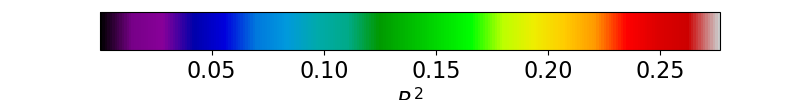

Started server on port 58524
Note: eccentricity plot has vmax set at 0.95 quantile


<IPython.core.display.Javascript object>


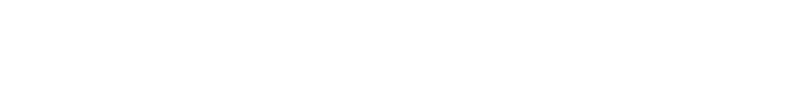

Started server on port 24274


/Users/marcoaqil/pycortex/cortex/dataset/views.py:207: UserWarning: Trying to register the cmap 'hsvx2' which already exists.
  cm.register_cmap(self.cmap,cmap)


<IPython.core.display.Javascript object>


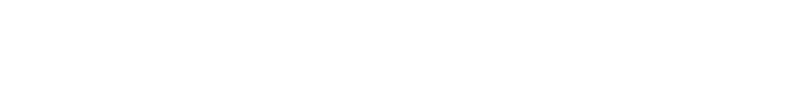

<IPython.core.display.Javascript object>


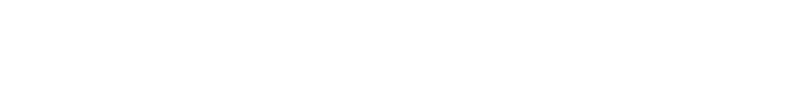

Started server on port 62470


<IPython.core.display.Javascript object>


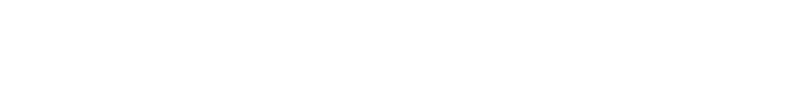

Started server on port 17825


<IPython.core.display.Javascript object>


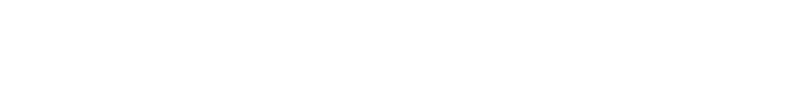

<IPython.core.display.Javascript object>


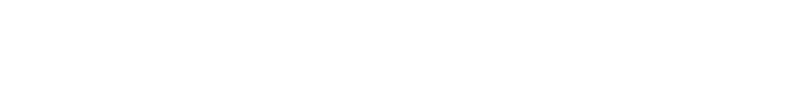

Started server on port 51313


<IPython.core.display.Javascript object>


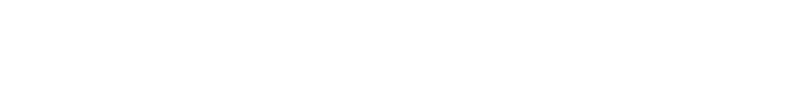

Started server on port 35889


<IPython.core.display.Javascript object>


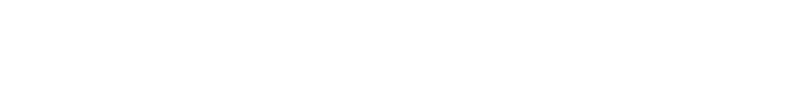

Started server on port 36244


<IPython.core.display.Javascript object>


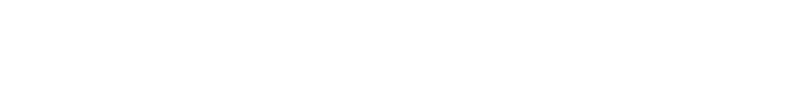

<IPython.core.display.Javascript object>


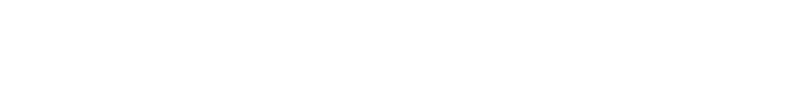

<IPython.core.display.Javascript object>


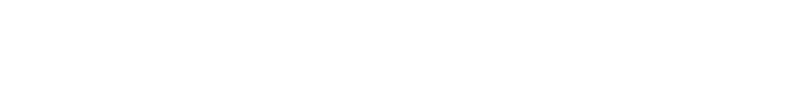

Started server on port 26127
-----


In [111]:
%matplotlib notebook
#visualize subject-specific ROIs and timeseries stats
#output FS-format polar angle and eccentricity maps for freeview ROI plotting
vis_res.output_freesurfer_maps = False
#compare t1w and surface fitting rsq and polar angle maps
vis_res.compare_volume_surface = False

vis_res.plot_rois_cortex = False
vis_res.plot_stats_cortex = False
vis_res.plot_rsq_cortex = True
vis_res.plot_ecc_cortex = True
vis_res.plot_polar_cortex = True
vis_res.plot_size_cortex = True
vis_res.plot_amp_cortex = True
vis_res.plot_css_exp_cortex = False
vis_res.plot_surround_size_cortex = True
vis_res.plot_suppression_index_cortex = False
vis_res.plot_norm_baselines_cortex = True
vis_res.plot_size_ratio_cortex = True
vis_res.plot_receptors_cortex = False
#set these to None if not wanted. 
vis_res.plot_correlations_per_roi = None#{'x_params_topl':['Norm Param. B'], 'y_params_topl':['Receptor Maps'],
                                    # 'x_params_lowl':['Norm_abcd'], 'y_params_lowl':['GABA'],
                                    # 'atlas':'glasser'} #glasser, HCPQ1Q6, custom
#note there is no quantile exclusion here, so the means may suffer from extreme values. just a visualization tool; use the quant_plots if want to be sure
vis_res.plot_means_per_roi = None# {'y_params_topl':['Norm Param. B','Norm Param. D','Size ratio (sigma_2/sigma_1)'], 
                                 #   'y_params_lowl':['Norm_abcd'], 
                                 #    'atlas':'glasser'} #glasser, HCPQ1Q6, custom

rsq_thresh = 0.0
rsq_max_opacity = 0.1#rsq_thresh+1e-6
#change to 'all' to plot whole brain. string single ROI for single ROI
rois = 'Brain'#['custom.hV4']#'all'#['custom.hV4']#'['custom.hV4']#'all'#['custom.hV4']#'all'#['custom.V1', 'custom.V2', 'custom.V3']
space_names ='fsaverage'# 'fsnative'#'fsaverage'#'HCP'#
analysis_names = 'fit-task-all_fit-runs-all'#'fit-task-BAR_fit-runs-CVmedian'#'fit-task-2R_fit-runs-all'#'fit-task-4R_fit-runs-all'# #'Mean analysis'#
subject_ids = ['fsaverage']#['fsaverage_hcp1sthalf','fsaverage_hcp2ndhalf']#['sub-006']##'all'#['sub-001']

threshold_li = 7#filters.threshold_li(vis_res.main_dict[space_names][analysis_names][subject_ids[0]]['Processed Results']['#Subjects with CVRSq>0']['Norm_abcd'])

vis_res.set_alpha(only_models=['Norm_abcd'], ecc_min=0.0, ecc_max=8.0, min_number_sjs=threshold_li)

vis_res.pycortex_plots(rois, rsq_thresh, space_names, analysis_names, subject_ids, rsq_max_opacity = rsq_max_opacity, pycortex_cmap = 'nipy_spectral',#'Jet_2D_alpha', #'nipy_spectral_2D_alpha' #Jet_2D_alpha                    
                       #specify this path to save colormap pDFs
                       #pycortex_image_path = '/Volumes/Crucial X8/PRFMapping/Figures/pyc_surface_maps',
                       timecourse_folder = '/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/timecourses',#'/Volumes/Crucial X8/PRFMapping/PRFMapping-Deriv-hires/prfpy/FS7_results/timecourses',#'/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/timecourses',##'
                       screenshot_paths = ['/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/HCP_data/7T_RETBAR_small.hdf5'])
                                            #'/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/HCP_data/7T_RETBAR_small.hdf5'
                                            #'/Volumes/Crucial X8/PRFMapping/PRFMapping-Deriv-hires/prfpy/FS7_results/timecourses/task-2R_screenshots'

In [42]:
vis_res.js_handle_dict[space_names][analysis_names][subject_ids[0]].keys()

dict_keys(['rsq', 'ecc', 'polar', 'size', 'amp', 'surround_size', 'norm_baselines', 'size_ratio', 'receptors'])

In [53]:
save_views=True
subj = subject_ids[0]
if save_views:
    #capture pycortex views
    #sub-006 camera coords 179 109 259 /// sub-007 183 126 250

    param_to_save = 'receptors'
    rec = '5-HT1B'
    js_handle_to_save = vis_res.js_handle_dict[space_names][analysis_names][subj][param_to_save]
    #js_handle_to_save._capture_view()
        
    base_str = f"{subj}_{param_to_save}_{rec}"#'_Norm-Neural baseline (B)'
    
    # views = dict(dorsal=dict(radius=191, altitude=73, azimuth=178, pivot=0),
    #              medial=dict(radius=10, altitude=101, azimuth=359, pivot=167),
    #              lateral=dict(radius=277, altitude=90, azimuth=177, pivot=123),
    #              ventral=dict(radius=221, altitude=131, azimuth=175, pivot=0)
    #                     )
    
    if subj == 'sub-007':
        views = dict(occipital=dict(azimuth=183, altitude=126, radius=250, pivot=0))
    elif subj == 'sub-006':
        views = dict(occipital=dict(azimuth=179, altitude=109, radius=259, pivot=0))
        
    views = dict(flat=dict(pivot=180, radius=150, azimuth=180, altitude=0.1, target=[0,-100,0], 
                                  specularity=0))

    vis_res.save_pycortex_views(js_handle_to_save, base_str, views, image_path = vis_res.pycortex_image_path)
        

{'surface.{subject}.pivot': [180], 'camera.radius': [150], 'camera.azimuth': [180], 'camera.altitude': [0.1], 'camera.target': [0, -100, 0], 'surface.{subject}.specularity': [0], 'surface.{subject}.unfold': [1]}


<IPython.core.display.Javascript object>


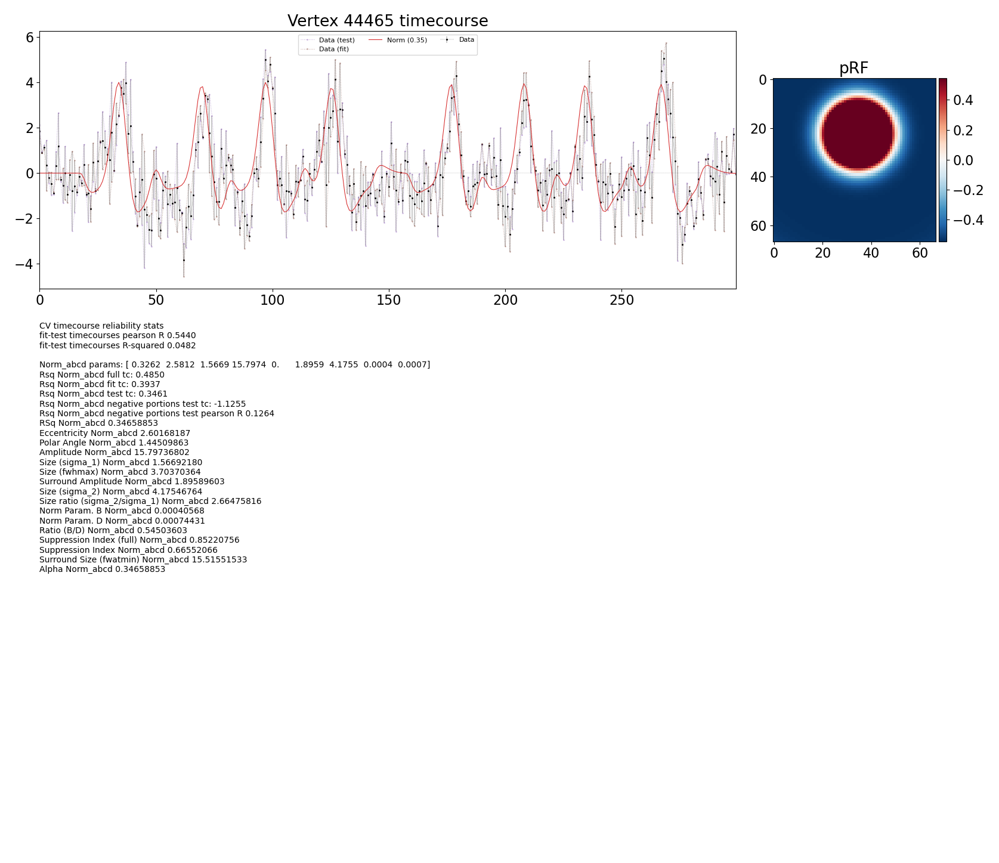

In [32]:
vis_res.f

# 1D quantitative plots

In [54]:
%%capture capt
pl.close('all')
display(HTML("<style>div.output_scroll { height: 50em; }</style>"))
#generalized quantitative parameter plots
#'Eccentricity'#'Suppression Index (full)'#'Suppression Index#'Size (fwhmax)'#'Surround Size (fwatmin)'
#'Norm Param. B'#''Ratio (B/D)'#'Norm Param. D'#'RSq'#'CCrsq_task-1R'#'CSS Exponent'#'Amplitude'
#'Surround Amplitude'#'Size (sigma_1)'##'Size (sigma_2)'
#'Size ratio (sigma_2/sigma_1)'#C/A#'B/A'#'D/C'#'D/A'#'B/C'#'Surround volume (full)'#'Centre volume (full)'
#'(A+B)/(C+D)'#'(A*B)/(C*D)'#'(A*D)/(C*B)'#'(A+D)/(C+B)'#'Point-stim derivative'#'(C(A+B))/(A(C+D))'
#'Min/Max Response Ratio'#'Max/Min Response Ratio'#'A(C+D)/C(A+B)'##Min/Max Response Ratio (with BD)'#'A/C'
#D/B#D*sigma_2/sigma_1#(D*sigma_2)/(B*sigma_1)#'(AD-BC)/D**2 (deriv at 0)'#(Cs_2**2+D)/(As_1**2+B)
#(B*sigma_1)/(D*sigma_2)##B/D**2#'B/sqrt(D)'#'B(1/(Cpis_2**2+D)-1/D)'
####DoG
#'Surround volume (full)'#'Surround/Centre Amplitude' #'Surround-Centre Amplitude'#'Surround-Centre Volume'
#'Timecourse Neg/Pos Area Ratio'
#['GABA_A','5-HTT', '5-HT2A', '5-HT1A', '5-HT1B', '5-HT4']


#'custom.V1', 'custom.V2', 'custom.V3','custom.V3AB','custom.hV4','custom.LO','custom.TO','custom.VO','custom.IPS'
#combined all_custom Brain
#rois = ['custom.V1', 'custom.V2', 'custom.V3','custom.V3AB','custom.hV4','custom.LO','custom.TO','custom.IPS','all_custom']
rois = [roi for roi in vis_res.idx_rois['fsaverage'] if 'glasser' in roi]#[-20:]#['V1','V2', 'V3','V3AB','hV4','LO','TO','VO','IPS'] #fsaverage
#rois = [ 'V1', 'V2', 'V3', 'hV4', 'VO1', 'VO2', 'PHC1', 'PHC2', 'LO1', 'LO2', 'TO1', 'TO2', 'V3A', 'V3B', 'IPS0', 'IPS1', 'IPS2', 'IPS3', 'IPS4', 'IPS5', 'SPL1', 'FEF']
# rois = ['glasser_V1','glasser_V2','glasser_V3','glasser_V4','glasser_V3A','glasser_V7','glasser_V3B','glasser_V3CD',
# 'glasser_LO1','glasser_LO2','glasser_PIT','glasser_V8','glasser_VMV3',
# 'glasser_IPS1','glasser_IP0','glasser_PGp','glasser_LO3','glasser_MT','glasser_V4t','glasser_FFC','combined']
#rois = ['V1','V2', 'V3','V3AB','hV4','LO','TO','VO','IPS','combined']
#rois = ['all_custom']
#rois = ['HCPQ1Q6.V1', 'HCPQ1Q6.V2', 'HCPQ1Q6.V3', 'HCPQ1Q6.V3AB',
#        'HCPQ1Q6.LO', 'HCPQ1Q6.V7','HCPQ1Q6.TO',
#        'HCPQ1Q6.IPS1']
#rois.append('combined')

rsq_thresh = 0.0 #0.3
save_figures = True
figure_path = f"/Volumes/Crucial X8/PRFMapping/Figures/glasser_ecc65_CVrsqmean_li_legend"

#set to 'all' to plot all analyses
space_names = 'fsaverage'
analysis_names = 'fit-task-BAR_fit-runs-all'#'all'#, -CVmedian
subject_ids = ['fsaverage_cvrsq']#['fsaverage']#['sub-001','sub-002','sub-006']#

threshold_li = filters.threshold_li(vis_res.main_dict[space_names][analysis_names][subject_ids[0]]['Processed Results']['#Subjects with CVRSq>0']['Norm_abcd'])

vis_res.set_alpha(only_models=['Norm_abcd'], ecc_min=0.0, ecc_max=8.0, min_number_sjs=threshold_li)

ylim={}
xlim={}

#set model/roi specific x-y limitd

#ylim = {'Mean':(1.5,14), 'Norm_abcd':(1.5,14), 'Gauss':(1.5,14), 'CSS':(1.5,14), 'DoG':(1.5,14)}
#xlim = {'Gauss':(0,4.5), 'DoG':(0,4.5), 'CSS':(0,4.5), 'Norm_abcd':(0,4.5)}
#dog rsq
#ylim = {'Norm_abcd':(-5,310)}
#xlim = {'Norm_abcd':(-0.005,0.155)}
#dog tcsi
#xlim = {'Norm_abcd':(-0.02,1.33)}
#for r in rois:
    #xlim[r] = xlim['Norm_abcd']
    #ylim[r] = ylim['Norm_abcd']
    #size ratio
#xlim = {'Norm_abcd':(-0.02,0.8)}
#ylim = {'Norm_abcd':(2,11)}

#         if r in ['custom.V1', 'custom.V2', 'custom.V3']:
#             ylim[r] = (1.5,14)
#         elif r in ['custom.V3AB', 'custom.hV4', 'custom.LO']:
#             ylim[r] = (1.5,14)
#         else:
#             ylim[r] = (1.5,14)

for x_parameter in ['5-HT1A', 'GABA_A']: #'5-HT1B', '5-HT2A']:#
    for y_parameter in ['Norm Param. B']:#'Norm Param. D']:#@
        
#         ylim = {'Norm_abcd':(-2,92)}
#         if x_parameter == 'GABA_A':
#             xlim = {'Norm_abcd':(760,1080)}
#         else:
#             xlim = {'Norm_abcd':(11,50)}
               
        #bin_by: 'size' (x-param bins have the same number of vertices) or 'space' (x-param bins are approx equally spaced) space is useful for clustered parameters)
        vis_res.quant_plots(x_parameter, y_parameter, rois, rsq_thresh, save_figures, figure_path,
                                        space_names, analysis_names, subject_ids,
                                        x_parameter_toplevel='Receptor Maps',  #y_parameter_toplevel='Receptor Maps',                                      
                                        diff_gauss=False, diff_gauss_x=False, 
                                        log_yaxis=False, log_xaxis = False, nr_bins = 1, bin_by='size', rsq_weights=True,
                                        scatter=False, violin=False, stats_on_plot=False, zconfint_err_alpha=None,
                                        xlim=xlim, ylim=ylim, zscore_xdata=False, zscore_ydata=False, 
                                         means_only=False, 
                                        rois_on_plot = True, rsq_alpha_plot = True,
                                        fit = False, exp_fit = False, show_legend = False, 
                                        each_subj_on_group=True, bold_voxel_volume=4.096,
                                        quantile_exclusion=0.999)#, x_param_model='DoG')

for x_parameter in ['5-HT1B', '5-HT2A']:#
    for y_parameter in ['Norm Param. D']:#@
#         ylim = {'Norm_abcd':(6,39)}
#         if x_parameter == '5-HT1B':
#             xlim = {'Norm_abcd':(12,31)}
#         else:
#             xlim = {'Norm_abcd':(40,68)}    
            
        #bin_by: 'size' (x-param bins have the same number of vertices) or 'space' (x-param bins are approx equally spaced) space is useful for clustered parameters)
        vis_res.quant_plots(x_parameter, y_parameter, rois, rsq_thresh, save_figures, figure_path,
                                        space_names, analysis_names, subject_ids,
                                        x_parameter_toplevel='Receptor Maps',  #y_parameter_toplevel='Receptor Maps',                                      
                                        diff_gauss=False, diff_gauss_x=False, 
                                        log_yaxis=False, log_xaxis = False, nr_bins = 1, bin_by='size', rsq_weights=True,
                                        scatter=False, violin=False, stats_on_plot=False, zconfint_err_alpha=None,
                                        xlim=xlim, ylim=ylim, zscore_xdata=False, zscore_ydata=False, 
                                         means_only=False, 
                                        rois_on_plot = True, rsq_alpha_plot = True,
                                        fit = False, exp_fit = False, show_legend = False, 
                                        each_subj_on_group=True, bold_voxel_volume=4.096,
                                        quantile_exclusion=0.999)#, x_param_model='DoG')

os.system(f"open {sound_file}")


# Multidimensional analyses

## OLS

HCP fit-task-BAR_fit-runs-all 100610
HCP fit-task-BAR_fit-runs-all 102311
HCP fit-task-BAR_fit-runs-all 102816
HCP fit-task-BAR_fit-runs-all 104416
HCP fit-task-BAR_fit-runs-all 105923
HCP fit-task-BAR_fit-runs-all 108323
HCP fit-task-BAR_fit-runs-all 109123
HCP fit-task-BAR_fit-runs-all 111312
HCP fit-task-BAR_fit-runs-all 111514
HCP fit-task-BAR_fit-runs-all 114823
HCP fit-task-BAR_fit-runs-all 115017
HCP fit-task-BAR_fit-runs-all 115825
HCP fit-task-BAR_fit-runs-all 116726
HCP fit-task-BAR_fit-runs-all 118225
HCP fit-task-BAR_fit-runs-all 125525
HCP fit-task-BAR_fit-runs-all 126426
HCP fit-task-BAR_fit-runs-all 128935
HCP fit-task-BAR_fit-runs-all 130114
HCP fit-task-BAR_fit-runs-all 130518
HCP fit-task-BAR_fit-runs-all 131217
HCP fit-task-BAR_fit-runs-all 131722
HCP fit-task-BAR_fit-runs-all 132118
HCP fit-task-BAR_fit-runs-all 134627
HCP fit-task-BAR_fit-runs-all 134829
HCP fit-task-BAR_fit-runs-all 135124
HCP fit-task-BAR_fit-runs-all 137128
HCP fit-task-BAR_fit-runs-all 140117
H

fsaverage fit-task-BAR_fit-runs-all 249947
fsaverage fit-task-BAR_fit-runs-all 251833
fsaverage fit-task-BAR_fit-runs-all 257845
fsaverage fit-task-BAR_fit-runs-all 263436
fsaverage fit-task-BAR_fit-runs-all 283543
fsaverage fit-task-BAR_fit-runs-all 318637
fsaverage fit-task-BAR_fit-runs-all 320826
fsaverage fit-task-BAR_fit-runs-all 330324
fsaverage fit-task-BAR_fit-runs-all 346137
fsaverage fit-task-BAR_fit-runs-all 352738
fsaverage fit-task-BAR_fit-runs-all 360030
fsaverage fit-task-BAR_fit-runs-all 365343
fsaverage fit-task-BAR_fit-runs-all 380036
fsaverage fit-task-BAR_fit-runs-all 381038
fsaverage fit-task-BAR_fit-runs-all 385046
fsaverage fit-task-BAR_fit-runs-all 389357
fsaverage fit-task-BAR_fit-runs-all 393247
fsaverage fit-task-BAR_fit-runs-all 395756
fsaverage fit-task-BAR_fit-runs-all 397760
fsaverage fit-task-BAR_fit-runs-all 401422
fsaverage fit-task-BAR_fit-runs-all 406836
fsaverage fit-task-BAR_fit-runs-all 412528
fsaverage fit-task-BAR_fit-runs-all 429040
fsaverage f

Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimen

<IPython.core.display.Javascript object>


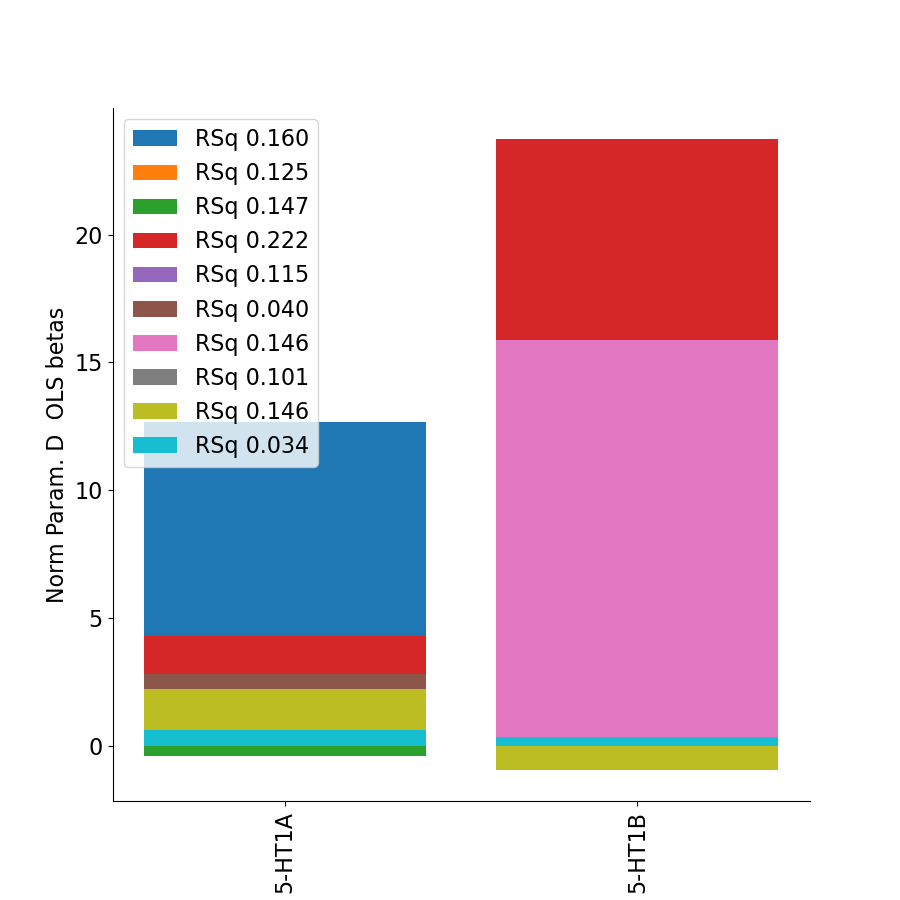

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_23c
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 264
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [ 9.1438 -0.0336]
wRSq 0.12197286111676398
wCC prediction 0.3492461325723796


<IPython.core.display.Javascript object>


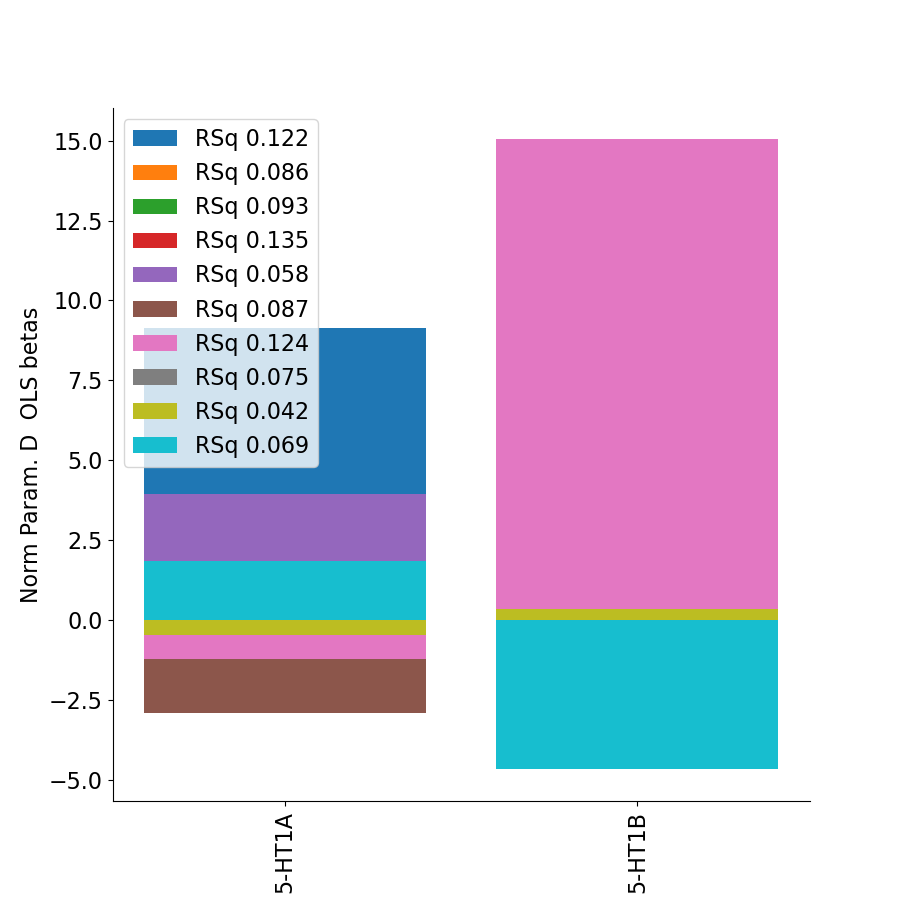

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_23d
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_24dd
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_24dv
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq gl

<IPython.core.display.Javascript object>


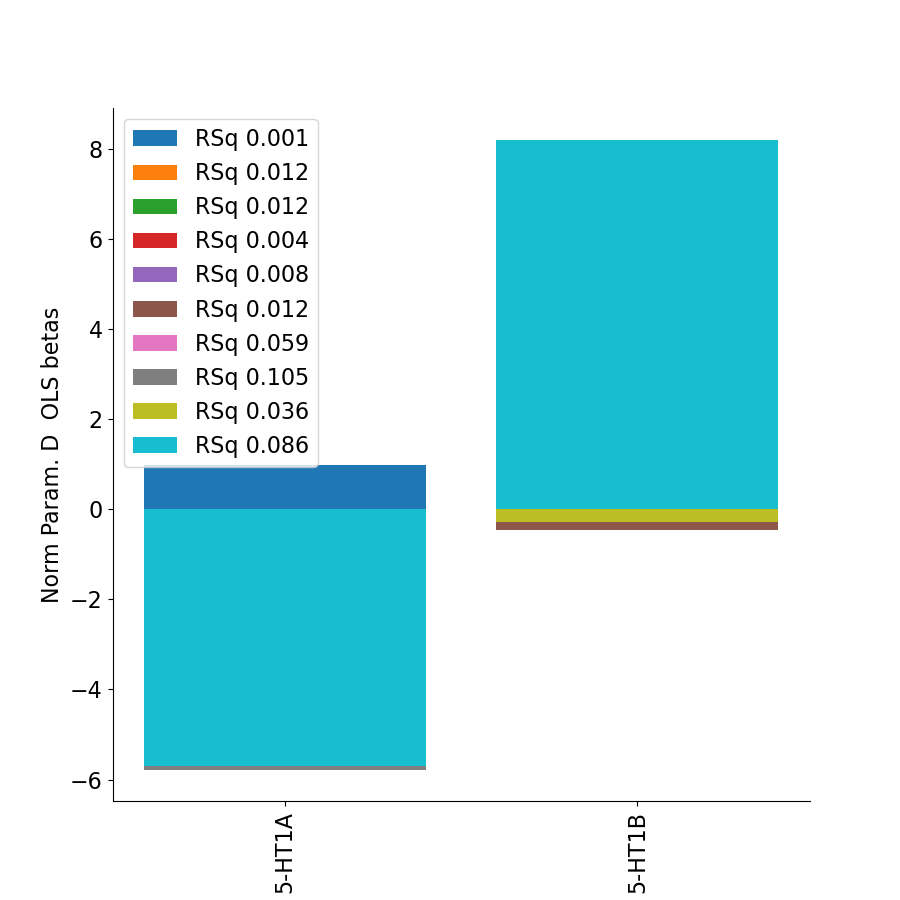

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_47l
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_47m
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_47s
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glas

<IPython.core.display.Javascript object>


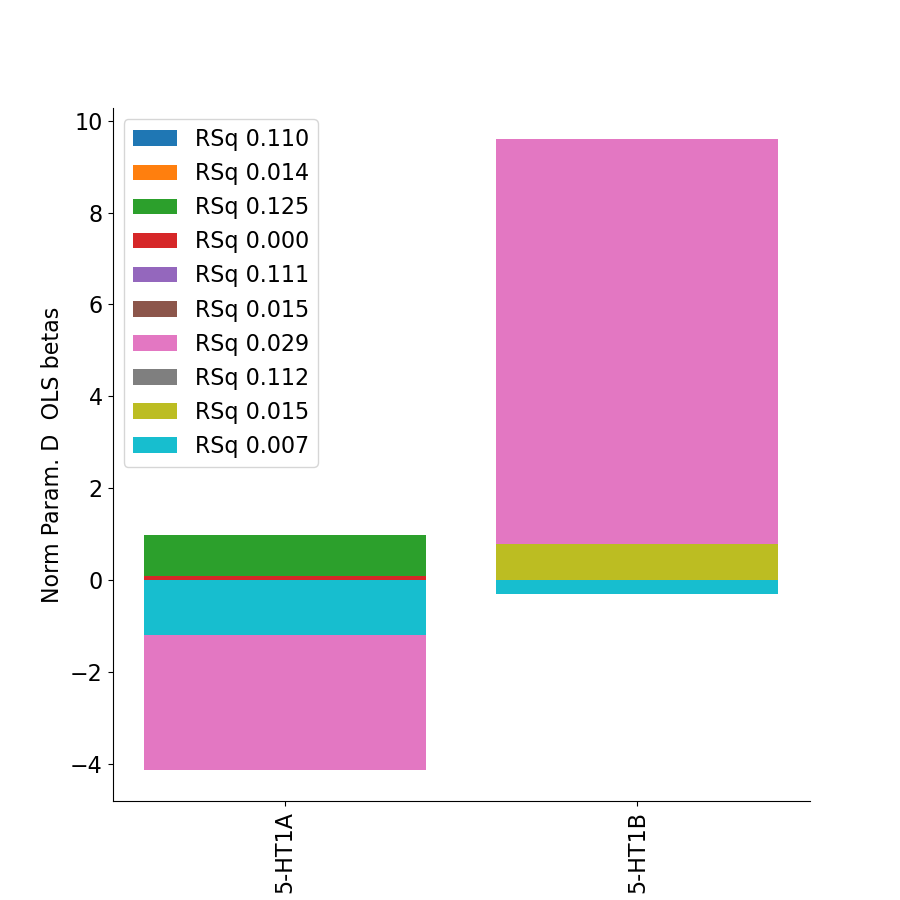

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_5m
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_5mv
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 370
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [6.653  0.0119]
wRSq 0.21412525999512355
wCC prediction 0.4627367069891078


<IPython.core.display.Javascript object>


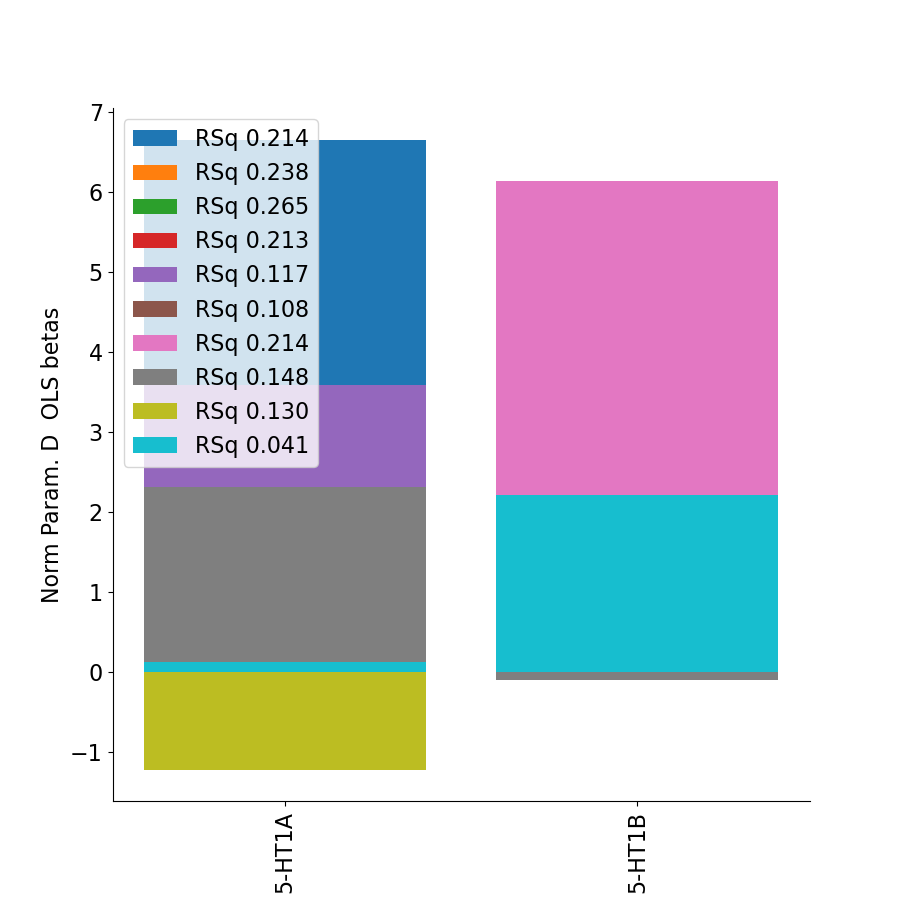

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_6a
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 2974
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [0.4768 0.0249]
wRSq 0.020199838032521344
wCC prediction 0.1421261342347756


<IPython.core.display.Javascript object>


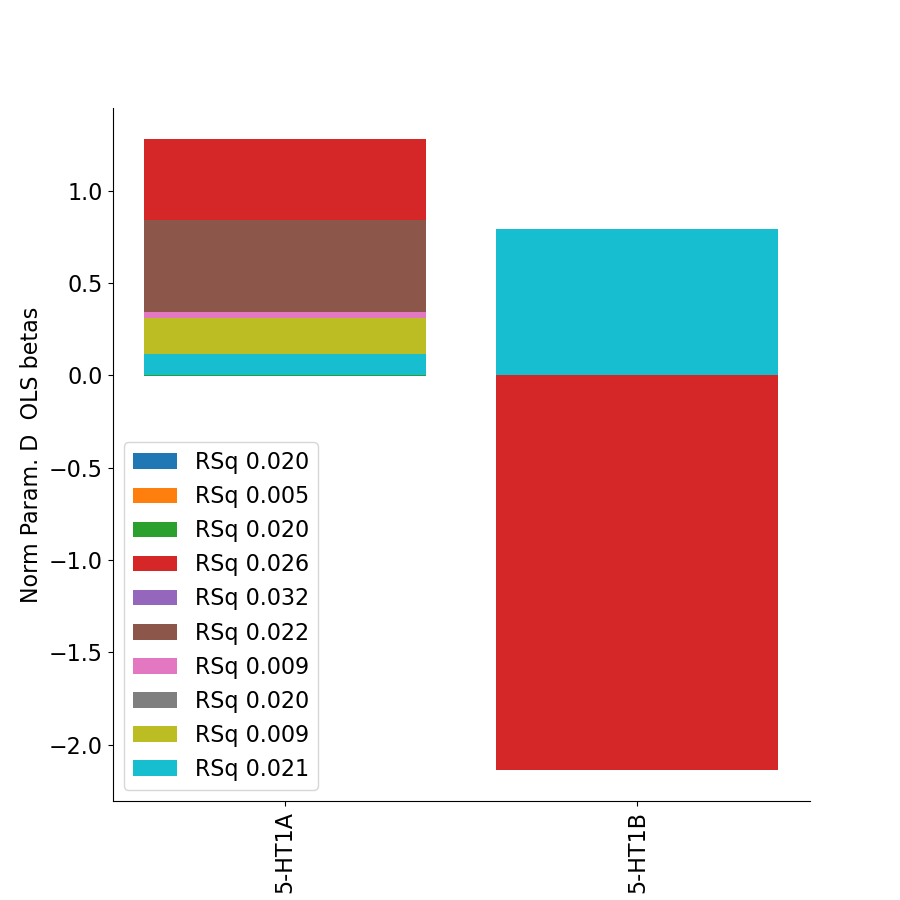

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_6d
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 153
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [31.5767 -0.116 ]
wRSq 0.27465005240965057
wCC prediction 0.5240706559326237


<IPython.core.display.Javascript object>


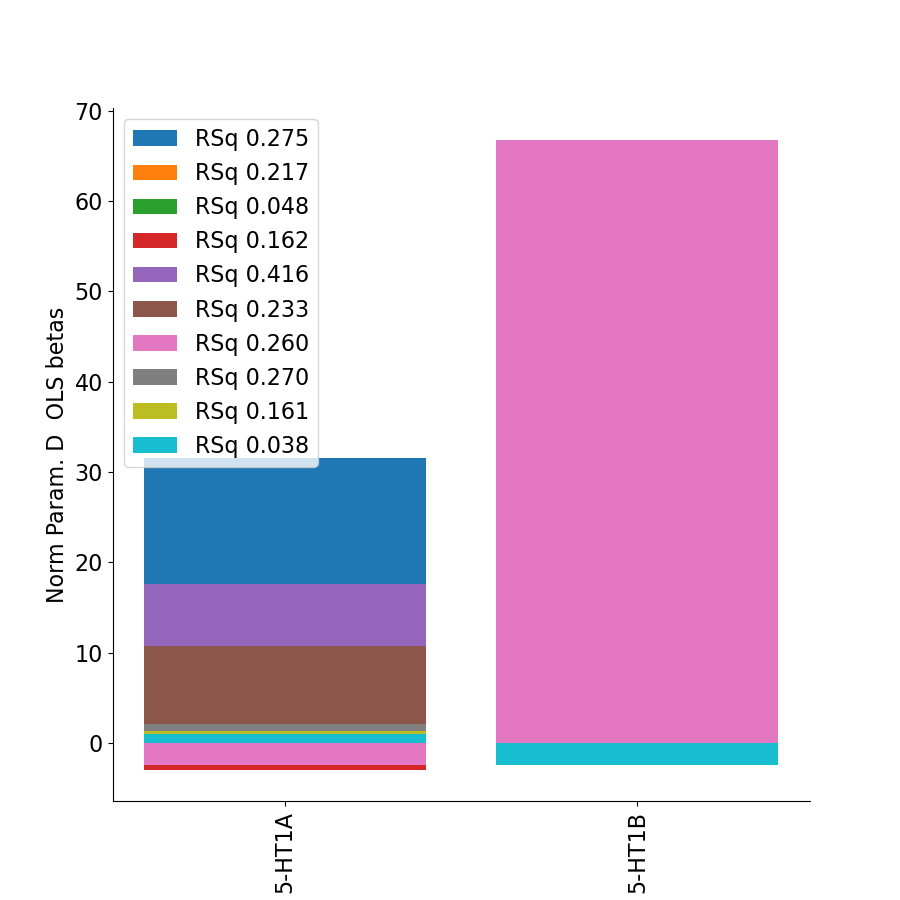

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_6ma
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 490
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-0.83    0.0531]
wRSq 0.036674765272377785
wCC prediction 0.19150656717819847


<IPython.core.display.Javascript object>


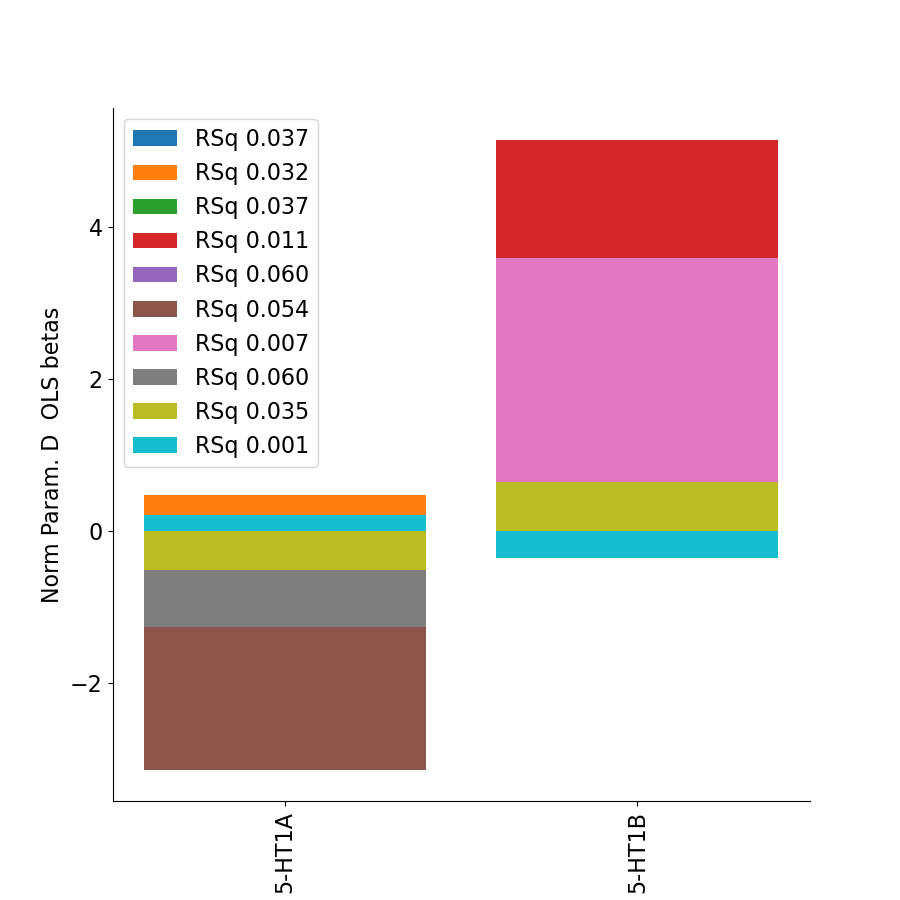

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_6mp
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 96
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [22.3974  0.1143]
wRSq 0.11990431685994962
wCC prediction 0.34627202725595574


<IPython.core.display.Javascript object>


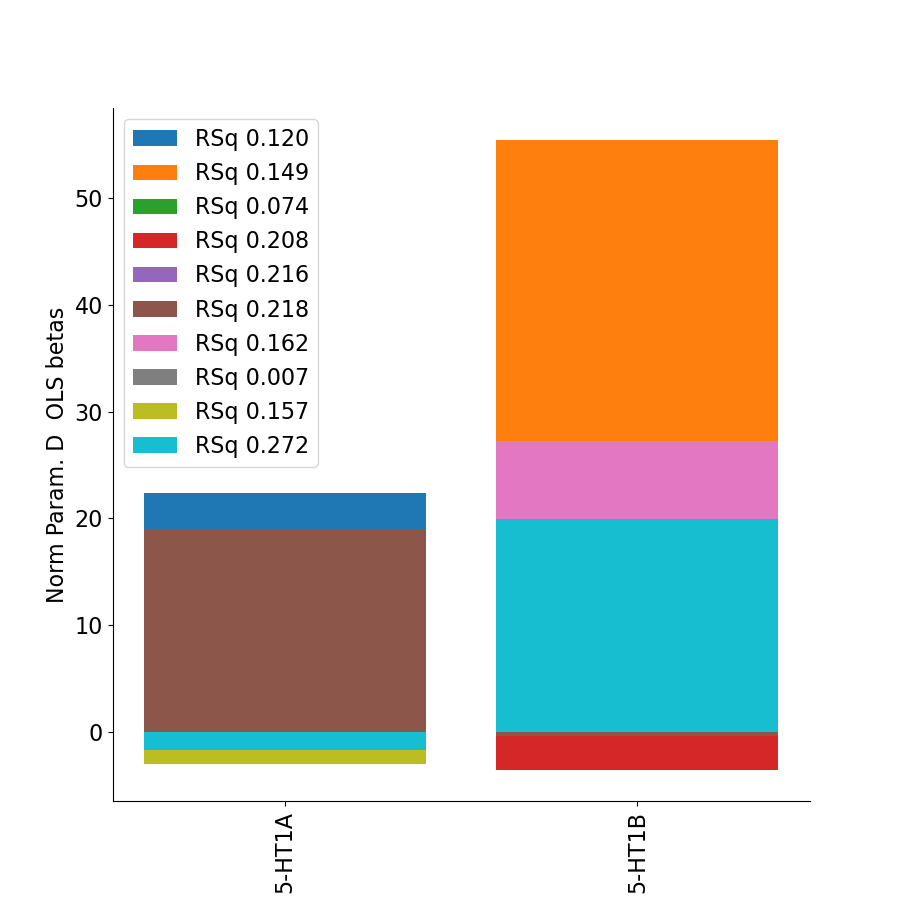

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_6r
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 612
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [ 7.0176 -0.0945]
wRSq 0.12425172445663513
wCC prediction 0.35249358073110343


<IPython.core.display.Javascript object>


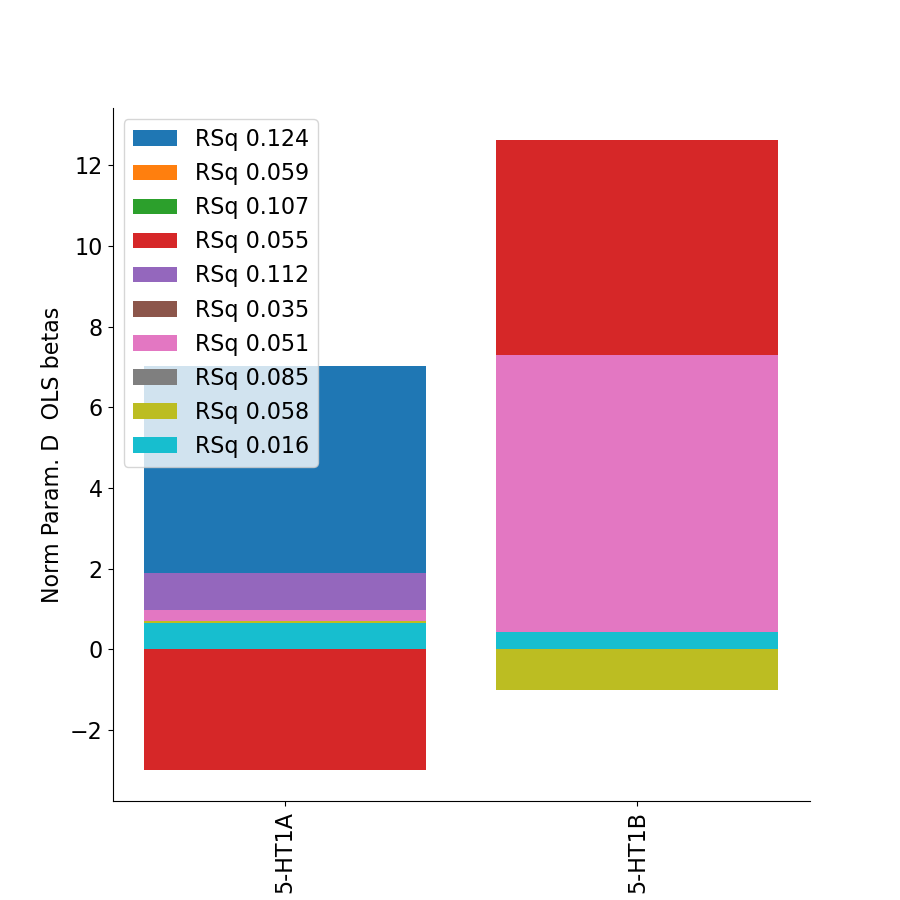

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_6v
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 459
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-0.8327 -0.079 ]
wRSq 0.08319284649809588
wCC prediction 0.2884317016177241


<IPython.core.display.Javascript object>


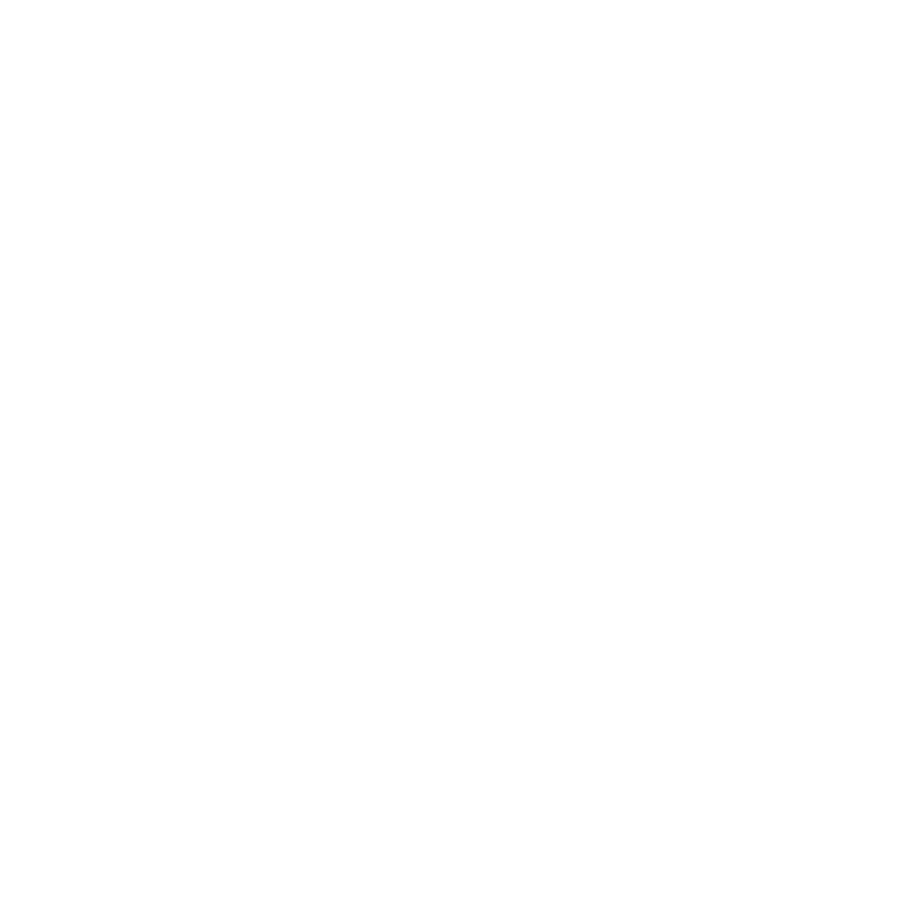

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_7AL
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 1214
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [ 4.0211 -0.0357]
wRSq 0.024721081883051332
wCC prediction 0.1572293925544815


<IPython.core.display.Javascript object>


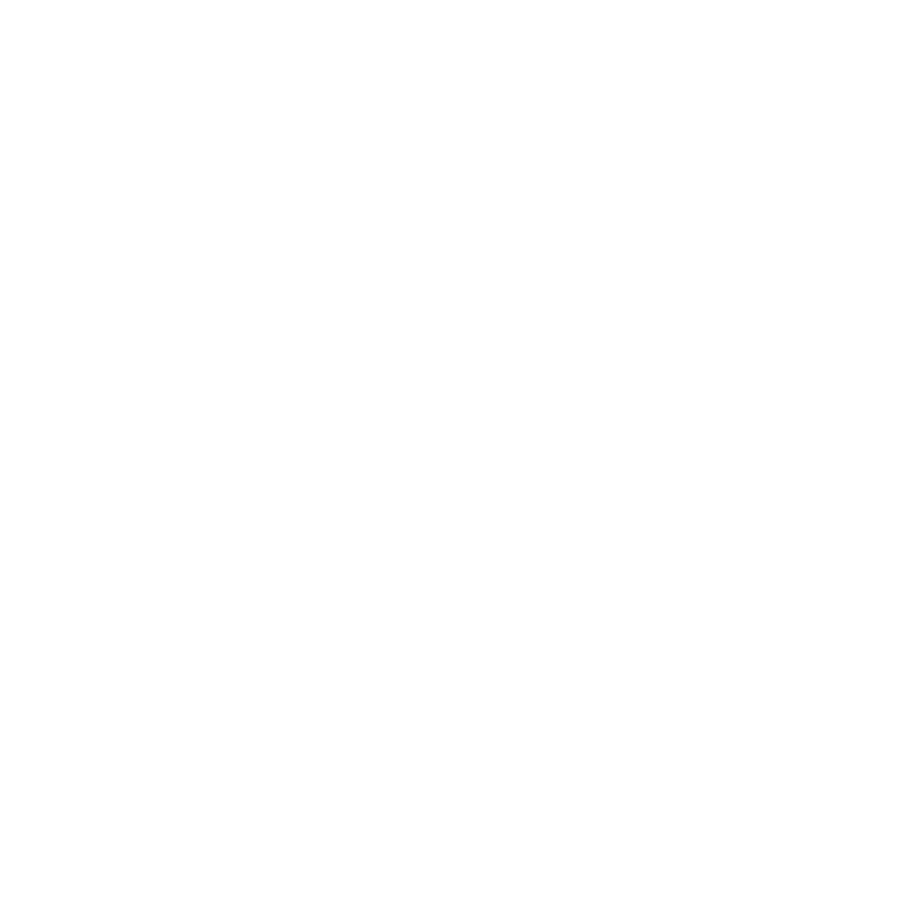

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_7Am
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 1679
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-3.6662  0.0427]
wRSq 0.029511938341873045
wCC prediction 0.17179039071459423


<IPython.core.display.Javascript object>


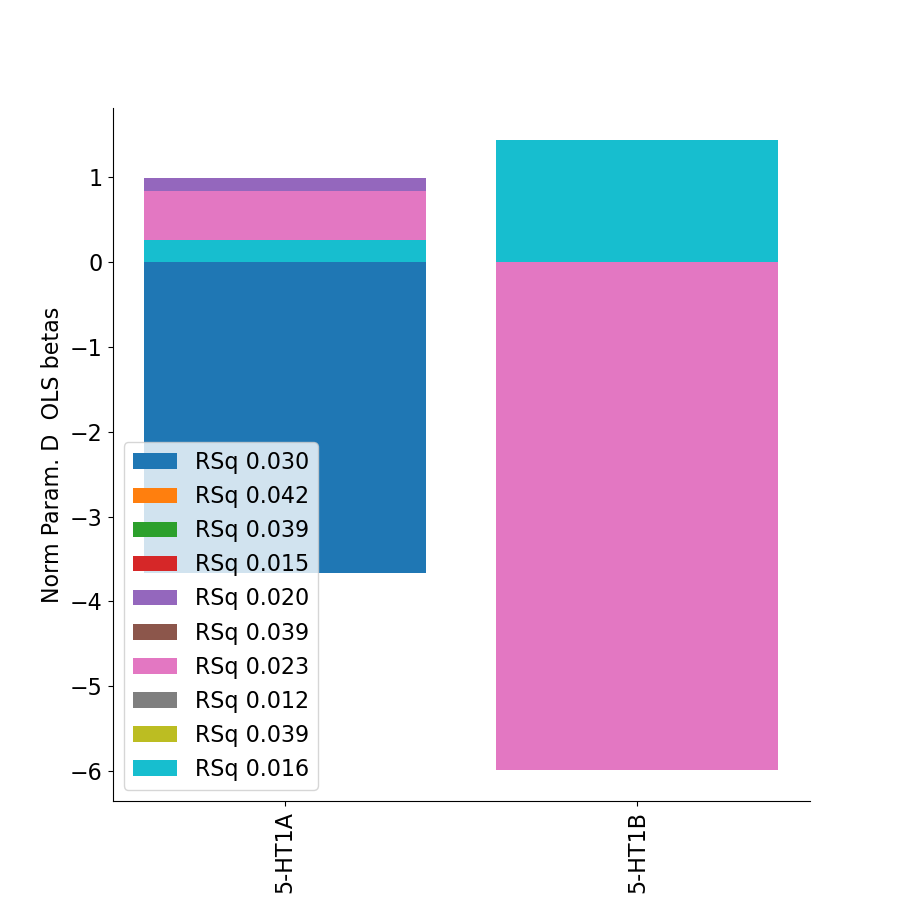

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_7m
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_7PC
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 1502
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [3.3344 0.0122]
wRSq 0.04440927343362577
wCC prediction 0.2107350787923691


<IPython.core.display.Javascript object>


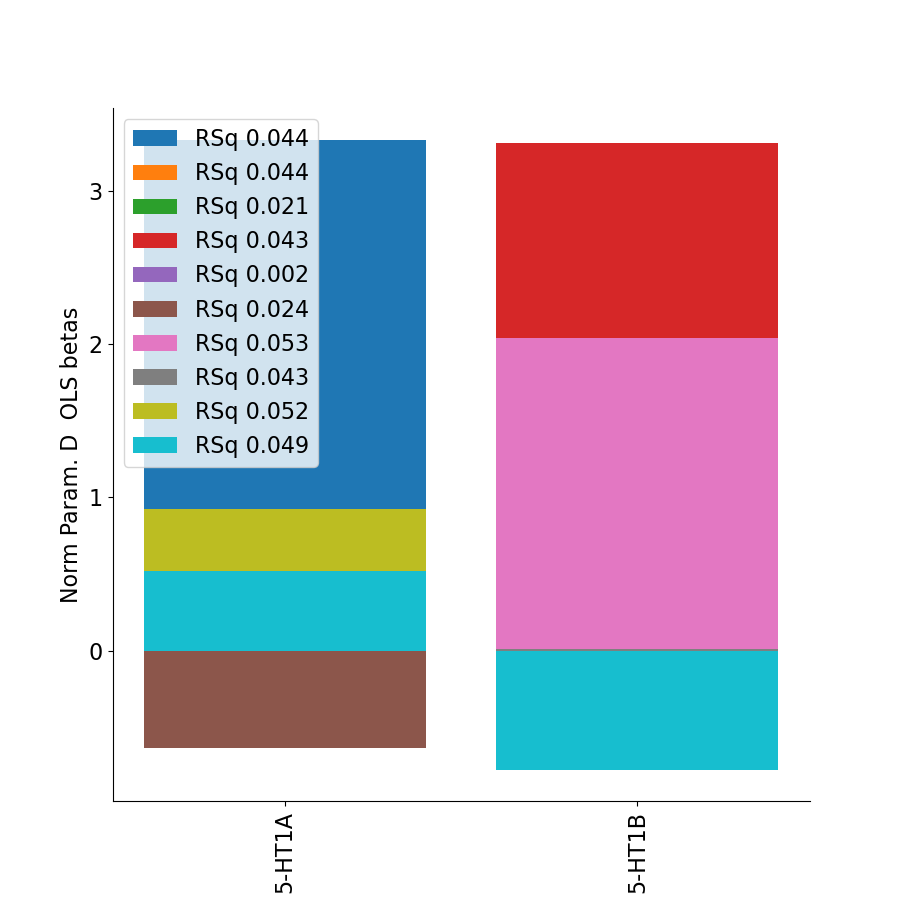

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_7PL
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 905
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [14.4167 -0.1186]
wRSq 0.06354473562929785
wCC prediction 0.2520808117039013


<IPython.core.display.Javascript object>


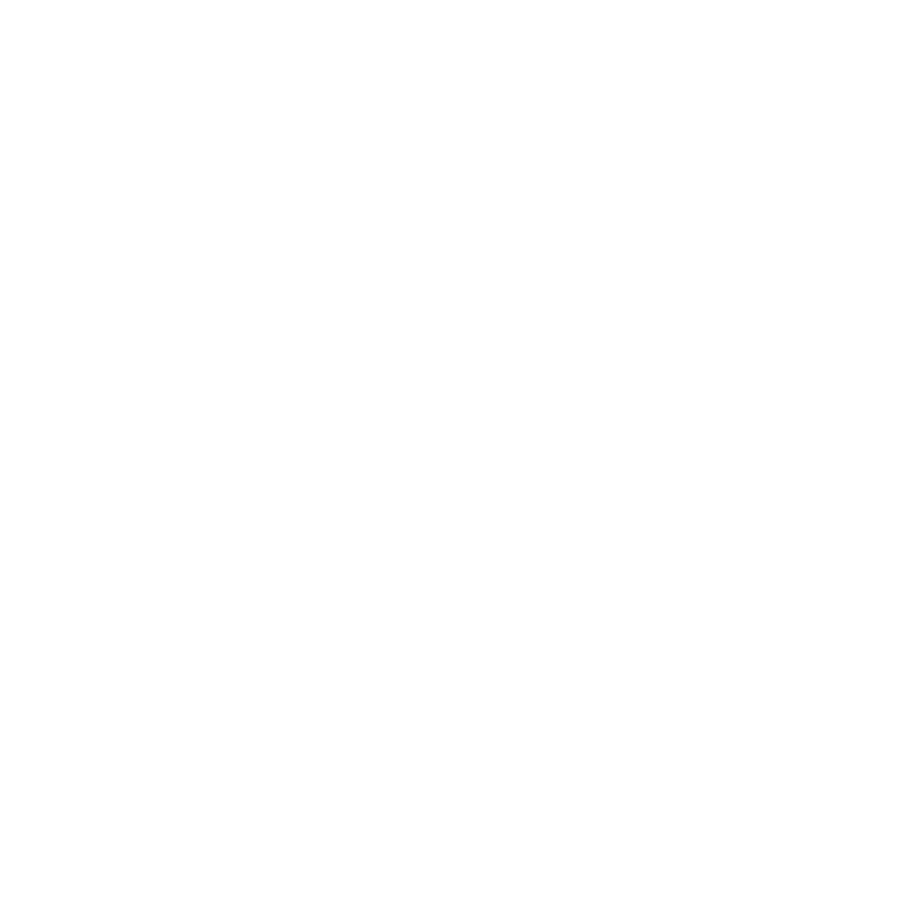

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_7Pm
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 200
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [4.0539 0.1075]
wRSq 0.06863334165918278
wCC prediction 0.2619796588653073


<IPython.core.display.Javascript object>


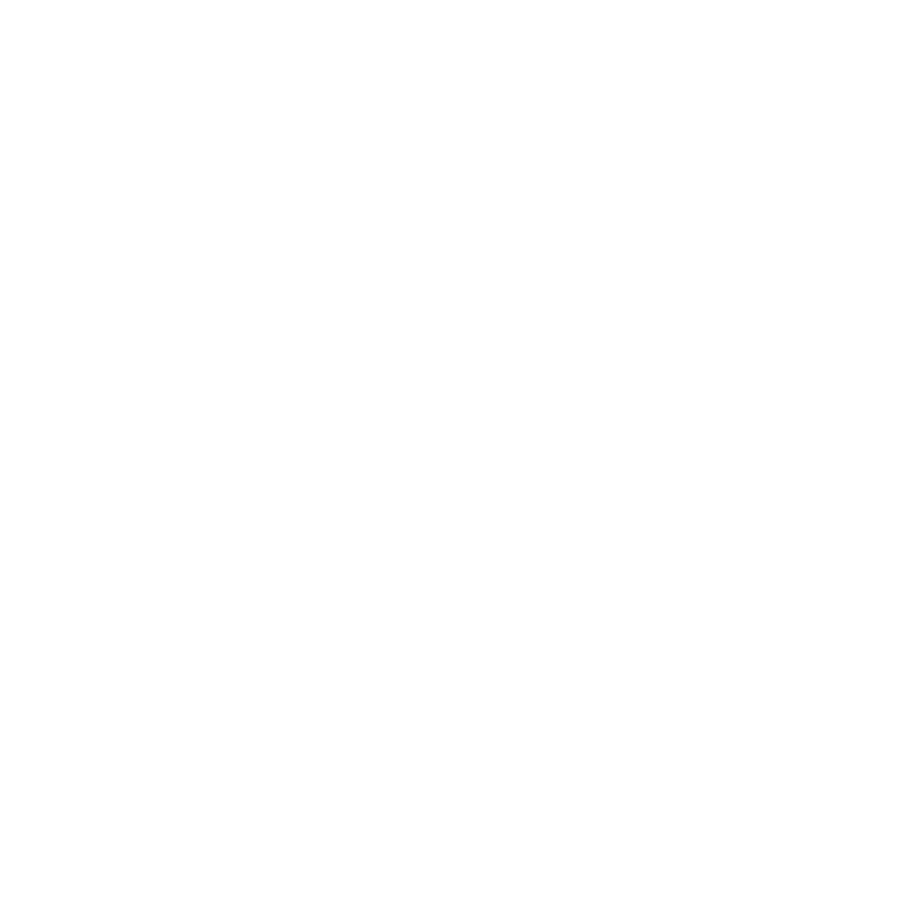

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_8Ad
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_8Av
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_8BL
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glas

<IPython.core.display.Javascript object>


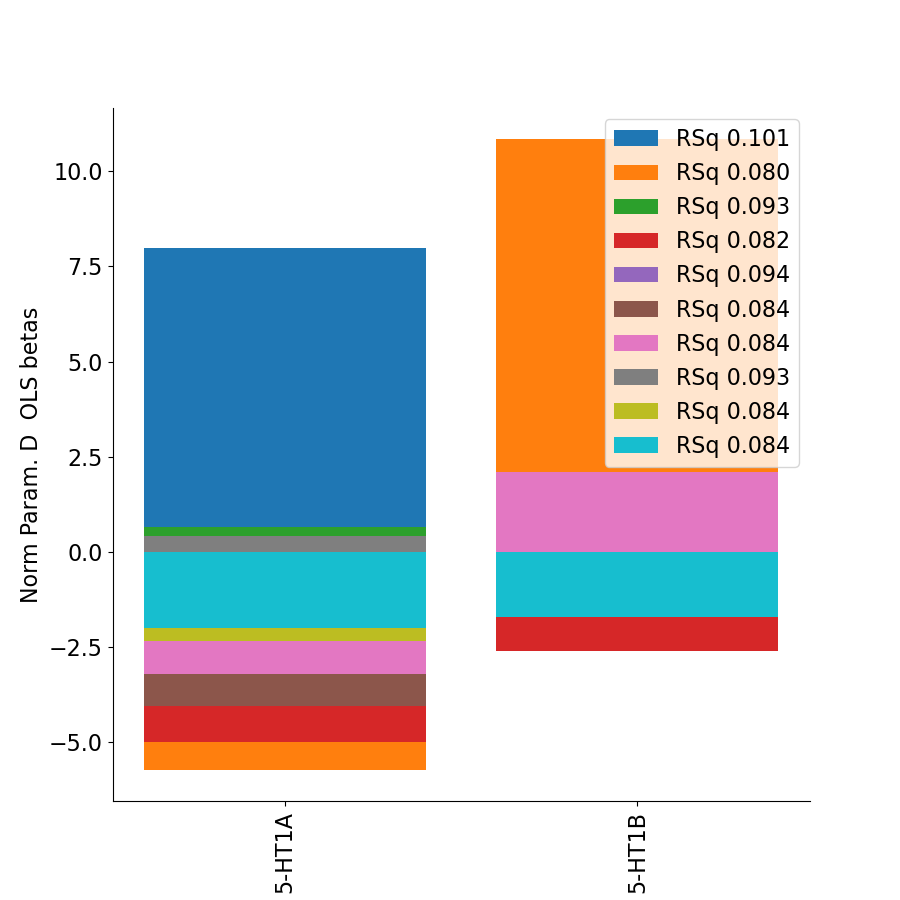

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_8C
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 8
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_9-46d
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 32
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [24.5723 -0.1655]
wRSq 0.21855159479639164
wCC prediction 0.4674950211460993


<IPython.core.display.Javascript object>


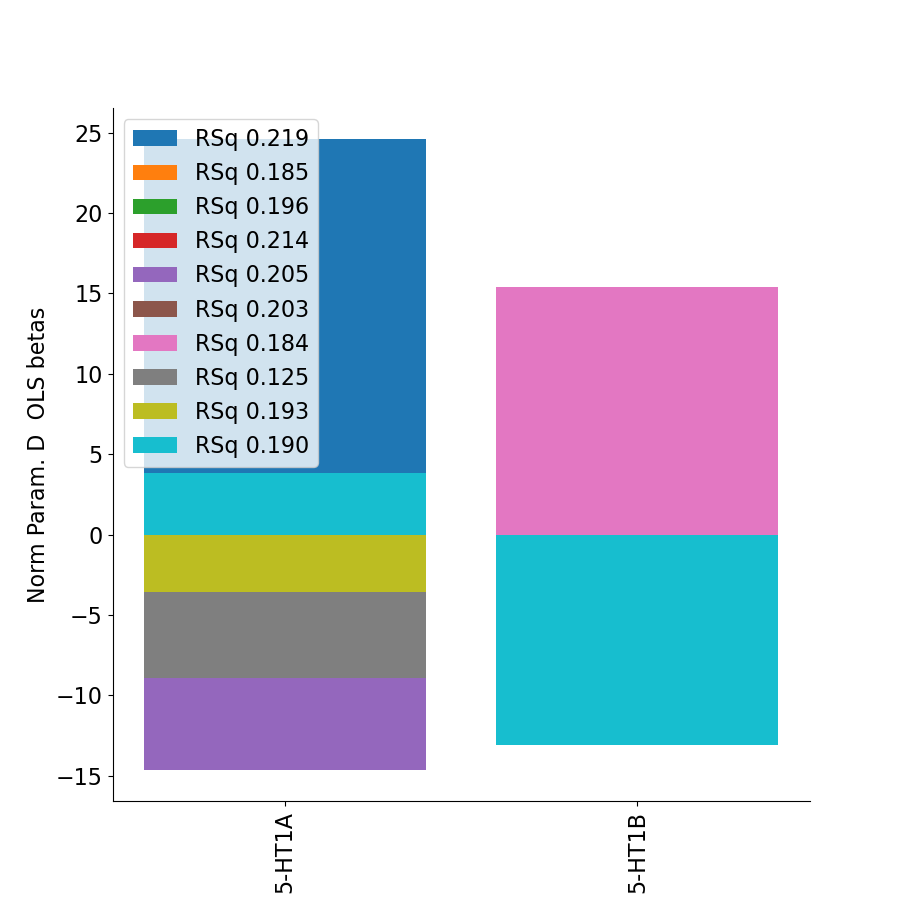

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_9a
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_9m
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_9p
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser

<IPython.core.display.Javascript object>


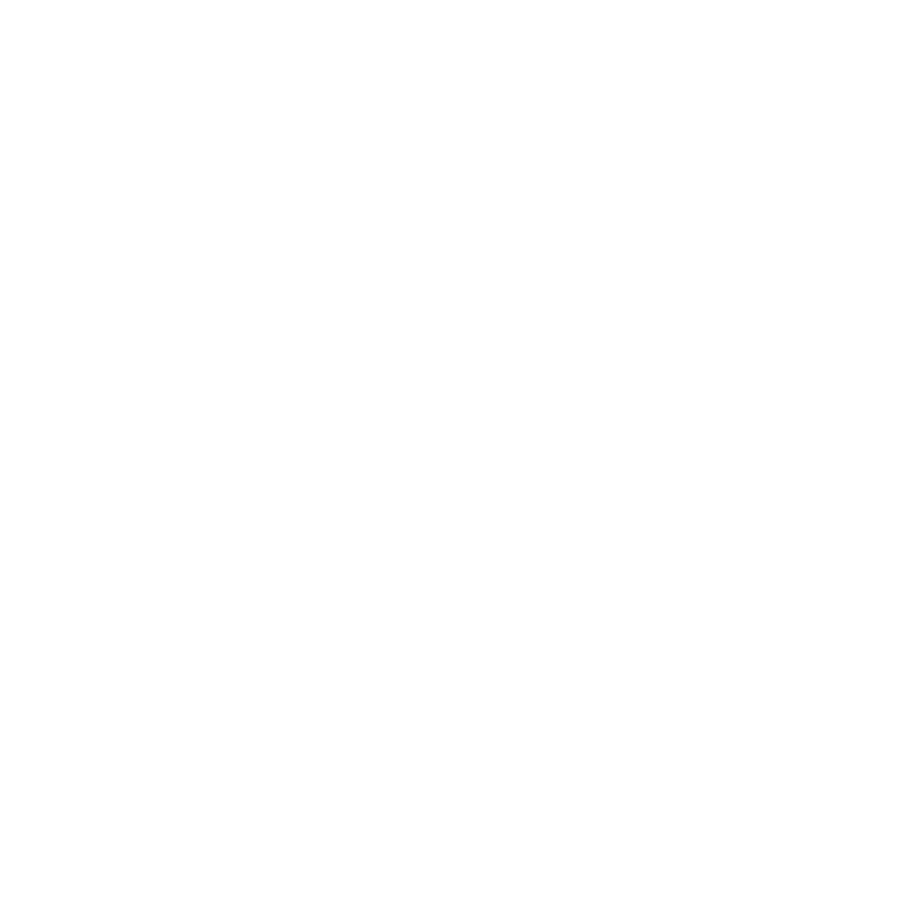

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_AVI
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 58
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [36.3448 -0.4572]
wRSq 0.13708624949577908
wCC prediction 0.3702516029617958


<IPython.core.display.Javascript object>


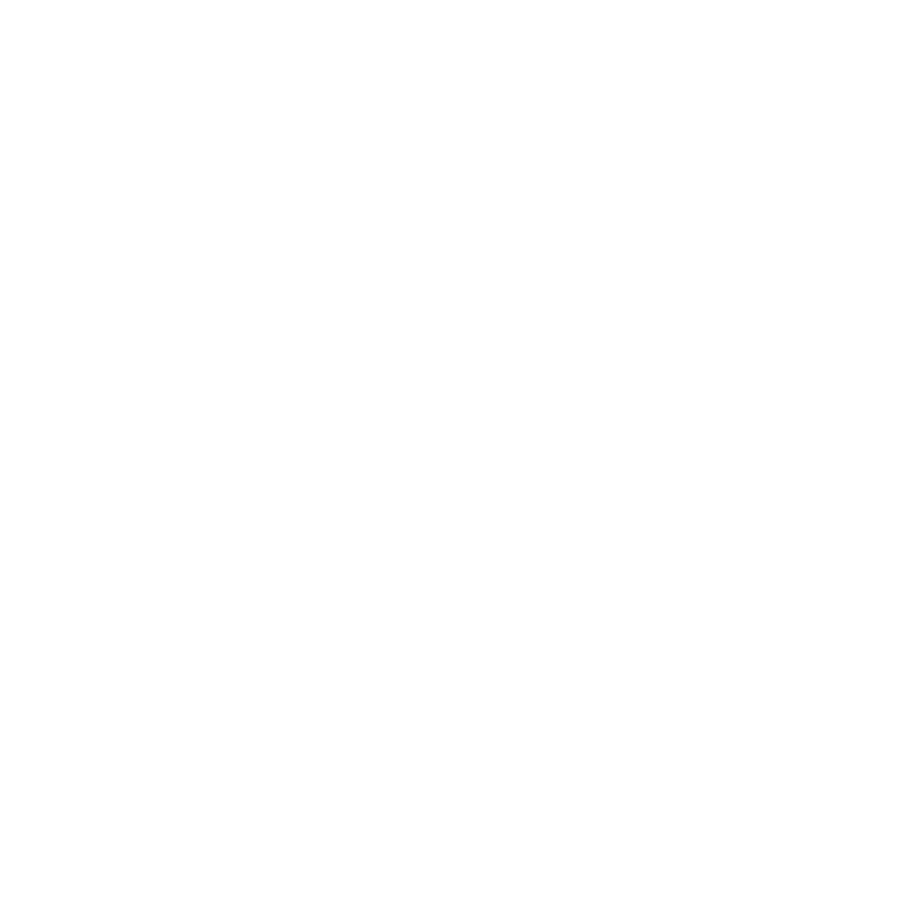

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_d23ab
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_d32
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_DVT
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 728
performing OLS (1D y)
Estimated OLS betas 

<IPython.core.display.Javascript object>


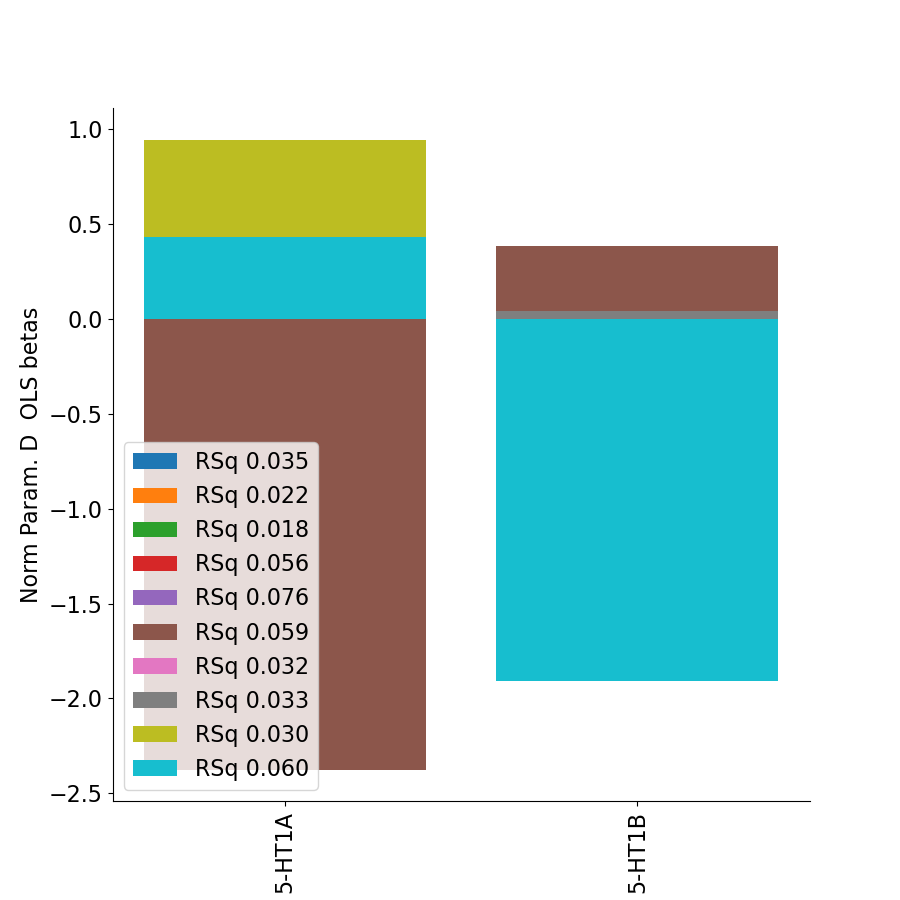

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_EC
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_FEF
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 1242
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [2.6018 0.0223]
wRSq 0.0203762537752451
wCC prediction 0.14274541595177445


<IPython.core.display.Javascript object>


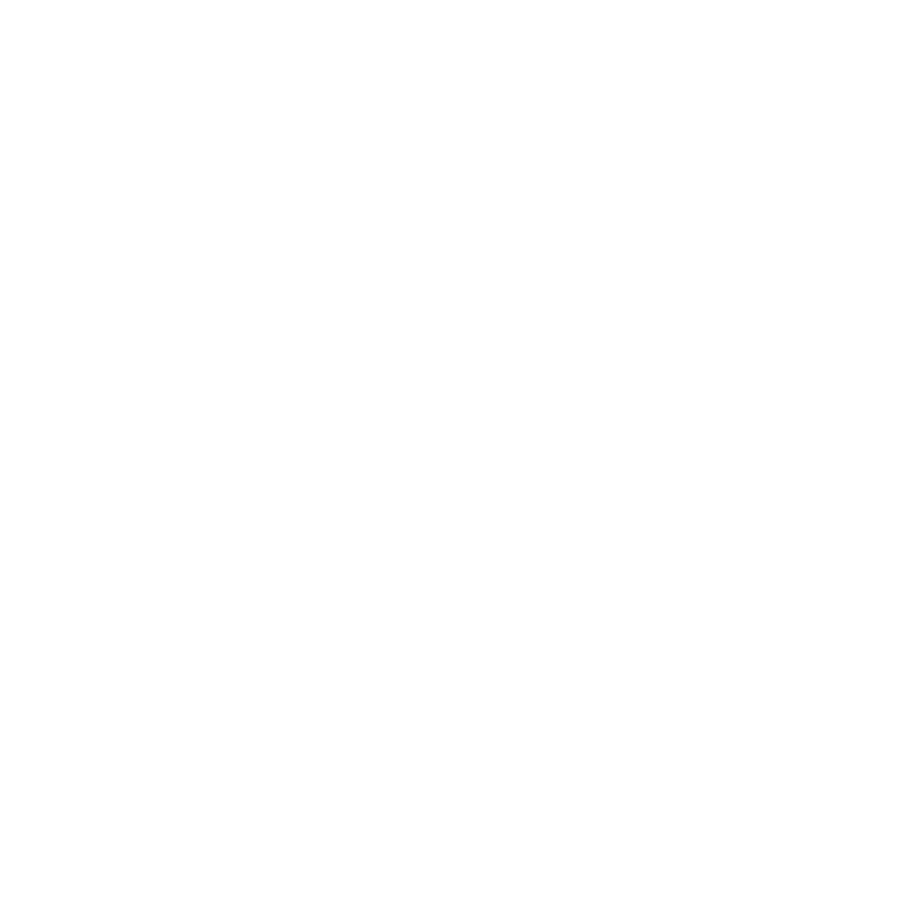

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_FFC
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 1265
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [ 3.4284 -0.0553]
wRSq 0.11019623586982441
wCC prediction 0.3319581839175296


<IPython.core.display.Javascript object>


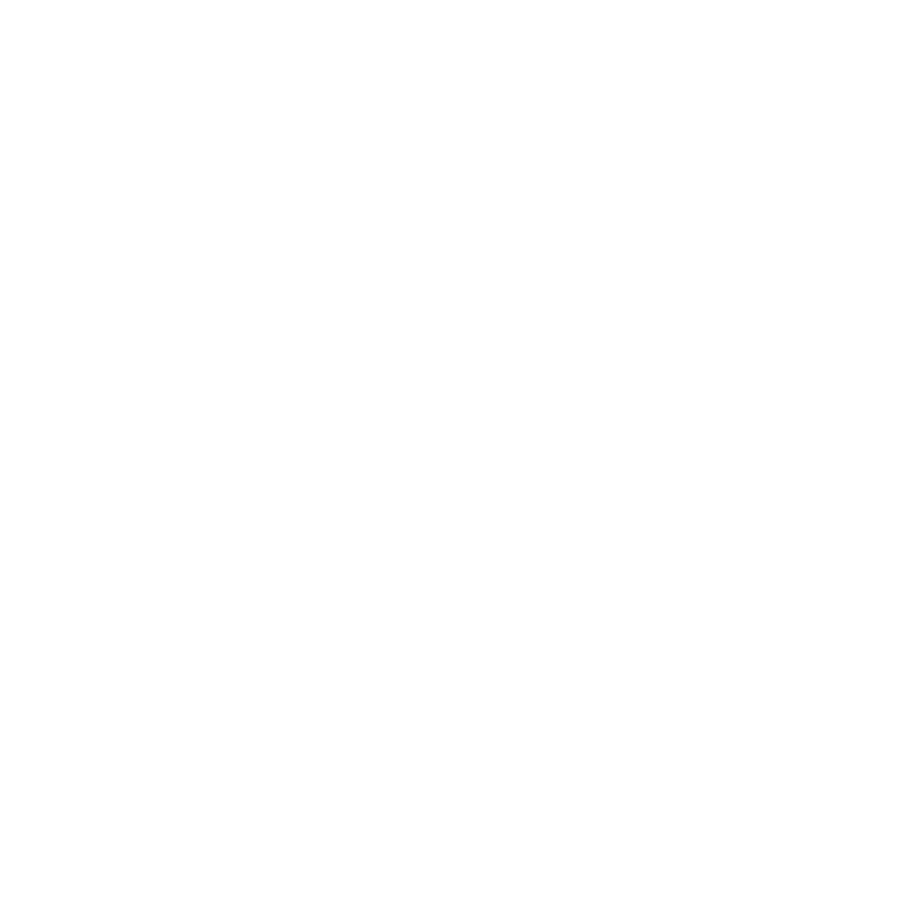

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_FOP1
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_FOP2
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_FOP3
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq g

<IPython.core.display.Javascript object>


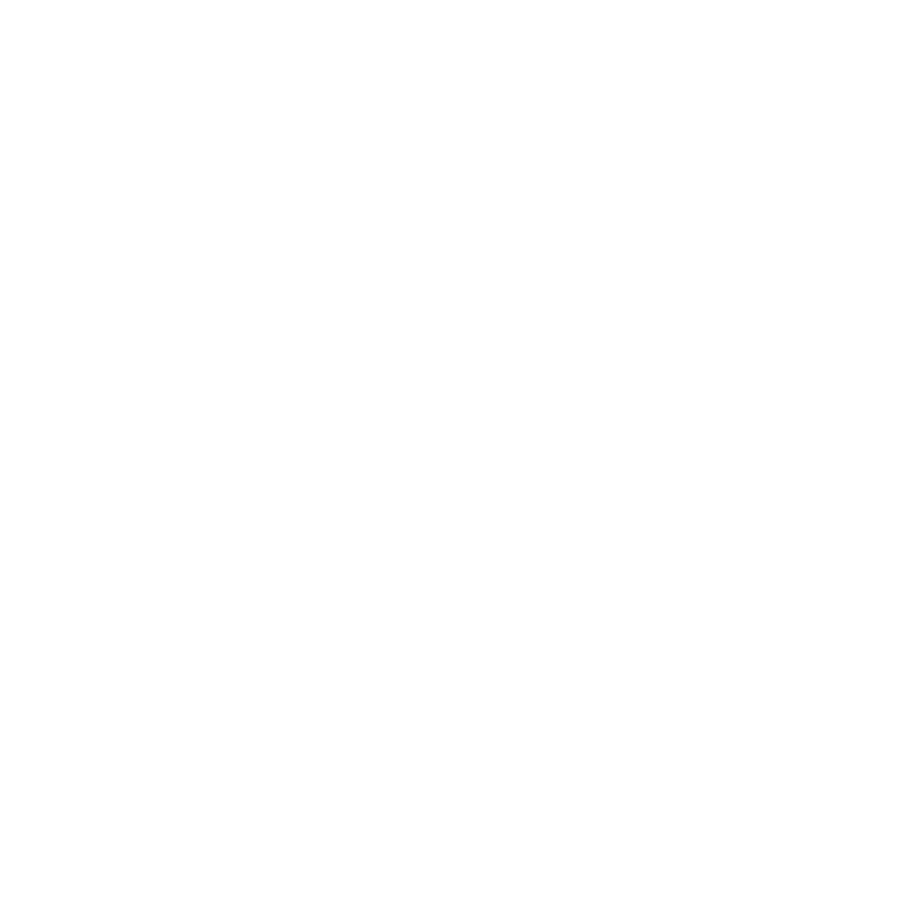

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_FOP5
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 101
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [17.1036  0.0063]
wRSq 0.12910316892189966
wCC prediction 0.35930929423255875


<IPython.core.display.Javascript object>


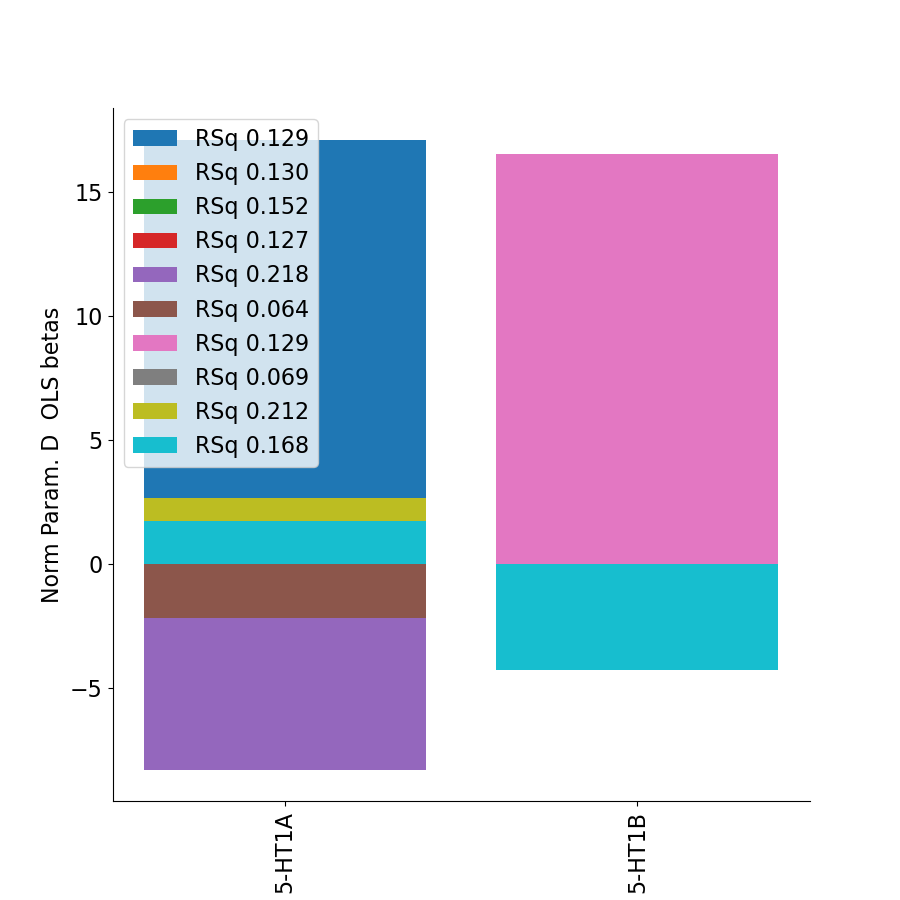

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_FST
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 781
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-2.7582  0.0264]
wRSq 0.029487547059601993
wCC prediction 0.1717193846355207


<IPython.core.display.Javascript object>


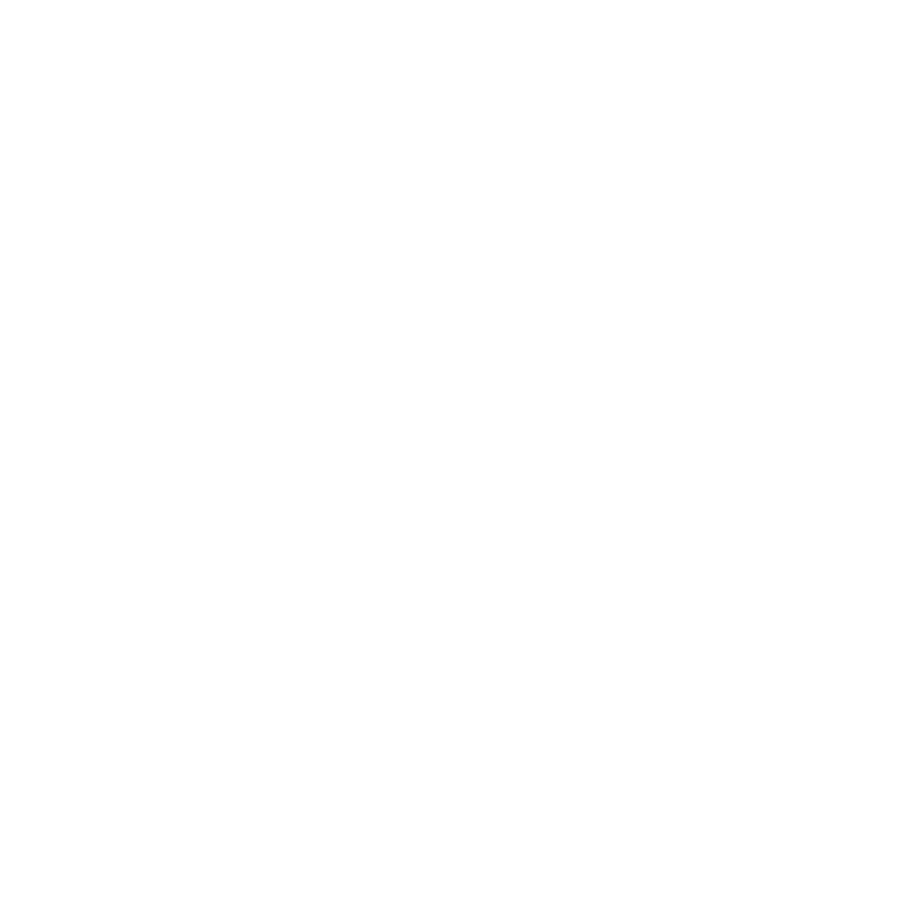

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_H
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_i6-8
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 29
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-18.9111   0.34  ]
wRSq 0.2628567169612289
wCC prediction 0.5126955402197574


<IPython.core.display.Javascript object>


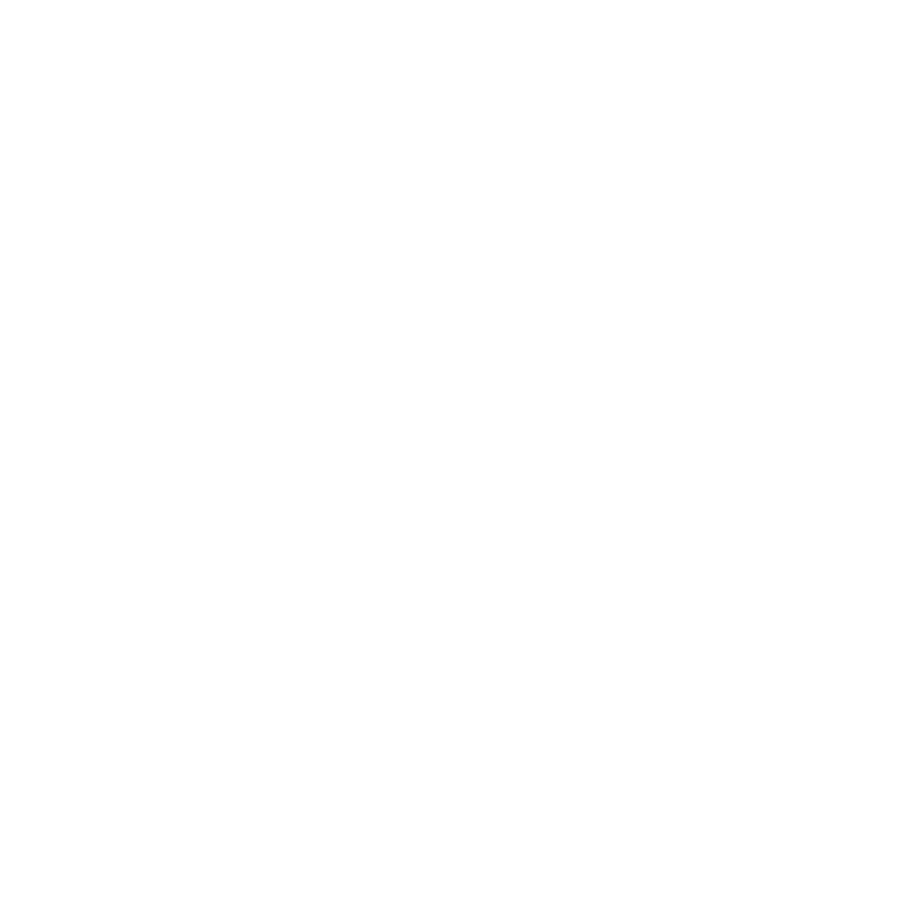

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_IFJa
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 37
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-6.0311  0.0923]
wRSq 0.009633441301658552
wCC prediction 0.09815009578018072


<IPython.core.display.Javascript object>


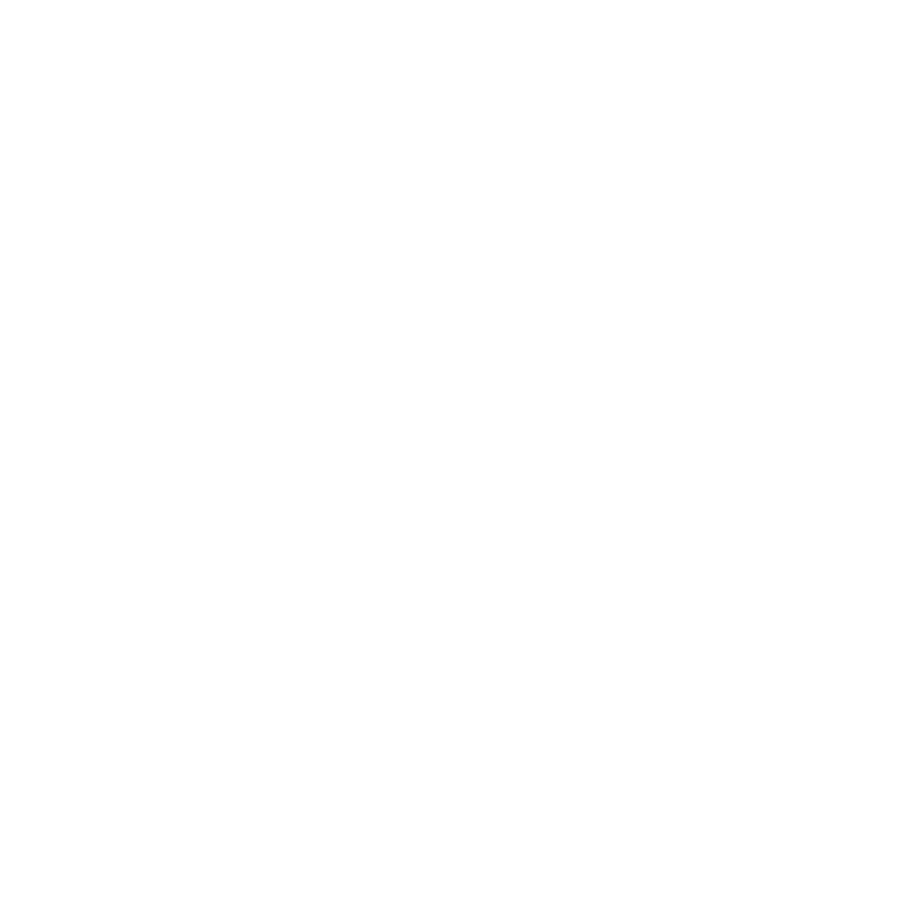

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_IFJp
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 499
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [20.8102 -0.0261]
wRSq 0.1267396678514514
wCC prediction 0.35600515143948613


<IPython.core.display.Javascript object>


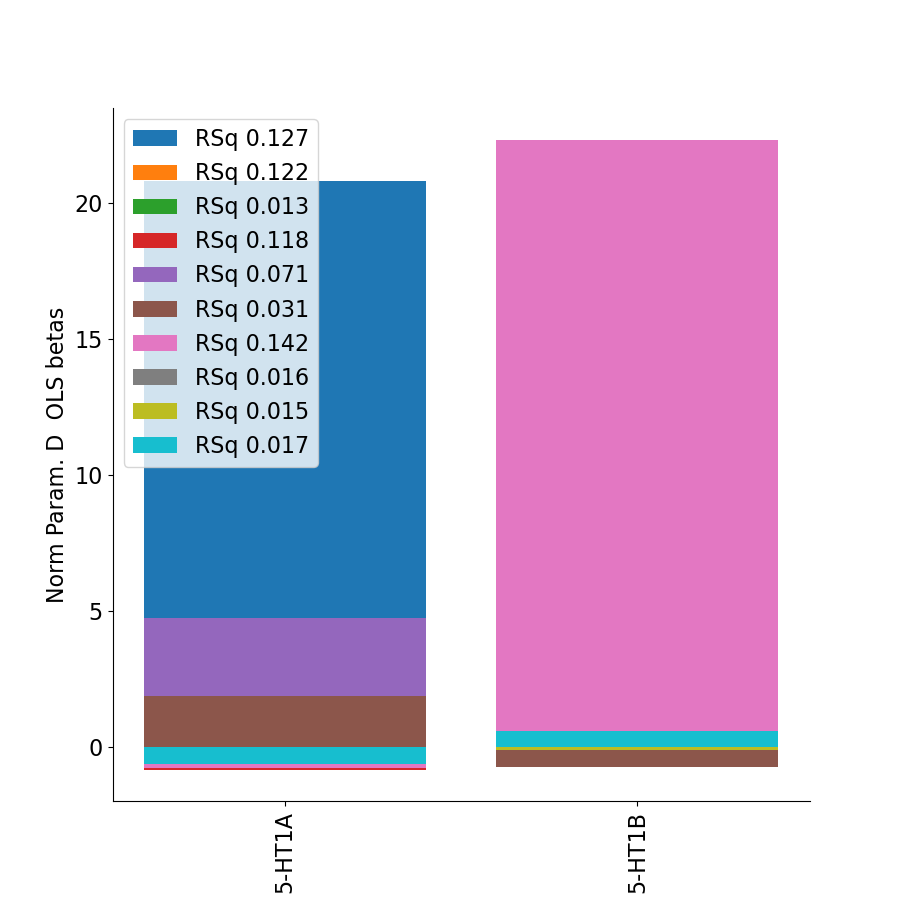

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_IFSa
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 2
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_IFSp
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 129
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [58.4923 -0.479 ]
wRSq 0.0777315622706477
wCC prediction 0.27880380605480953


<IPython.core.display.Javascript object>


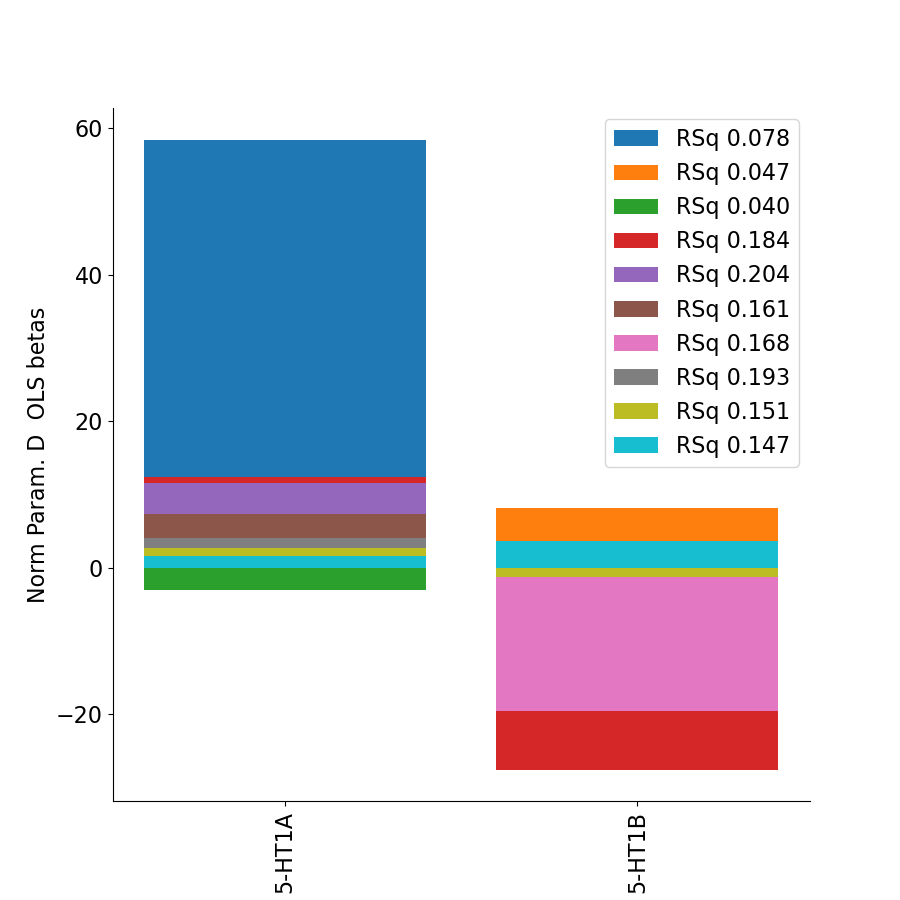

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_Ig
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_IP0
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 989
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-8.4046 -0.0074]
wRSq 0.1272313856827385
wCC prediction 0.3566950878309632


<IPython.core.display.Javascript object>


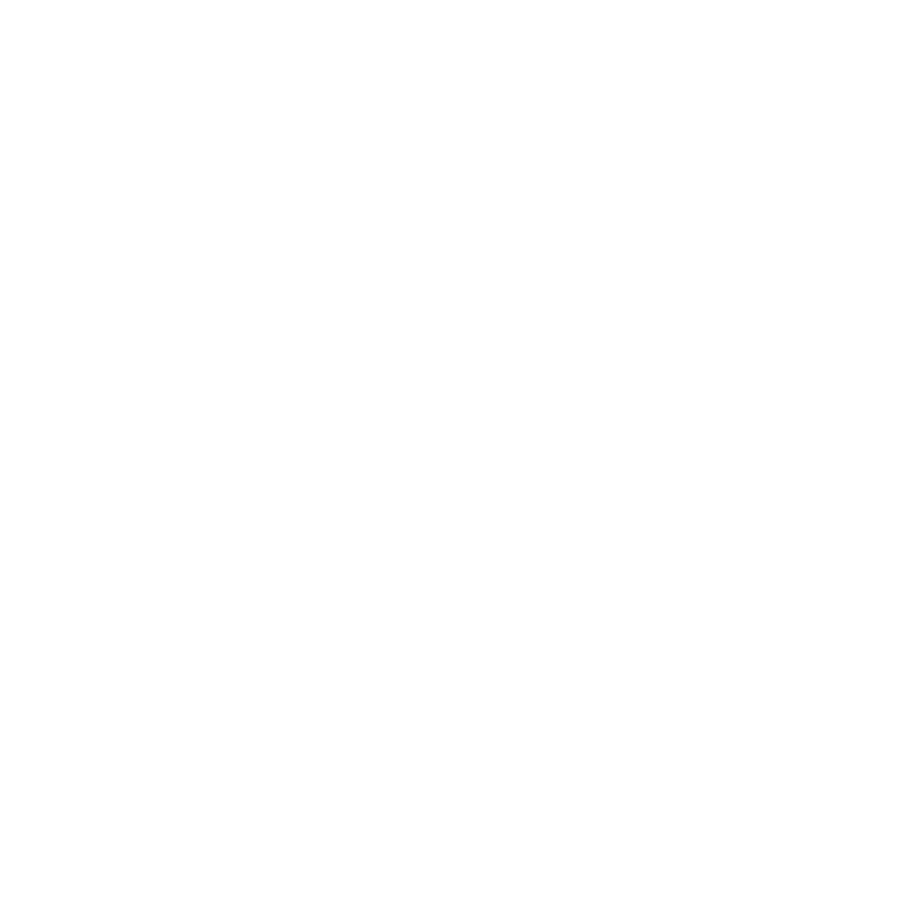

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_IP1
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 23
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-5.6829  0.0705]
wRSq 0.04659308412085705
wCC prediction 0.21585431225911839


<IPython.core.display.Javascript object>


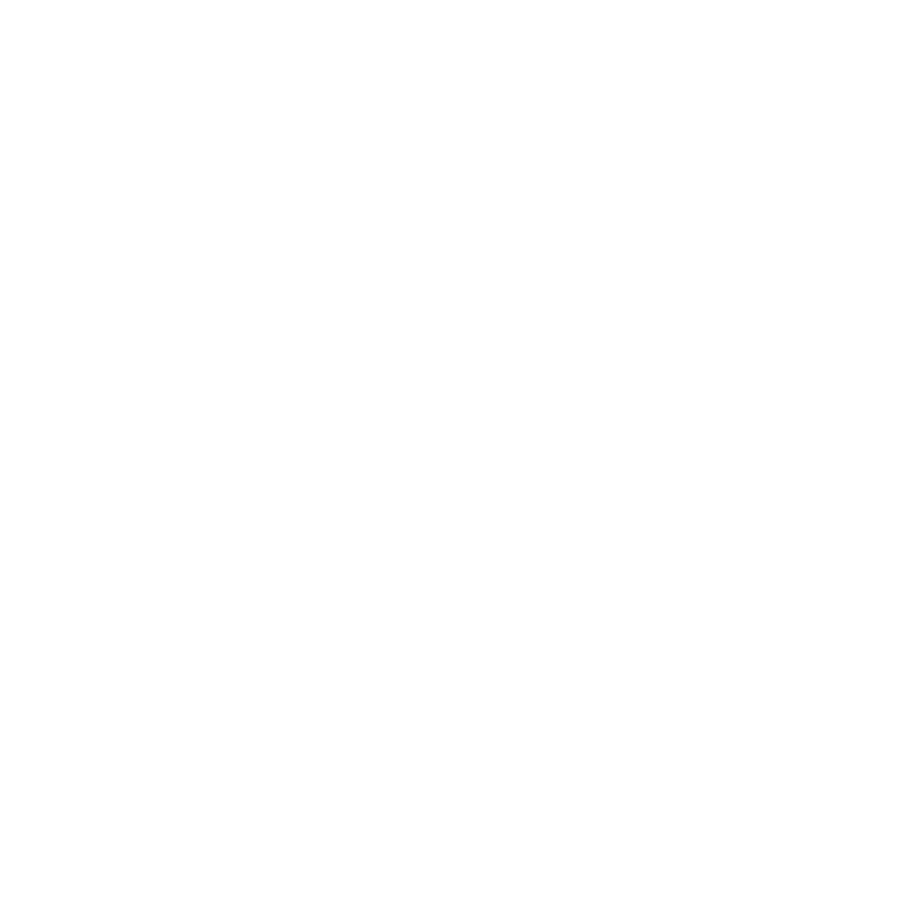

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_IP2
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 100
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [3.0253 0.0322]
wRSq 0.0017976862668945826
wCC prediction 0.0423991304969165


<IPython.core.display.Javascript object>


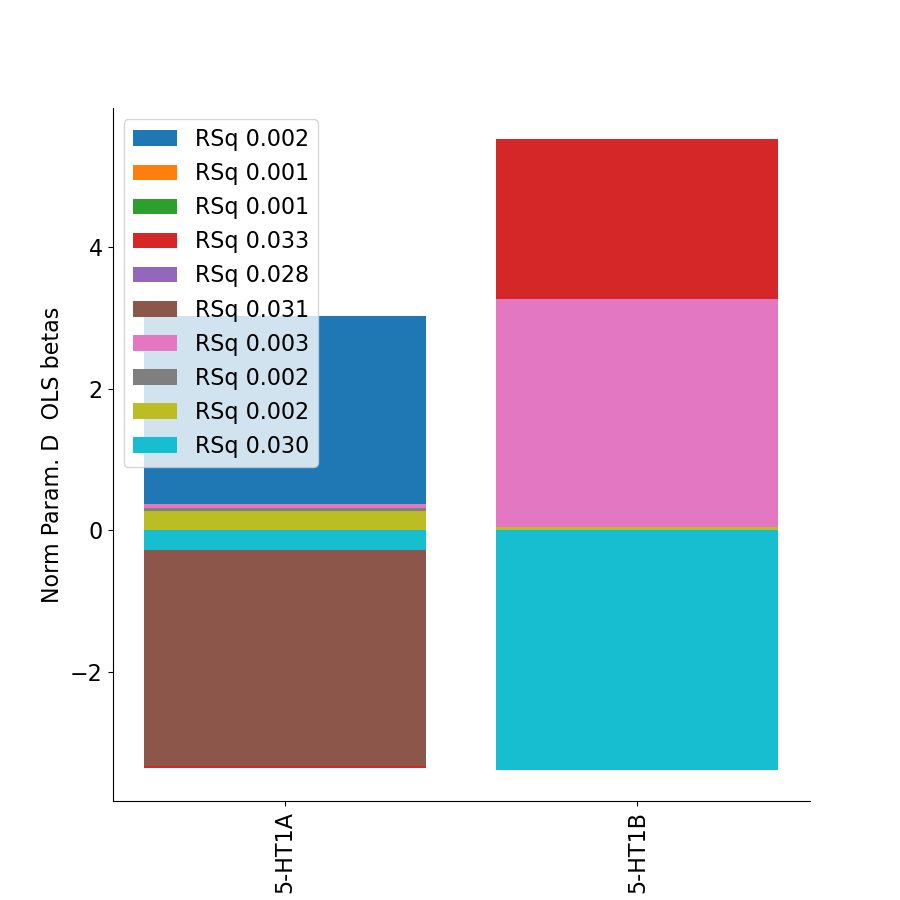

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_IPS1
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 1187
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [ 1.5343 -0.0303]
wRSq 0.03181828288639932
wCC prediction 0.17837680030317632


<IPython.core.display.Javascript object>


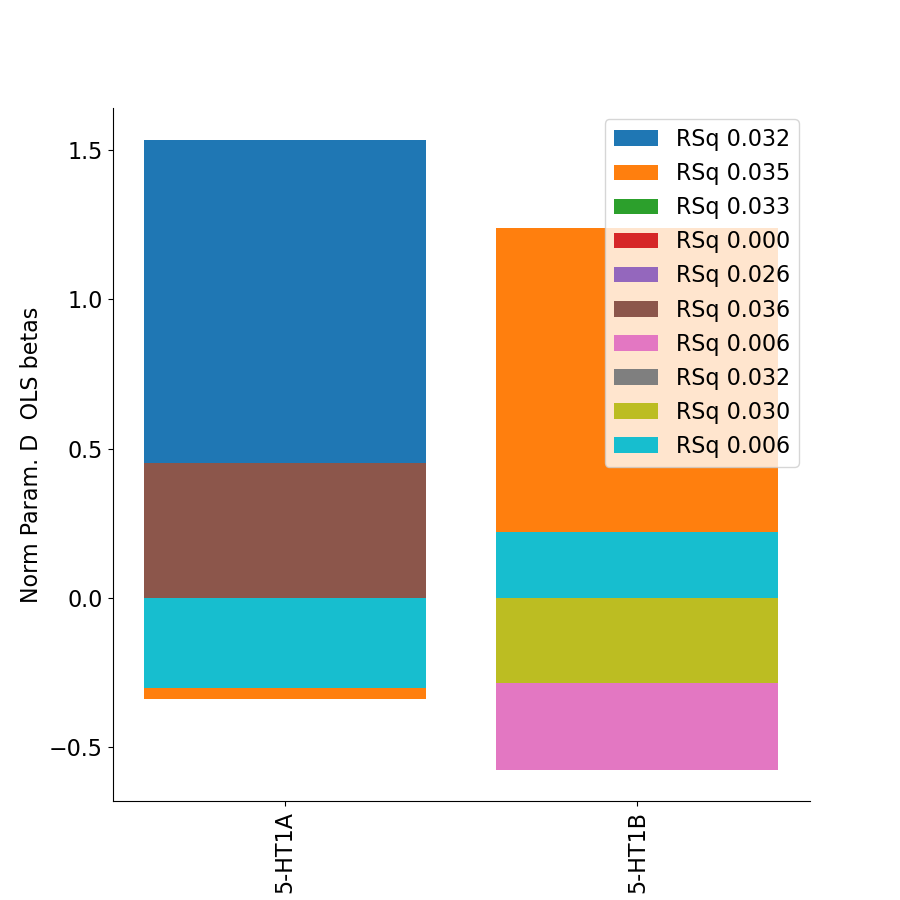

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_LBelt
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_LIPd
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 660
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [16.0966 -0.0557]
wRSq 0.09268904929916977
wCC prediction 0.3044487630113969


<IPython.core.display.Javascript object>


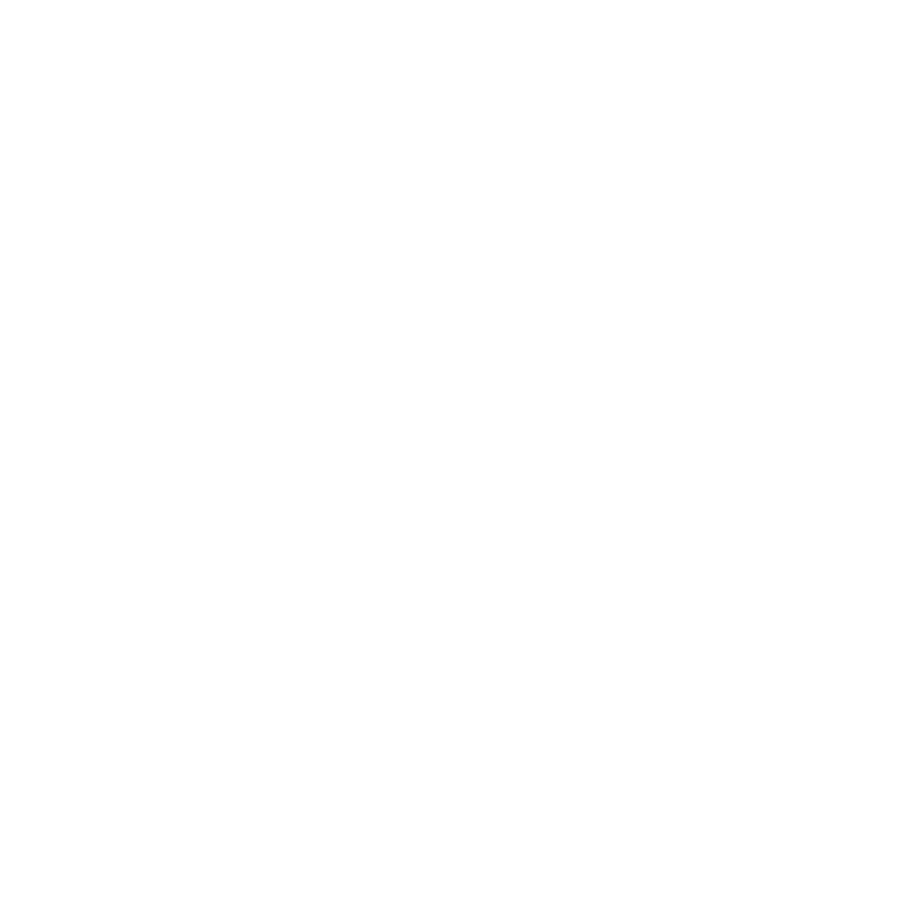

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_LIPv
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 1426
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [5.9273 0.0058]
wRSq 0.07800537263103358
wCC prediction 0.2792944192622429


<IPython.core.display.Javascript object>


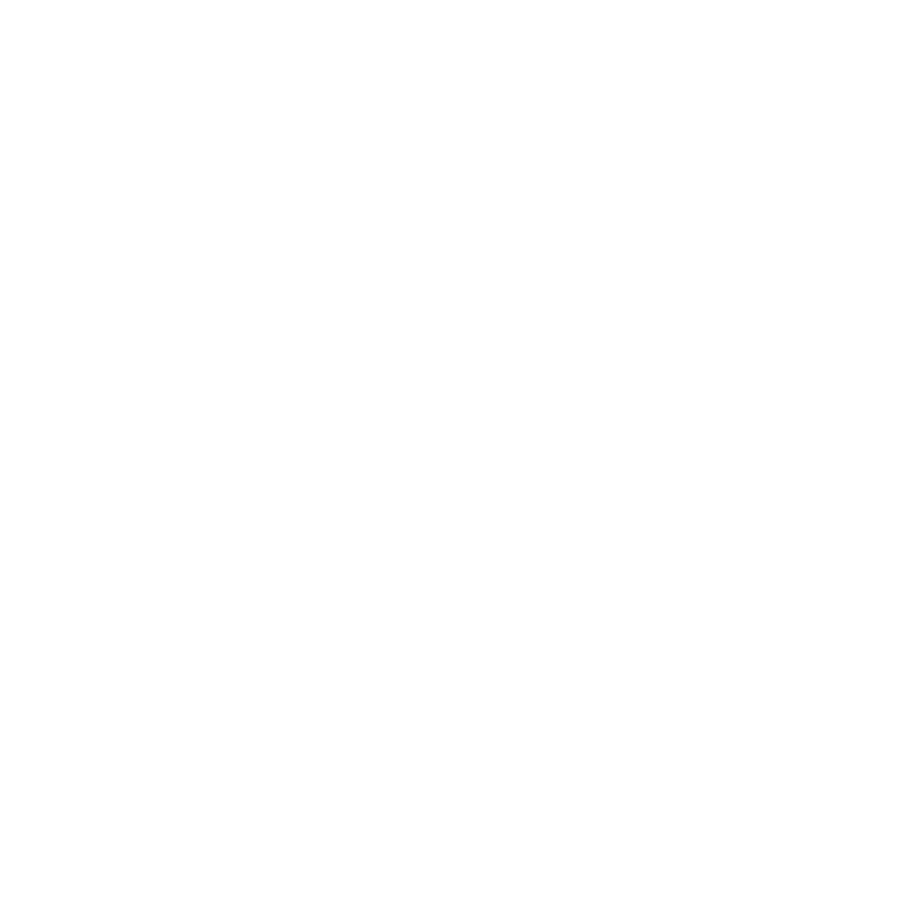

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_LO1
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 586
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-6.8175 -0.0047]
wRSq 0.10363878799613668
wCC prediction 0.3219297873700672


<IPython.core.display.Javascript object>


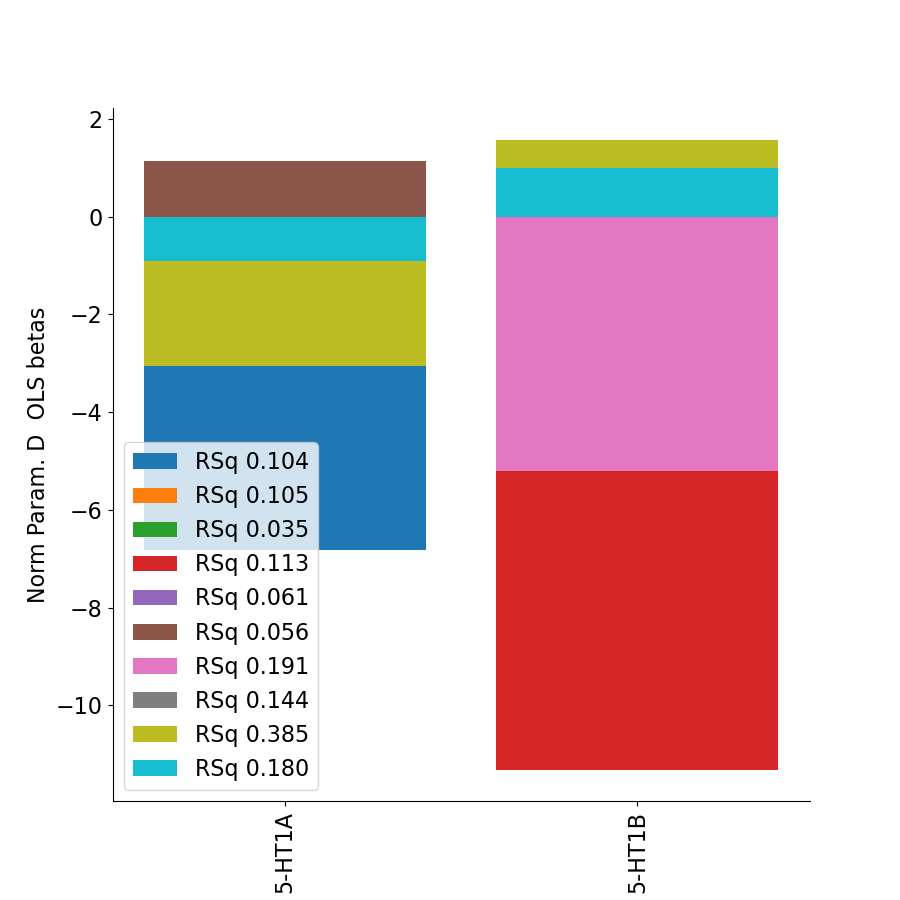

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_LO2
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 543
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-17.0059   0.147 ]
wRSq 0.36384901219067345
wCC prediction 0.6031989822526835


<IPython.core.display.Javascript object>


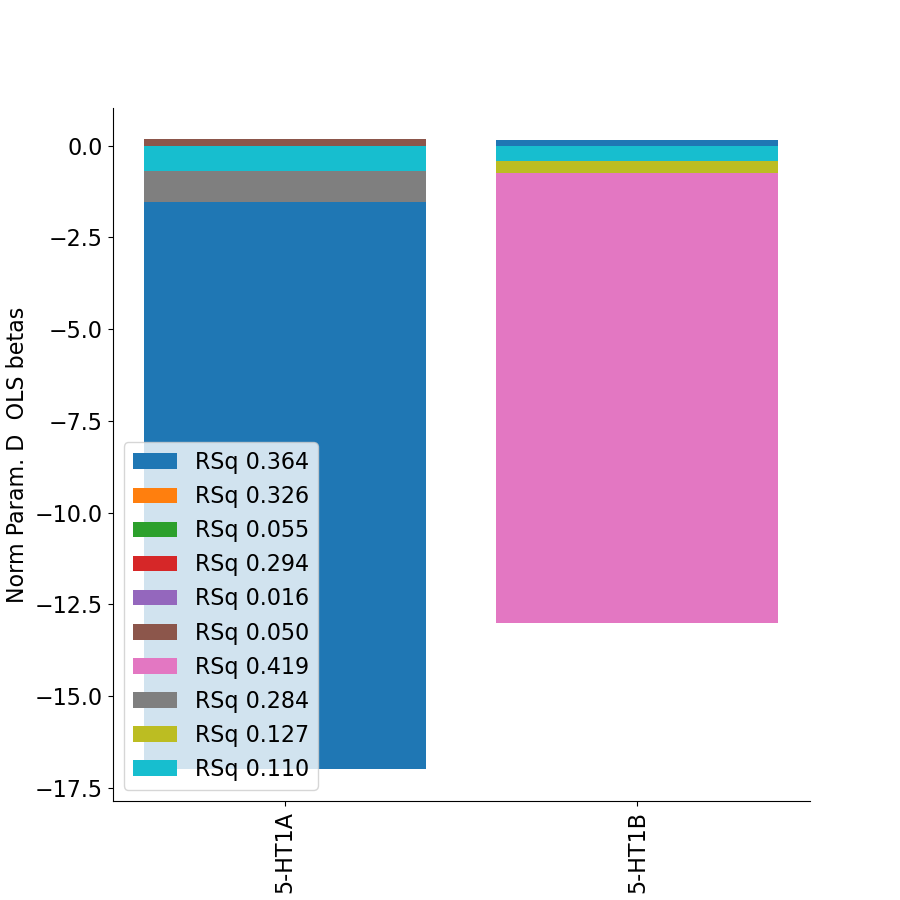

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_LO3
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 672
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-2.2308  0.0358]
wRSq 0.007892073490760487
wCC prediction 0.08883734288439926


<IPython.core.display.Javascript object>


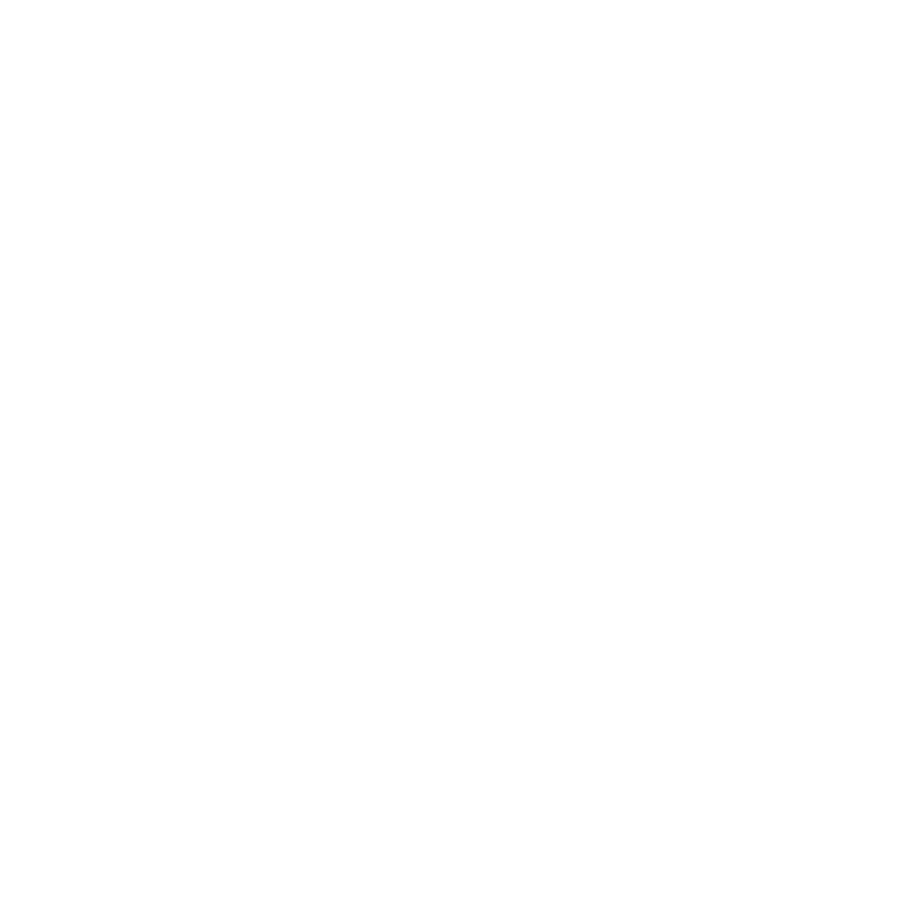

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_MBelt
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_MI
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_MIP
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 1433
performing OLS (1D y)
Estimated OLS betas 

<IPython.core.display.Javascript object>


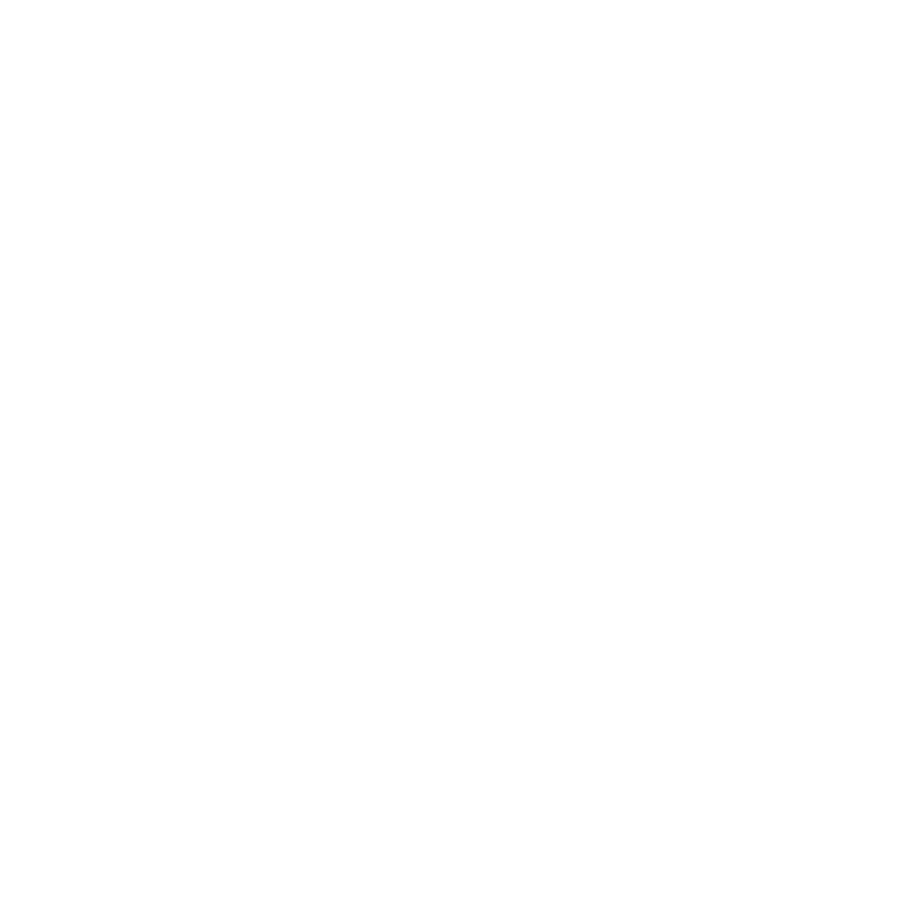

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_MST
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 745
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-3.1832 -0.0363]
wRSq 0.13503939182211144
wCC prediction 0.36747706298776167


<IPython.core.display.Javascript object>


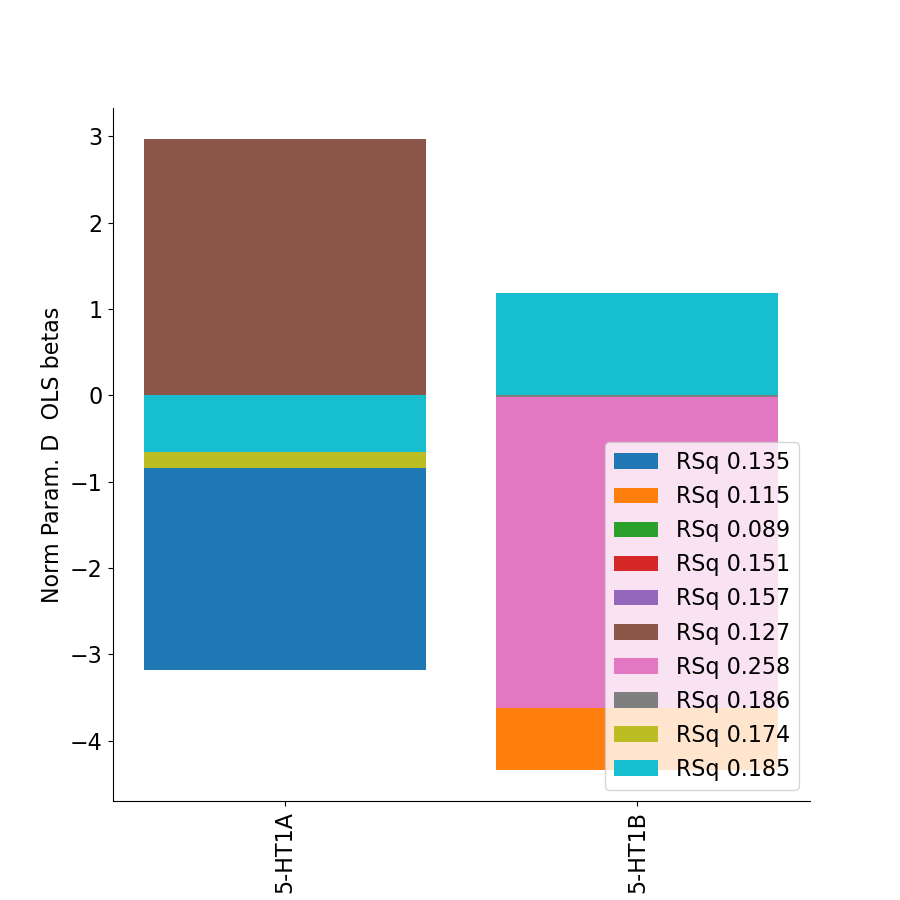

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_MT
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 586
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-3.9285 -0.0188]
wRSq 0.0879085163621175
wCC prediction 0.2964937037478494


<IPython.core.display.Javascript object>


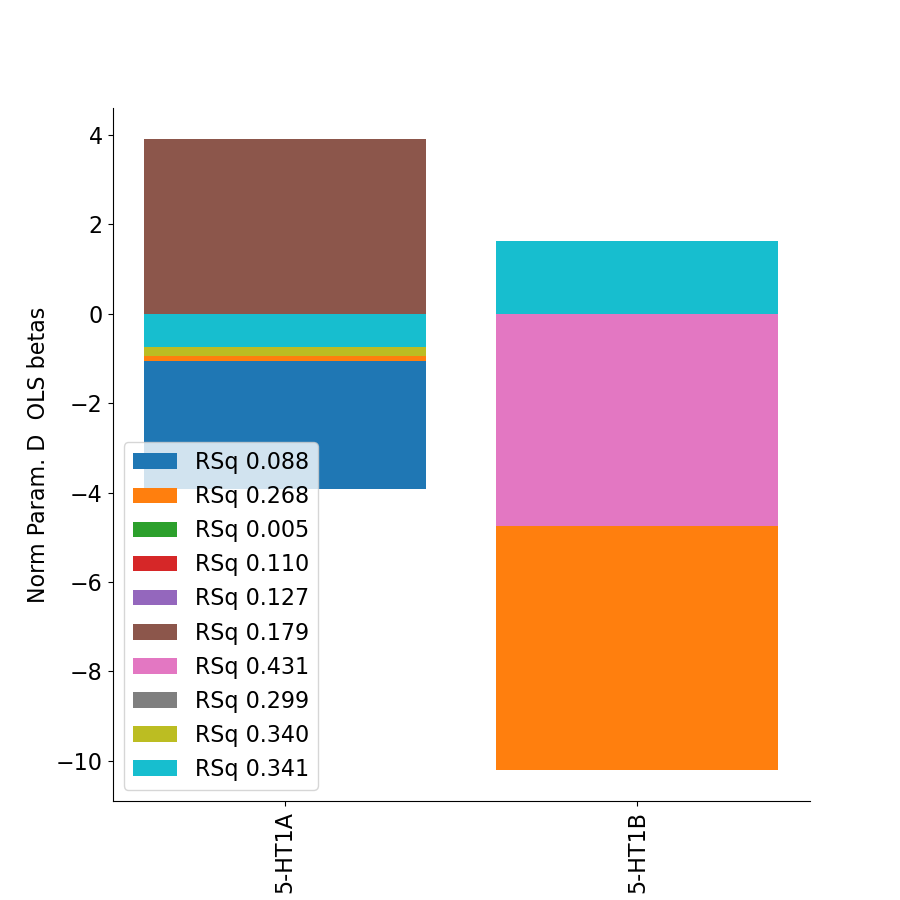

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_OFC
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_OP1
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_OP2-3
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq gl

<IPython.core.display.Javascript object>


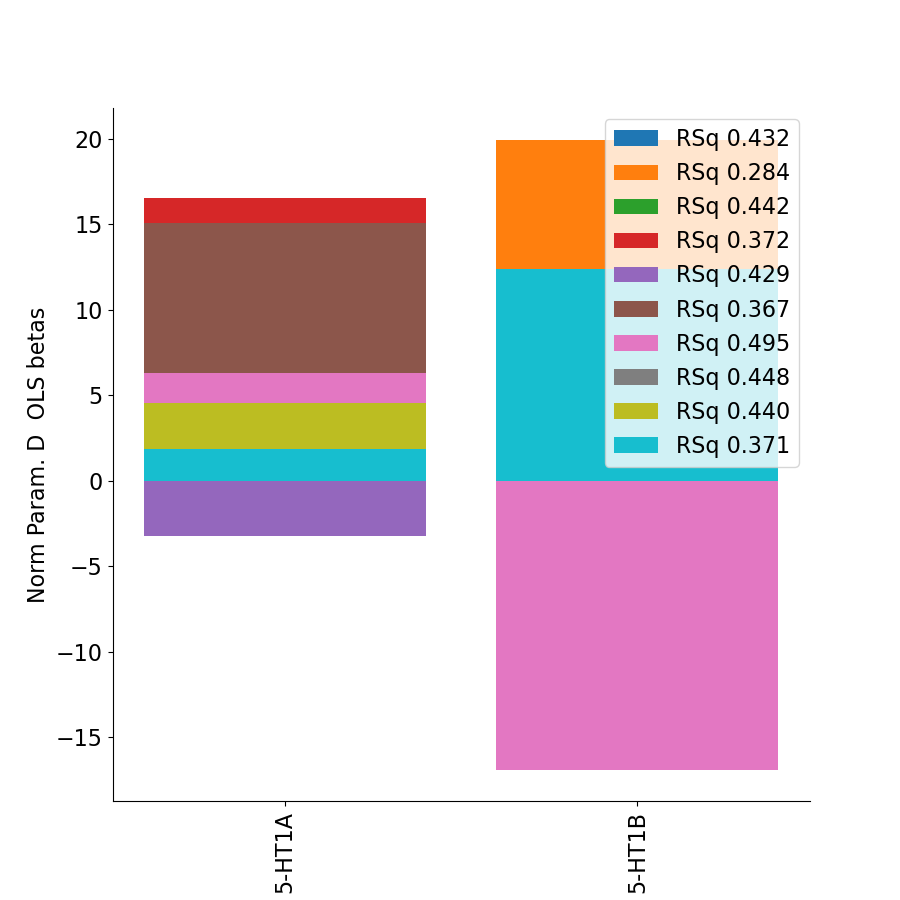

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_p47r
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_p9-46v
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 93
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [7.0441 0.195 ]
wRSq 0.08161089880016303
wCC prediction 0.2856762132207772


<IPython.core.display.Javascript object>


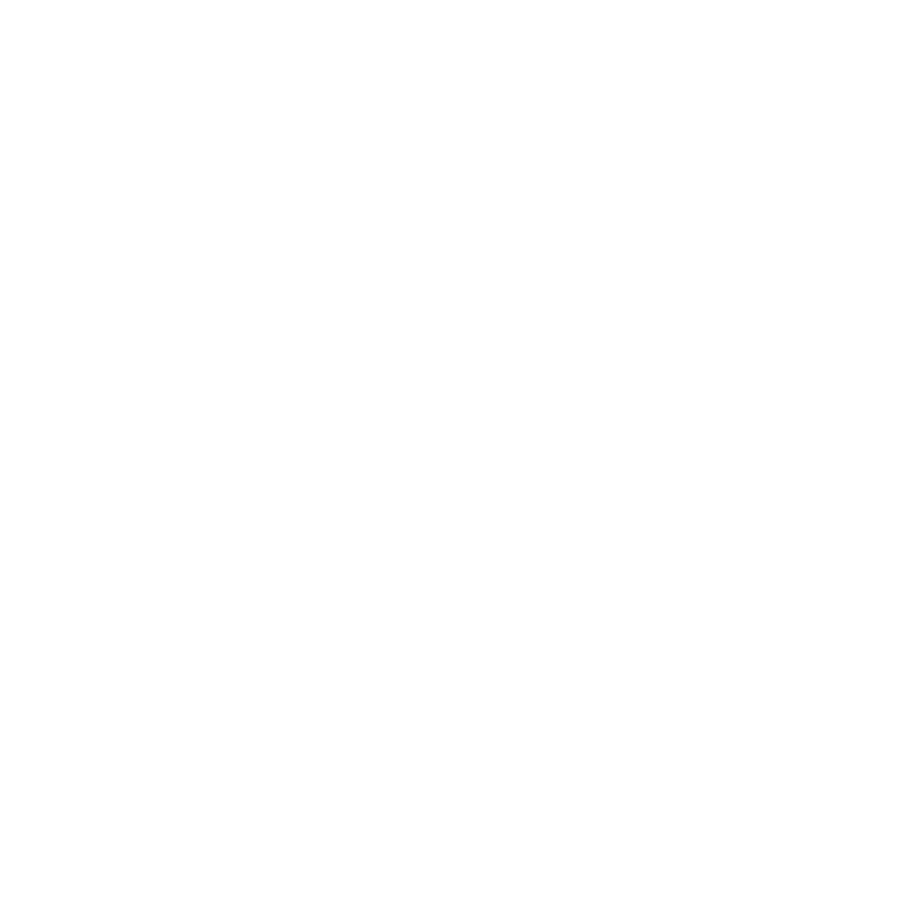

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PBelt
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PCV
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 237
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-8.3819  0.083 ]
wRSq 0.09634132035281684
wCC prediction 0.3103889823315529


<IPython.core.display.Javascript object>


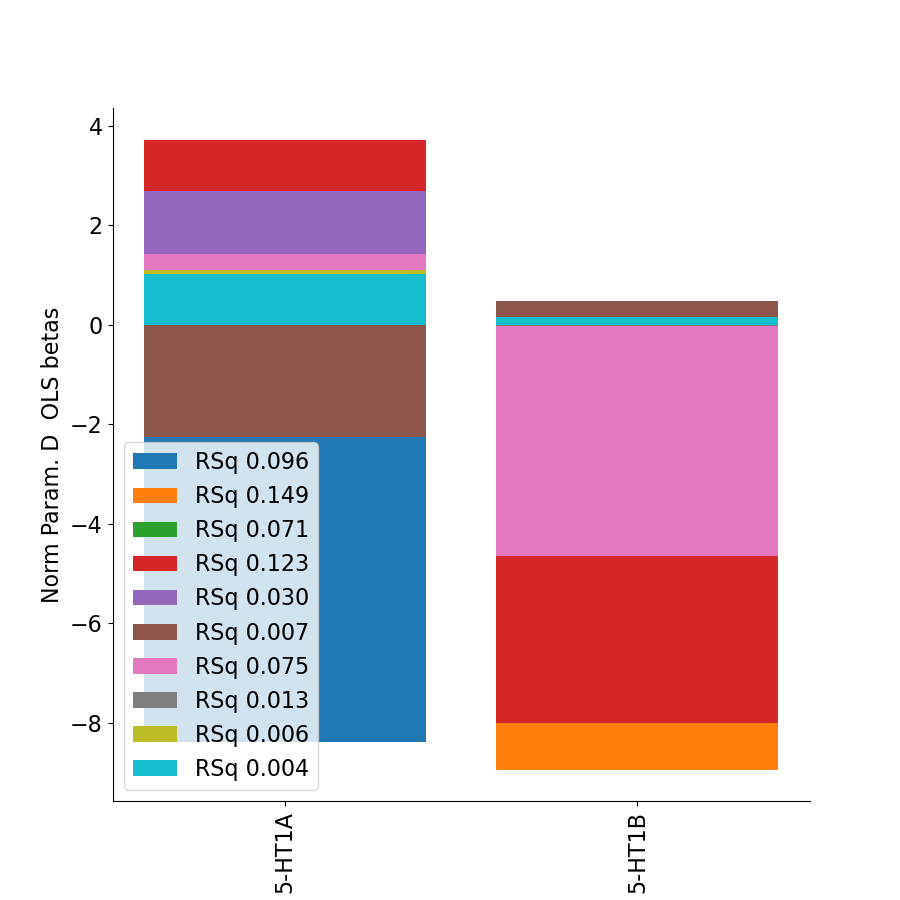

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PeEc
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PEF
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 705
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [0.9947 0.0299]
wRSq 0.044335123209866434
wCC prediction 0.2105590729697161


<IPython.core.display.Javascript object>


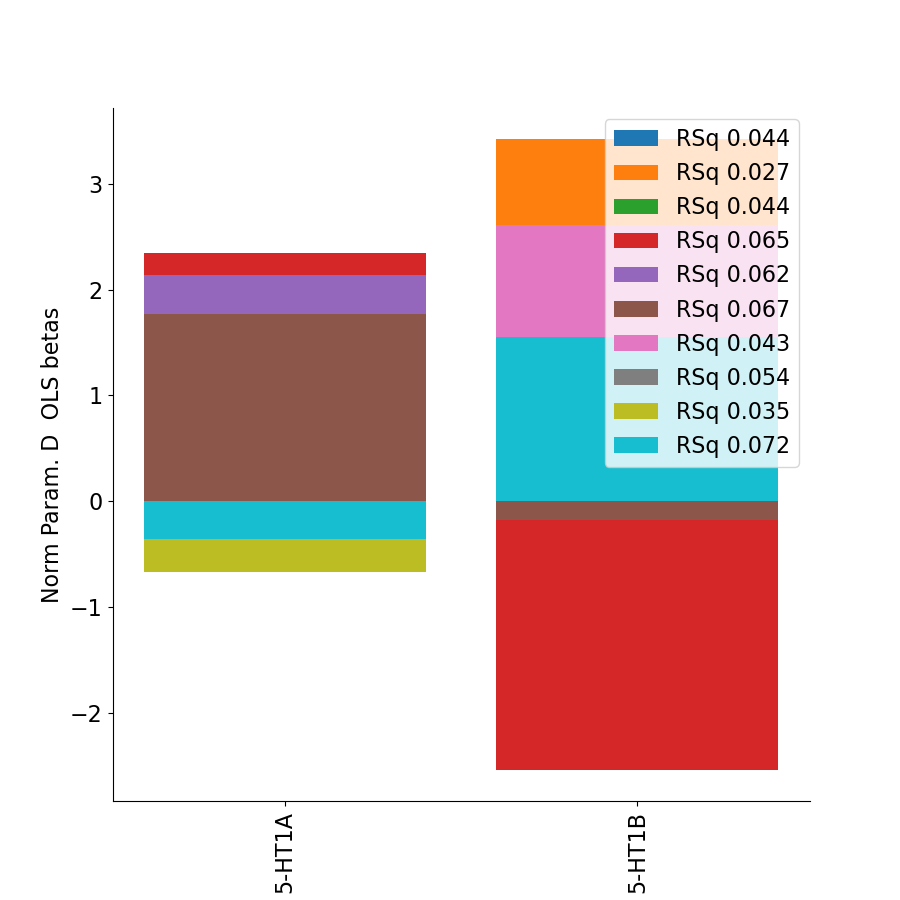

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PF
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 404
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [ 7.7415 -0.0457]
wRSq 0.06322228716346057
wCC prediction 0.2514404246804011


<IPython.core.display.Javascript object>


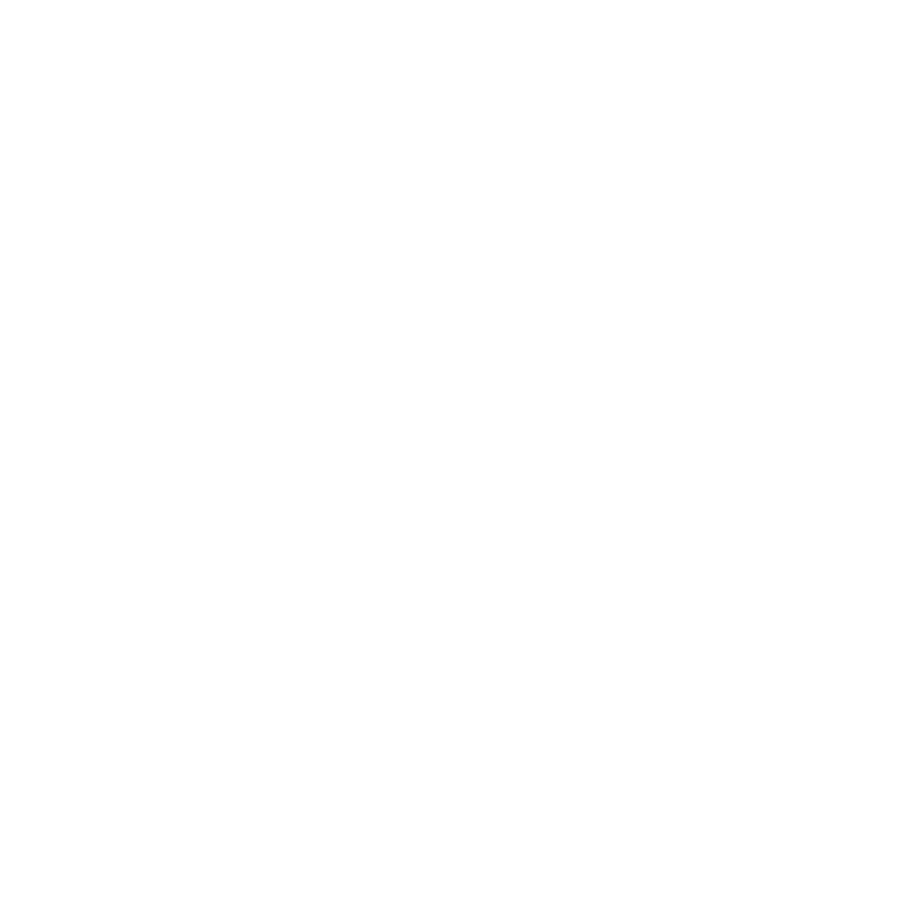

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PFcm
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PFm
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PFop
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 412
performing OLS (1D y)
Estimated OLS betas 

<IPython.core.display.Javascript object>


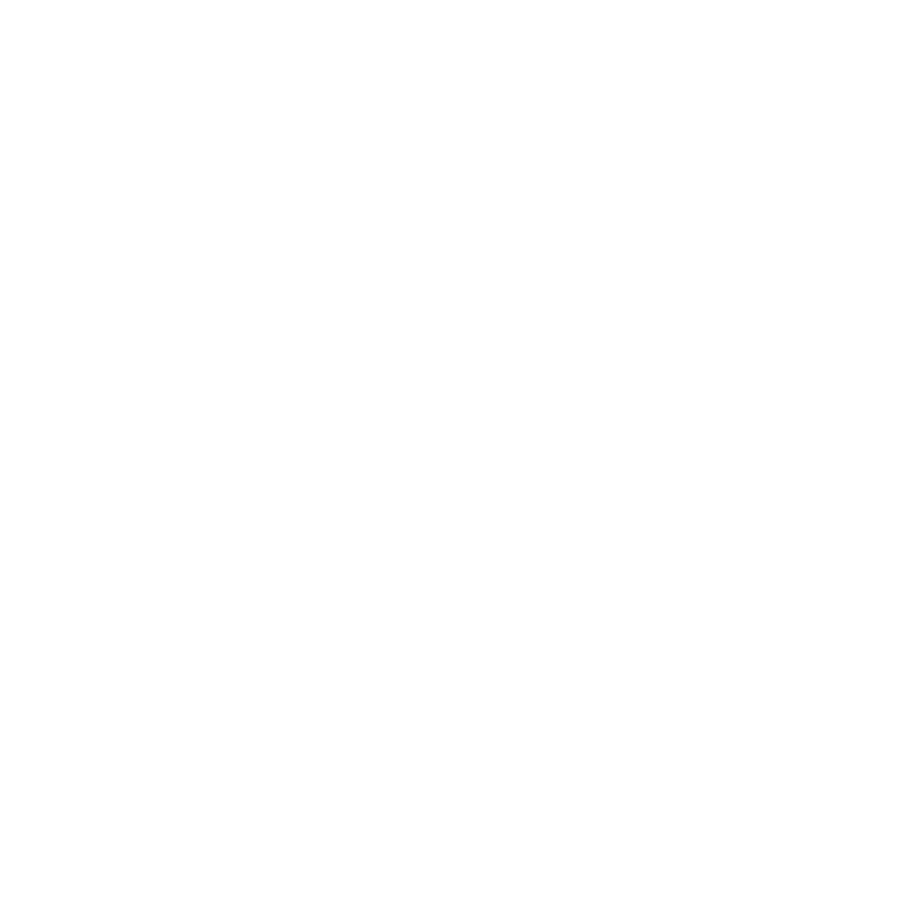

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PFt
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 1721
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [ 4.8307 -0.032 ]
wRSq 0.07103543932547707
wCC prediction 0.26652474430243267


<IPython.core.display.Javascript object>


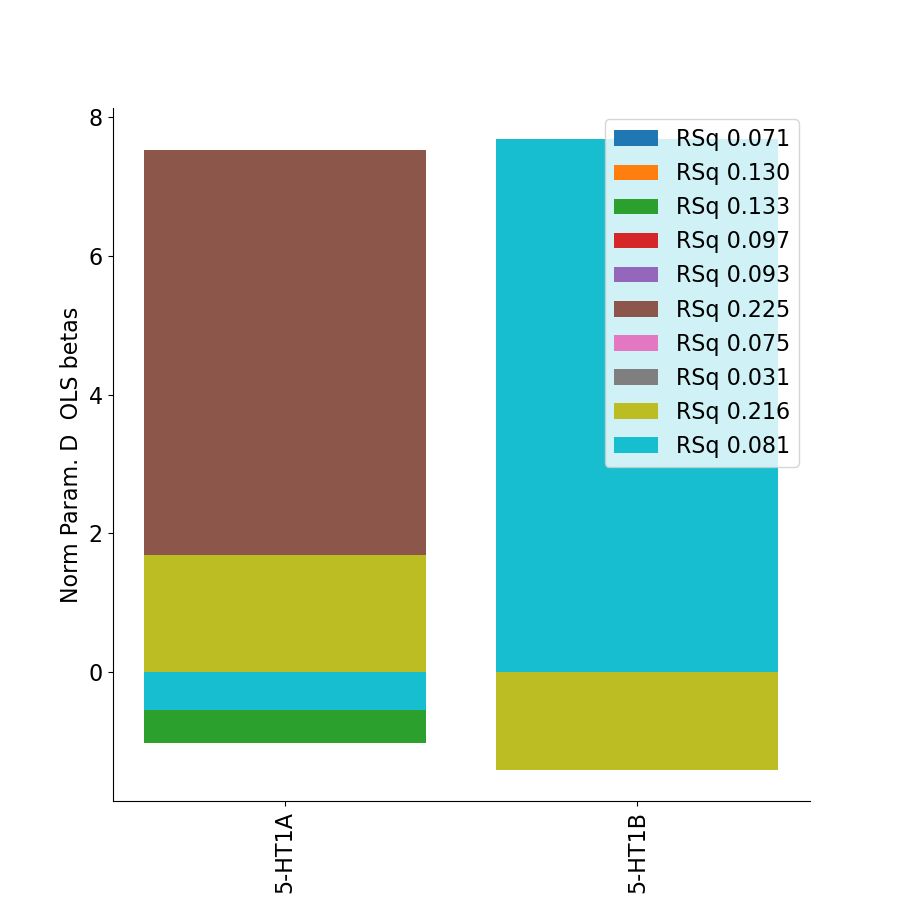

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PGi
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PGp
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 1116
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-10.042   -0.0237]
wRSq 0.17040289771196615
wCC prediction 0.412798858661172


<IPython.core.display.Javascript object>


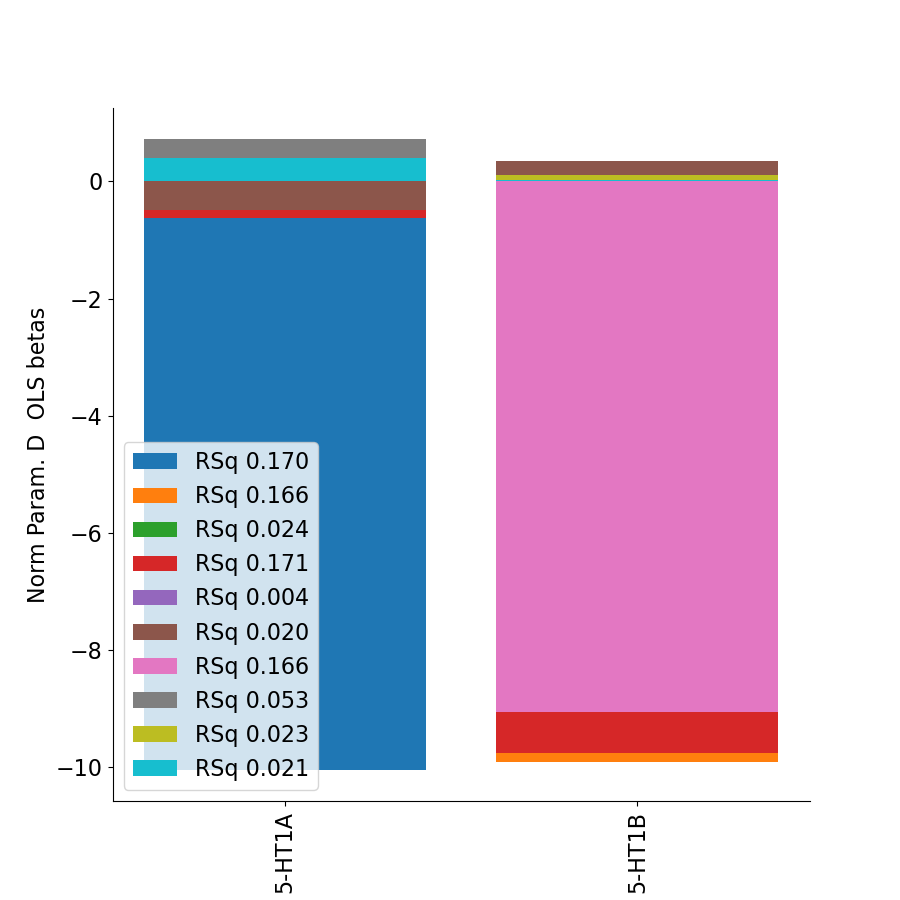

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PGs
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PH
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 1312
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [3.0614 0.0069]
wRSq 0.0061264500127937715
wCC prediction 0.07827164245621611


<IPython.core.display.Javascript object>


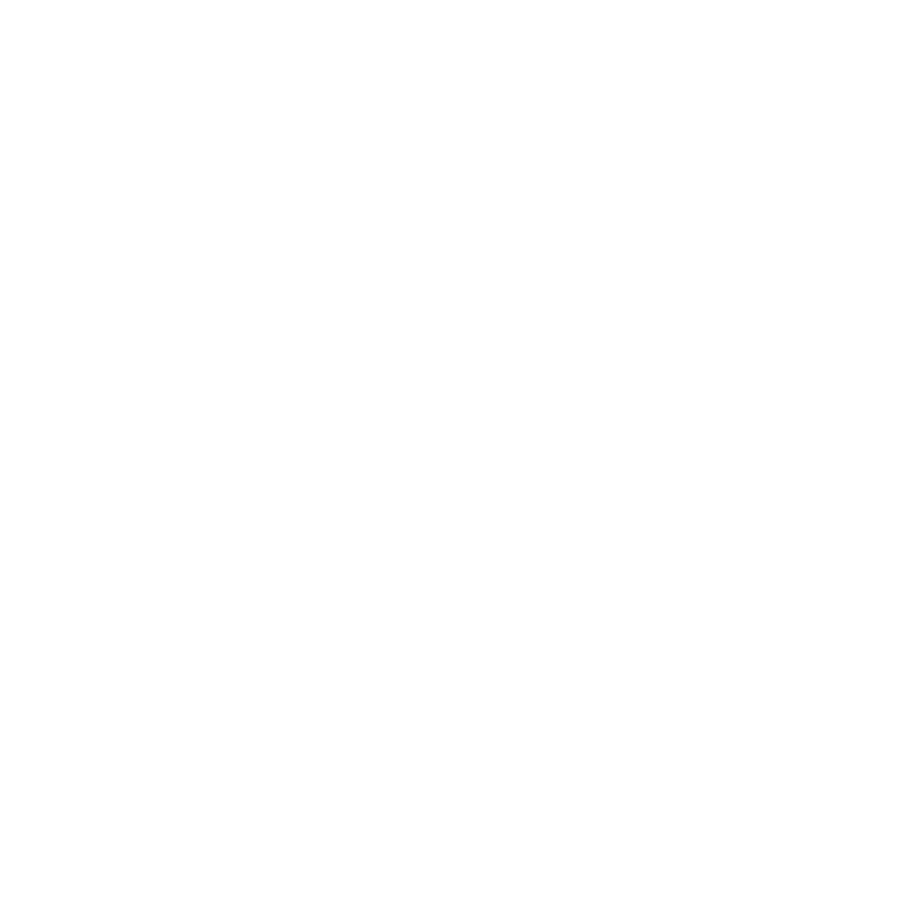

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PHA1
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PHA2
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PHA3
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 216
performing OLS (1D y)
Estimated OLS betas

<IPython.core.display.Javascript object>


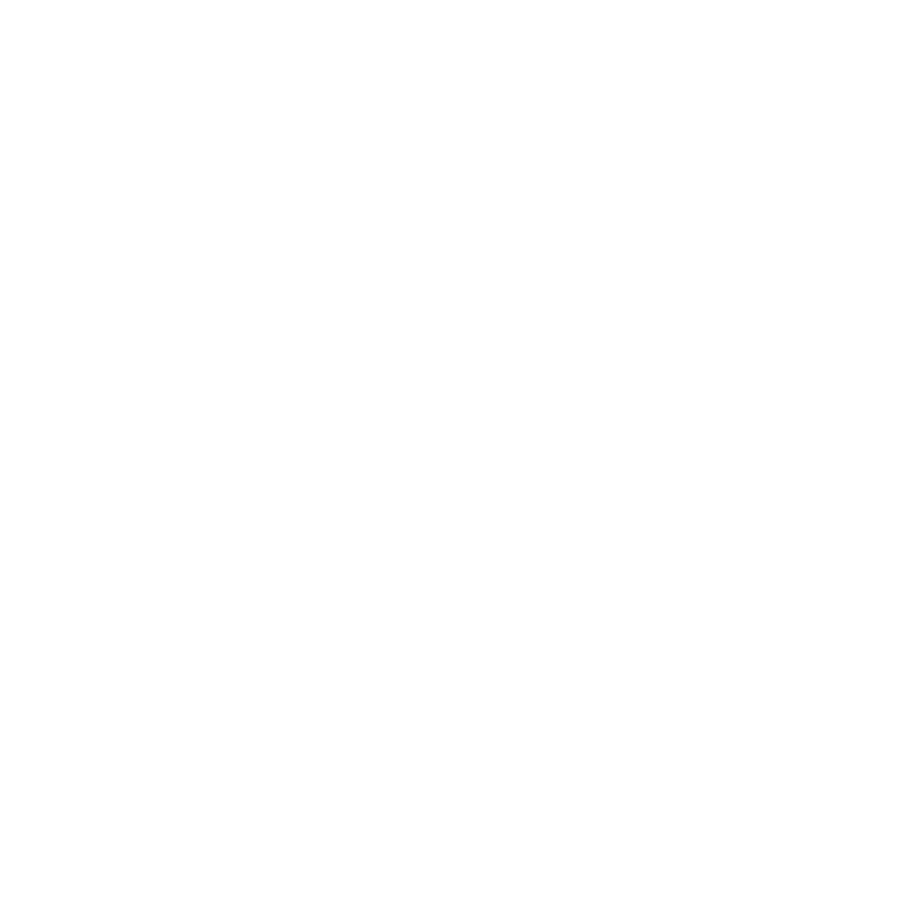

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PHT
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 81
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [ 1.8419 -0.0632]
wRSq 0.011344880093149379
wCC prediction 0.10651234713942437


<IPython.core.display.Javascript object>


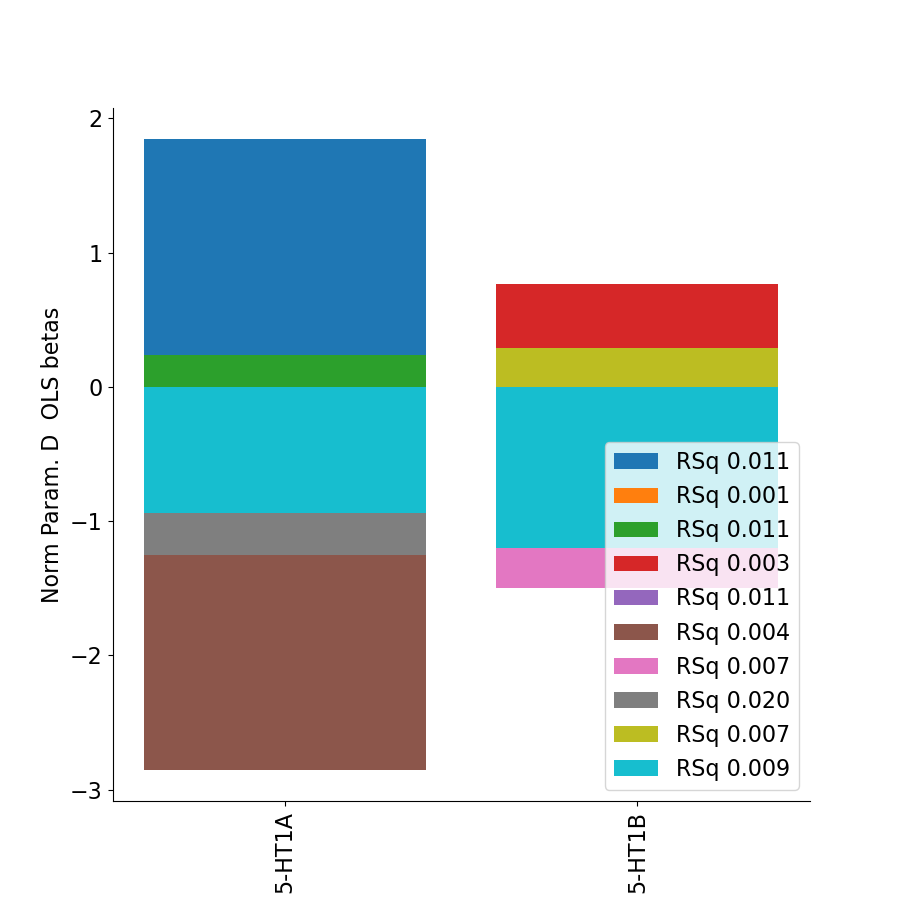

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PI
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_Pir
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PIT
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 678
performing OLS (1D y)
Estimated OLS betas Nor

<IPython.core.display.Javascript object>


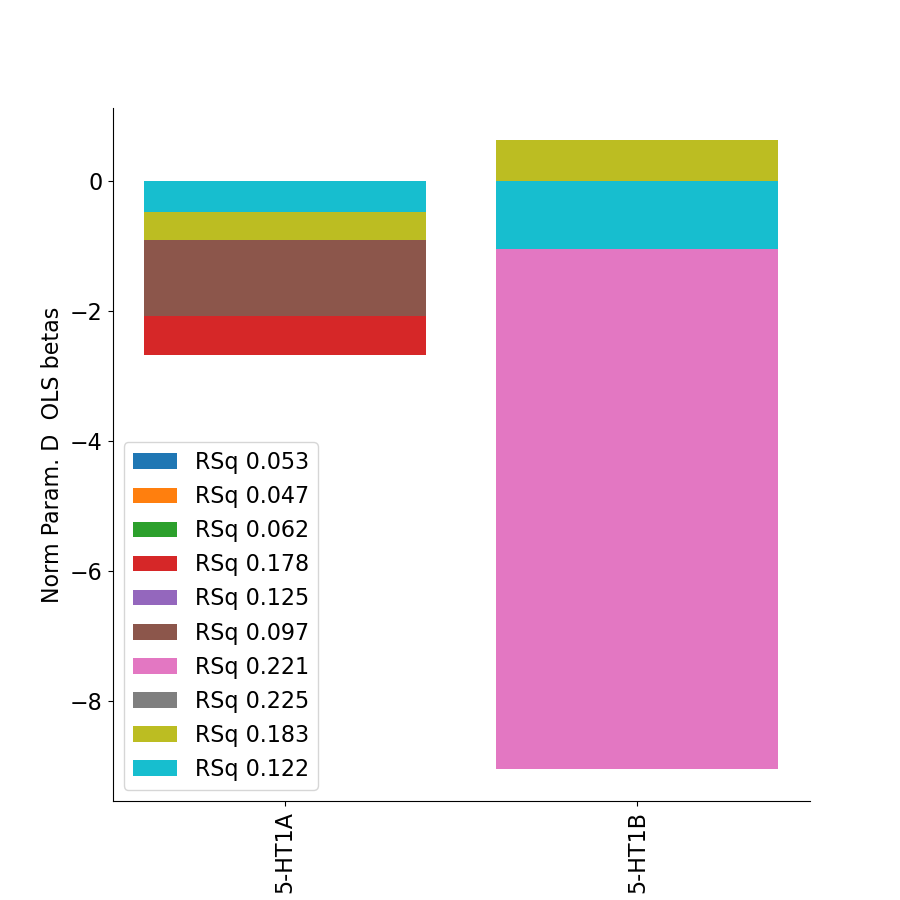

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_pOFC
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PoI1
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PoI2
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq g

<IPython.core.display.Javascript object>


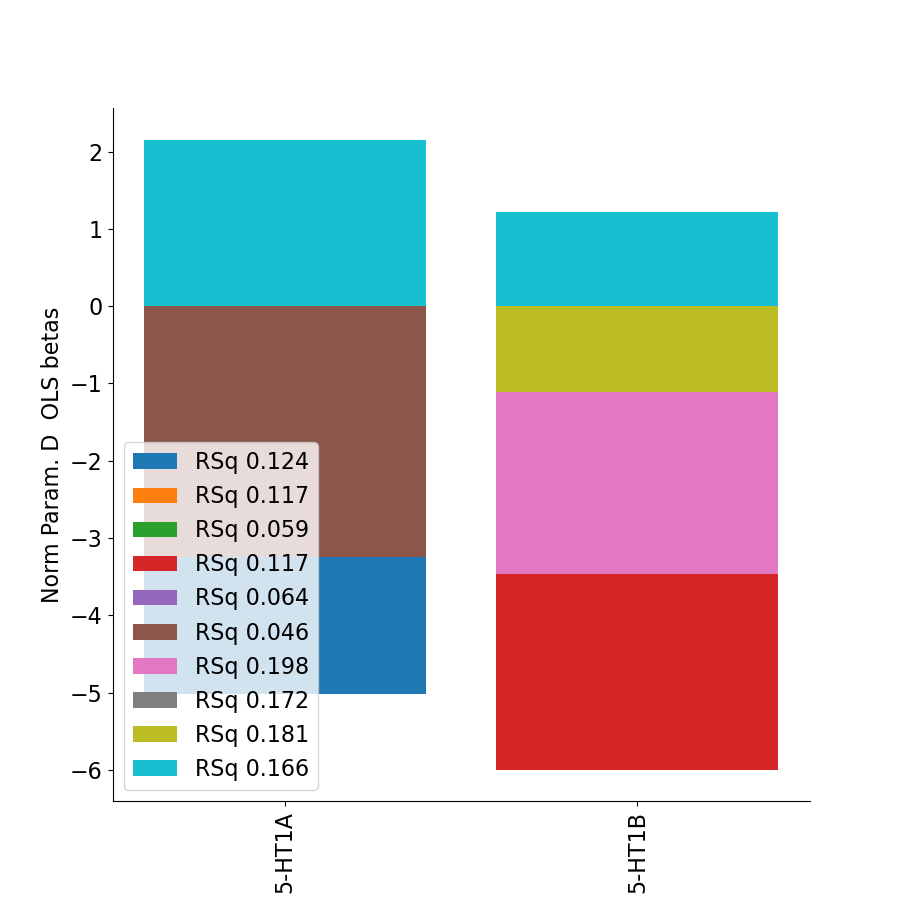

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PreS
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_ProS
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PSL
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 1
fit-task-BAR_fit-runs-all fsaverage_cvrsq gl

<IPython.core.display.Javascript object>


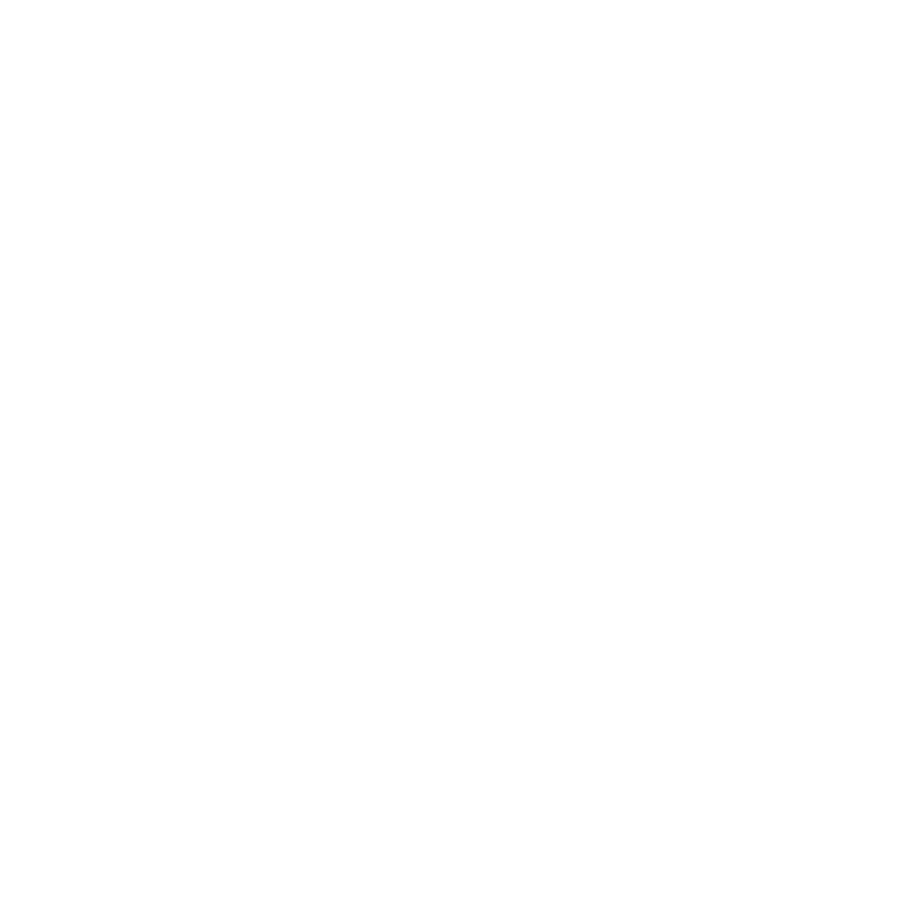

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_SFL
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_STGa
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_STSda
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq g

<IPython.core.display.Javascript object>


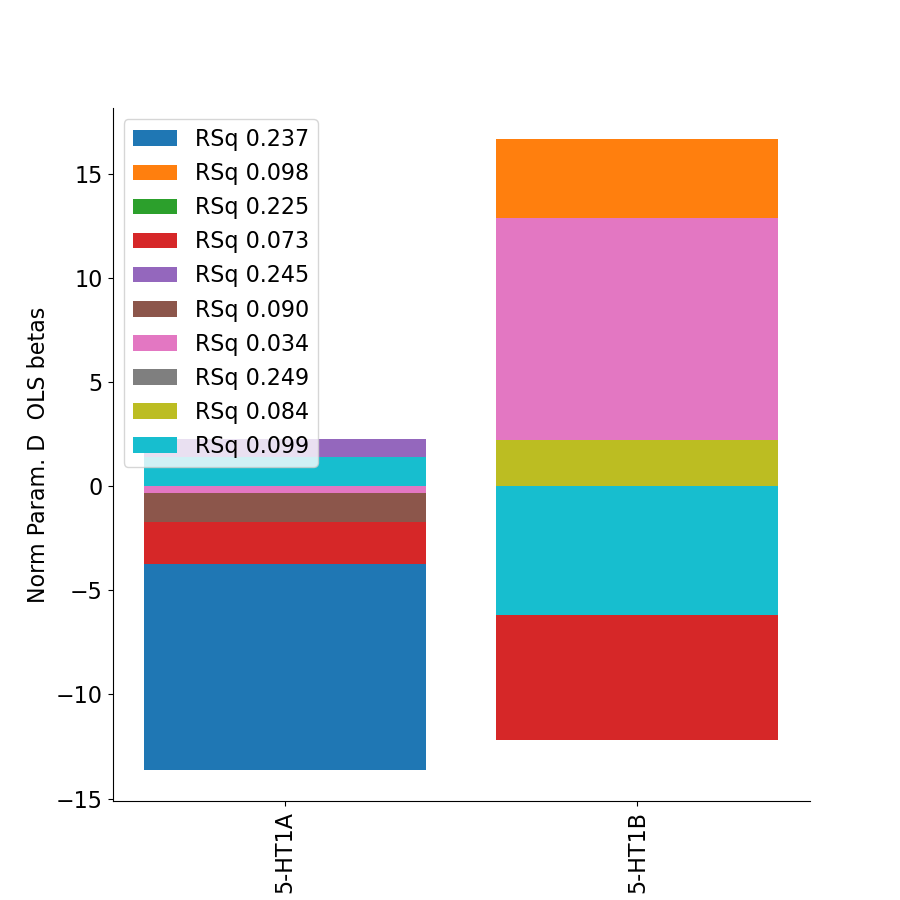

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_TF
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 30
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-38.9759  -0.0282]
wRSq 0.05735881747893046
wCC prediction 0.23949700933191292


<IPython.core.display.Javascript object>


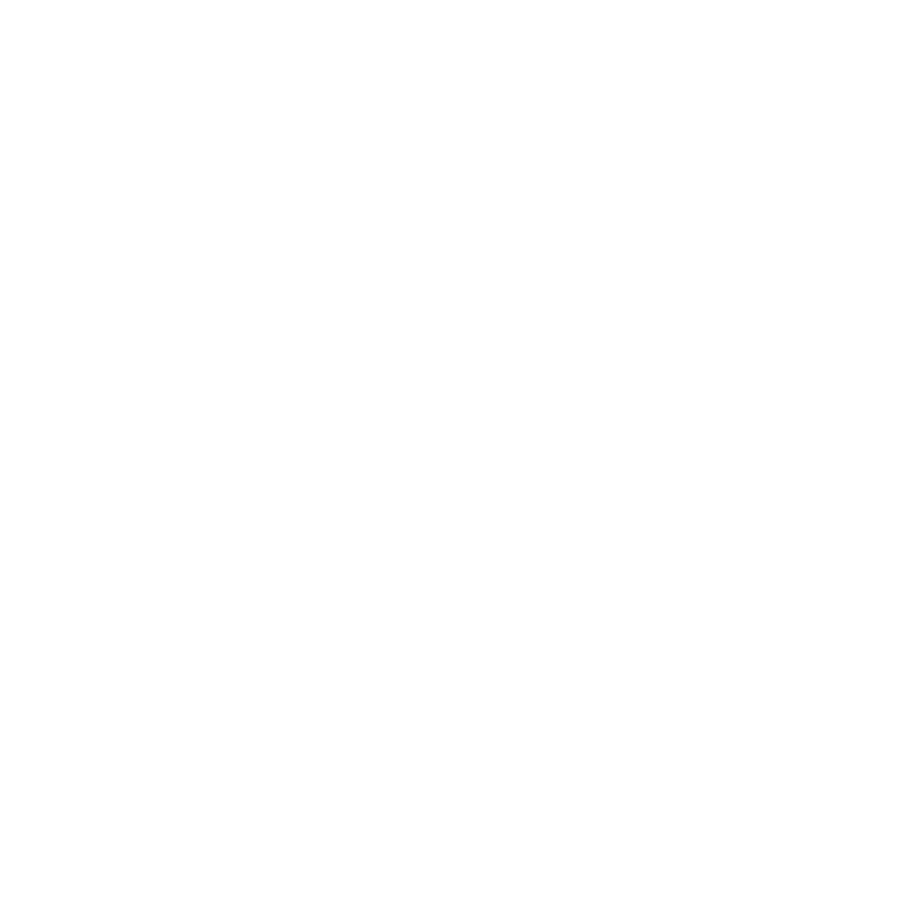

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_TGd
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_TGv
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_TPOJ1
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq gl

<IPython.core.display.Javascript object>


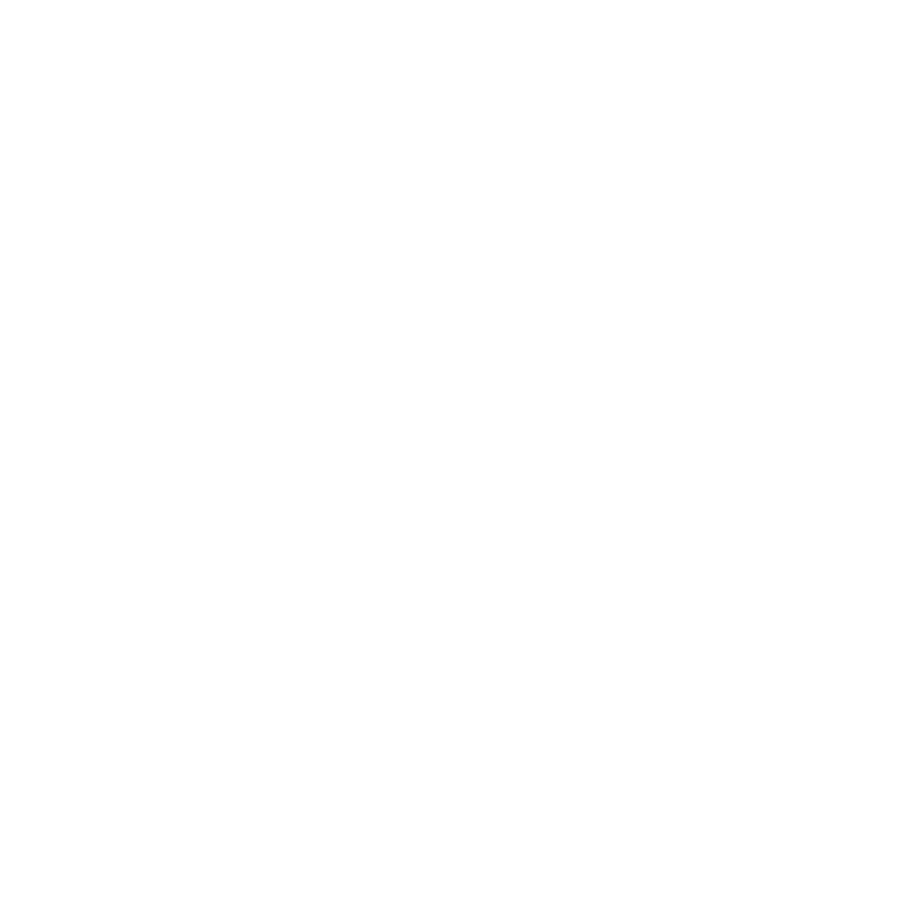

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_TPOJ3
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 580
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-1.4763 -0.015 ]
wRSq 0.024888893488109853
wCC prediction 0.15776214212576434


<IPython.core.display.Javascript object>


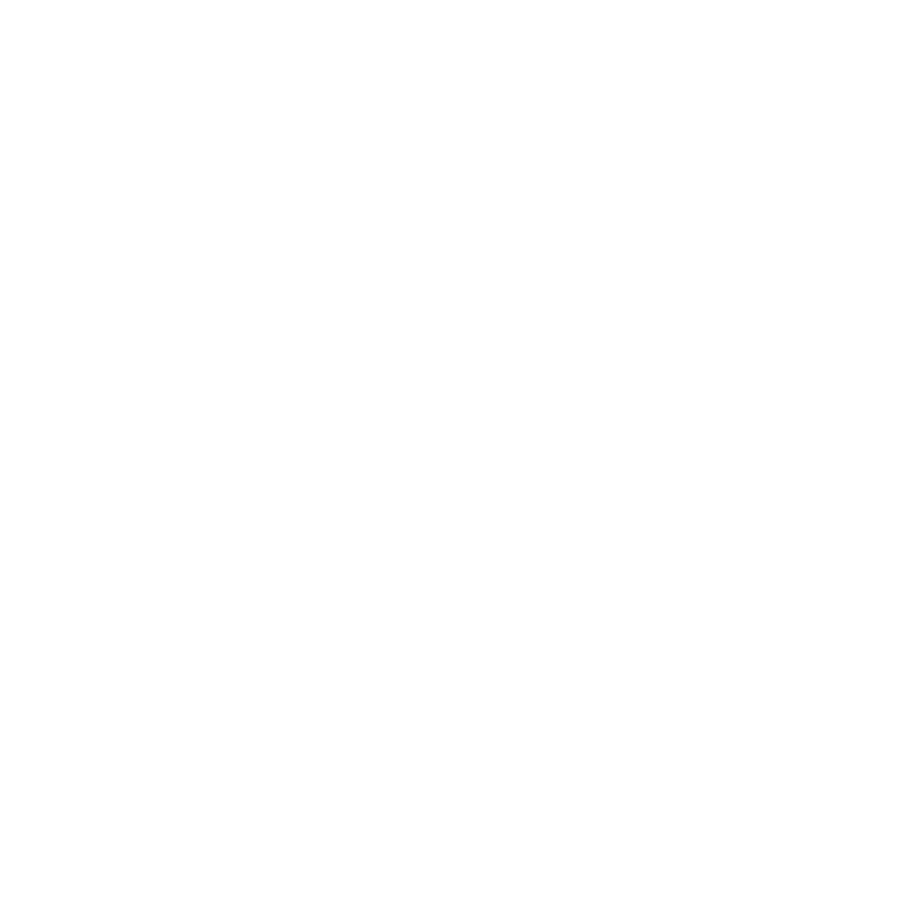

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_V1
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 4593
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [15.9004 -0.0008]
wRSq 0.45837091529595164
wCC prediction 0.6770309559362501


<IPython.core.display.Javascript object>


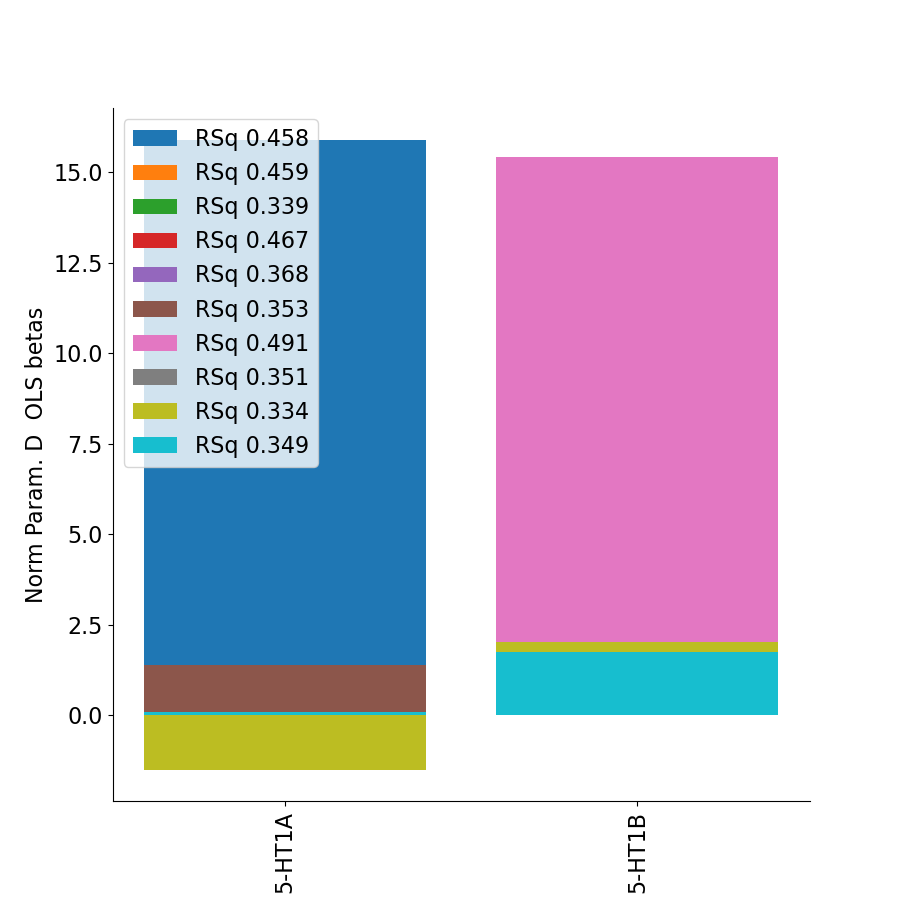

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_V2
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 3472
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [9.8033 0.0153]
wRSq 0.19815134543919322
wCC prediction 0.4451419385310634


<IPython.core.display.Javascript object>


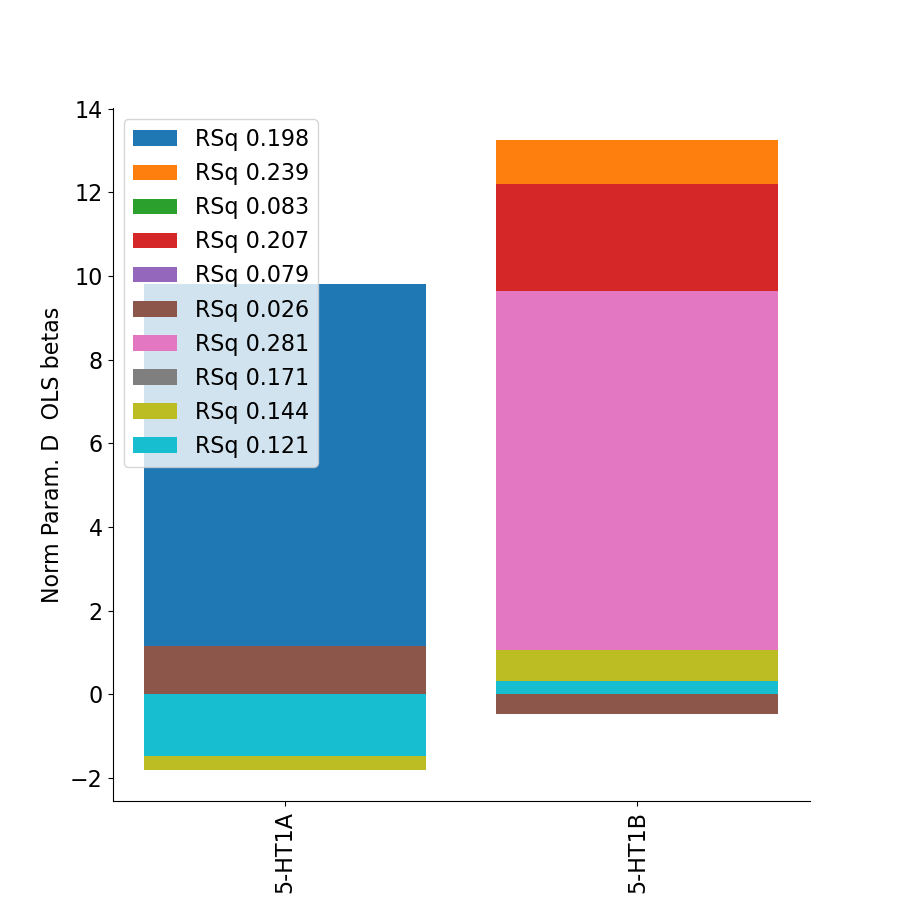

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_v23ab
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_V3
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 2929
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [ 2.0821 -0.0743]
wRSq 0.06385723738851556
wCC prediction 0.2526998959012755


<IPython.core.display.Javascript object>


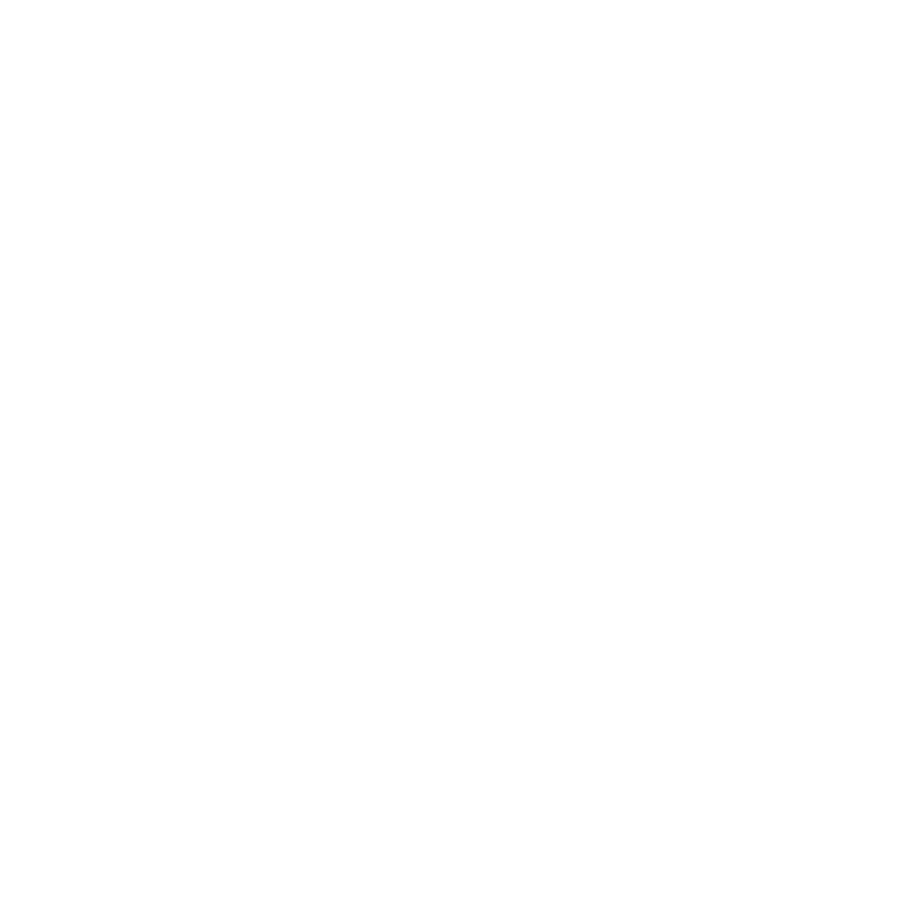

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_V3A
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 1205
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-3.2469  0.333 ]
wRSq 0.17859574744556672
wCC prediction 0.422605900864584


<IPython.core.display.Javascript object>


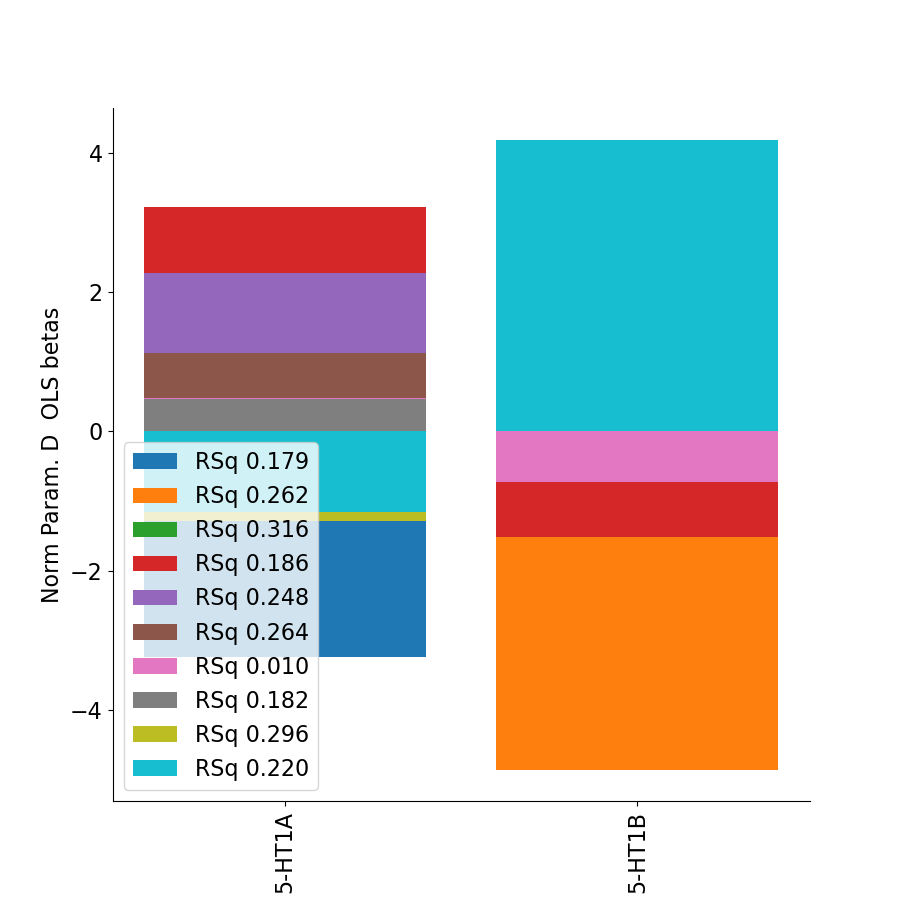

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_V3B
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 734
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [6.953  0.0187]
wRSq 0.36609014485774827
wCC prediction 0.605053836330081


<IPython.core.display.Javascript object>


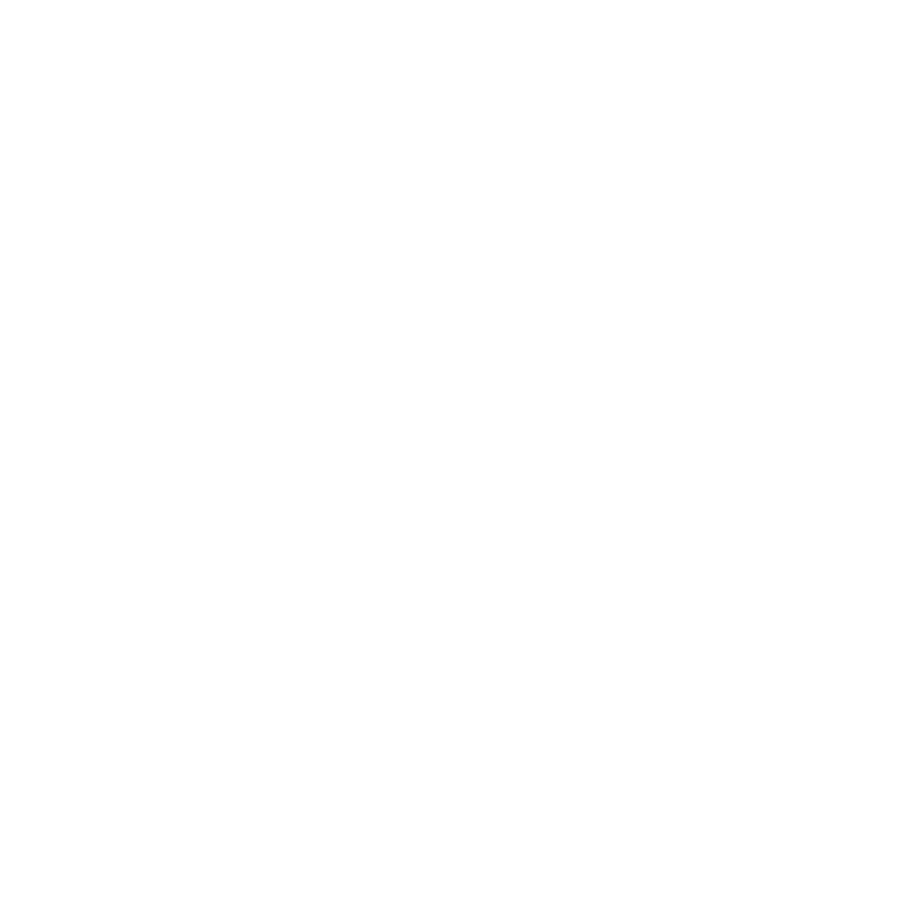

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_V3CD
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 768
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [ 3.2814 -0.0367]
wRSq 0.12230235767788444
wCC prediction 0.34971753984878173


<IPython.core.display.Javascript object>


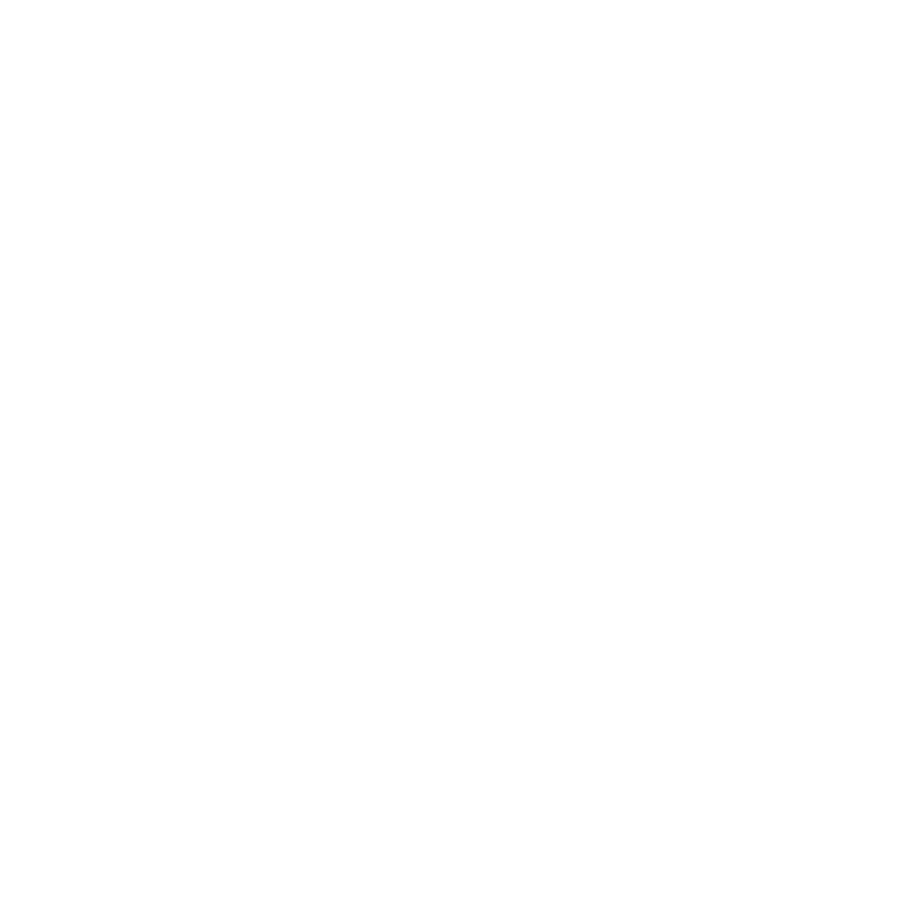

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_V4
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 2858
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-3.1574 -0.0984]
wRSq 0.1156874508264053
wCC prediction 0.3401285798435723


<IPython.core.display.Javascript object>


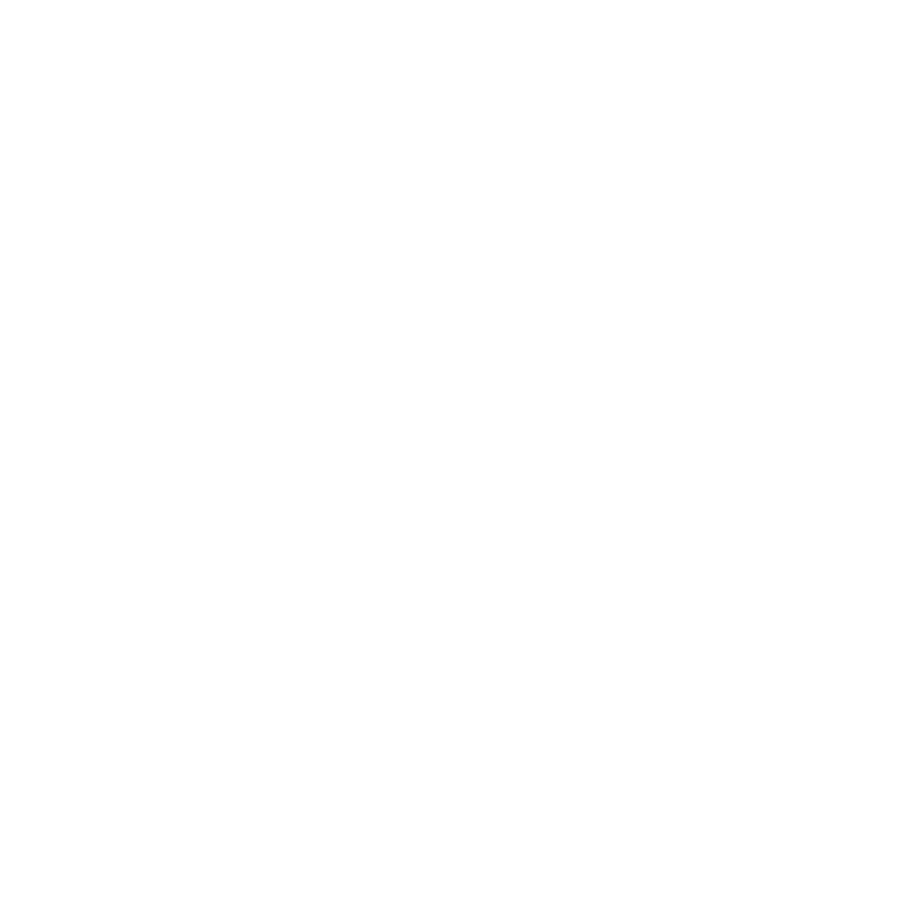

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_V4t
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 455
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [ 1.3604 -0.1418]
wRSq 0.11719204154157525
wCC prediction 0.34233323172250624


<IPython.core.display.Javascript object>


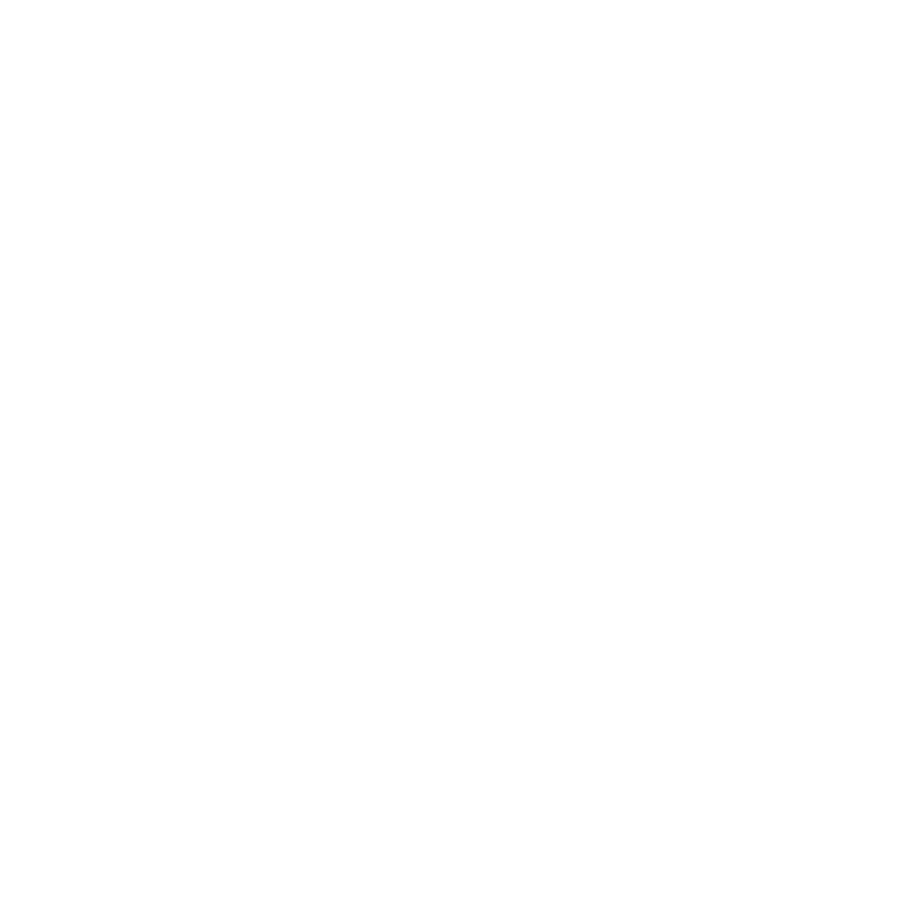

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_V6
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 246
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-4.1815 -0.0108]
wRSq 0.03926440591826719
wCC prediction 0.1981524814840009


<IPython.core.display.Javascript object>


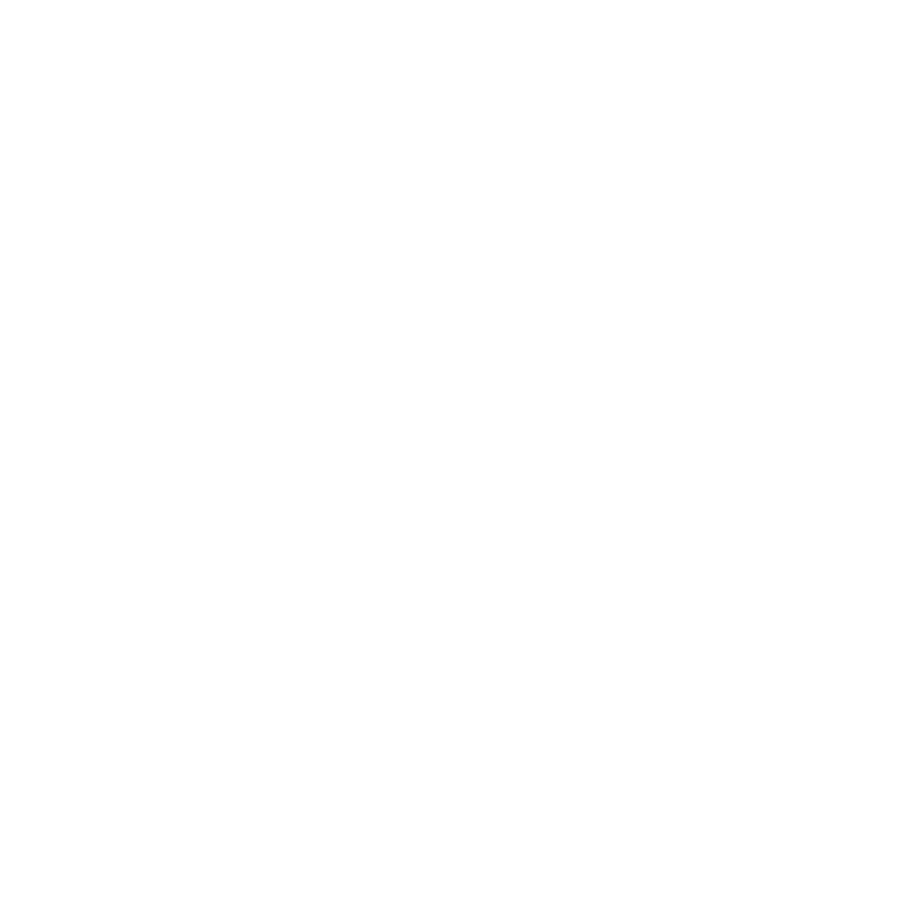

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_V6A
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 493
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [1.2129 0.067 ]
wRSq 0.00880855897463606
wCC prediction 0.09385392359745036


<IPython.core.display.Javascript object>


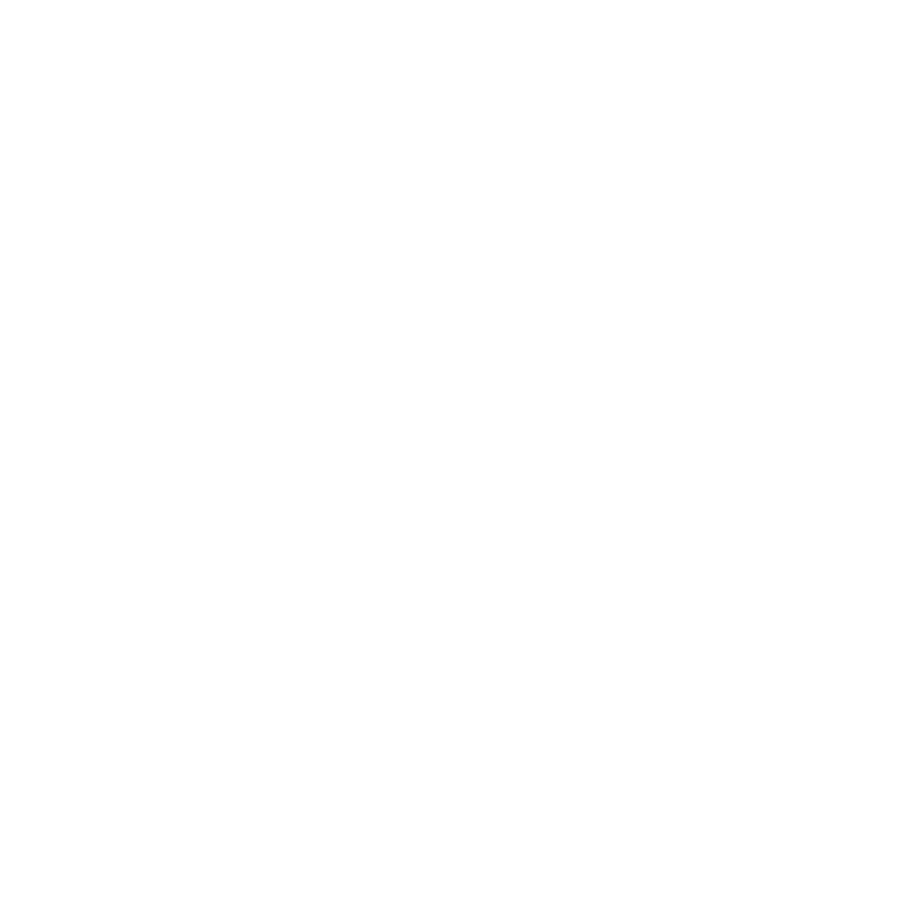

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_V7
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 560
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [2.1393 0.0392]
wRSq 0.05368618941519021
wCC prediction 0.23170280407278254


<IPython.core.display.Javascript object>


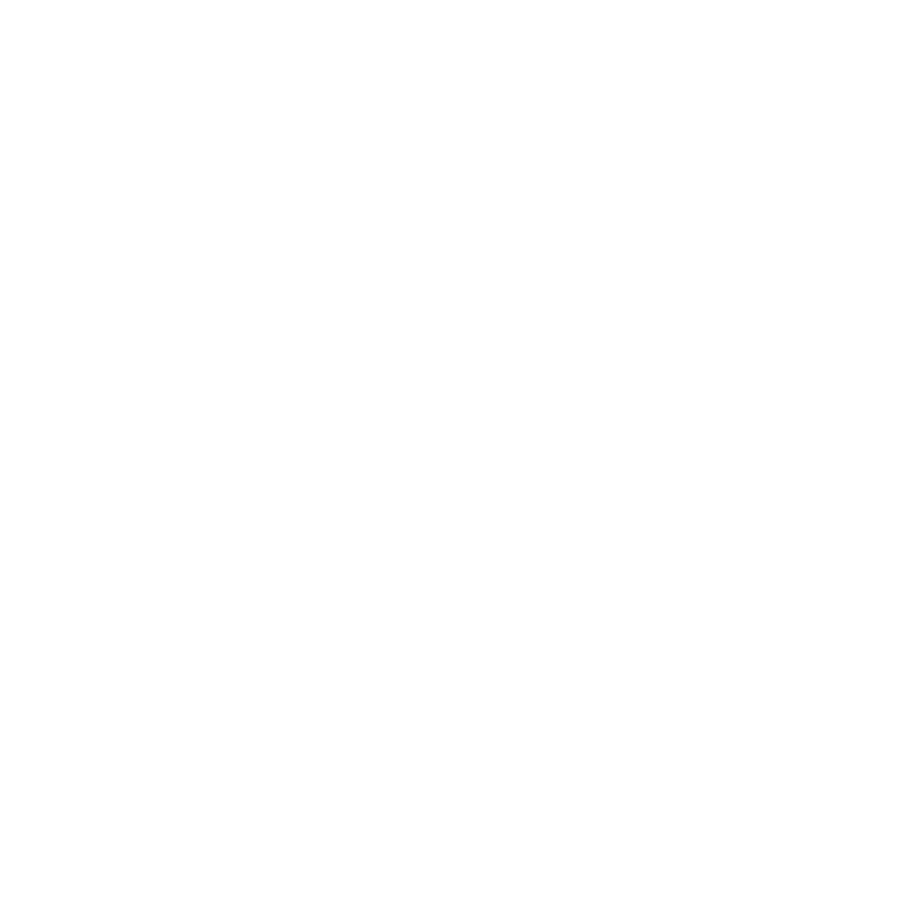

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_V8
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 653
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-6.7132  0.0043]
wRSq 0.22498445463741024
wCC prediction 0.4743252624912678


<IPython.core.display.Javascript object>


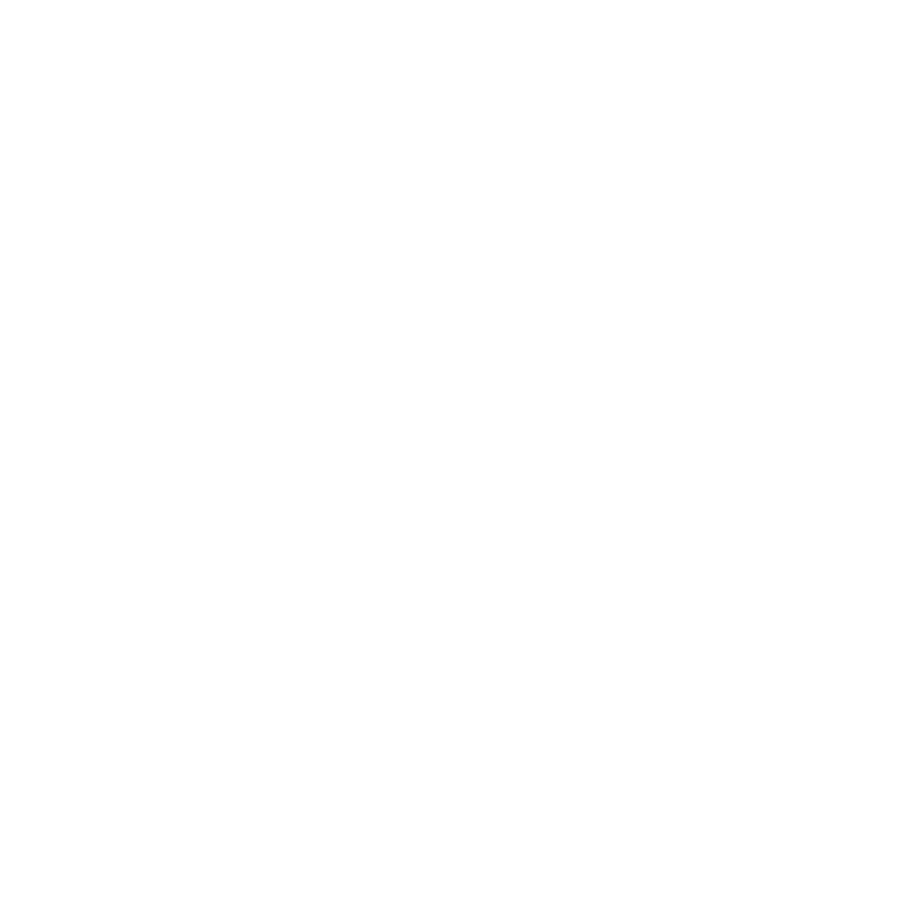

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_VIP
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 1224
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-8.1785  0.0004]
wRSq 0.09872804160656512
wCC prediction 0.31421018698725395


<IPython.core.display.Javascript object>


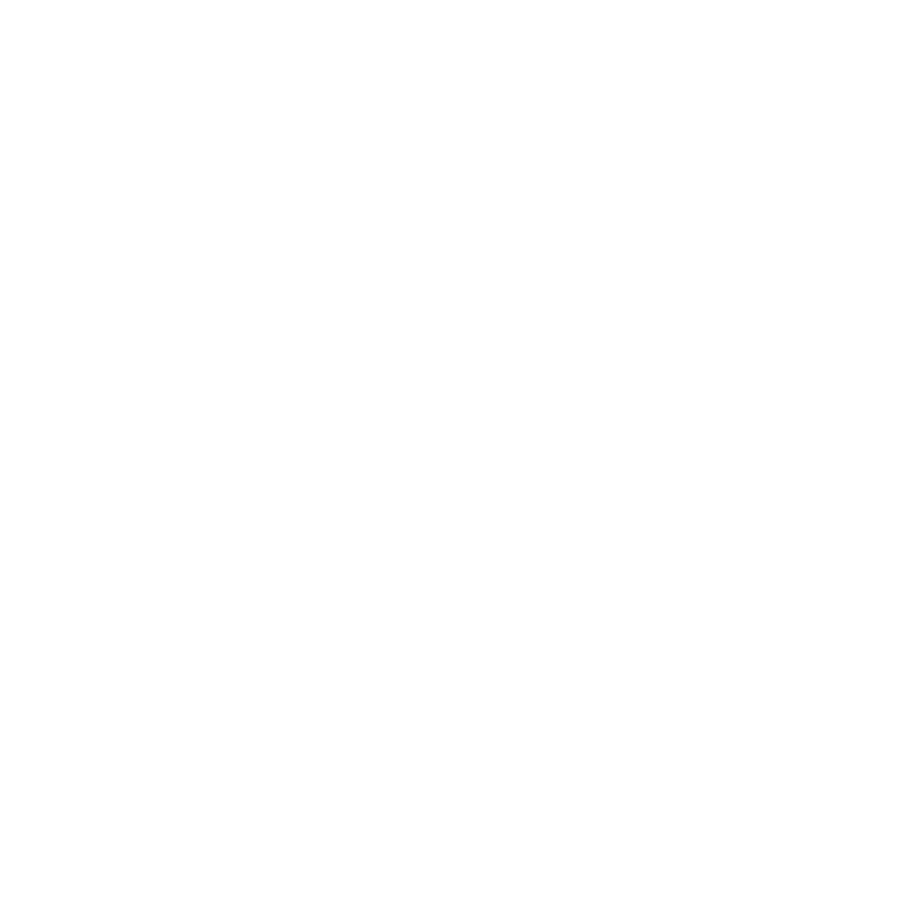

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_VMV1
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 44
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [ 4.1518 -0.1319]
wRSq 0.36596438709959567
wCC prediction 0.6049499046198747


<IPython.core.display.Javascript object>


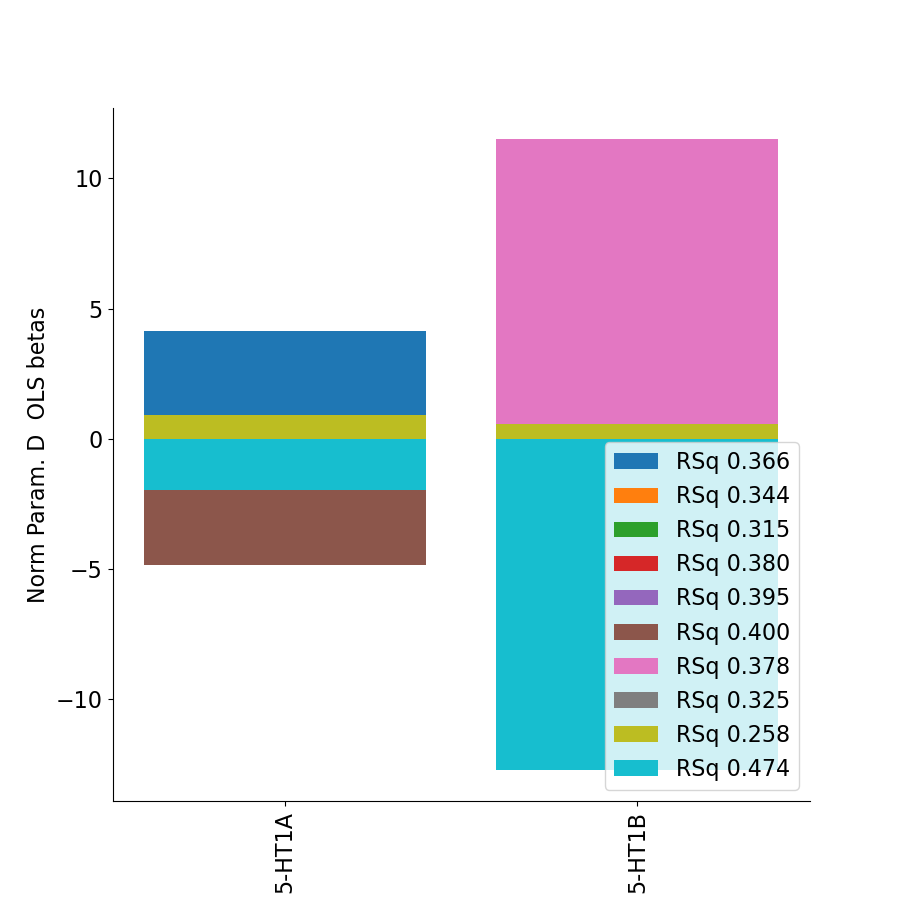

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_VMV2
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 541
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [ 4.1081 -0.0548]
wRSq 0.207469051596466
wCC prediction 0.45548770740434474


<IPython.core.display.Javascript object>


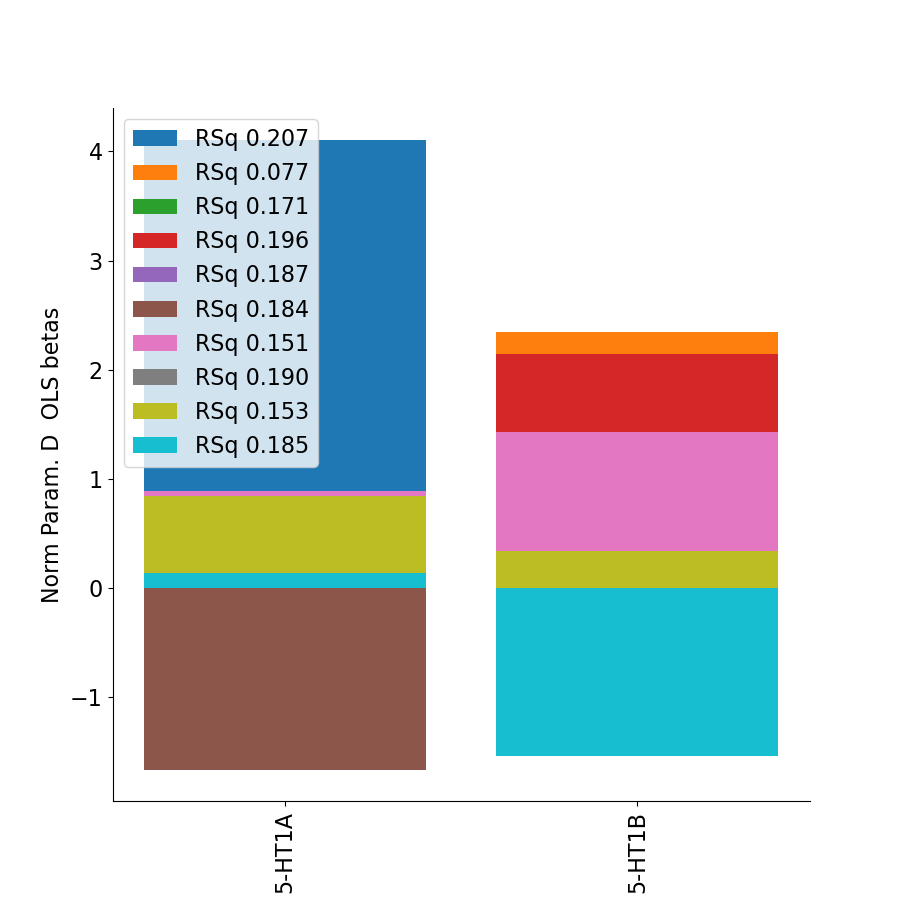

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_VMV3
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 662
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-4.3786 -0.027 ]
wRSq 0.08334362182773569
wCC prediction 0.2886929542398562


<IPython.core.display.Javascript object>


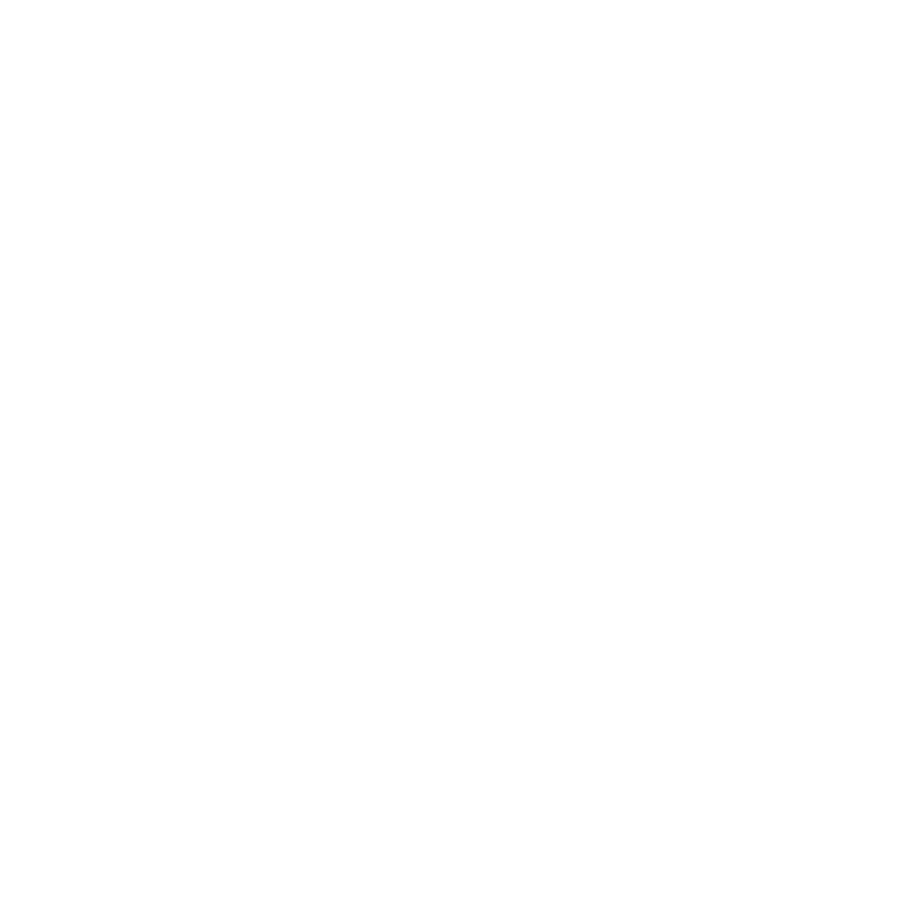

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_VVC
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 1002
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [ 1.0975 -0.1069]
wRSq 0.15415144776695489
wCC prediction 0.3926212523118879


<IPython.core.display.Javascript object>


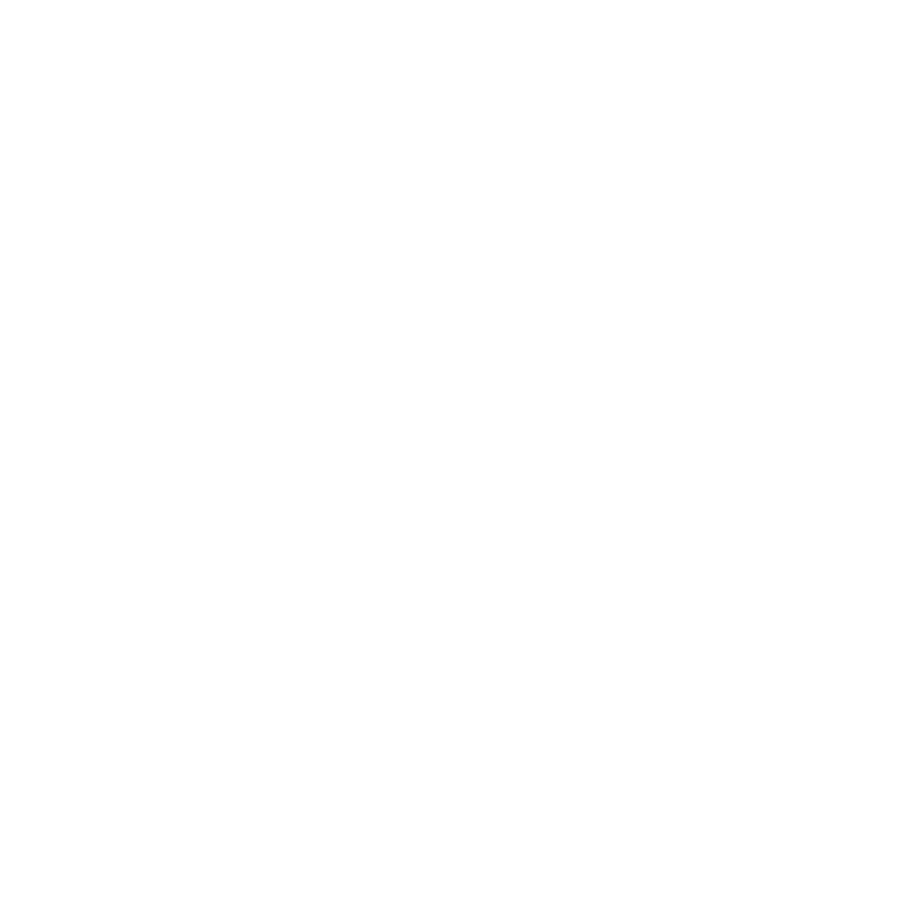

fit-task-BAR_fit-runs-all fsaverage_cvrsq combined
X-dims: ['5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 59942
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [2.3073 0.0907]
wRSq 0.45760389377637356
wCC prediction 0.676464259053184


<IPython.core.display.Javascript object>


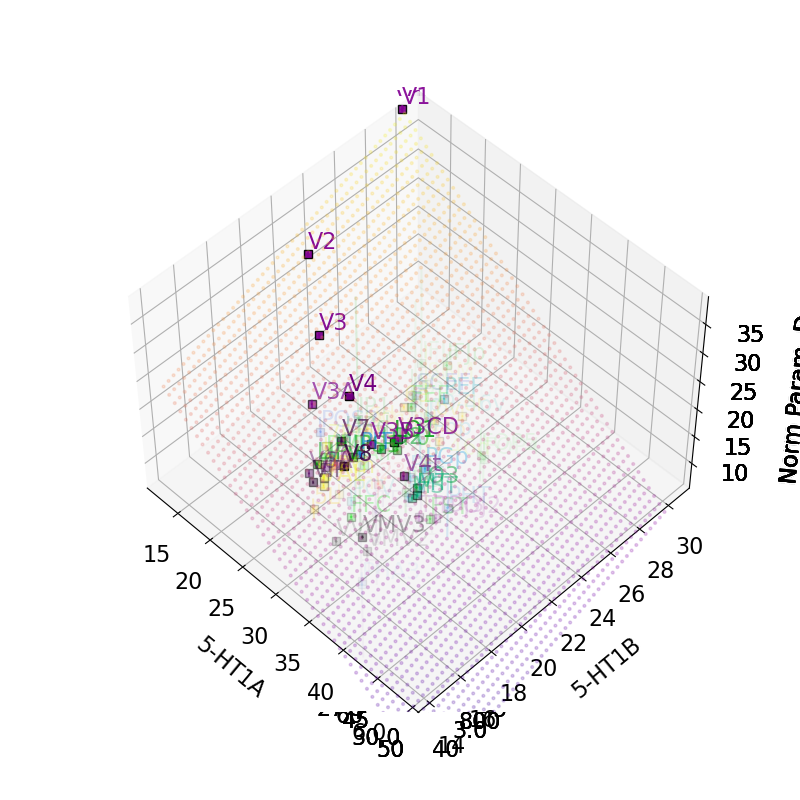

wR2 (fit on full data, eval on roi means), by sklearn: 0.018
wCC prediction (fit on full data, eval on roi means) 0.5198

wR2 (fit on roi means, eval on roi means), by sklearn: 0.3159
wCC prediction (fit on roi means, eval on roi means) 0.5620
Estimated OLS betas (fit on roi means) Norm Param. D Norm_abcd [-1.6899  0.0851]

wR2 (fit on full data, eval on full data), by sklearn: 0.4576
wCC prediction (fit on full data, eval on full data) 0.6765
Estimated OLS betas (fit on full data) Norm Param. D Norm_abcd [2.3073 0.0907]


<IPython.core.display.Javascript object>


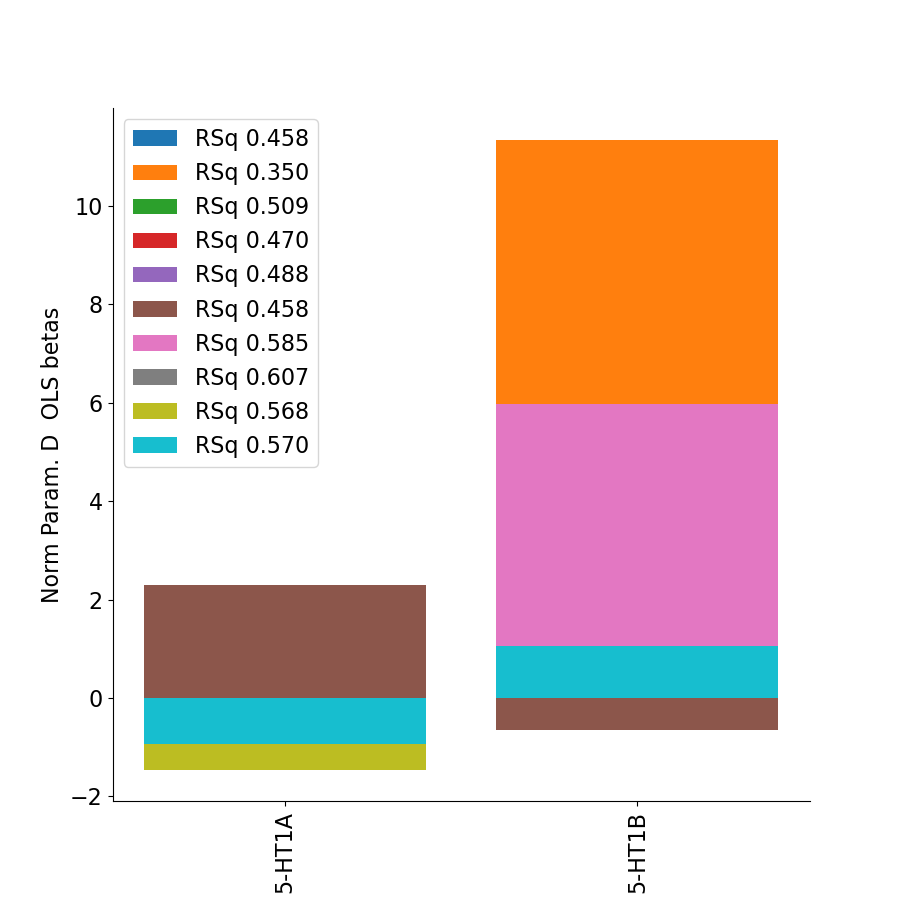

fsaverage fit-task-BAR_fit-runs-all fsaverage_cvrsq
Make sure bold_voxel_volume is specified in mm^3
Upsampling correction factor: [2.1213]
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimens

Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimen

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_45
X-dims: ['5-HT2A', '5-HTT']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT2A', '5-HTT', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_46
X-dims: ['5-HT2A', '5-HTT']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT2A', '5-HTT', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 407
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-0.5006 -0.4539]
wRSq 0.011643826278820657
wCC prediction 0.10790656272359185
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_47l
X-dims: ['5-HT2A', '5-HTT']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT2A', '5-HTT', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_FFC
X-dims: ['5-HT2A', '5-HTT']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT2A', '5-HTT', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 1265
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-0.4166  3.686 ]
wRSq 0.08604542960797579
wCC prediction 0.29333501258454614
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_FOP1
X-dims: ['5-HT2A', '5-HTT']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT2A', '5-HTT', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_FOP2
X-dims: ['5-HT2A', '5-HTT']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT2A', '5-HTT', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PHA1
X-dims: ['5-HT2A', '5-HTT']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT2A', '5-HTT', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PHA2
X-dims: ['5-HT2A', '5-HTT']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT2A', '5-HTT', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PHA3
X-dims: ['5-HT2A', '5-HTT']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT2A', '5-HTT', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 216
performing OLS (1D y)
Estimated OLS betas

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_V7
X-dims: ['5-HT2A', '5-HTT']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT2A', '5-HTT', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 560
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [0.2229 3.4742]
wRSq 0.053977972050291645
wCC prediction 0.23233159933657702
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_V8
X-dims: ['5-HT2A', '5-HTT']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT2A', '5-HTT', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 653
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-0.3273 -6.9824]
wRSq 0.2403264677631003
wCC prediction 0.49023103508764126
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_VIP
X-dims: ['5-HT2A', '5-

Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimen

Estimated OLS betas Norm Param. D Norm_abcd [ 0.7689 -0.0973]
wRSq 0.2645360453236818
wCC prediction 0.514330677019835
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_6a
X-dims: ['5-HT2A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT2A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 2974
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-0.0013  0.0254]
wRSq 0.019741043300423256
wCC prediction 0.14050282310481652
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_6d
X-dims: ['5-HT2A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT2A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 153
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [ 0.2151 -0.102 ]
wRSq 0.04

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_FOP5
X-dims: ['5-HT2A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT2A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 101
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-2.332   0.1293]
wRSq 0.15222559543414982
wCC prediction 0.390160986560868
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_FST
X-dims: ['5-HT2A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT2A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 781
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-0.2195  0.0173]
wRSq 0.008999538969790999
wCC prediction 0.09486589993138118
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_H
X-dims: ['5-HT2A

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PeEc
X-dims: ['5-HT2A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT2A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PEF
X-dims: ['5-HT2A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT2A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 705
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-0.048   0.0313]
wRSq 0.043729729612798196
wCC prediction 0.2091165455261685
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PF
X-dims: ['5-HT2A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT2A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A',

Estimated OLS betas Norm Param. D Norm_abcd [-0.8267 -0.0725]
wRSq 0.09529976087086711
wCC prediction 0.3087065935007984
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_V3A
X-dims: ['5-HT2A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT2A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 1205
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [0.7879 0.2134]
wRSq 0.3160002778198151
wCC prediction 0.5621390200117895
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_V3B
X-dims: ['5-HT2A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT2A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 734
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [0.1607 0.0317]
wRSq 0.19383

Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimen

Estimated OLS betas Norm Param. D Norm_abcd [-1.2574  1.1963]
wRSq 0.004299644770627498
wCC prediction 0.06557167658850312
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_47l
X-dims: ['5-HT1B', '5-HTT']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1B', '5-HTT', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_47m
X-dims: ['5-HT1B', '5-HTT']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1B', '5-HTT', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_47s
X-dims: ['5-HT1B', '5-HTT']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1B', '5-HTT', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Par

Estimated OLS betas Norm Param. D Norm_abcd [0.0226 5.5923]
wRSq 0.07082267076320525
wCC prediction 0.26612529147603636
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_FOP1
X-dims: ['5-HT1B', '5-HTT']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1B', '5-HTT', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_FOP2
X-dims: ['5-HT1B', '5-HTT']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1B', '5-HTT', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_FOP3
X-dims: ['5-HT1B', '5-HTT']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1B', '5-HTT', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Par

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_p47r
X-dims: ['5-HT1B', '5-HTT']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1B', '5-HTT', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_p9-46v
X-dims: ['5-HT1B', '5-HTT']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1B', '5-HTT', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 93
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-4.4509 -0.4704]
wRSq 0.028628781216161858
wCC prediction 0.16920041730492852
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PBelt
X-dims: ['5-HT1B', '5-HTT']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1B', '5-HTT', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A',

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_V2
X-dims: ['5-HT1B', '5-HTT']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1B', '5-HTT', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 3472
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-0.7874 12.2028]
wRSq 0.20747704634241237
wCC prediction 0.4554964833480193
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_v23ab
X-dims: ['5-HT1B', '5-HTT']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1B', '5-HTT', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_V3
X-dims: ['5-HT1B', '5-HTT']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1B', '5-HTT', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HT

fsaverage fit-task-BAR_fit-runs-all fsaverage_cvrsq
Make sure bold_voxel_volume is specified in mm^3
Upsampling correction factor: [2.1213]
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimens

Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimen

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_5m
X-dims: ['5-HT1B', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1B', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_5mv
X-dims: ['5-HT1B', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1B', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 370
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [ 3.582  -0.0635]
wRSq 0.11672322719584105
wCC prediction 0.3416478116362534
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_6a
X-dims: ['5-HT1B', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1B', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5

performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-0.328  -0.0599]
wRSq 0.09621695542235775
wCC prediction 0.31018858041900543
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_FOP1
X-dims: ['5-HT1B', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1B', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_FOP2
X-dims: ['5-HT1B', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1B', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_FOP3
X-dims: ['5-HT1B', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1B', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A'

Estimated OLS betas Norm Param. D Norm_abcd [ 3.0951 -0.0416]
wRSq 0.1273980089786202
wCC prediction 0.3569285768590407
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_OFC
X-dims: ['5-HT1B', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1B', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_OP1
X-dims: ['5-HT1B', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1B', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_OP2-3
X-dims: ['5-HT1B', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1B', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Nor

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_TPOJ3
X-dims: ['5-HT1B', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1B', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 580
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-0.9277 -0.0116]
wRSq 0.044399977705235516
wCC prediction 0.2107130221539131
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_V1
X-dims: ['5-HT1B', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1B', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 4593
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [1.0949 0.0625]
wRSq 0.36800284954246143
wCC prediction 0.6066323841853993
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_V2
X-dims: ['5-HT1B

wR2 (fit on full data, eval on roi means), by sklearn: 0.286
wCC prediction (fit on full data, eval on roi means) 0.6409

wR2 (fit on roi means, eval on roi means), by sklearn: 0.4326
wCC prediction (fit on roi means, eval on roi means) 0.6577
Estimated OLS betas (fit on roi means) Norm Param. D Norm_abcd [1.3276 0.0405]

wR2 (fit on full data, eval on full data), by sklearn: 0.4881
wCC prediction (fit on full data, eval on full data) 0.6986
Estimated OLS betas (fit on full data) Norm Param. D Norm_abcd [0.9488 0.0692]
fsaverage fit-task-BAR_fit-runs-all fsaverage_cvrsq
Make sure bold_voxel_volume is specified in mm^3
Upsampling correction factor: [2.1213]
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5

Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimen

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_33pr
X-dims: ['5-HT1B', '5-HT2A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1B', '5-HT2A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_3a
X-dims: ['5-HT1B', '5-HT2A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1B', '5-HT2A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_3b
X-dims: ['5-HT1B', '5-HT2A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1B', '5-HT2A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_AVI
X-dims: ['5-HT1B', '5-HT2A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1B', '5-HT2A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 58
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-6.9994  0.8295]
wRSq 0.11093332599919137
wCC prediction 0.3330665489045567
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_d23ab
X-dims: ['5-HT1B', '5-HT2A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1B', '5-HT2A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_d32
X-dims: ['5-HT1B', '5-HT2A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1B', '5-HT2A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A',

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_LO3
X-dims: ['5-HT1B', '5-HT2A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1B', '5-HT2A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 672
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [1.0873 0.0768]
wRSq 0.024700763454690744
wCC prediction 0.15716476530918316
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_MBelt
X-dims: ['5-HT1B', '5-HT2A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1B', '5-HT2A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_MI
X-dims: ['5-HT1B', '5-HT2A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1B', '5-HT2A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A',

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_STGa
X-dims: ['5-HT1B', '5-HT2A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1B', '5-HT2A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_STSda
X-dims: ['5-HT1B', '5-HT2A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1B', '5-HT2A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_STSdp
X-dims: ['5-HT1B', '5-HT2A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1B', '5-HT2A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage

Estimated OLS betas Norm Param. D Norm_abcd [ 0.8358 -0.1631]
wRSq 0.04373661889744118
wCC prediction 0.2091330172341065
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_VMV1
X-dims: ['5-HT1B', '5-HT2A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1B', '5-HT2A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 44
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-4.848   0.4839]
wRSq 0.39980811557206763
wCC prediction 0.6323038158765668
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_VMV2
X-dims: ['5-HT1B', '5-HT2A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1B', '5-HT2A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 541
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-1.6597  0.0982]
wRSq 0.

Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimen

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_44
X-dims: ['5-HT1A', '5-HTT']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', '5-HTT', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 2
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_45
X-dims: ['5-HT1A', '5-HTT']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', '5-HTT', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_46
X-dims: ['5-HT1A', '5-HTT']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', '5-HTT', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 407
performing OLS (1D y)
Estimated OLS betas Norm 

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_AVI
X-dims: ['5-HT1A', '5-HTT']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', '5-HTT', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 58
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [  2.0015 -36.7352]
wRSq 0.0844946057328625
wCC prediction 0.29067955850534566
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_d23ab
X-dims: ['5-HT1A', '5-HTT']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', '5-HTT', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_d32
X-dims: ['5-HT1A', '5-HTT']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', '5-HTT', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-

performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [ 0.0297 -0.5762]
wRSq 0.0007415686463497773
wCC prediction 0.027231758047354844
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_MBelt
X-dims: ['5-HT1A', '5-HTT']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', '5-HTT', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_MI
X-dims: ['5-HT1A', '5-HTT']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', '5-HTT', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_MIP
X-dims: ['5-HT1A', '5-HTT']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', '5-HTT', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_V3A
X-dims: ['5-HT1A', '5-HTT']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', '5-HTT', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 1205
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [ 0.4814 -0.7277]
wRSq 0.009595113869733773
wCC prediction 0.097954652108686
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_V3B
X-dims: ['5-HT1A', '5-HTT']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', '5-HTT', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 734
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [0.2903 8.8163]
wRSq 0.36228159355401524
wCC prediction 0.6018983249303951
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_V3CD
X-dims: ['5-HT1A', '

Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimen

ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_5mv
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 370
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [ 2.3197 -0.0985]
wRSq 0.14786559716928416
wCC prediction 0.38453295979575525
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_6a
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 2974
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_EC
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_FEF
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 1242
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [ 0.6159 -0.0056]
wRSq 0.038592231937579546
wCC prediction 0.1964490568508271
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_FFC
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A',

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_MBelt
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_MI
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_MIP
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 1433
performing OLS (1D y)
Estimated OLS 

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_s6-8
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_SCEF
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 297
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-2.9674  0.2149]
wRSq 0.07086138661730979
wCC prediction 0.2661980214376317
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_SFL
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A'

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_VIP
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 1224
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [ 0.3579 -0.0368]
wRSq 0.04668077189635855
wCC prediction 0.2160573347432544
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_VMV1
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 44
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [ 0.344  -0.2326]
wRSq 0.3247665306795895
wCC prediction 0.5698829096223096
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_VMV2
X-dims: ['5-HT1

Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimen

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_45
X-dims: ['5-HT1A', '5-HT2A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', '5-HT2A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_46
X-dims: ['5-HT1A', '5-HT2A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', '5-HT2A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 407
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-1.4899 -0.2836]
wRSq 0.03648072925162771
wCC prediction 0.190999291233312
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_47l
X-dims: ['5-HT1A', '5-HT2A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', '5-HT2A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_8C
X-dims: ['5-HT1A', '5-HT2A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', '5-HT2A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 8
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_9-46d
X-dims: ['5-HT1A', '5-HT2A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', '5-HT2A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 32
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-3.5587 -2.6501]
wRSq 0.19313528718884077
wCC prediction 0.43947159997984014
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_9a
X-dims: ['5-HT1A', '5-HT2A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', '5-HT2A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', 

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_IPS1
X-dims: ['5-HT1A', '5-HT2A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', '5-HT2A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 1187
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-0.0374 -0.2839]
wRSq 0.029888901644274046
wCC prediction 0.17288406995519898
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_LBelt
X-dims: ['5-HT1A', '5-HT2A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', '5-HT2A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_LIPd
X-dims: ['5-HT1A', '5-HT2A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', '5-HT2A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PGs
X-dims: ['5-HT1A', '5-HT2A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', '5-HT2A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PH
X-dims: ['5-HT1A', '5-HT2A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', '5-HT2A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 1312
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [0.266  0.0474]
wRSq 0.015979259892984543
wCC prediction 0.1264090973505642
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PHA1
X-dims: ['5-HT1A', '5-HT2A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', '5-HT2A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', 

Estimated OLS betas Norm Param. D Norm_abcd [-1.2221  0.1359]
wRSq 0.30476124359857604
wCC prediction 0.5520518486506278
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_V4
X-dims: ['5-HT1A', '5-HT2A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', '5-HT2A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 2858
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-2.1271  0.4833]
wRSq 0.4981815988201852
wCC prediction 0.7058198061971523
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_V4t
X-dims: ['5-HT1A', '5-HT2A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', '5-HT2A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 455
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [ 0.4687 -0.861 ]
wRSq 0.03

Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimen

Estimated OLS betas Norm Param. D Norm_abcd [-5.6928  8.214 ]
wRSq 0.08600924409152999
wCC prediction 0.2932733265940322
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_47l
X-dims: ['5-HT1A', '5-HT1B']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', '5-HT1B', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_47m
X-dims: ['5-HT1A', '5-HT1B']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', '5-HT1B', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_47s
X-dims: ['5-HT1A', '5-HT1B']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', '5-HT1B', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_d23ab
X-dims: ['5-HT1A', '5-HT1B']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', '5-HT1B', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_d32
X-dims: ['5-HT1A', '5-HT1B']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', '5-HT1B', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_DVT
X-dims: ['5-HT1A', '5-HT1B']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', '5-HT1B', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 728
performing OLS (1D y)
Estimated OLS 

Estimated OLS betas Norm Param. D Norm_abcd [0.0155 1.0502]
wRSq 0.023166360571331035
wCC prediction 0.1522049952246339
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_MBelt
X-dims: ['5-HT1A', '5-HT1B']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', '5-HT1B', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_MI
X-dims: ['5-HT1A', '5-HT1B']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', '5-HT1B', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_MIP
X-dims: ['5-HT1A', '5-HT1B']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', '5-HT1B', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_s6-8
X-dims: ['5-HT1A', '5-HT1B']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', '5-HT1B', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_SCEF
X-dims: ['5-HT1A', '5-HT1B']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', '5-HT1B', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 297
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-1.8105  7.9132]
wRSq 0.028725028708330824
wCC prediction 0.1694845972598413
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_SFL
X-dims: ['5-HT1A', '5-HT1B']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', '5-HT1B', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A

Estimated OLS betas Norm Param. D Norm_abcd [-0.946   1.8073]
wRSq 0.042072168791218
wCC prediction 0.20511501356852965
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_V8
X-dims: ['5-HT1A', '5-HT1B']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', '5-HT1B', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 653
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-0.3358  0.2133]
wRSq 0.040531475260585315
wCC prediction 0.20132430370073368
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_VIP
X-dims: ['5-HT1A', '5-HT1B']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', '5-HT1B', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 1224
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [0.1727 1.2791]
wRSq 0.04

0

In [18]:
#%%capture
#display(HTML("<style>div.output_scroll { height: 150em; }</style>"))
pl.close('all')
#fsnative vox vol for correction: 4.8270
#generalized quantitative parameter plots
#'Eccentricity'#'Suppression Index (full)'#'Suppression Index#'Size (fwhmax)'#'Surround Size (fwatmin)'
#'Norm Param. B'#''Ratio (B/D)'#'Norm Param. D'#'RSq'#'CCrsq_task-1R'#'CSS Exponent'#'Amplitude'
#'Surround Amplitude'#'Size (sigma_1)'##'Size (sigma_2)'
#'Size ratio (sigma_2/sigma_1)'#C/A#'B/A'#'D/C'#'D/A'#'B/C'#'Surround volume (full)'#'Centre volume (full)'
#'(A+B)/(C+D)'#'(A*B)/(C*D)'#'(A*D)/(C*B)'#'(A+D)/(C+B)'#'Point-stim derivative'#'(C(A+B))/(A(C+D))'
#'Min/Max Response Ratio'#'Max/Min Response Ratio'#'A(C+D)/C(A+B)'##Min/Max Response Ratio (with BD)'
#'A/C'
####DoG
#'Surround volume (full)'
#'Surround/Centre Amplitude' 
#'Surround-Centre Amplitude'
#'Surround-Centre Volume'

#parameters = ['Eccentricity', 'Norm Param. B', 'Norm Param. D', 'Size (sigma_1)','Size (sigma_2)', 'Amplitude','Surround Amplitude', 'Polar Angle',
#              '5-HT1A', '5-HT1B', '5-HT2A', '5-HT4', '5-HTT', 'GABA_A','Amplitude','Surround Amplitude', 'RSq']#,]#'Size ratio (sigma_2/sigma_1)']# 'Size (sigma_1)', 'Size (sigma_2)', 'Amplitude','Surround Amplitude']

parameters = ['5-HT1A', '5-HT1B', '5-HT2A', 'GABA_A', '5-HTT','Norm Param. B', 'Norm Param. D','RSq']#, 'Eccentricity','Size (sigma_1)','Size (sigma_2)']#

x_dims_idx = [0,3]
y_dims_idx = [6]

#rois = ['custom.V1', 'custom.V2', 'custom.V3','custom.V3AB','custom.hV4','custom.LO','custom.TO','custom.IPS','all_custom']
#rois = ['V1', 'V2', 'V3','V3AB','hV4','LO','TO','VO','IPS']#, 'combined']#['Brain'] #'V1', 'V2', 'V3','V3AB','hV4','LO','TO','IPS','combined', 
#rois = [ 'V1', 'V2', 'V3', 'hV4', 'VO1', 'VO2', 'PHC1', 'PHC2', 'LO1', 'LO2', 'TO1', 'TO2', 'V3A', 'V3B', 'IPS0', 'IPS1', 'IPS2', 'IPS3', 'IPS4', 'IPS5', 'SPL1', 'FEF']
#rois = ['all_custom']
rois = [roi for roi in vis_res.idx_rois['fsaverage'] if 'glasser' in roi]
# rois = ['glasser_V1','glasser_V2','glasser_V3','glasser_V4','glasser_V3A','glasser_V7','glasser_V3B','glasser_V3CD',
# 'glasser_LO1','glasser_LO2','glasser_PIT','glasser_V8','glasser_VMV3',
# 'glasser_IPS1','glasser_IP0','glasser_PGp','glasser_LO3','glasser_MT','glasser_V4t','glasser_FFC']
rois.append('combined')
        
rsq_thresh = 0.0
save_figures= False
figure_path = '/Volumes/Crucial X8/PRFMapping/Figures/attemptwnames_wang_ecc65rsq015/ols'

space_names = 'fsaverage'
#set to 'all' to plot all analyses
analysis_names = 'fit-task-BAR_fit-runs-all'#-CVmedian

subject_ids = ['fsaverage_cvrsq']#'fsaverage_hcp1sthalf', 'fsaverage_hcp2ndhalf']

threshold_li = filters.threshold_li(vis_res.main_dict[space_names][analysis_names][subject_ids[0]]['Processed Results']['#Subjects with CVRSq>0']['Norm_abcd'])

vis_res.set_alpha(only_models=['Norm_abcd'], ecc_min=0.0, ecc_max=8.0, min_number_sjs=threshold_li)

#for y_dims_idx in [[5],[6]]:
#    for x_dims_idx in [[3, 4], [2, 4], [2, 3], [1, 4], [1, 3], [1, 2], [0, 4], [0, 3], [0, 2], [0, 1]]:
for x_dims_idx in [[3, 4], [2, 4], [2, 3], [1, 4], [1, 3], [1, 2], [0, 4], [0, 3], [0, 2], [0, 1]]:    

    vis_res.multidim_analysis(parameters, rois, rsq_thresh, save_figures, figure_path, space_names = space_names, parameter_toplevel='Receptor Maps', rsq_weights= True,
                    analysis_names = analysis_names, subject_ids = subject_ids, x_dims_idx=x_dims_idx, y_dims_idx=y_dims_idx,
                          zscore_data= False, zscore_data_across_rois = False, 
                          size_response_curves = False, plot_corr_matrix = False, perform_ols = True, polar_plots = False,
                             cv_regression = False, bold_voxel_volume=4.096, zconfint_err_alpha=None, quantile_exclusion=0.999,
                          #vis_pca_comps_rois: fr which rois to make pca comp beta plots; 
                          #vis_pca_comps_axes: which comps to use in 2d plot of mean pca comp per roi
                        perform_pca = False, vis_pca_pycortex = True, vis_pca_comps_rois = ['combined'], vis_pca_comps_axes = [0,1], rsq_alpha_pca_plot = True,
                          perform_pls = False, vis_pls_pycortex = False)

os.system(f"open {sound_file}")


## PCA

HCP fit-task-BAR_fit-runs-all 100610
HCP fit-task-BAR_fit-runs-all 102311
HCP fit-task-BAR_fit-runs-all 102816
HCP fit-task-BAR_fit-runs-all 104416
HCP fit-task-BAR_fit-runs-all 105923
HCP fit-task-BAR_fit-runs-all 108323
HCP fit-task-BAR_fit-runs-all 109123
HCP fit-task-BAR_fit-runs-all 111312
HCP fit-task-BAR_fit-runs-all 111514
HCP fit-task-BAR_fit-runs-all 114823
HCP fit-task-BAR_fit-runs-all 115017
HCP fit-task-BAR_fit-runs-all 115825
HCP fit-task-BAR_fit-runs-all 116726
HCP fit-task-BAR_fit-runs-all 118225
HCP fit-task-BAR_fit-runs-all 125525
HCP fit-task-BAR_fit-runs-all 126426
HCP fit-task-BAR_fit-runs-all 128935
HCP fit-task-BAR_fit-runs-all 130114
HCP fit-task-BAR_fit-runs-all 130518
HCP fit-task-BAR_fit-runs-all 131217
HCP fit-task-BAR_fit-runs-all 131722
HCP fit-task-BAR_fit-runs-all 132118
HCP fit-task-BAR_fit-runs-all 134627
HCP fit-task-BAR_fit-runs-all 134829
HCP fit-task-BAR_fit-runs-all 135124
HCP fit-task-BAR_fit-runs-all 137128
HCP fit-task-BAR_fit-runs-all 140117
H

fsaverage fit-task-BAR_fit-runs-all 165436
fsaverage fit-task-BAR_fit-runs-all 167036
fsaverage fit-task-BAR_fit-runs-all 167440
fsaverage fit-task-BAR_fit-runs-all 169040
fsaverage fit-task-BAR_fit-runs-all 169343
fsaverage fit-task-BAR_fit-runs-all 169444
fsaverage fit-task-BAR_fit-runs-all 169747
fsaverage fit-task-BAR_fit-runs-all 171633
fsaverage fit-task-BAR_fit-runs-all 172130
fsaverage fit-task-BAR_fit-runs-all 173334
fsaverage fit-task-BAR_fit-runs-all 175237
fsaverage fit-task-BAR_fit-runs-all 176542
fsaverage fit-task-BAR_fit-runs-all 177140
fsaverage fit-task-BAR_fit-runs-all 177645
fsaverage fit-task-BAR_fit-runs-all 177746
fsaverage fit-task-BAR_fit-runs-all 178142
fsaverage fit-task-BAR_fit-runs-all 178243
fsaverage fit-task-BAR_fit-runs-all 178647
fsaverage fit-task-BAR_fit-runs-all 180533
fsaverage fit-task-BAR_fit-runs-all 181232
fsaverage fit-task-BAR_fit-runs-all 181636
fsaverage fit-task-BAR_fit-runs-all 182436
fsaverage fit-task-BAR_fit-runs-all 182739
fsaverage f

Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size ratio (sigma_2/sigma_1) Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size ratio (sigma_2/sigma_1) Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size ratio (sigma_2/sigma_1) Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size ratio (sigma_2/sigma_1) Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd

Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size ratio (sigma_2/sigma_1) Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size ratio (sigma_2/sigma_1) Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size ratio (sigma_2/sigma_1) Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size ratio (sigma_2/sigma_1) Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd

Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size ratio (sigma_2/sigma_1) Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size ratio (sigma_2/sigma_1) Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size ratio (sigma_2/sigma_1) Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size ratio (sigma_2/sigma_1) Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd

Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size ratio (sigma_2/sigma_1) Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size ratio (sigma_2/sigma_1) Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size ratio (sigma_2/sigma_1) Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size ratio (sigma_2/sigma_1) Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_23c
X-dims: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A']
Y-dims: ['Size ratio (sigma_2/sigma_1) Norm_abcd', 'Eccentricity Norm_abcd', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd']
alldims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Size ratio (sigma_2/sigma_1) Norm_abcd', 'Eccentricity Norm_abcd', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size ratio (sigma_2/sigma_1) Norm_abcd']
Sample size: 264
performing PCA
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_23d
X-dims: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A']
Y-dims: ['Size ratio (sigma_2/sigma_1) Norm_abcd', 'Eccentricity Norm_abcd', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd']
alldims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Size ratio (sigma_2/sigma_1) Norm_abcd', 'Ecc

<IPython.core.display.Javascript object>


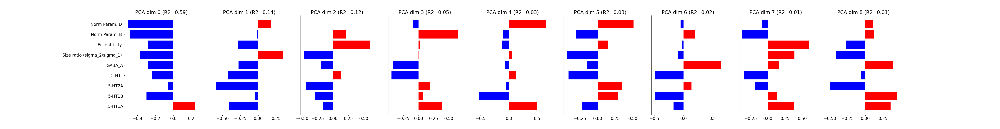

rsq thresh<0.15. setting pca pycortex vmax2=0.15
rsq thresh<0.15. setting pca pycortex vmax2=0.15
rsq thresh<0.15. setting pca pycortex vmax2=0.15
rsq thresh<0.15. setting pca pycortex vmax2=0.15
rsq thresh<0.15. setting pca pycortex vmax2=0.15
rsq thresh<0.15. setting pca pycortex vmax2=0.15
rsq thresh<0.15. setting pca pycortex vmax2=0.15
rsq thresh<0.15. setting pca pycortex vmax2=0.15
rsq thresh<0.15. setting pca pycortex vmax2=0.15


<IPython.core.display.Javascript object>


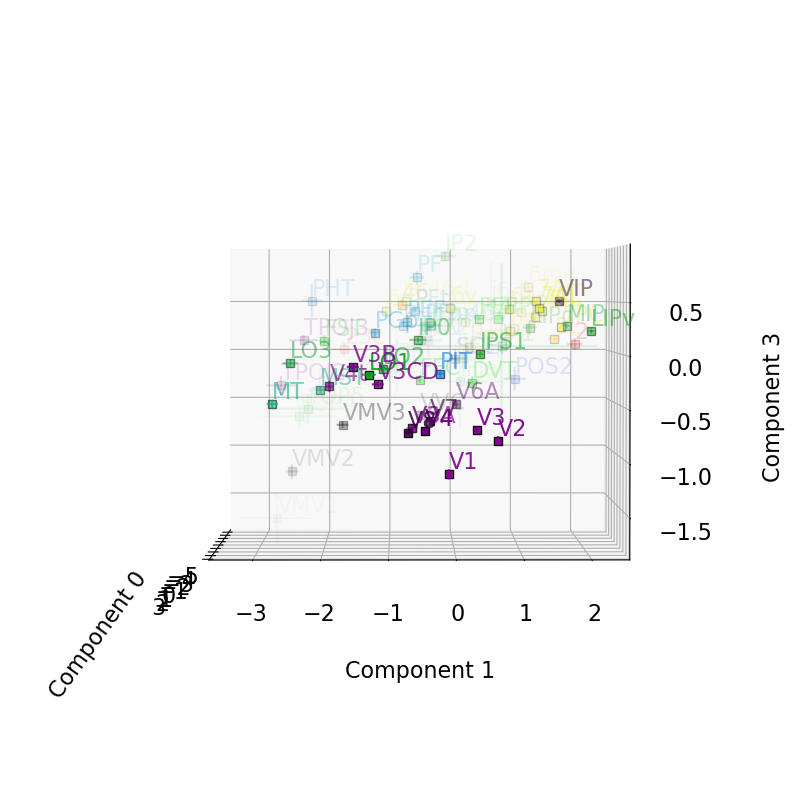

Started server on port 24717


0

In [58]:
#%%capture
#display(HTML("<style>div.output_scroll { height: 150em; }</style>"))
pl.close('all')
#generalized quantitative parameter plots
#'Eccentricity'#'Suppression Index (full)'#'Suppression Index#'Size (fwhmax)'#'Surround Size (fwatmin)'
#'Norm Param. B'#''Ratio (B/D)'#'Norm Param. D'#'RSq'#'CCrsq_task-1R'#'CSS Exponent'#'Amplitude'
#'Surround Amplitude'#'Size (sigma_1)'##'Size (sigma_2)'
#'Size ratio (sigma_2/sigma_1)'#C/A#'B/A'#'D/C'#'D/A'#'B/C'#'Surround volume (full)'#'Centre volume (full)'
#'(A+B)/(C+D)'#'(A*B)/(C*D)'#'(A*D)/(C*B)'#'(A+D)/(C+B)'#'Point-stim derivative'#'(C(A+B))/(A(C+D))'
#'Min/Max Response Ratio'#'Max/Min Response Ratio'#'A(C+D)/C(A+B)'##Min/Max Response Ratio (with BD)'
#'A/C'
####DoG
#'Surround volume (full)'
#'Surround/Centre Amplitude' 
#'Surround-Centre Amplitude'
#'Surround-Centre Volume'

#parameters = ['Eccentricity', 'Norm Param. B', 'Norm Param. D', 'Size (sigma_1)','Size (sigma_2)', 'Amplitude','Surround Amplitude', 'Polar Angle',
#              '5-HT1A', '5-HT1B', '5-HT2A', '5-HT4', '5-HTT', 'GABA_A','Amplitude','Surround Amplitude', 'RSq']#,]#'Size ratio (sigma_2/sigma_1)']# 'Size (sigma_1)', 'Size (sigma_2)', 'Amplitude','Surround Amplitude']

parameters = ['5-HT1A', '5-HT1B', '5-HT2A', 'GABA_A', '5-HTT', 'Eccentricity','Norm Param. B', 'Norm Param. D', 'Size ratio (sigma_2/sigma_1)','RSq']#

x_dims_idx = [0,1,2,3,4]
y_dims_idx = [5,6,7,8]

#rois = ['custom.V1', 'custom.V2', 'custom.V3','custom.V3AB','custom.hV4','custom.LO','custom.TO','custom.IPS','all_custom']
#rois = ['V1', 'V2', 'V3','V3AB','hV4','LO','TO','IPS', 'combined']#['Brain'] #'V1', 'V2', 'V3','V3AB','hV4','LO','TO','IPS','combined', 
#rois = [ 'V1', 'V2', 'V3', 'hV4', 'VO1', 'VO2', 'PHC1', 'PHC2', 'TO2', 'TO1', 'LO2', 'LO1', 'V3B', 'V3A', 'IPS0', 'IPS1', 'IPS2', 'IPS3', 'IPS4', 'IPS5', 'SPL1']#, 'combined']
#rois = ['all_custom']
rois = [roi for roi in vis_res.idx_rois['fsaverage'] if 'glasser' in roi]
#rois = ['glasser_V1','glasser_V2','glasser_V3','glasser_V4','glasser_V3A','glasser_V7','glasser_V3B','glasser_V3CD',
#'glasser_LO1','glasser_LO2','glasser_PIT','glasser_V8','glasser_VMV3',
#'glasser_IPS1','glasser_IP0','glasser_PGp','glasser_LO3','glasser_MT','glasser_V4t','glasser_FFC']
rois.append('combined')
        
rsq_thresh = 0.0
save_figures= False
figure_path = '/Volumes/Crucial X8/PRFMapping/Figures/attemptwnames_glasser_ecc65rsq030/pca'

space_names = 'fsaverage'
#set to 'all' to plot all analyses
analysis_names = 'fit-task-BAR_fit-runs-all'#''fit-task-BAR_fit-runs-CVmedian'# 'fit-task-BAR_fit-runs-all'#'fit-task-BAR_fit-runs-CVmedian'

subject_ids = ['fsaverage_cvrsq']#'fsaverage_hcp1sthalf', 'fsaverage_hcp2ndhalf']

threshold_li = filters.threshold_li(vis_res.main_dict[space_names][analysis_names][subject_ids[0]]['Processed Results']['#Subjects with CVRSq>0']['Norm_abcd'])

vis_res.set_alpha(only_models=['Norm_abcd'], ecc_min=0.0, ecc_max=8.0, min_number_sjs=threshold_li)

vis_res.multidim_analysis(parameters, rois, rsq_thresh, save_figures, figure_path, space_names = space_names, parameter_toplevel='Receptor Maps', rsq_weights= True,
                    analysis_names = analysis_names, subject_ids = subject_ids, x_dims_idx=x_dims_idx, y_dims_idx=y_dims_idx,
                          zscore_data= False, zscore_data_across_rois = True, 
                          size_response_curves = False, plot_corr_matrix = False, perform_ols = False, polar_plots = False,
                             cv_regression = False, bold_voxel_volume=4.096, zconfint_err_alpha=None, quantile_exclusion=0.999,
                          #vis_pca_comps_rois: fr which rois to make pca comp beta plots; 
                          #vis_pca_comps_axes: which comps to use in 2d plot of mean pca comp per roi
                        perform_pca = True, vis_pca_pycortex = True, vis_pca_comps_rois = ['combined'], vis_pca_comps_axes = [0,1,3], rsq_alpha_pca_plot = True,
                          perform_pls = False, vis_pls_pycortex = False)

os.system(f"open {sound_file}")


## PLS

HCP fit-task-BAR_fit-runs-all 100610
HCP fit-task-BAR_fit-runs-all 102311
HCP fit-task-BAR_fit-runs-all 102816
HCP fit-task-BAR_fit-runs-all 104416
HCP fit-task-BAR_fit-runs-all 105923
HCP fit-task-BAR_fit-runs-all 108323
HCP fit-task-BAR_fit-runs-all 109123
HCP fit-task-BAR_fit-runs-all 111312
HCP fit-task-BAR_fit-runs-all 111514
HCP fit-task-BAR_fit-runs-all 114823
HCP fit-task-BAR_fit-runs-all 115017
HCP fit-task-BAR_fit-runs-all 115825
HCP fit-task-BAR_fit-runs-all 116726
HCP fit-task-BAR_fit-runs-all 118225
HCP fit-task-BAR_fit-runs-all 125525
HCP fit-task-BAR_fit-runs-all 126426
HCP fit-task-BAR_fit-runs-all 128935
HCP fit-task-BAR_fit-runs-all 130114
HCP fit-task-BAR_fit-runs-all 130518
HCP fit-task-BAR_fit-runs-all 131217
HCP fit-task-BAR_fit-runs-all 131722
HCP fit-task-BAR_fit-runs-all 132118
HCP fit-task-BAR_fit-runs-all 134627
HCP fit-task-BAR_fit-runs-all 134829
HCP fit-task-BAR_fit-runs-all 135124
HCP fit-task-BAR_fit-runs-all 137128
HCP fit-task-BAR_fit-runs-all 140117
H

fsaverage fit-task-BAR_fit-runs-all 155938
fsaverage fit-task-BAR_fit-runs-all 156334
fsaverage fit-task-BAR_fit-runs-all 157336
fsaverage fit-task-BAR_fit-runs-all 158035
fsaverage fit-task-BAR_fit-runs-all 158136
fsaverage fit-task-BAR_fit-runs-all 159239
fsaverage fit-task-BAR_fit-runs-all 162935
fsaverage fit-task-BAR_fit-runs-all 164131
fsaverage fit-task-BAR_fit-runs-all 164636
fsaverage fit-task-BAR_fit-runs-all 165436
fsaverage fit-task-BAR_fit-runs-all 167036
fsaverage fit-task-BAR_fit-runs-all 167440
fsaverage fit-task-BAR_fit-runs-all 169040
fsaverage fit-task-BAR_fit-runs-all 169343
fsaverage fit-task-BAR_fit-runs-all 169444
fsaverage fit-task-BAR_fit-runs-all 169747
fsaverage fit-task-BAR_fit-runs-all 171633
fsaverage fit-task-BAR_fit-runs-all 172130
fsaverage fit-task-BAR_fit-runs-all 173334
fsaverage fit-task-BAR_fit-runs-all 175237
fsaverage fit-task-BAR_fit-runs-all 176542
fsaverage fit-task-BAR_fit-runs-all 177140
fsaverage fit-task-BAR_fit-runs-all 177645
fsaverage f

Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param.

Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param.

Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param.

Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param.

Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd']
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_1
X-dims: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A']
Y-dims: ['Eccentricity Norm_abcd', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd']
alldims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Eccentricity Norm_abcd', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_10d
X-dims: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT',

Performing PLS with 5 components
Estimated betas: ['Eccentricity Norm_abcd', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd']
5-HT1A: [-0.0229 -0.0116  0.016  -0.0948 -0.1671], total beta: 0.312
5-HT1B: [ 0.0346 -0.0167 -0.0242 -0.0058 -0.0986], total beta: 0.180
5-HT2A: [0.003  0.0383 0.0683 0.0167 0.0527], total beta: 0.179
5-HTT: [-0.2847  0.0616 -0.0192 -0.3204  0.1278], total beta: 0.814
GABA_A: [-0.0428  0.0052 -0.1715 -0.0443 -0.1155], total beta: 0.379
RSq total 0.348182610460875
RSq predictions [0.6078 0.1645 0.1298 0.7646 0.0743]
corr predictions [0.7736 0.4663 0.3602 0.8721 0.298 ]

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_5m
X-dims: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A']
Y-dims: ['Eccentricity Norm_abcd', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd']
alldims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Eccentricity Norm_abcd'

Performing PLS with 3 components
Estimated betas: ['Eccentricity Norm_abcd', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd']
5-HT1A: [ 0.0194  0.1015 -0.0425  0.0082  0.0838], total beta: 0.255
5-HT1B: [ 0.0164 -0.0256  0.028  -0.0241 -0.0796], total beta: 0.174
5-HT2A: [-0.0342  0.0157  0.0614 -0.1161 -0.1901], total beta: 0.418
5-HTT: [ 0.042  -0.0087 -0.0064  0.0263  0.0143], total beta: 0.098
GABA_A: [-0.0113  0.0368  0.0357 -0.0828 -0.1245], total beta: 0.291
RSq total 0.2644271970339517
RSq predictions [0.3273 0.353  0.0275 0.4426 0.1719]
corr predictions [0.5595 0.5851 0.1513 0.6618 0.401 ]

Performing PLS with 4 components
Estimated betas: ['Eccentricity Norm_abcd', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd']
5-HT1A: [ 0.0217  0.0894 -0.1707  0.0582  0.1675], total beta: 0.507
5-HT1B: [ 0.0202 -0.0453 -0.1801  0.0571  0.0563], total beta: 0.359
5-HT2A:

RSq total 0.2308932007893211
RSq predictions [0.3702 0.0505 0.04   0.4818 0.2119]
corr predictions [0.6129 0.2065 0.1718 0.6801 0.478 ]

Performing PLS with 4 components
Estimated betas: ['Eccentricity Norm_abcd', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd']
5-HT1A: [-0.0187  0.0105  0.0582  0.0093 -0.1192], total beta: 0.216
5-HT1B: [0.0941 0.0094 0.0185 0.1798 0.056 ], total beta: 0.358
5-HT2A: [-0.1517 -0.0037 -0.0267 -0.1147  0.1056], total beta: 0.402
5-HTT: [-0.1555 -0.0021  0.0161 -0.1938 -0.0905], total beta: 0.458
GABA_A: [-0.0897 -0.0037 -0.0032 -0.0561  0.0801], total beta: 0.233
RSq total 0.23493473429585032
RSq predictions [0.3701 0.0563 0.0426 0.4938 0.2119]
corr predictions [0.613  0.2273 0.1835 0.6925 0.478 ]

Performing PLS with 5 components
Estimated betas: ['Eccentricity Norm_abcd', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd']
5-HT1A: [-0.

RSq total 0.2934402457128428
RSq predictions [0.3632 0.1718 0.0918 0.4735 0.367 ]
corr predictions [0.6272 0.4073 0.3159 0.7035 0.6233]

Performing PLS with 4 components
Estimated betas: ['Eccentricity Norm_abcd', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd']
5-HT1A: [ 0.0367 -0.283   0.0903  0.0676  0.1343], total beta: 0.612
5-HT1B: [-0.0355  0.112  -0.0382 -0.1065  0.1574], total beta: 0.450
5-HT2A: [-0.0765  0.3975 -0.2168 -0.0653 -0.3679], total beta: 1.124
5-HTT: [-0.0079 -0.2501  0.2982  0.2636 -0.9404], total beta: 1.760
GABA_A: [ 0.0756 -0.1279 -0.3526 -0.0875  0.9629], total beta: 1.607
RSq total 0.3107926691310991
RSq predictions [0.3637 0.1933 0.1086 0.5172 0.3712]
corr predictions [0.6286 0.4267 0.3307 0.7323 0.6362]

Performing PLS with 5 components
Estimated betas: ['Eccentricity Norm_abcd', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd']
5-HT1A: 

Performing PLS with 3 components
Estimated betas: ['Eccentricity Norm_abcd', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd']
5-HT1A: [-0.0927  0.      0.0286 -0.0939  0.006 ], total beta: 0.221
5-HT1B: [ 0.1078  0.0148 -0.0853  0.2002  0.1896], total beta: 0.598
5-HT2A: [-0.0556  0.0036  0.0183 -0.0715 -0.0169], total beta: 0.166
5-HTT: [ 0.2451  0.0133 -0.0349  0.094  -0.2719], total beta: 0.659
GABA_A: [-0.1178 -0.0009  0.0276 -0.0926  0.0548], total beta: 0.294
RSq total 0.20853249723072928
RSq predictions [0.3587 0.0325 0.0702 0.3848 0.1965]
corr predictions [0.5937 0.2047 0.2906 0.6035 0.417 ]

Performing PLS with 4 components
Estimated betas: ['Eccentricity Norm_abcd', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd']
5-HT1A: [-0.0209 -0.0101  0.0096 -0.0312  0.0123], total beta: 0.084
5-HT1B: [ 0.1482  0.0091 -0.0959  0.2354  0.1932], total beta: 0.682
5-HT2A

Performing PLS with 5 components
Estimated betas: ['Eccentricity Norm_abcd', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd']
5-HT1A: [-0.0313 -0.4086 -0.0093  0.0363  0.2197], total beta: 0.705
5-HT1B: [-0.0301  1.1651 -1.1326  0.1285 -0.5554], total beta: 3.012
5-HT2A: [ 0.0269 -0.9942 -0.2005  0.0755 -0.5035], total beta: 1.801
5-HTT: [ 0.0055  0.2986 -0.1048  0.1149 -0.3632], total beta: 0.887
GABA_A: [ 0.0347  0.2575  1.1529 -0.0884  0.8962], total beta: 2.430
RSq total 0.2209397473185072
RSq predictions [0.008  0.1895 0.2292 0.4752 0.2028]
corr predictions [0.1158 0.4632 0.4588 0.6904 0.4839]

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_FST
X-dims: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A']
Y-dims: ['Eccentricity Norm_abcd', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd']
alldims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Eccentricity Nor

RSq total 0.23559791132150032
RSq predictions [0.6709 0.0078 0.1964 0.2626 0.0403]
corr predictions [0.7852 0.1582 0.387  0.5035 0.1092]

Performing PLS with 3 components
Estimated betas: ['Eccentricity Norm_abcd', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd']
5-HT1A: [-0.0178  0.0055  0.0522 -0.0041  0.072 ], total beta: 0.152
5-HT1B: [ 0.2559 -0.01   -0.3081  0.1948 -0.2192], total beta: 0.988
5-HT2A: [-0.0271  0.0059  0.0588 -0.0065  0.0722], total beta: 0.170
5-HTT: [ 0.2331 -0.0136 -0.2011  0.0505 -0.0686], total beta: 0.567
GABA_A: [-0.0526  0.0071  0.0869 -0.0207  0.0898], total beta: 0.257
RSq total 0.28946872823442965
RSq predictions [ 0.7187 -0.001   0.2468  0.4173  0.0655]
corr predictions [0.8242 0.1651 0.4573 0.5855 0.2375]

Performing PLS with 4 components
Estimated betas: ['Eccentricity Norm_abcd', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd']
5

Performing PLS with 5 components
Estimated betas: ['Eccentricity Norm_abcd', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd']
5-HT1A: [-0.0733 -0.0256  0.1084  0.0072  0.1155], total beta: 0.330
5-HT1B: [ 0.0496  0.0428 -0.0361 -0.0287 -0.0313], total beta: 0.188
5-HT2A: [-0.065  -0.0058 -0.0713 -0.1881 -0.4745], total beta: 0.805
5-HTT: [-0.1639  0.032   0.1764 -0.1357 -0.1537], total beta: 0.662
GABA_A: [ 0.0568 -0.0068 -0.1213  0.0662 -0.045 ], total beta: 0.296
RSq total 0.29447850567644057
RSq predictions [0.4844 0.0887 0.1178 0.4606 0.3209]
corr predictions [0.6857 0.285  0.3306 0.6673 0.5651]

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_LIPv
X-dims: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A']
Y-dims: ['Eccentricity Norm_abcd', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd']
alldims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Eccentricity N

RSq total 0.40823495326088893
RSq predictions [0.6139 0.0136 0.166  0.7382 0.5095]
corr predictions [0.7688 0.1236 0.4369 0.8406 0.7268]

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_MST
X-dims: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A']
Y-dims: ['Eccentricity Norm_abcd', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd']
alldims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Eccentricity Norm_abcd', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd']
Sample size: 745
Performing PLS with 1 components
Estimated betas: ['Eccentricity Norm_abcd', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_ab

Performing PLS with 4 components
Estimated betas: ['Eccentricity Norm_abcd', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd']
5-HT1A: [-0.0118 -0.1973 -0.0729  0.0526  0.1386], total beta: 0.473
5-HT1B: [-0.0097 -0.0482  0.0511  0.0109  0.1041], total beta: 0.224
5-HT2A: [0.056  0.0813 0.0065 0.0444 0.1244], total beta: 0.313
5-HTT: [-0.0433  0.14    0.0215 -0.0644 -0.0818], total beta: 0.351
GABA_A: [-0.0018 -0.2359  0.0392  0.0568  0.1803], total beta: 0.514
RSq total 0.2739212061409673
RSq predictions [0.4436 0.5031 0.0625 0.1554 0.205 ]
corr predictions [0.6537 0.707  0.268  0.4777 0.4195]

Performing PLS with 5 components
Estimated betas: ['Eccentricity Norm_abcd', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd']
5-HT1A: [-0.0408 -0.1541  0.0009  0.0033  0.1937], total beta: 0.393
5-HT1B: [-0.1319  0.1337  0.3614 -0.1965  0.3359], total beta: 1.159
5-HT2A: [ 0.

Performing PLS with 1 components
Estimated betas: ['Eccentricity Norm_abcd', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd']
5-HT1A: [ 0.0584 -0.0136 -0.0296  0.1318  0.0595], total beta: 0.293
5-HT1B: [ 0.1938 -0.045  -0.0981  0.4374  0.1975], total beta: 0.972
5-HT2A: [ 0.0382 -0.0089 -0.0194  0.0863  0.039 ], total beta: 0.192
5-HTT: [-0.0278  0.0065  0.0141 -0.0627 -0.0283], total beta: 0.139
GABA_A: [-0.0075  0.0017  0.0038 -0.0168 -0.0076], total beta: 0.037
RSq total 0.20406077101458298
RSq predictions [0.2525 0.1063 0.0255 0.5119 0.1241]
corr predictions [0.5315 0.3494 0.1939 0.7336 0.3411]

Performing PLS with 2 components
Estimated betas: ['Eccentricity Norm_abcd', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd']
5-HT1A: [ 0.003  -0.0114  0.0012  0.1044  0.0729], total beta: 0.193
5-HT1B: [ 0.3197 -0.0499 -0.1679  0.4996  0.1672], total beta: 1.204
5-HT2A

Performing PLS with 4 components
Estimated betas: ['Eccentricity Norm_abcd', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd']
5-HT1A: [-0.0067  0.1194  0.269   0.1493  0.375 ], total beta: 0.919
5-HT1B: [0.136  0.1044 0.1901 0.1603 0.4722], total beta: 1.063
5-HT2A: [-0.064   0.0473  0.012  -0.0539 -0.0414], total beta: 0.219
5-HTT: [ 0.076   0.0682 -0.227   0.051  -0.2598], total beta: 0.682
GABA_A: [-0.0528 -0.0144 -0.0556 -0.1145 -0.1145], total beta: 0.352
RSq total 0.3329241605635227
RSq predictions [0.5442 0.3443 0.2257 0.3262 0.2242]
corr predictions [0.7433 0.6264 0.5211 0.569  0.492 ]

Performing PLS with 5 components
Estimated betas: ['Eccentricity Norm_abcd', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd']
5-HT1A: [-0.023   0.1106  0.308   0.1371  0.3335], total beta: 0.912
5-HT1B: [0.1448 0.1091 0.1693 0.1668 0.4943], total beta: 1.084
5-HT2A: [-0.0312 

Performing PLS with 5 components
Estimated betas: ['Eccentricity Norm_abcd', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd']
5-HT1A: [-0.2802  0.0072  0.104  -0.2343 -0.0315], total beta: 0.657
5-HT1B: [-0.2892 -0.0052 -0.1002 -0.2547 -0.0479], total beta: 0.697
5-HT2A: [ 1.1857 -0.0027 -0.0674  0.3902 -0.2985], total beta: 1.945
5-HTT: [ 0.4468 -0.0089 -0.1051  0.3296 -0.2506], total beta: 1.141
GABA_A: [-0.4703  0.0004 -0.0028 -0.1888  0.1418], total beta: 0.804
RSq total 0.3113840206200214
RSq predictions [0.7468 0.0064 0.0776 0.4291 0.2971]
corr predictions [0.86   0.1029 0.2934 0.6599 0.5325]

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_V1
X-dims: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A']
Y-dims: ['Eccentricity Norm_abcd', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd']
alldims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Eccentricity Norm

RSq total 0.4503767395052714
RSq predictions [0.6323 0.3552 0.4814 0.5578 0.2251]
corr predictions [0.8234 0.5502 0.7172 0.7733 0.5032]

Performing PLS with 4 components
Estimated betas: ['Eccentricity Norm_abcd', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd']
5-HT1A: [ 0.1152 -0.2117 -0.3497  0.1807 -0.1975], total beta: 1.055
5-HT1B: [-0.3788 -0.2232 -0.1335 -0.0663  0.0324], total beta: 0.834
5-HT2A: [-0.2256 -0.0848 -0.1591 -0.0159 -0.2149], total beta: 0.700
5-HTT: [ 0.7353  0.1172  0.1639  0.2995 -0.0999], total beta: 1.416
GABA_A: [-0.2215 -0.1224 -0.1337 -0.079   0.1456], total beta: 0.702
RSq total 0.45953743578450634
RSq predictions [0.6331 0.3879 0.4818 0.555  0.2398]
corr predictions [0.8234 0.5698 0.7187 0.7828 0.5099]

Performing PLS with 5 components
Estimated betas: ['Eccentricity Norm_abcd', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd']
5-HT1A:

Performing PLS with 5 components
Estimated betas: ['Eccentricity Norm_abcd', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd']
5-HT1A: [ 0.03   -0.023  -0.1585  0.2535  0.3415], total beta: 0.807
5-HT1B: [ 0.1509  0.0086 -0.0927  0.1469 -0.0602], total beta: 0.459
5-HT2A: [ 0.163   0.0031  0.0192  0.0157 -0.2472], total beta: 0.448
5-HTT: [ 0.1677  0.0274  0.0549  0.0995 -0.3229], total beta: 0.672
GABA_A: [-0.1402 -0.0151  0.0245 -0.1118  0.0714], total beta: 0.363
RSq total 0.6213328894312261
RSq predictions [0.8009 0.4054 0.3736 0.7461 0.7807]
corr predictions [0.89   0.6287 0.6072 0.85   0.8874]

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_V4
X-dims: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A']
Y-dims: ['Eccentricity Norm_abcd', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd']
alldims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Eccentricity Norm

Performing PLS with 5 components
Estimated betas: ['Eccentricity Norm_abcd', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd']
5-HT1A: [ 0.7017  0.0481 -0.1581  0.2712 -0.5912], total beta: 1.770
5-HT1B: [ 0.8266  0.0496 -0.2466  0.3795 -0.6842], total beta: 2.186
5-HT2A: [-1.3223 -0.0484  0.5447 -0.4868  1.0066], total beta: 3.409
5-HTT: [ 0.4415  0.0073 -0.2919  0.061  -0.2134], total beta: 1.015
GABA_A: [ 0.1758  0.0247 -0.1353 -0.0039 -0.3858], total beta: 0.725
RSq total 0.2781240424862723
RSq predictions [0.4989 0.0436 0.266  0.3683 0.2139]
corr predictions [0.6861 0.219  0.4827 0.6257 0.466 ]

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_V6A
X-dims: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A']
Y-dims: ['Eccentricity Norm_abcd', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd']
alldims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Eccentricity Nor

Performing PLS with 3 components
Estimated betas: ['Eccentricity Norm_abcd', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd']
5-HT1A: [-0.4469  0.0859 -0.3483 -0.0666  0.7483], total beta: 1.696
5-HT1B: [ 0.0701  0.0428 -0.2684 -0.0064  0.0219], total beta: 0.410
5-HT2A: [ 0.1638  0.034  -0.0139  0.0354 -0.0744], total beta: 0.322
5-HTT: [-0.0471  0.0326 -0.0102  0.0071  0.1632], total beta: 0.260
GABA_A: [-0.1719  0.0608 -0.3925 -0.0469  0.3405], total beta: 1.013
RSq total 0.34646340530405767
RSq predictions [0.5585 0.235  0.3383 0.0321 0.5685]
corr predictions [0.702  0.4876 0.6079 0.1832 0.7358]

Performing PLS with 4 components
Estimated betas: ['Eccentricity Norm_abcd', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd']
5-HT1A: [-0.4006  0.0349 -0.6279 -0.0885  0.8229], total beta: 1.975
5-HT1B: [ 0.1289 -0.022  -0.6237 -0.0342  0.1168], total beta: 0.926
5-HT2A

<IPython.core.display.Javascript object>


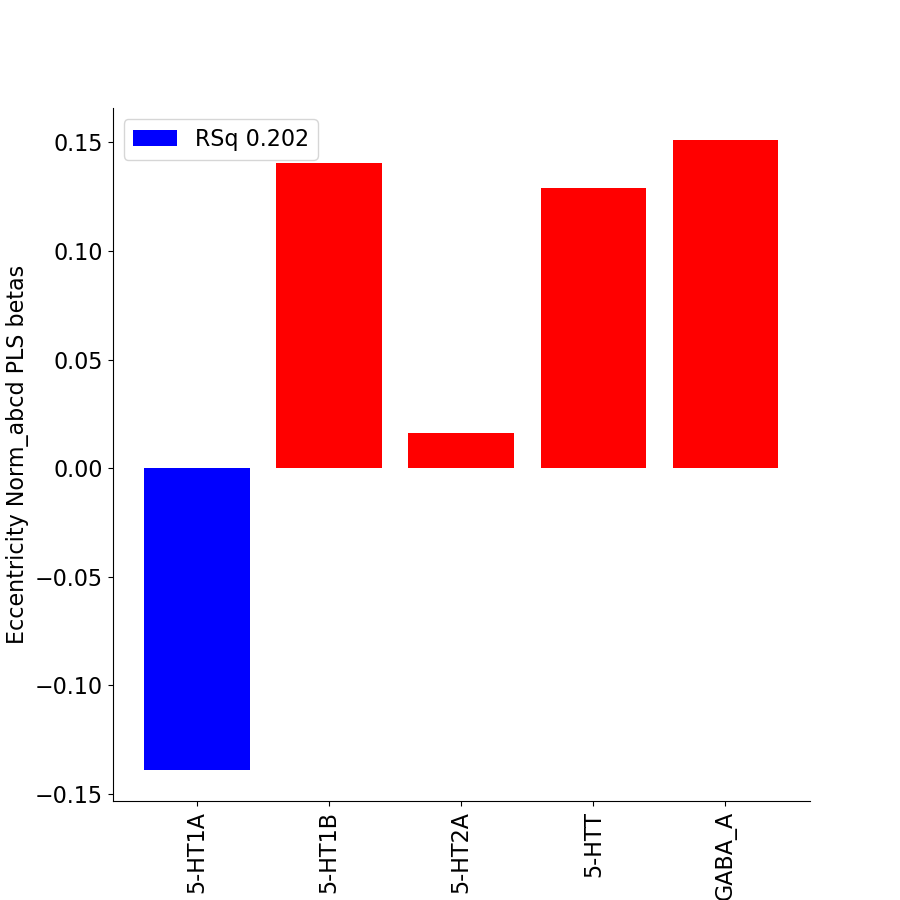

<IPython.core.display.Javascript object>


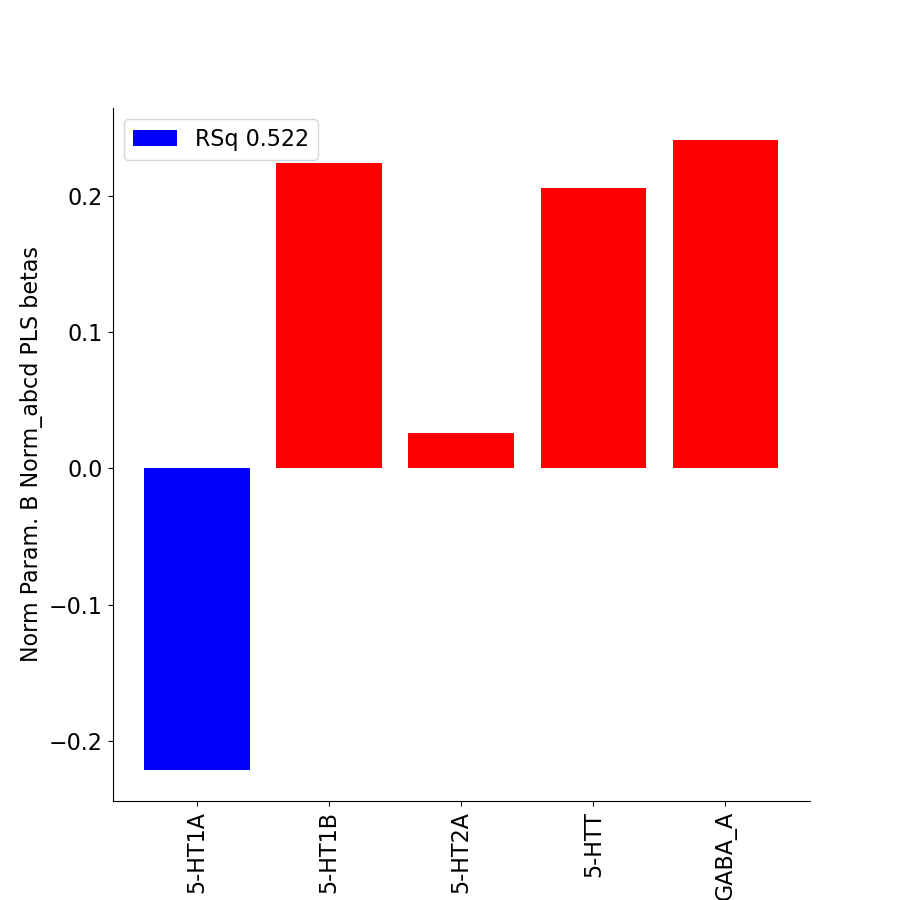

<IPython.core.display.Javascript object>


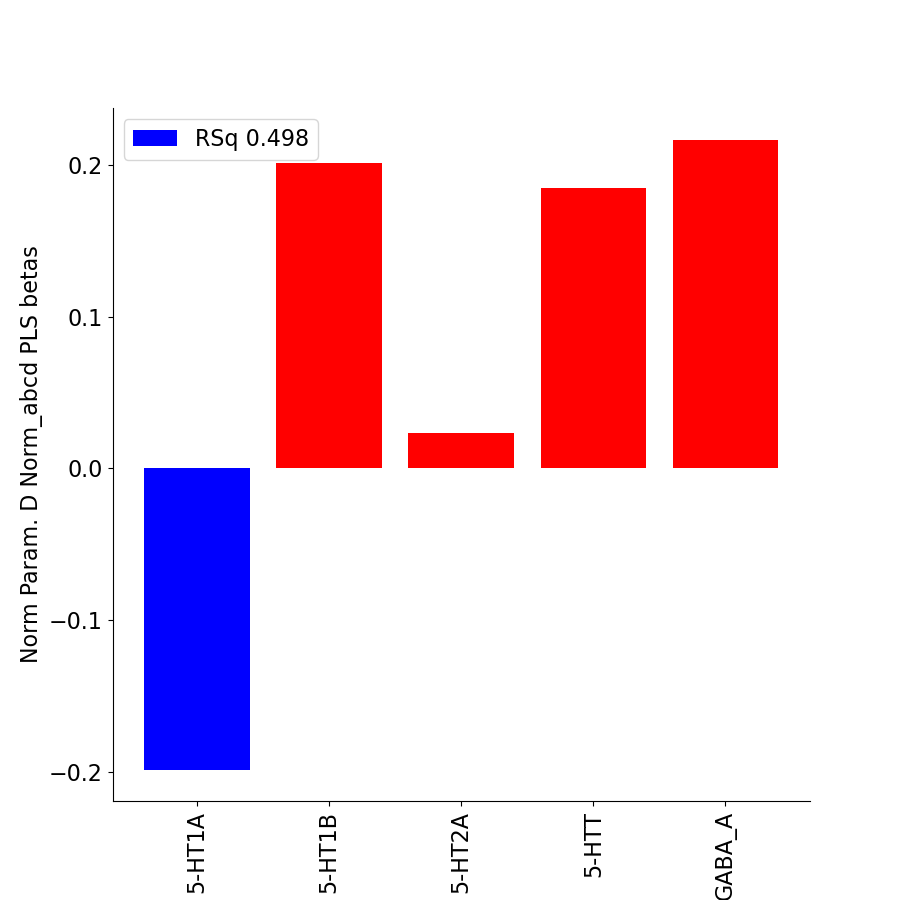

<IPython.core.display.Javascript object>


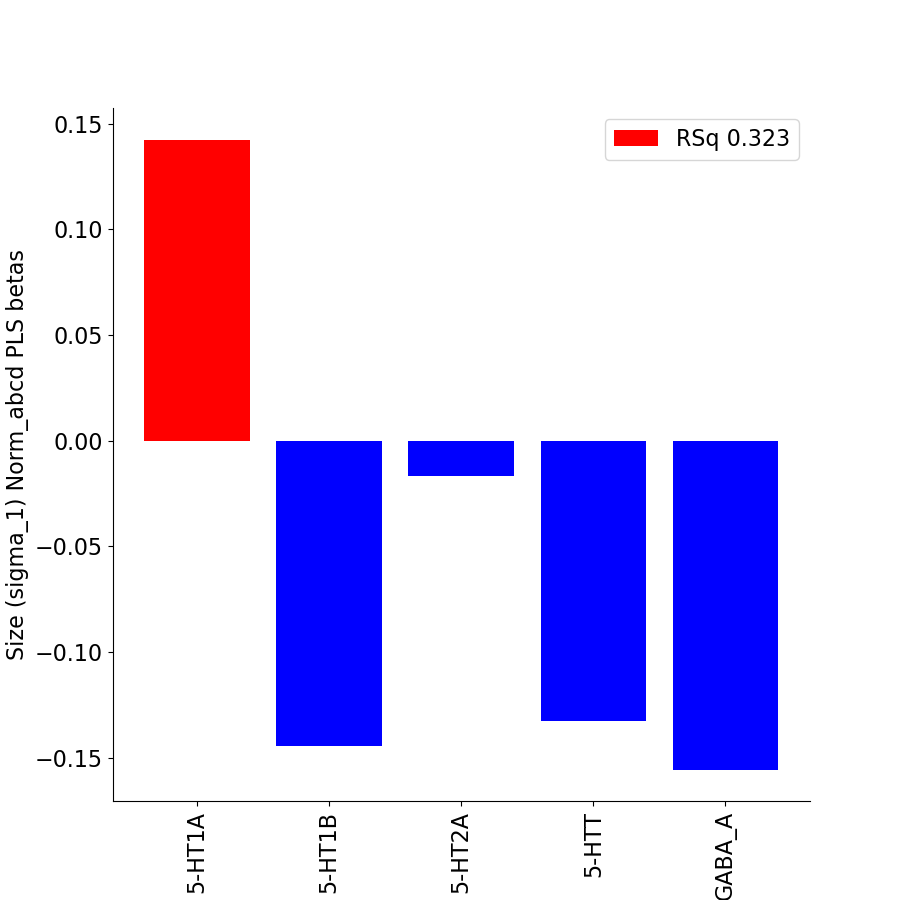

<IPython.core.display.Javascript object>


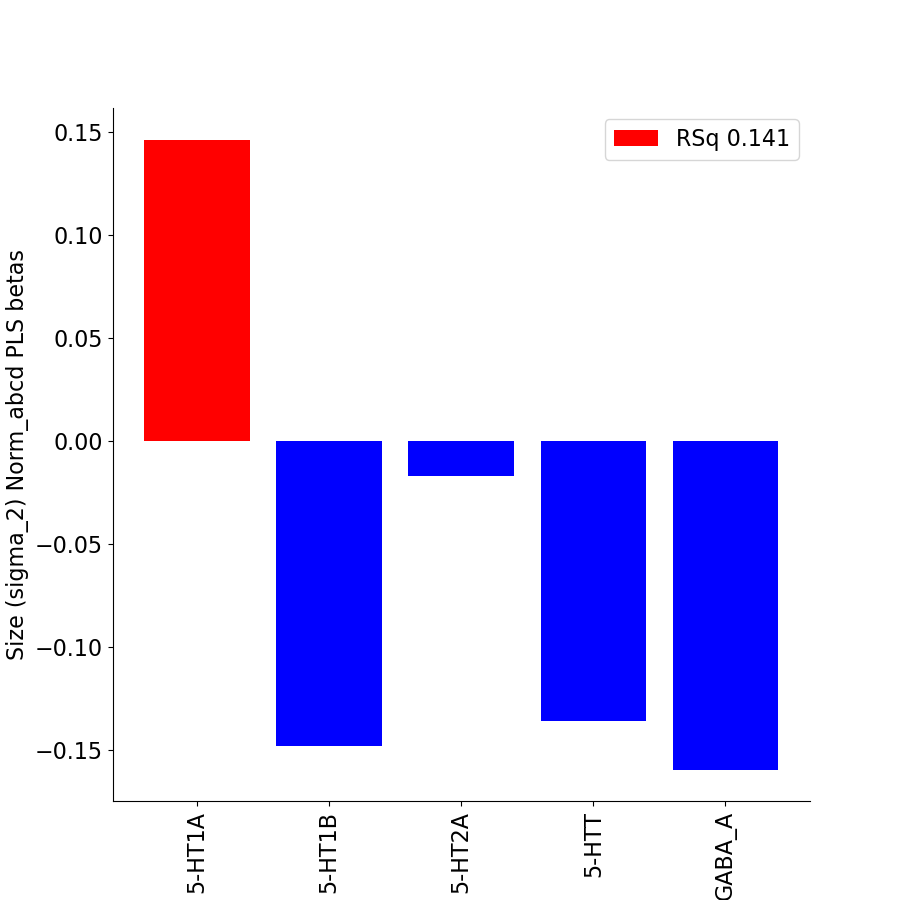

<IPython.core.display.Javascript object>


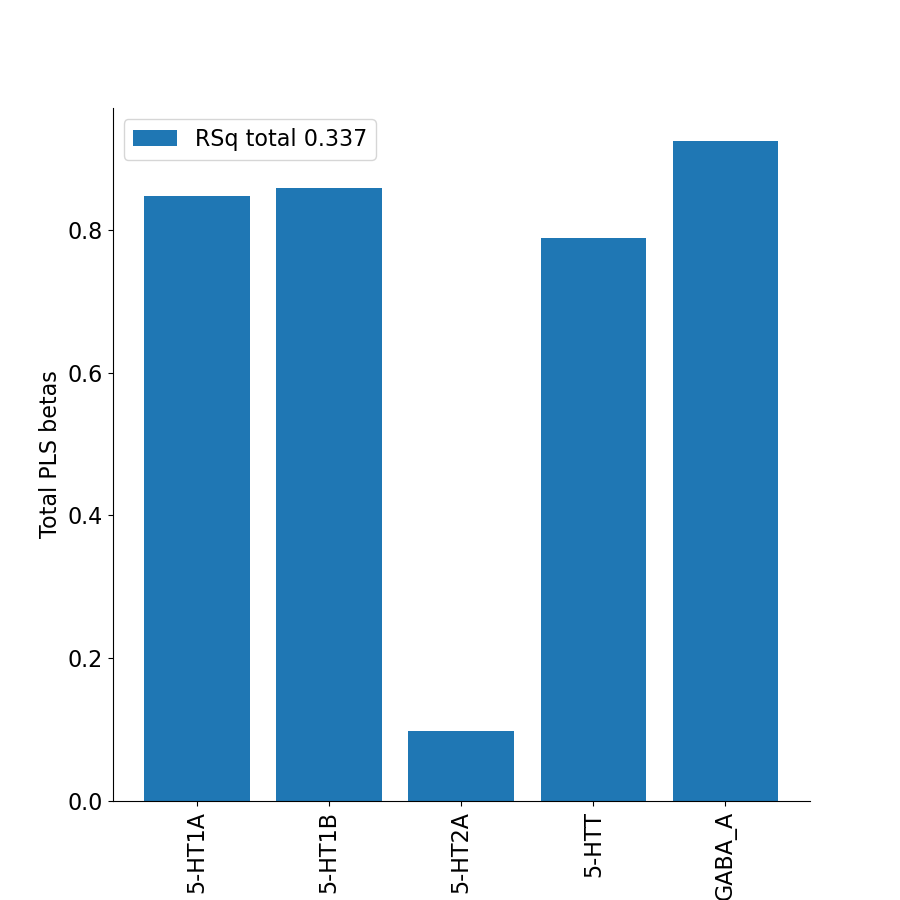

Performing PLS with 2 components
Estimated betas: ['Eccentricity Norm_abcd', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd']
5-HT1A: [-0.0316 -0.2734 -0.2693  0.2687  0.1136], total beta: 0.957
5-HT1B: [ 0.0352  0.2756  0.271  -0.2687 -0.1162], total beta: 0.967
5-HT2A: [ 0.0755 -0.0033 -0.0161  0.0534 -0.0352], total beta: 0.184
5-HTT: [ 0.2867  0.1284  0.0806  0.0533 -0.1845], total beta: 0.733
GABA_A: [ 0.1739  0.2301  0.2018 -0.1288 -0.1666], total beta: 0.901
RSq total 0.37999270776298494
RSq predictions [0.2708 0.534  0.5247 0.4132 0.1572]
corr predictions [0.4889 0.6926 0.6332 0.5205 0.4581]



<IPython.core.display.Javascript object>


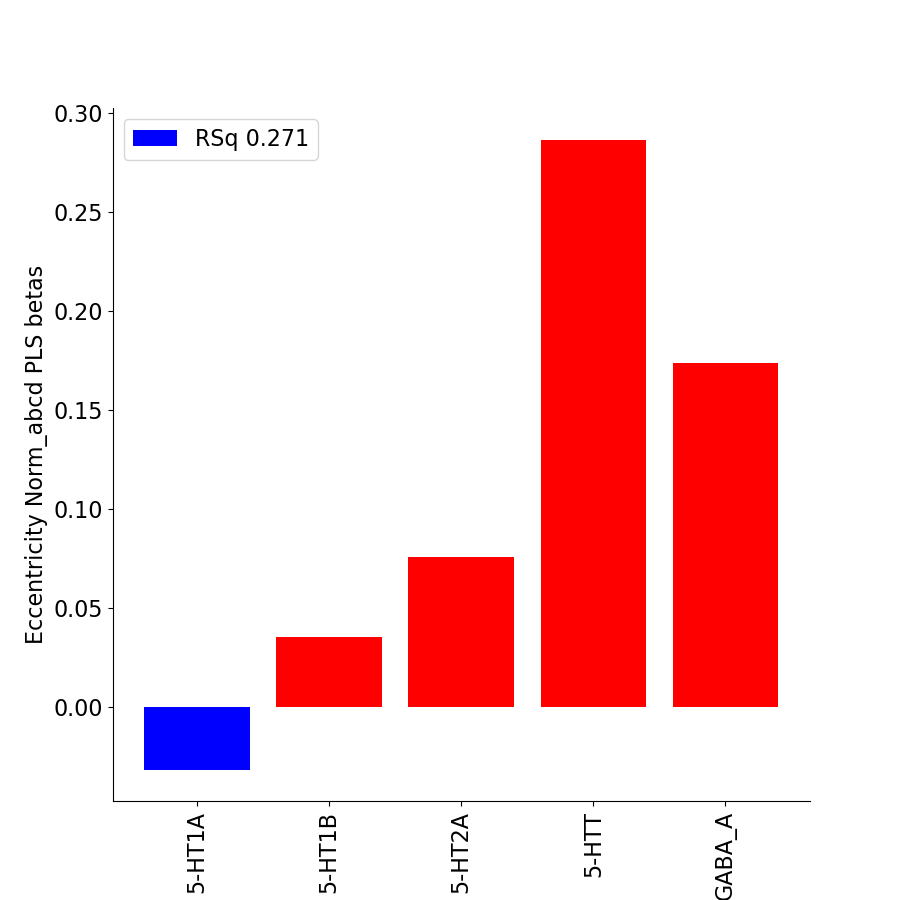

<IPython.core.display.Javascript object>


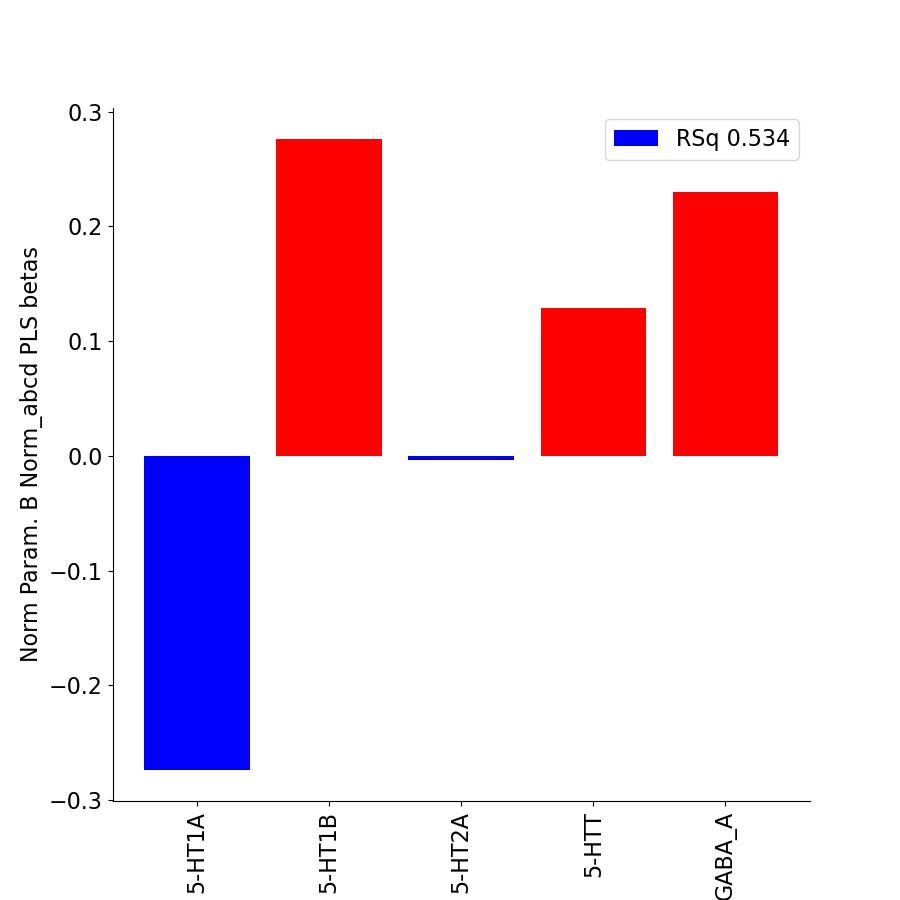

<IPython.core.display.Javascript object>


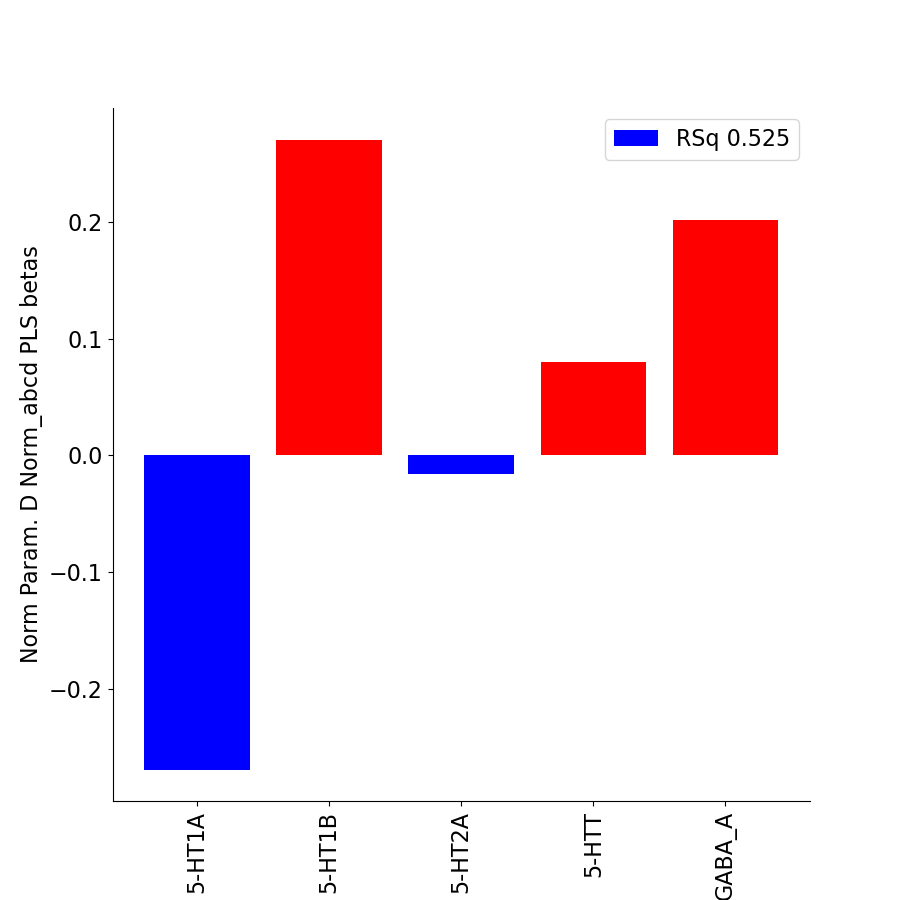

<IPython.core.display.Javascript object>


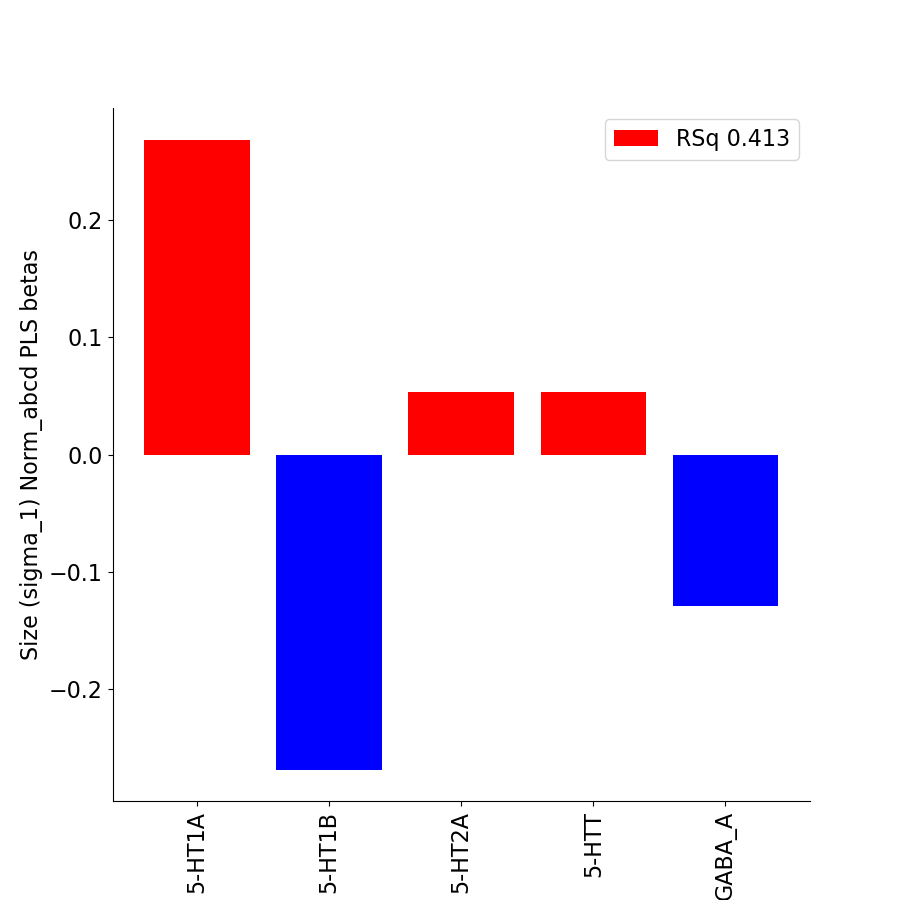

<IPython.core.display.Javascript object>


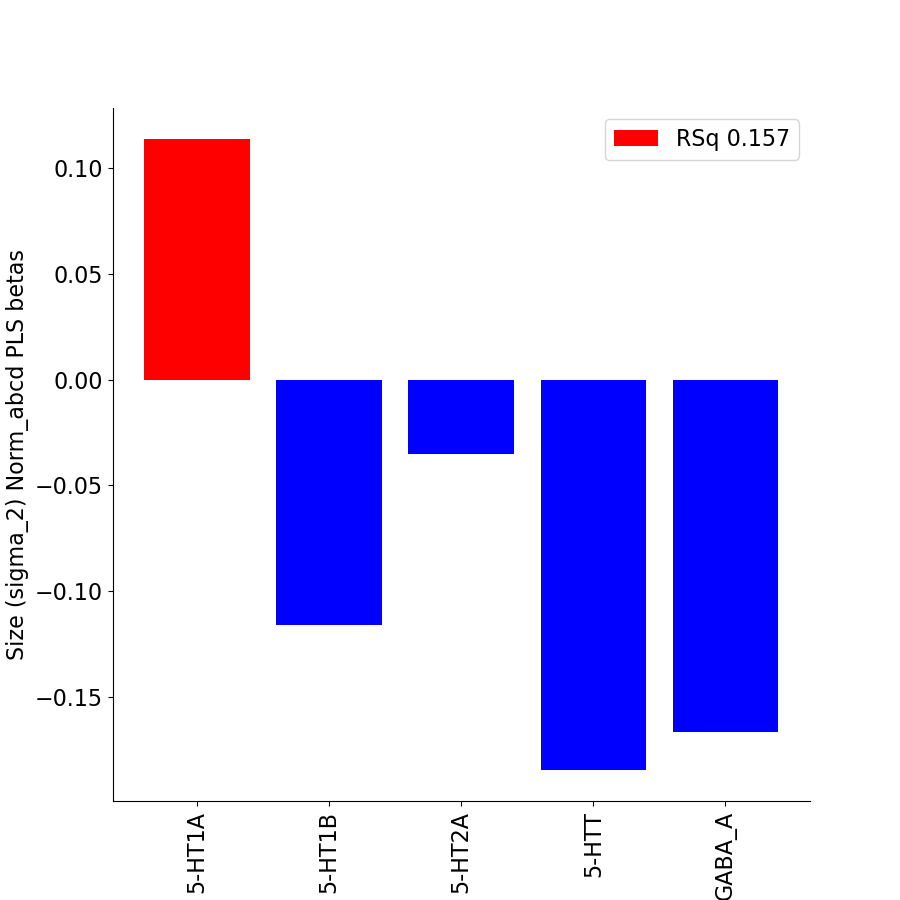

<IPython.core.display.Javascript object>


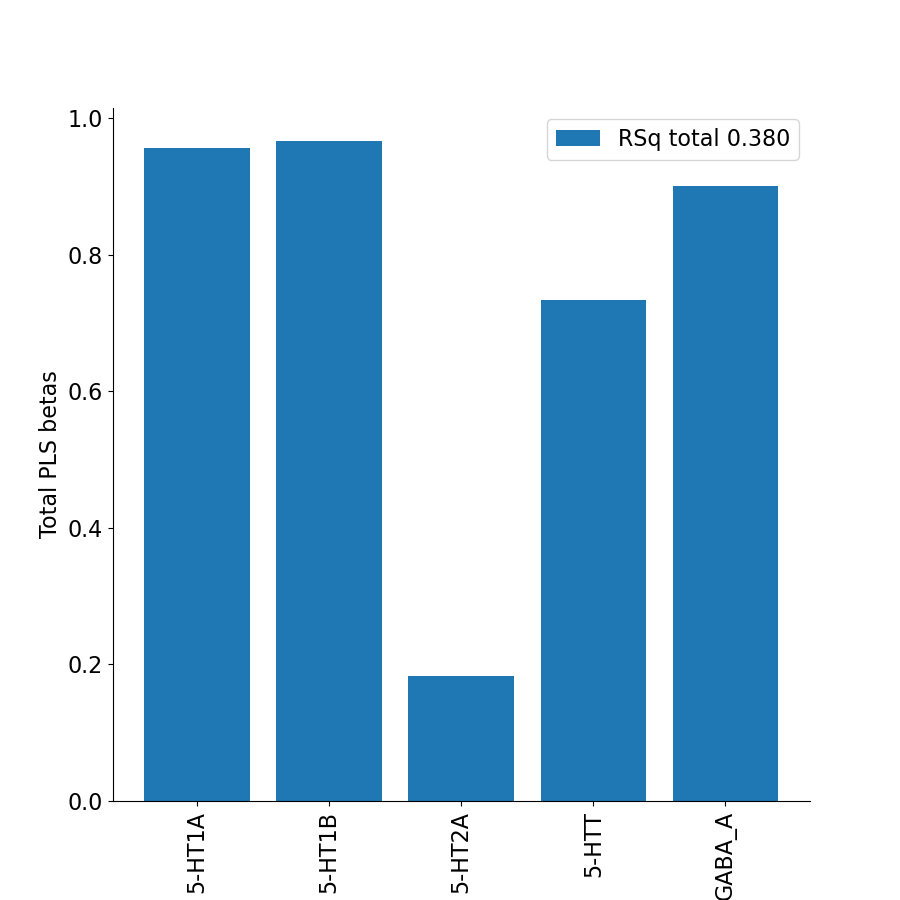

Performing PLS with 3 components
Estimated betas: ['Eccentricity Norm_abcd', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd']
5-HT1A: [-0.1446 -0.2956 -0.2876  0.2568  0.1766], total beta: 1.161
5-HT1B: [-0.1586  0.2375  0.2397 -0.289  -0.0081], total beta: 0.933
5-HT2A: [-0.1122 -0.0402 -0.0464  0.0336  0.0694], total beta: 0.302
5-HTT: [ 0.5149  0.1733  0.1174  0.0773 -0.3117], total beta: 1.195
GABA_A: [ 0.1533  0.226   0.1984 -0.131  -0.1552], total beta: 0.864
RSq total 0.42093196223192875
RSq predictions [0.3887 0.5388 0.5369 0.4074 0.2328]
corr predictions [0.5861 0.6955 0.6353 0.5216 0.4923]



<IPython.core.display.Javascript object>


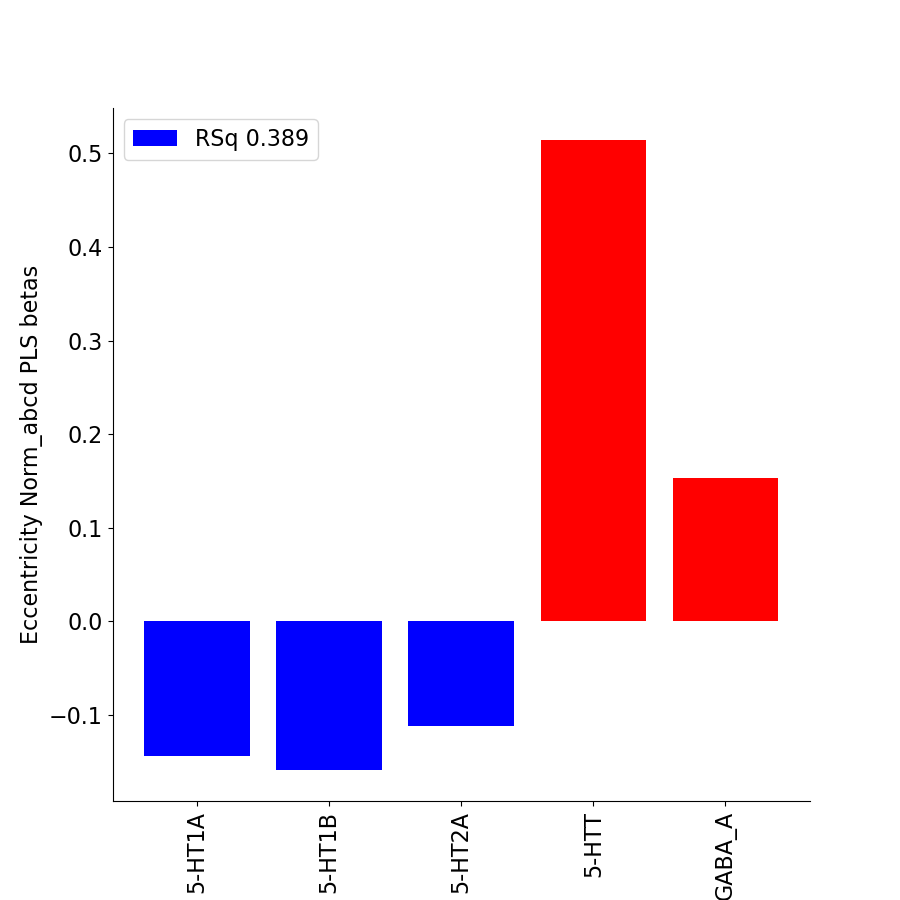

<IPython.core.display.Javascript object>


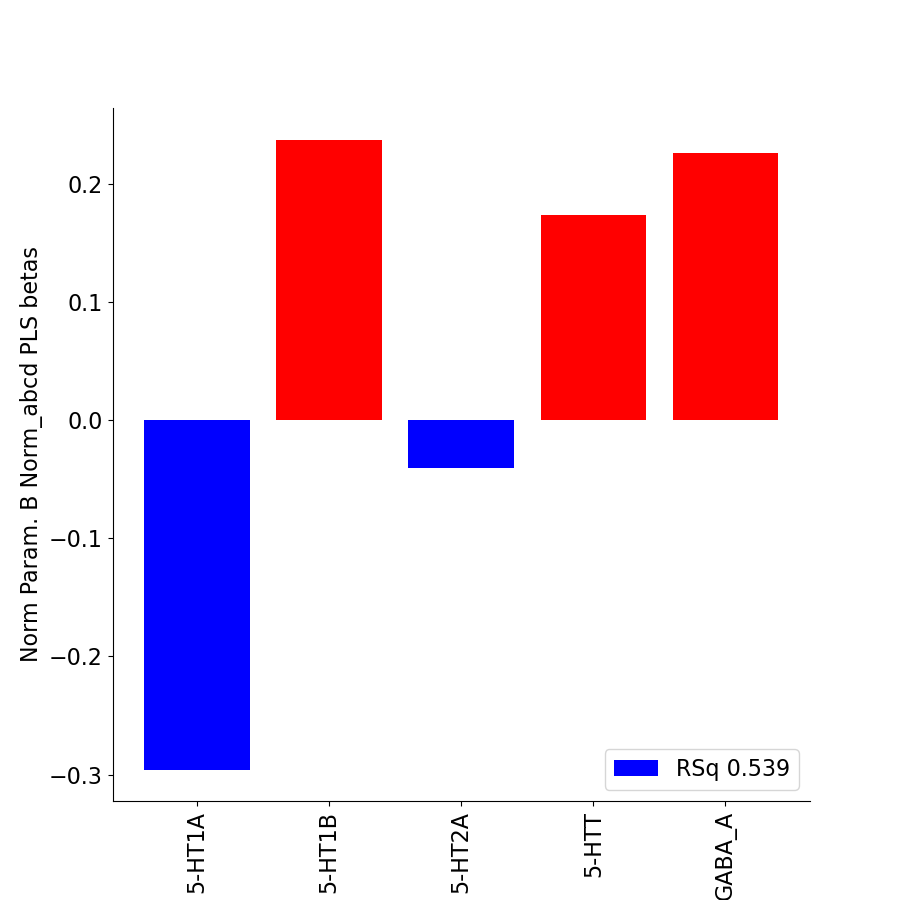

<IPython.core.display.Javascript object>


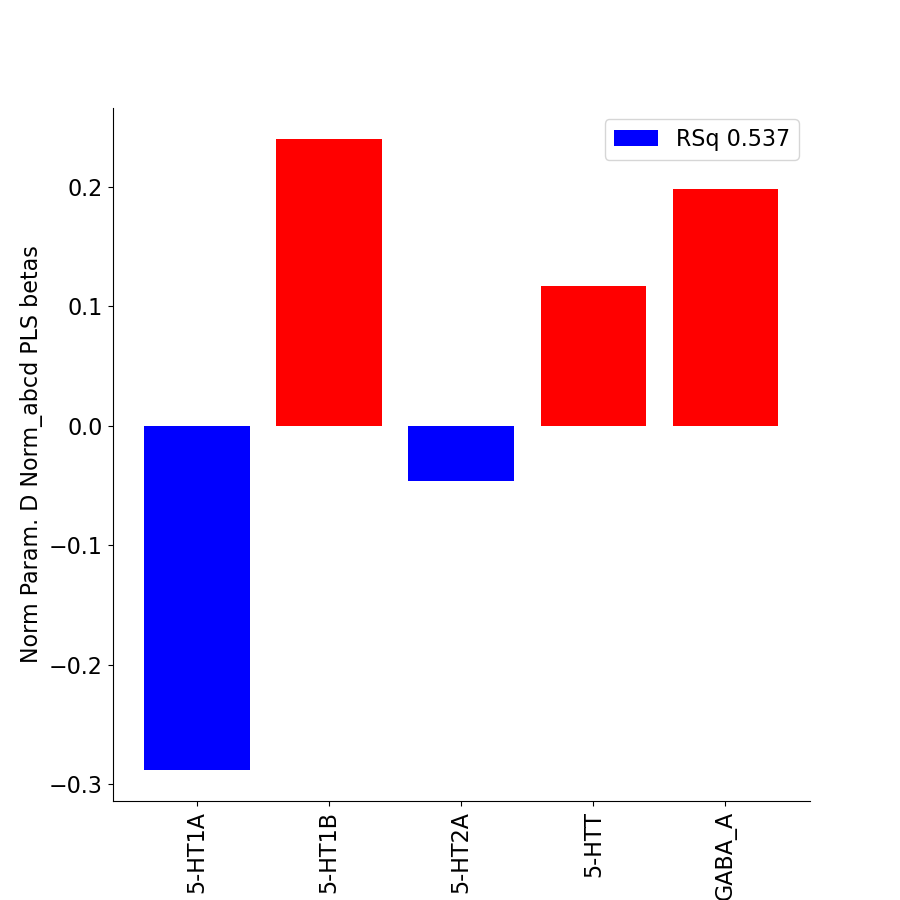

<IPython.core.display.Javascript object>


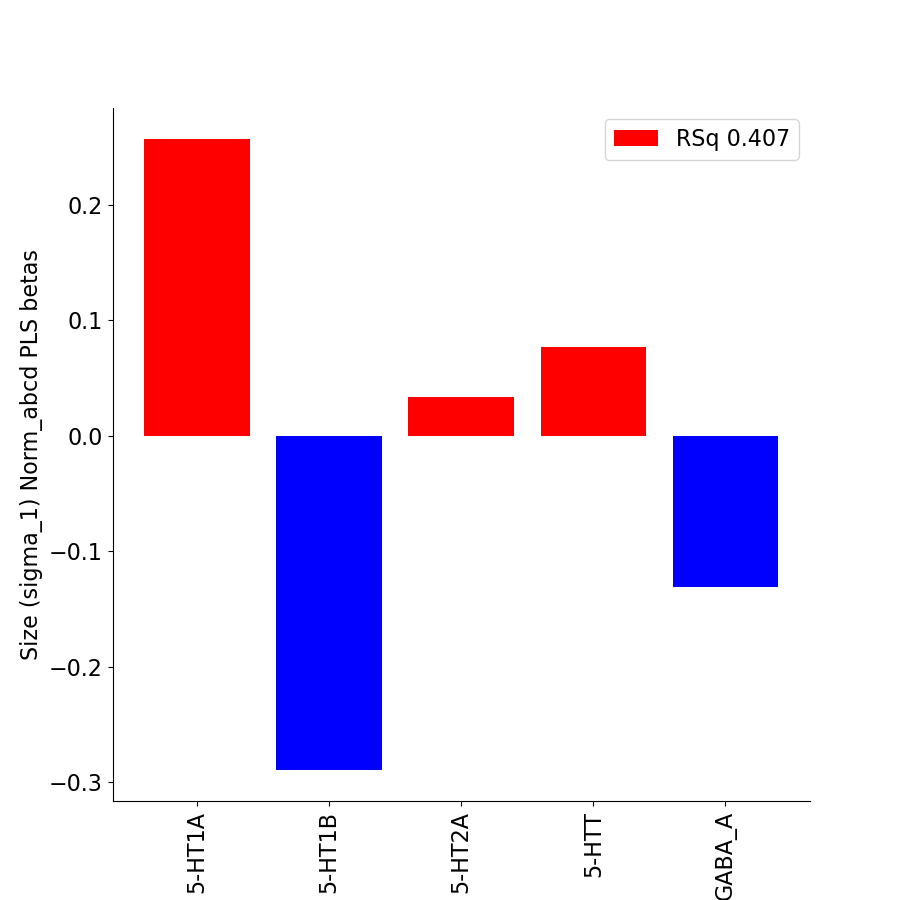

<IPython.core.display.Javascript object>


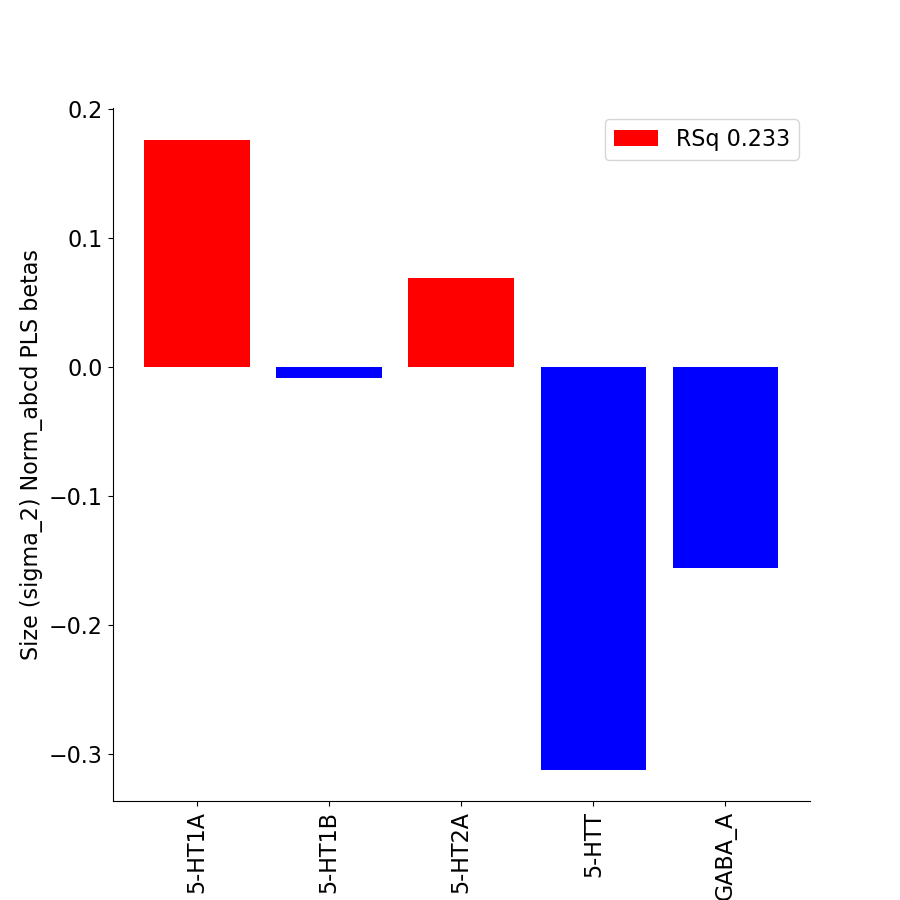

<IPython.core.display.Javascript object>


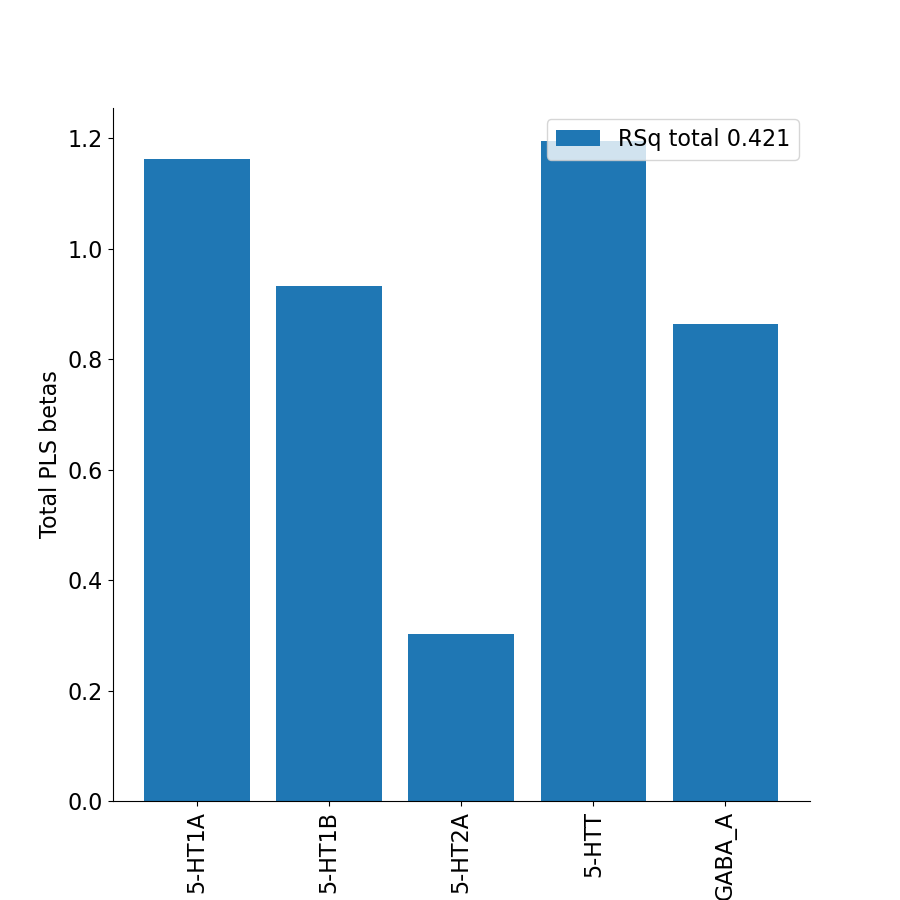

Performing PLS with 4 components
Estimated betas: ['Eccentricity Norm_abcd', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd']
5-HT1A: [-0.2209 -0.1543 -0.2655  0.3052  0.4361], total beta: 1.382
5-HT1B: [-0.2197  0.3508  0.2574 -0.2503  0.2   ], total beta: 1.278
5-HT2A: [-0.0366 -0.1804 -0.0683 -0.0143 -0.1878], total beta: 0.487
5-HTT: [ 0.5093  0.1838  0.119   0.0809 -0.2925], total beta: 1.185
GABA_A: [ 0.1385  0.2535  0.2027 -0.1216 -0.1047], total beta: 0.821
RSq total 0.43905027935391194
RSq predictions [0.3919 0.5438 0.5353 0.4145 0.3097]
corr predictions [0.588  0.701  0.6355 0.5225 0.5177]



<IPython.core.display.Javascript object>


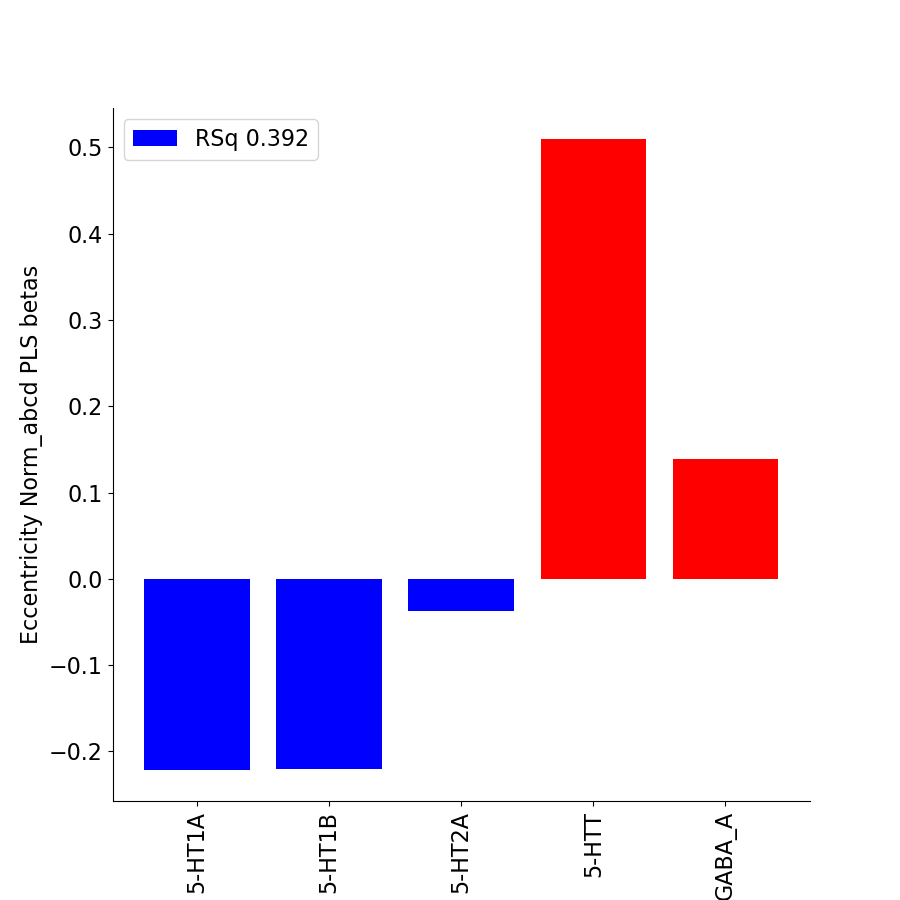

<IPython.core.display.Javascript object>


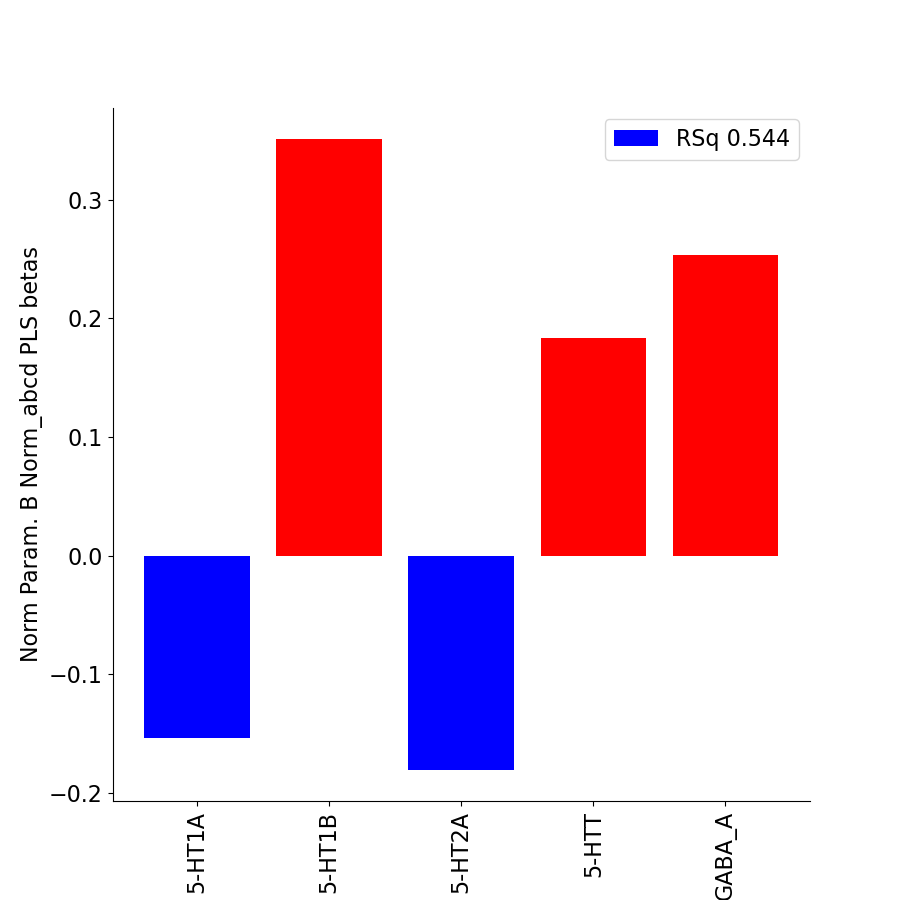

<IPython.core.display.Javascript object>


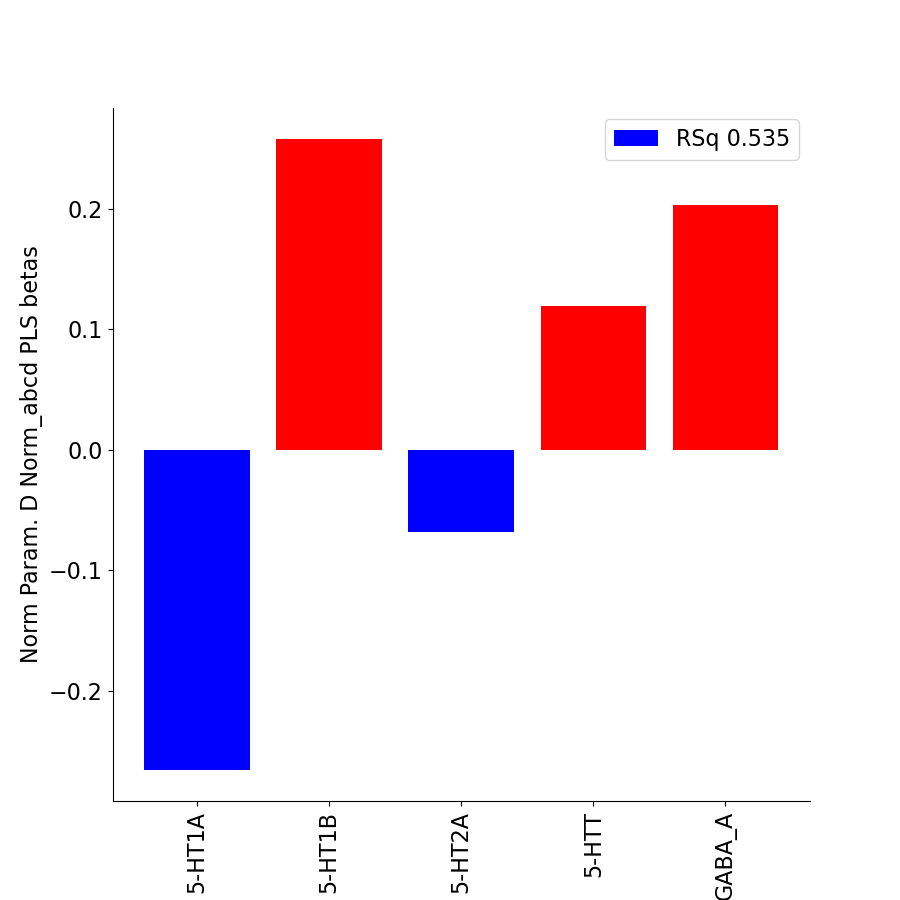

<IPython.core.display.Javascript object>


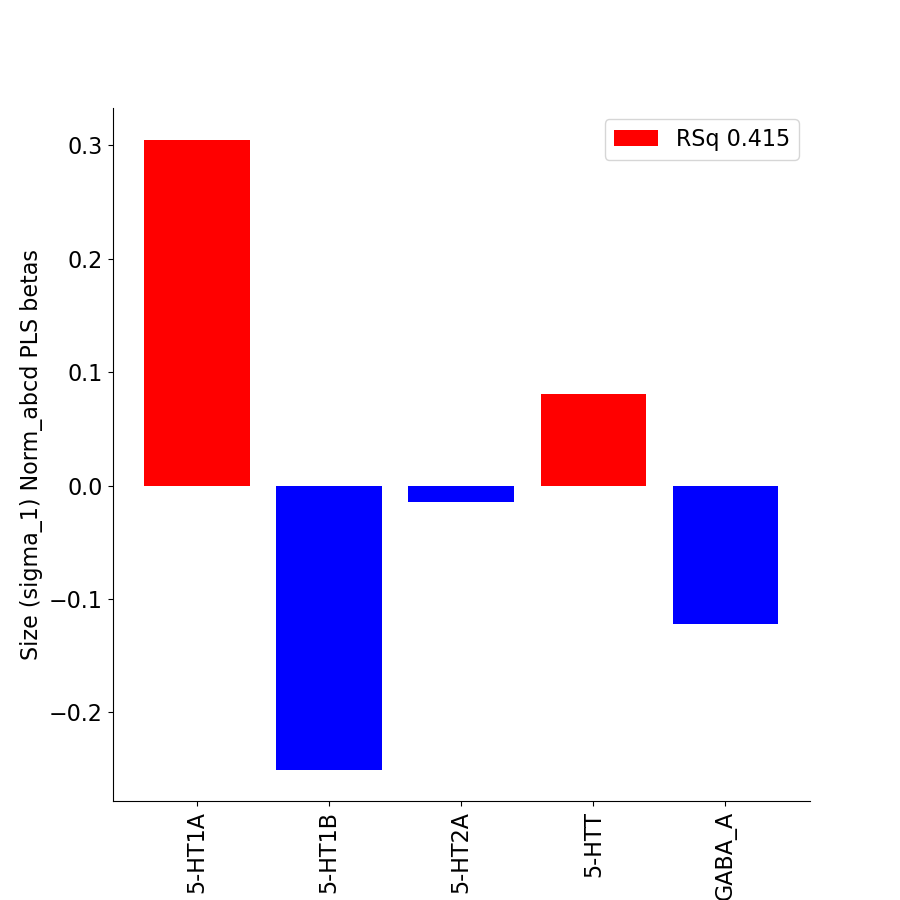

<IPython.core.display.Javascript object>


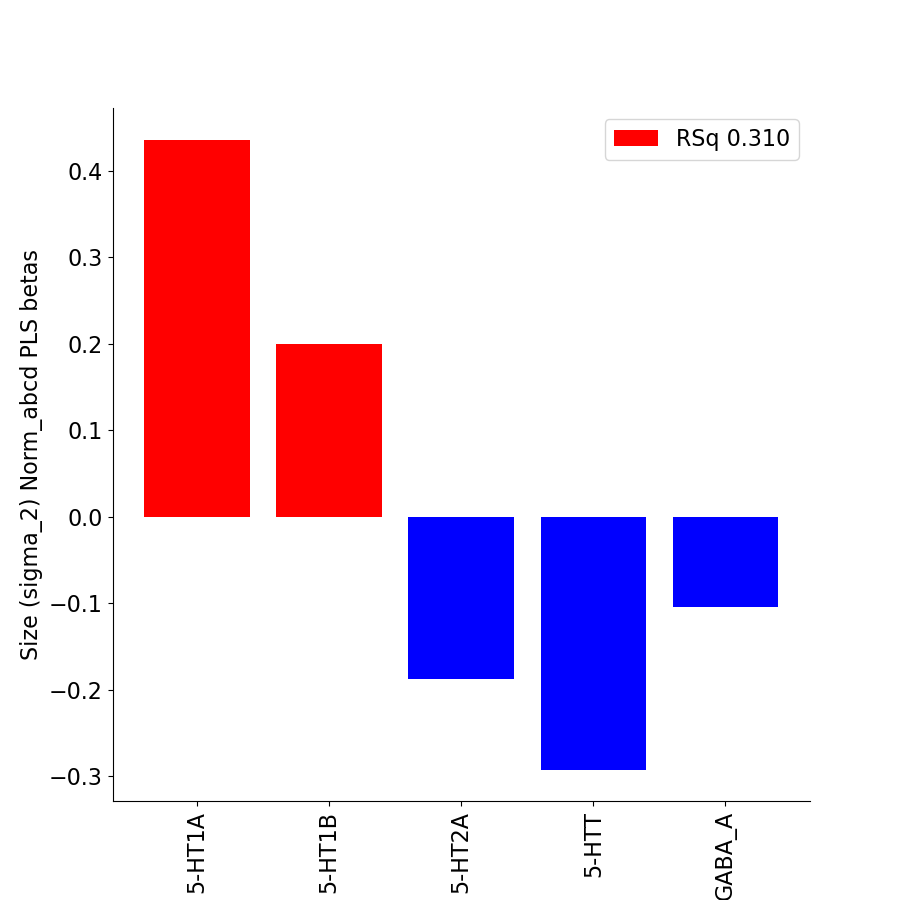

<IPython.core.display.Javascript object>


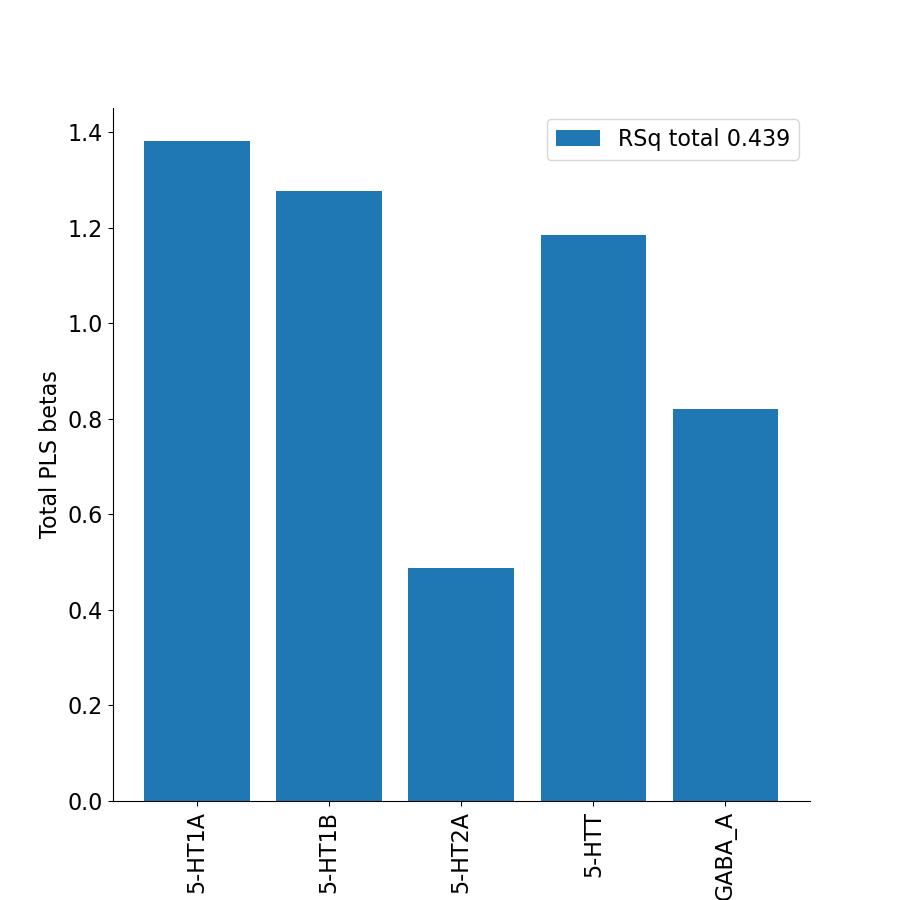

Performing PLS with 5 components
Estimated betas: ['Eccentricity Norm_abcd', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd']
5-HT1A: [-0.2598 -0.1685 -0.2576  0.2757  0.4638], total beta: 1.425
5-HT1B: [-0.1849  0.3635  0.2503 -0.2239  0.1752], total beta: 1.198
5-HT2A: [ 0.0073 -0.1643 -0.0772  0.019  -0.219 ], total beta: 0.487
5-HTT: [ 0.5825  0.2106  0.1041  0.1364 -0.3446], total beta: 1.378
GABA_A: [ 0.0059  0.205   0.2297 -0.2222 -0.0104], total beta: 0.673
RSq total 0.4458399816732646
RSq predictions [0.4092 0.545  0.5356 0.4281 0.3113]
corr predictions [0.5927 0.7015 0.6357 0.5255 0.5204]



<IPython.core.display.Javascript object>


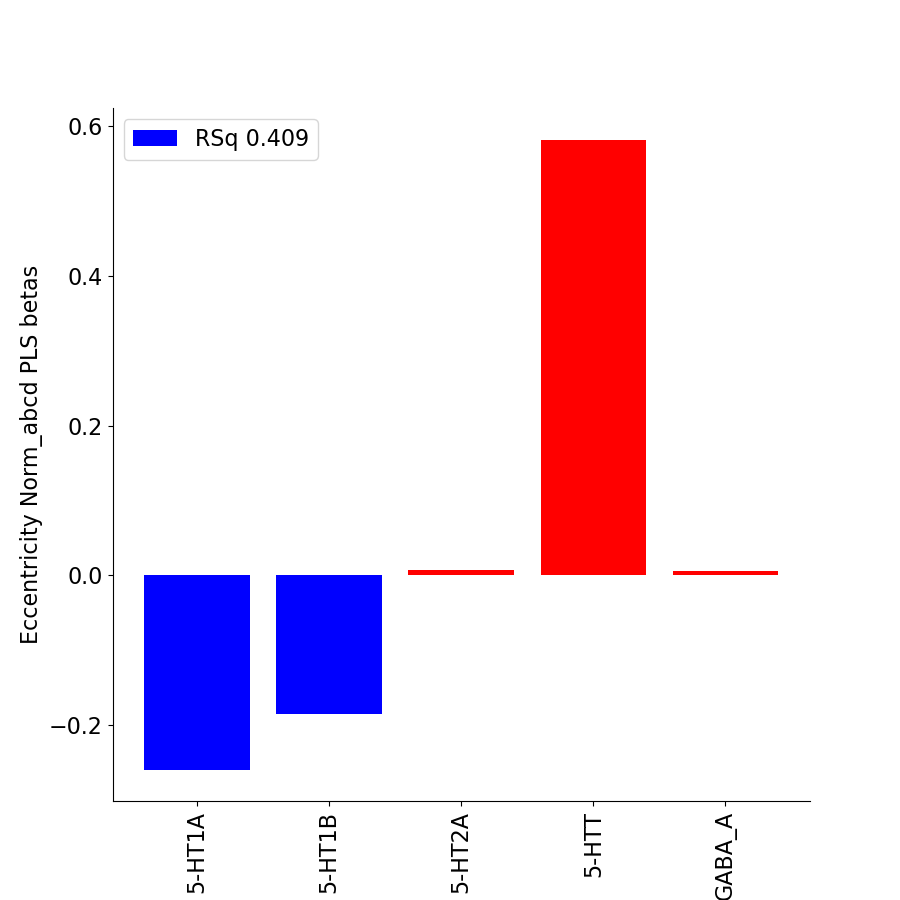

<IPython.core.display.Javascript object>


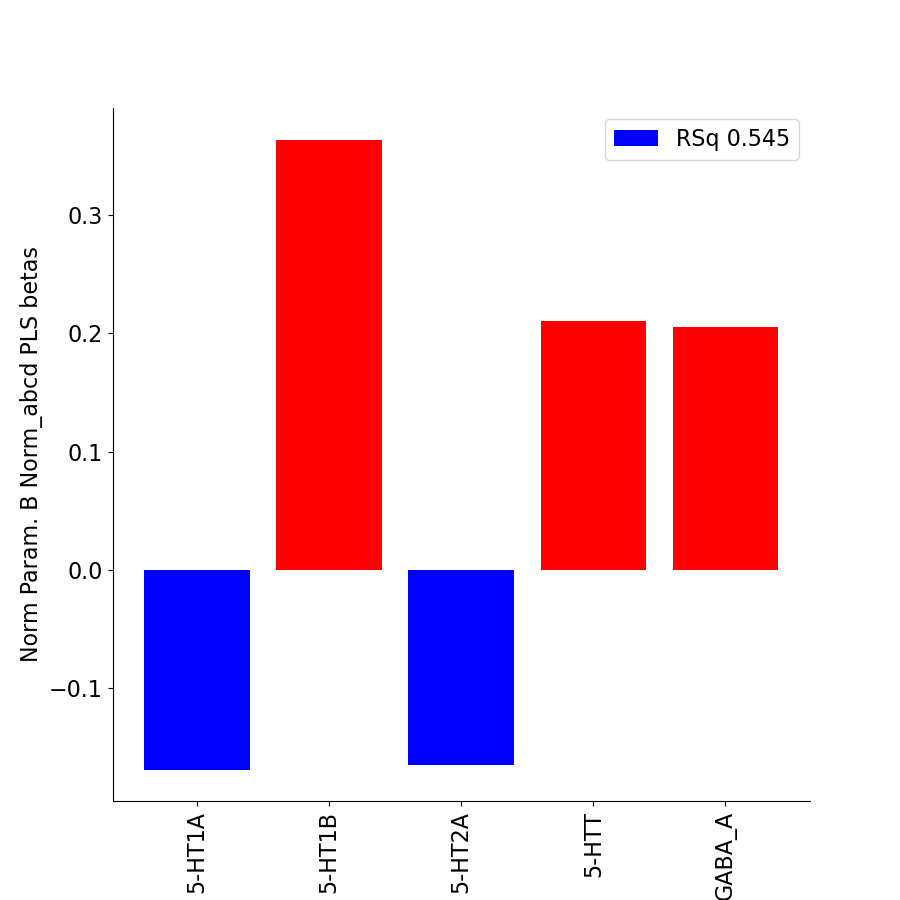

<IPython.core.display.Javascript object>


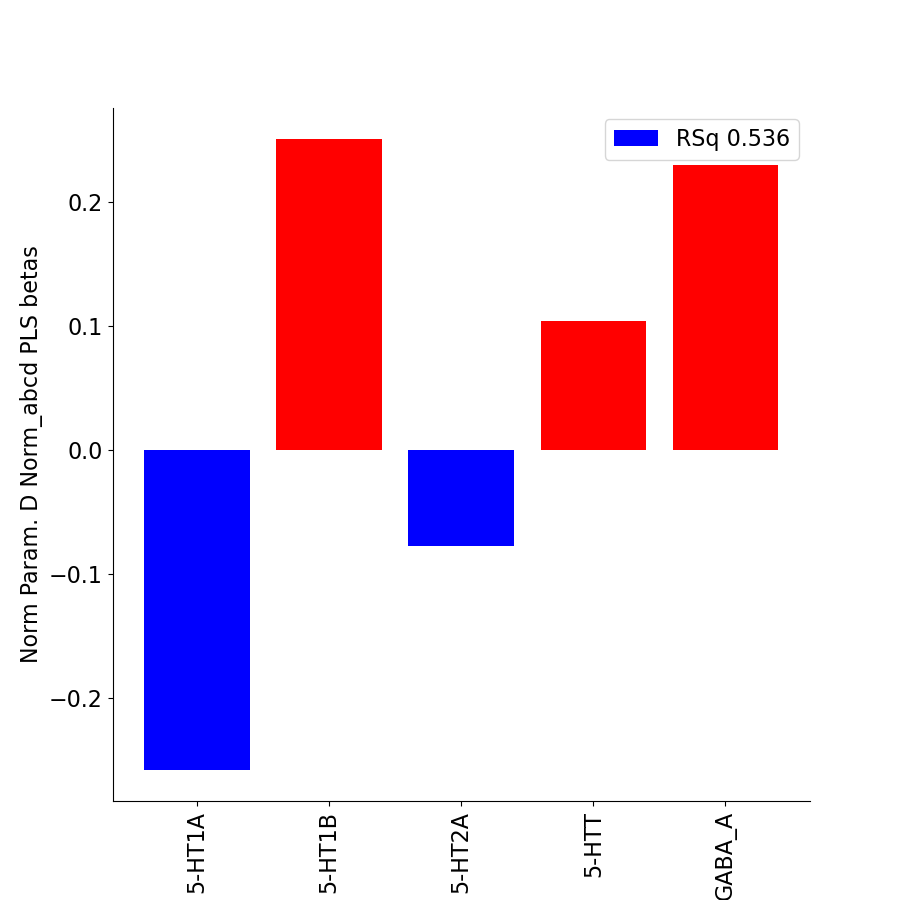

<IPython.core.display.Javascript object>


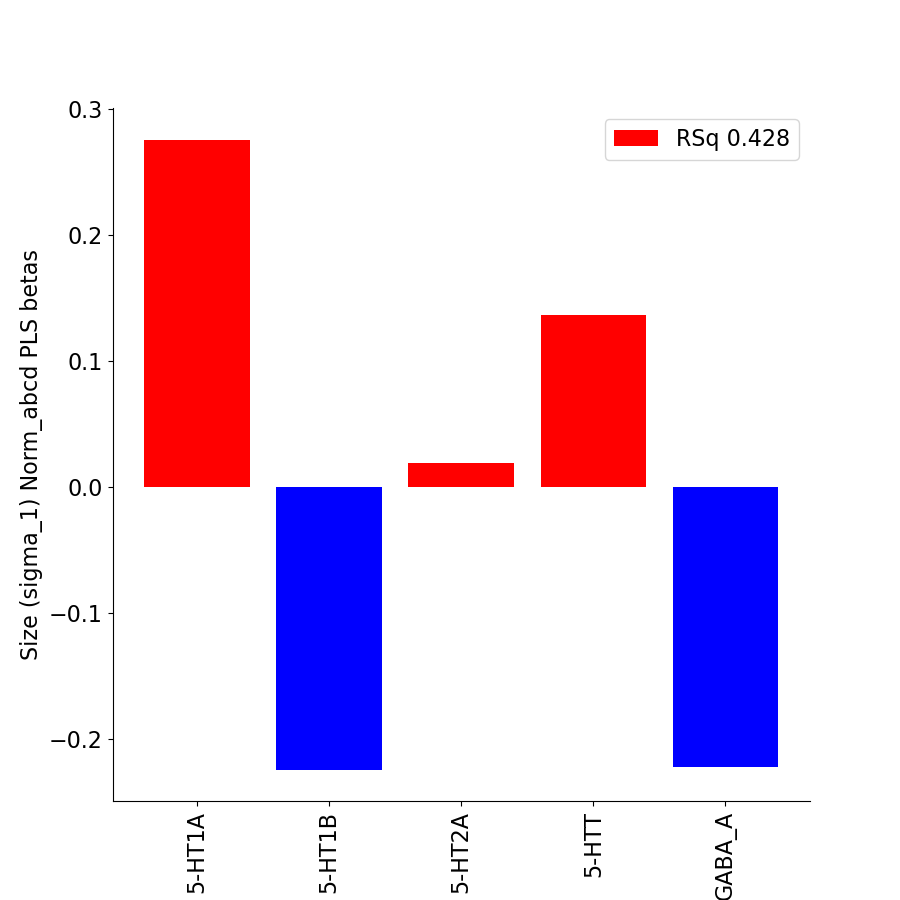

<IPython.core.display.Javascript object>


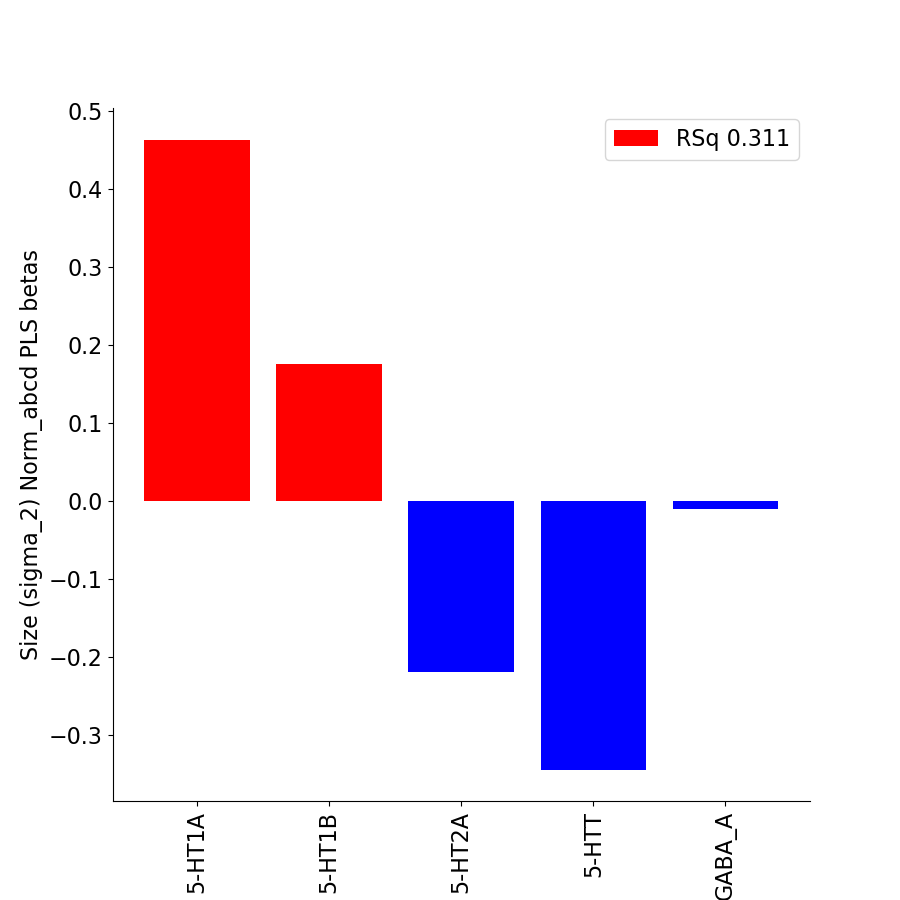

<IPython.core.display.Javascript object>


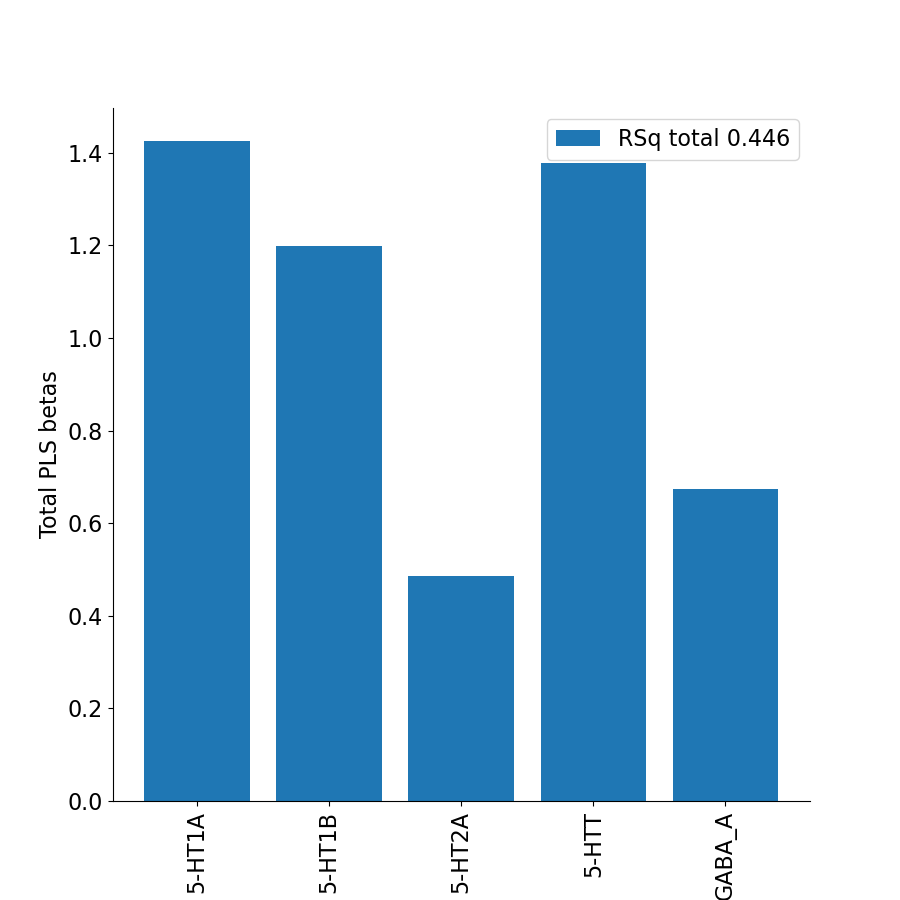

0

In [18]:
#%%capture
#display(HTML("<style>div.output_scroll { height: 150em; }</style>"))
pl.close('all')
#generalized quantitative parameter plots
#'Eccentricity'#'Suppression Index (full)'#'Suppression Index#'Size (fwhmax)'#'Surround Size (fwatmin)'
#'Norm Param. B'#''Ratio (B/D)'#'Norm Param. D'#'RSq'#'CCrsq_task-1R'#'CSS Exponent'#'Amplitude'
#'Surround Amplitude'#'Size (sigma_1)'##'Size (sigma_2)'
#'Size ratio (sigma_2/sigma_1)'#C/A#'B/A'#'D/C'#'D/A'#'B/C'#'Surround volume (full)'#'Centre volume (full)'
#'(A+B)/(C+D)'#'(A*B)/(C*D)'#'(A*D)/(C*B)'#'(A+D)/(C+B)'#'Point-stim derivative'#'(C(A+B))/(A(C+D))'
#'Min/Max Response Ratio'#'Max/Min Response Ratio'#'A(C+D)/C(A+B)'##Min/Max Response Ratio (with BD)'
#'A/C'
####DoG
#'Surround volume (full)'
#'Surround/Centre Amplitude' 
#'Surround-Centre Amplitude'
#'Surround-Centre Volume'

#parameters = ['Eccentricity', 'Norm Param. B', 'Norm Param. D', 'Size (sigma_1)','Size (sigma_2)', 'Amplitude','Surround Amplitude', 'Polar Angle',
#              '5-HT1A', '5-HT1B', '5-HT2A', '5-HT4', '5-HTT', 'GABA_A','Amplitude','Surround Amplitude', 'RSq']#,]#'Size ratio (sigma_2/sigma_1)']# 'Size (sigma_1)', 'Size (sigma_2)', 'Amplitude','Surround Amplitude']

parameters = ['5-HT1A', '5-HT1B', '5-HT2A', 'GABA_A', '5-HTT', 'Eccentricity','Norm Param. B', 'Norm Param. D', 'Size (sigma_1)','Size (sigma_2)','RSq']#

x_dims_idx = [0,1,2,3,4]
y_dims_idx = [5,6,7,8,9]

#rois = ['custom.V1', 'custom.V2', 'custom.V3','custom.V3AB','custom.hV4','custom.LO','custom.TO','custom.IPS','all_custom']
#rois = ['V1', 'V2', 'V3','V3AB','hV4','LO','TO','IPS', 'combined']#['Brain'] #'V1', 'V2', 'V3','V3AB','hV4','LO','TO','IPS','combined', 
#rois = [ 'V1', 'V2', 'V3', 'hV4', 'VO1', 'VO2', 'PHC1', 'PHC2', 'TO2', 'TO1', 'LO2', 'LO1', 'V3B', 'V3A', 'IPS0', 'IPS1', 'IPS2', 'IPS3', 'IPS4', 'IPS5', 'SPL1']#, 'combined']
#rois = ['all_custom']
rois = [roi for roi in vis_res.idx_rois['fsaverage'] if 'glasser' in roi]
#rois = ['glasser_V1','glasser_V2','glasser_V3','glasser_V4','glasser_V3A','glasser_V7','glasser_V3B','glasser_V3CD',
#'glasser_LO1','glasser_LO2','glasser_PIT','glasser_V8','glasser_VMV3',
#'glasser_IPS1','glasser_IP0','glasser_PGp','glasser_LO3','glasser_MT','glasser_V4t','glasser_FFC']
rois.append('combined')
        
rsq_thresh = 0.0
save_figures= False
figure_path = '/Volumes/Crucial X8/PRFMapping/Figures/attemptwnames_glasser_ecc65rsq030/pls'

space_names = 'fsaverage'
#set to 'all' to plot all analyses
analysis_names = 'fit-task-BAR_fit-runs-all'#'fit-task-BAR_fit-runs-CVmedian'

subject_ids = ['fsaverage_cvrsq']#['fsaverage_hcp1sthalf', 'fsaverage_hcp2ndhalf']

threshold_li = filters.threshold_li(vis_res.main_dict[space_names][analysis_names][subject_ids[0]]['Processed Results']['#Subjects with CVRSq>0']['Norm_abcd'])

vis_res.set_alpha(only_models=['Norm_abcd'], ecc_min=0.0, ecc_max=6.5, min_number_sjs=threshold_li)

vis_res.multidim_analysis(parameters, rois, rsq_thresh, save_figures, figure_path, space_names = space_names, parameter_toplevel='Receptor Maps', rsq_weights= True,
                    analysis_names = analysis_names, subject_ids = subject_ids, x_dims_idx=x_dims_idx, y_dims_idx=y_dims_idx,
                          zscore_data= False, zscore_data_across_rois = True, 
                          size_response_curves = False, plot_corr_matrix = False, perform_ols = False, polar_plots = False,
                             cv_regression = False, bold_voxel_volume=4.096, zconfint_err_alpha=None, quantile_exclusion=0.999,
                          #vis_pca_comps_rois: fr which rois to make pca comp beta plots; 
                          #vis_pca_comps_axes: which comps to use in 2d plot of mean pca comp per roi
                        perform_pca = False, vis_pca_pycortex = False, vis_pca_comps_rois = ['combined'], vis_pca_comps_axes = [0,1], rsq_alpha_pca_plot = True,
                          perform_pls = True, vis_pls_pycortex = False)

os.system(f"open {sound_file}")


## Size-response curves

In [19]:
vis_res.main_dict['fsaverage']['fit-task-BAR_fit-runs-all']['fsaverage_cvrsq']['analysis_info'] = vis_res.main_dict['HCP']['fit-task-BAR_fit-runs-all']['100610']['analysis_info']

HCP fit-task-BAR_fit-runs-all 100610
HCP fit-task-BAR_fit-runs-all 102311
HCP fit-task-BAR_fit-runs-all 102816
HCP fit-task-BAR_fit-runs-all 104416
HCP fit-task-BAR_fit-runs-all 105923
HCP fit-task-BAR_fit-runs-all 108323
HCP fit-task-BAR_fit-runs-all 109123
HCP fit-task-BAR_fit-runs-all 111312
HCP fit-task-BAR_fit-runs-all 111514
HCP fit-task-BAR_fit-runs-all 114823
HCP fit-task-BAR_fit-runs-all 115017
HCP fit-task-BAR_fit-runs-all 115825
HCP fit-task-BAR_fit-runs-all 116726
HCP fit-task-BAR_fit-runs-all 118225
HCP fit-task-BAR_fit-runs-all 125525
HCP fit-task-BAR_fit-runs-all 126426
HCP fit-task-BAR_fit-runs-all 128935
HCP fit-task-BAR_fit-runs-all 130114
HCP fit-task-BAR_fit-runs-all 130518
HCP fit-task-BAR_fit-runs-all 131217
HCP fit-task-BAR_fit-runs-all 131722
HCP fit-task-BAR_fit-runs-all 132118
HCP fit-task-BAR_fit-runs-all 134627
HCP fit-task-BAR_fit-runs-all 134829
HCP fit-task-BAR_fit-runs-all 135124
HCP fit-task-BAR_fit-runs-all 137128
HCP fit-task-BAR_fit-runs-all 140117
H

fsaverage fit-task-BAR_fit-runs-all 165436
fsaverage fit-task-BAR_fit-runs-all 167036
fsaverage fit-task-BAR_fit-runs-all 167440
fsaverage fit-task-BAR_fit-runs-all 169040
fsaverage fit-task-BAR_fit-runs-all 169343
fsaverage fit-task-BAR_fit-runs-all 169444
fsaverage fit-task-BAR_fit-runs-all 169747
fsaverage fit-task-BAR_fit-runs-all 171633
fsaverage fit-task-BAR_fit-runs-all 172130
fsaverage fit-task-BAR_fit-runs-all 173334
fsaverage fit-task-BAR_fit-runs-all 175237
fsaverage fit-task-BAR_fit-runs-all 176542
fsaverage fit-task-BAR_fit-runs-all 177140
fsaverage fit-task-BAR_fit-runs-all 177645
fsaverage fit-task-BAR_fit-runs-all 177746
fsaverage fit-task-BAR_fit-runs-all 178142
fsaverage fit-task-BAR_fit-runs-all 178243
fsaverage fit-task-BAR_fit-runs-all 178647
fsaverage fit-task-BAR_fit-runs-all 180533
fsaverage fit-task-BAR_fit-runs-all 181232
fsaverage fit-task-BAR_fit-runs-all 181636
fsaverage fit-task-BAR_fit-runs-all 182436
fsaverage fit-task-BAR_fit-runs-all 182739
fsaverage f

Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HT4', '5-HTT', 'Amplitude Norm_abcd', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'Polar Angle Norm_abcd', 'RSq Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd', 'Surround Amplitude Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HT4', '5-HTT', 'Amplitude Norm_abcd', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'Polar Angle Norm_abcd', 'RSq Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd', 'Surround Amplitude Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HT4', '5-HTT', 'Amplitude Norm_abcd', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'Polar Angle Norm_abcd', 'RSq Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd', 'Surround Amplitude Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HT4', '5-H

Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HT4', '5-HTT', 'Amplitude Norm_abcd', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'Polar Angle Norm_abcd', 'RSq Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd', 'Surround Amplitude Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HT4', '5-HTT', 'Amplitude Norm_abcd', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'Polar Angle Norm_abcd', 'RSq Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd', 'Surround Amplitude Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HT4', '5-HTT', 'Amplitude Norm_abcd', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'Polar Angle Norm_abcd', 'RSq Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd', 'Surround Amplitude Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HT4', '5-H

Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_POS1
X-dims: ['Eccentricity Norm_abcd', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'Polar Angle Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd']
Y-dims: ['Amplitude Norm_abcd', 'Surround Amplitude Norm_abcd']
alldims ['Eccentricity Norm_abcd', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'Polar Angle Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd', 'Amplitude Norm_abcd', 'Surround Amplitude Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HT4', '5-HTT', 'Amplitude Norm_abcd', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'Polar Angle Norm_abcd', 'RSq Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd', 'Surround Amplitude Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_POS2
X-dims: ['Eccentricity Norm_abcd', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'Polar Angl

<IPython.core.display.Javascript object>


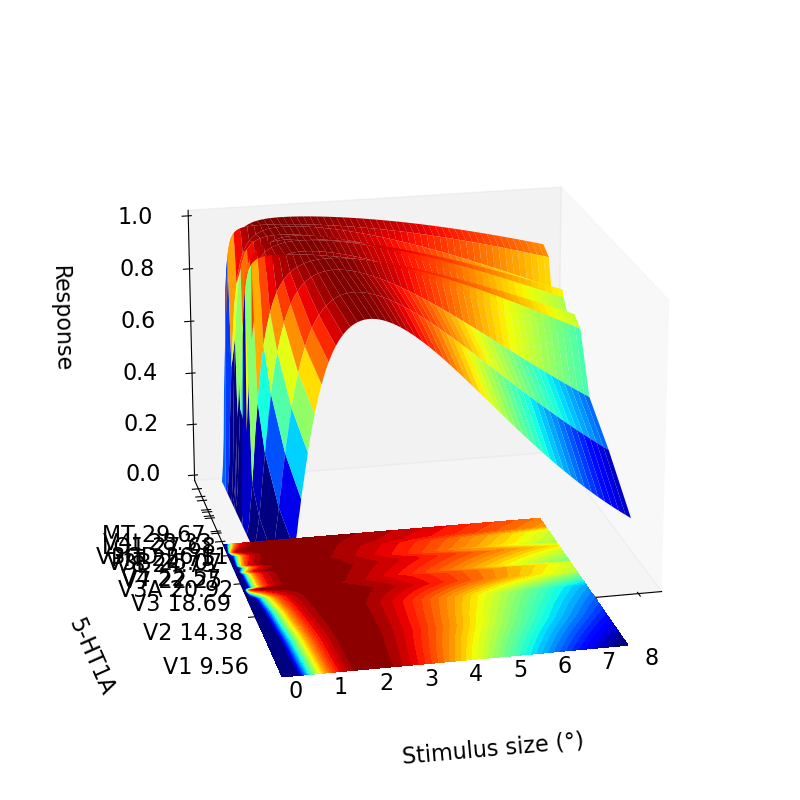

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_1
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_10d
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_10pp
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_10r
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_10v
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_11l
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_13l
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_2
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_23c
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_23d
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_24dd
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_24dv
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_25
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_31a
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_31pd
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_31pv
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_33pr
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_3a
fit-task-BAR_fit-runs-all fs

<IPython.core.display.Javascript object>


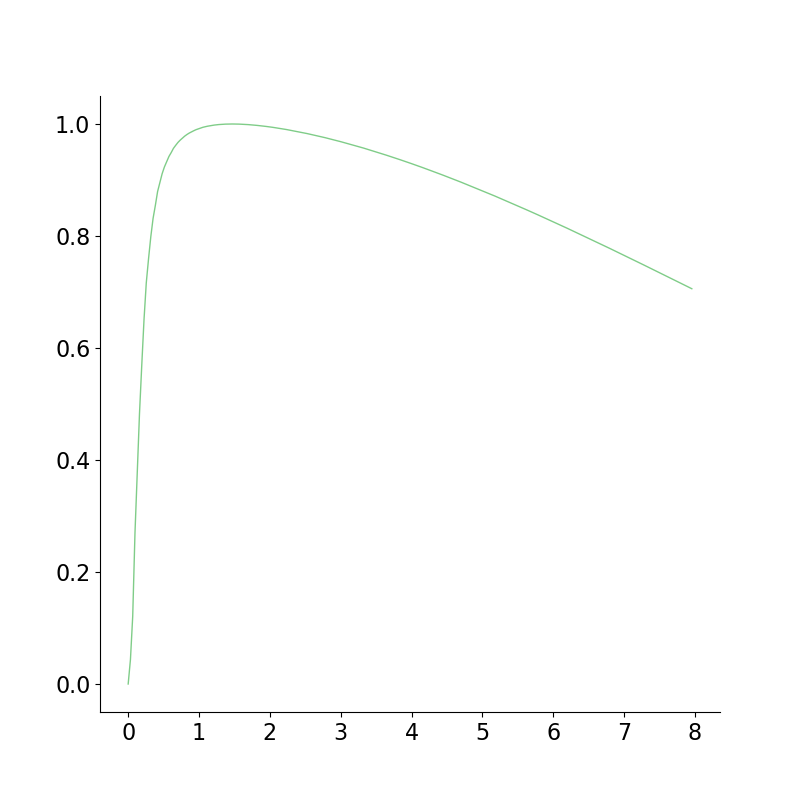

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_LO2
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_LO3
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_MBelt
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_MI
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_MIP
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_MST
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_MT


<IPython.core.display.Javascript object>


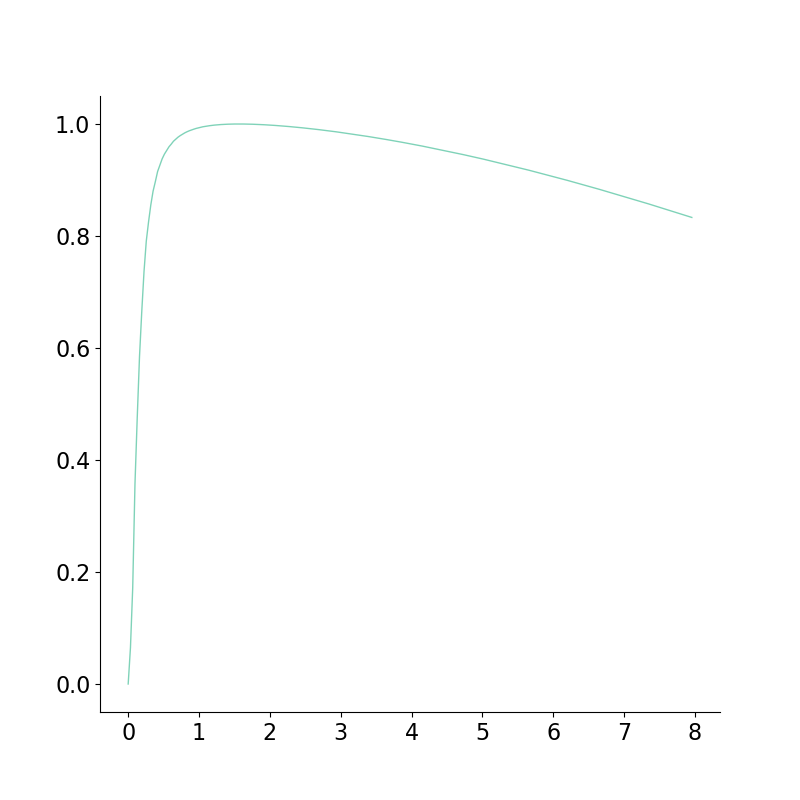

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_OFC
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_OP1
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_OP2-3
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_OP4
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_p10p
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_p24
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_p24pr
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_p32
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_p32pr
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_p47r
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_p9-46v
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PBelt
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PCV
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PeEc
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PEF
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PF
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PFcm
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PFm
fit-task-BAR_f

<IPython.core.display.Javascript object>


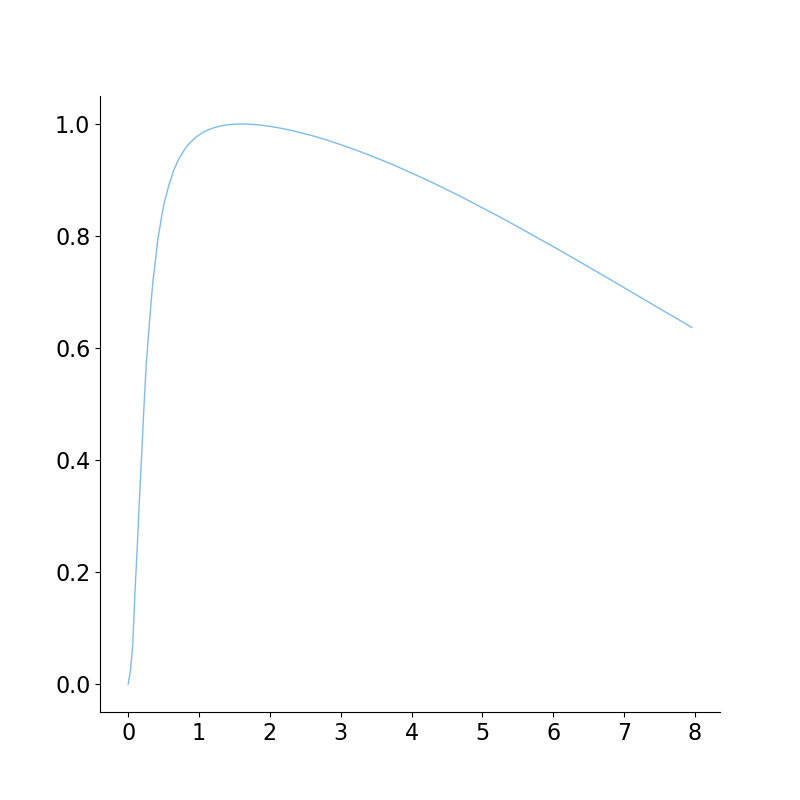

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_pOFC
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PoI1
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PoI2
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_POS1
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_POS2
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PreS
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_ProS
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PSL
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_RI
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_RSC
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_s32
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_s6-8
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_SCEF
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_SFL
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_STGa
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_STSda
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_STSdp
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_STSva
fit-task-BAR_

<IPython.core.display.Javascript object>


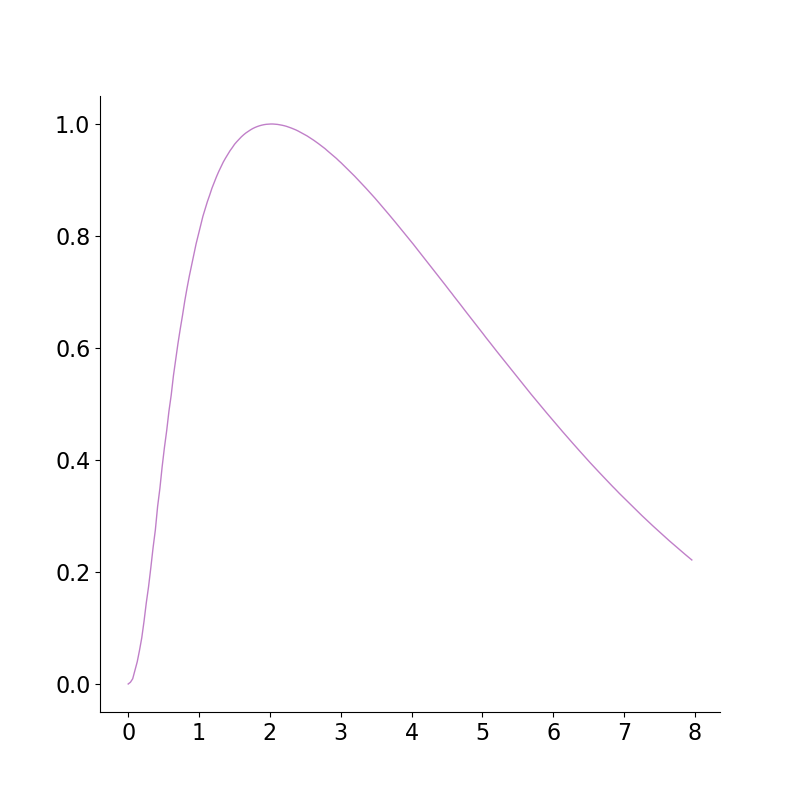

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_V2


<IPython.core.display.Javascript object>


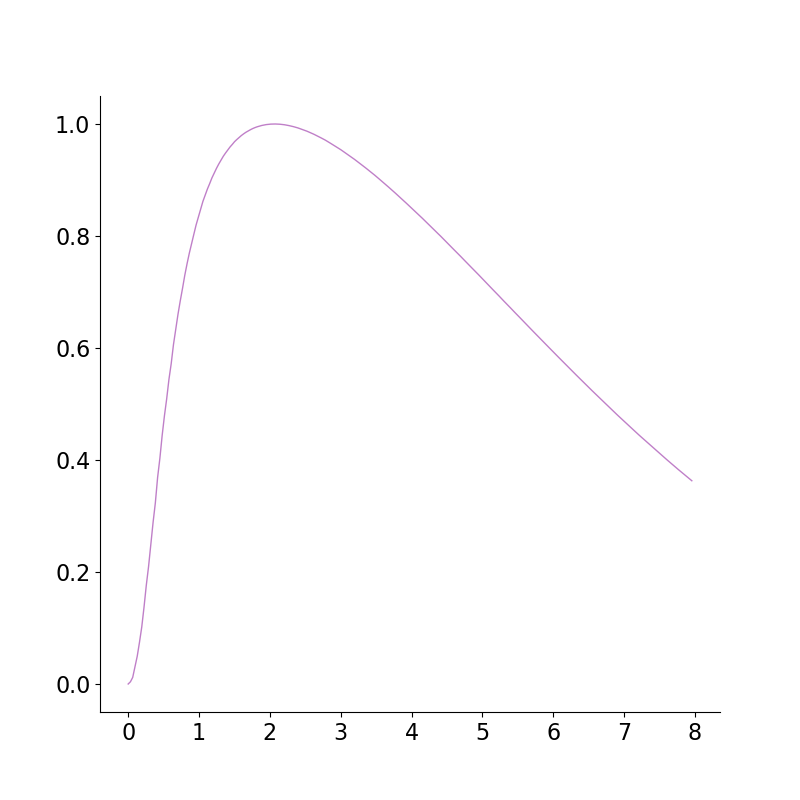

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_v23ab
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_V3


<IPython.core.display.Javascript object>


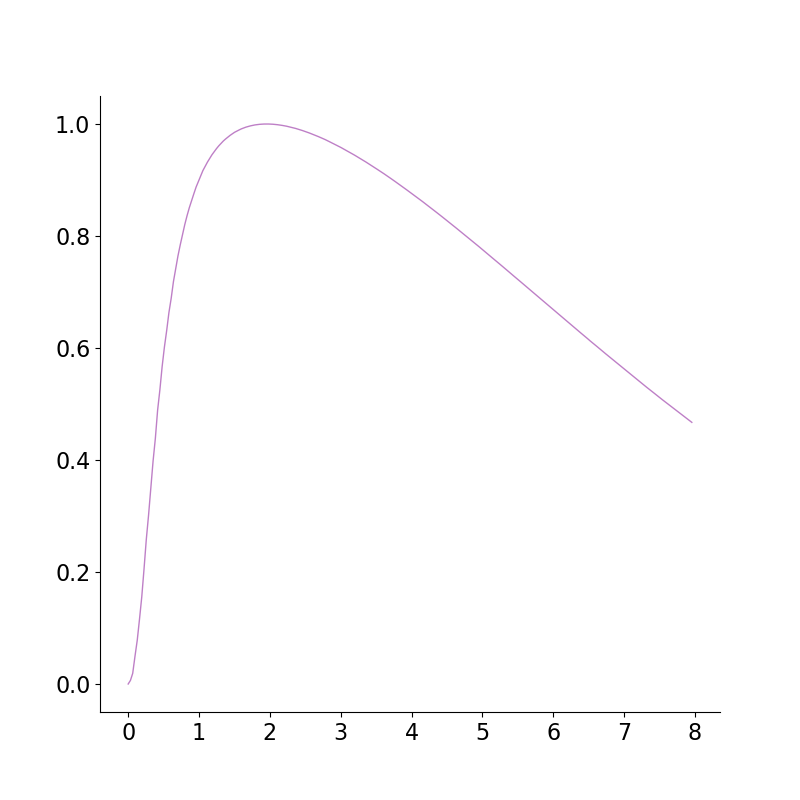

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_V3A


<IPython.core.display.Javascript object>


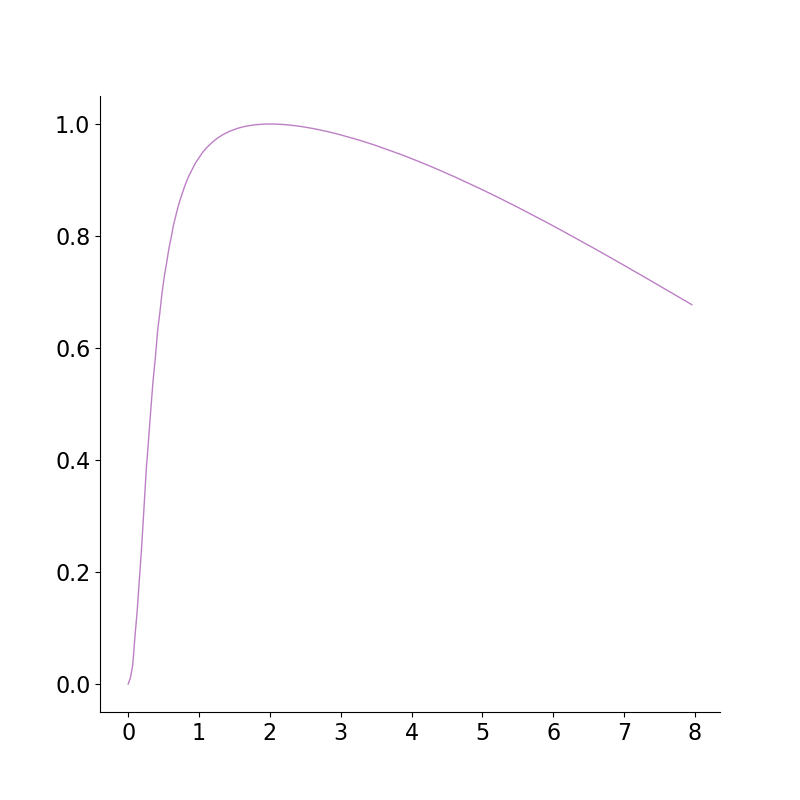

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_V3B


<IPython.core.display.Javascript object>


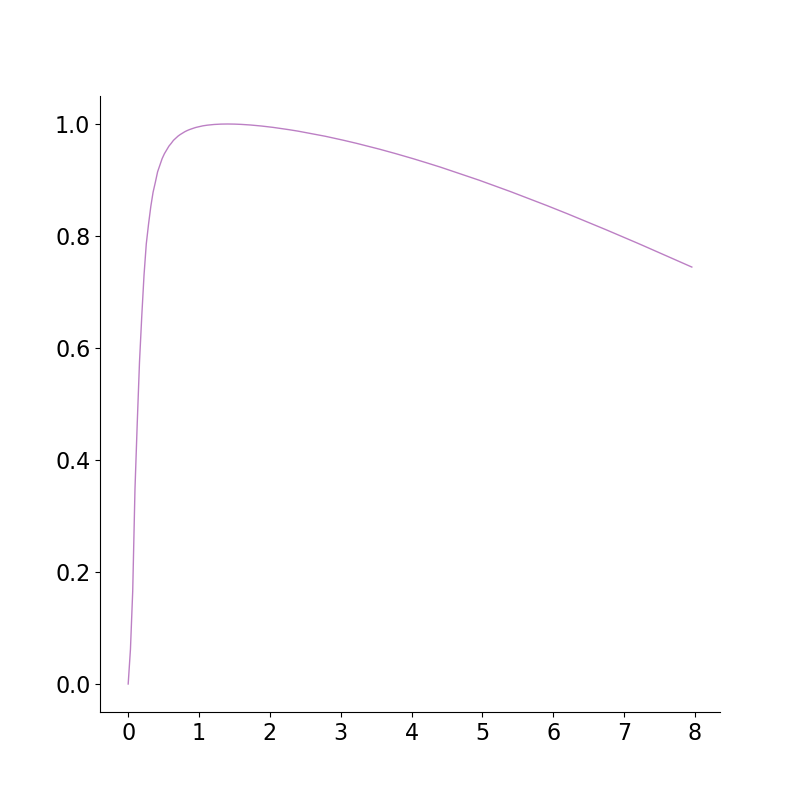

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_V3CD


<IPython.core.display.Javascript object>


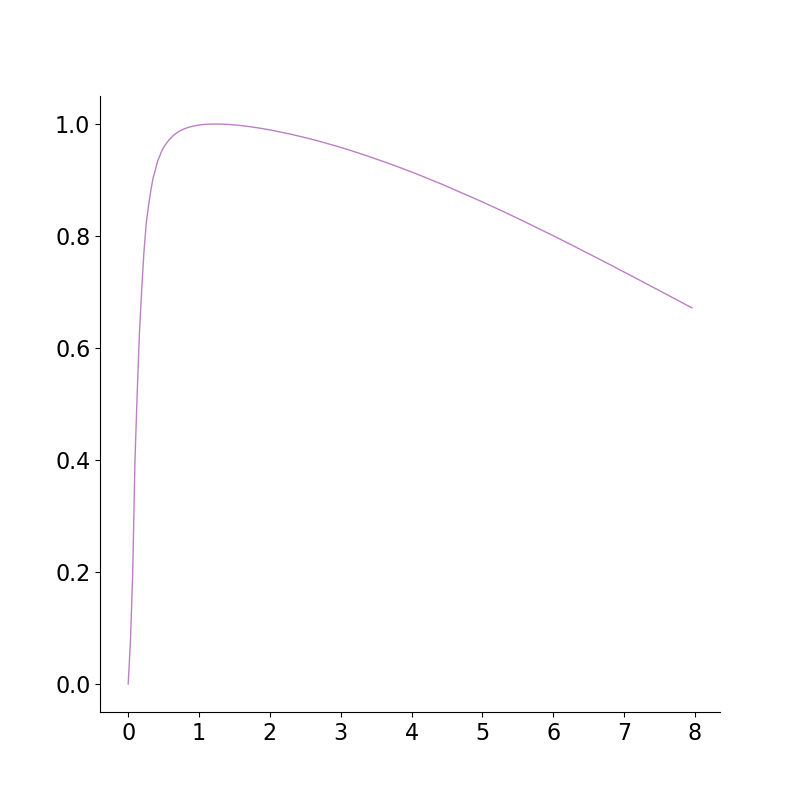

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_V4


<IPython.core.display.Javascript object>


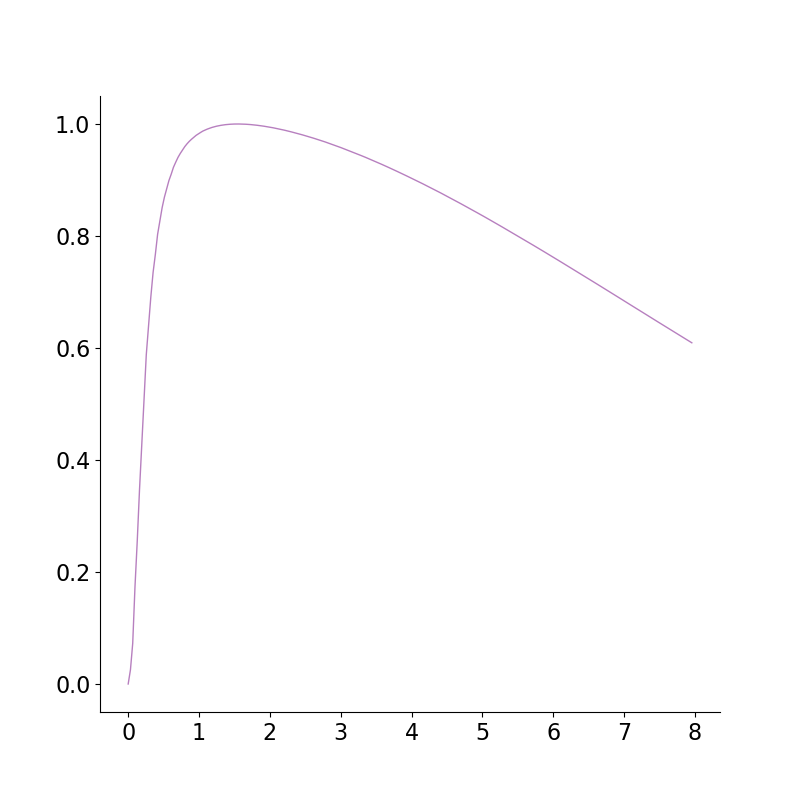

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_V4t


<IPython.core.display.Javascript object>


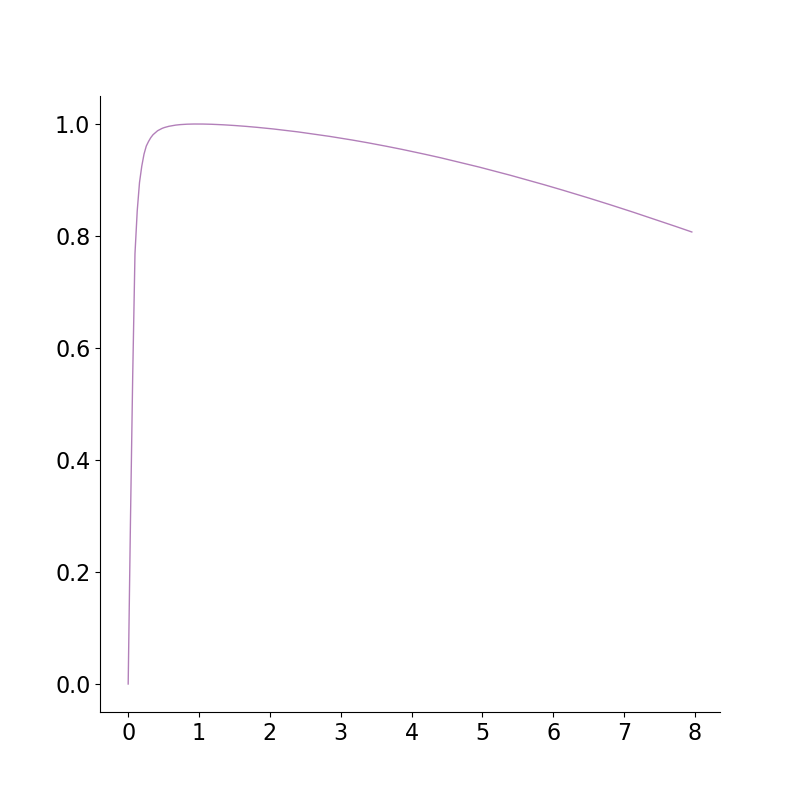

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_V6
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_V6A
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_V7


<IPython.core.display.Javascript object>


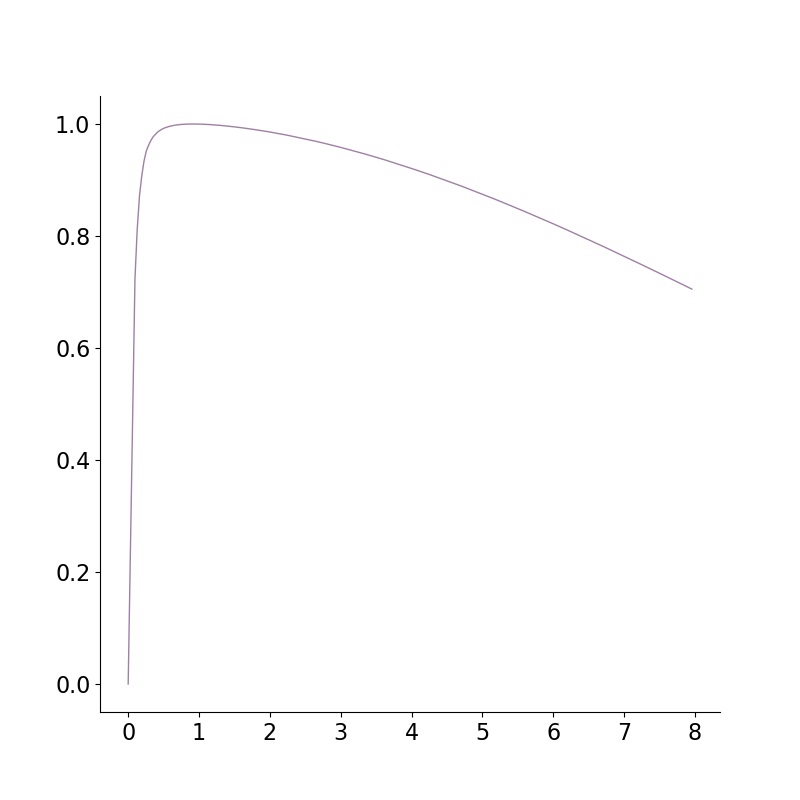

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_V8


<IPython.core.display.Javascript object>


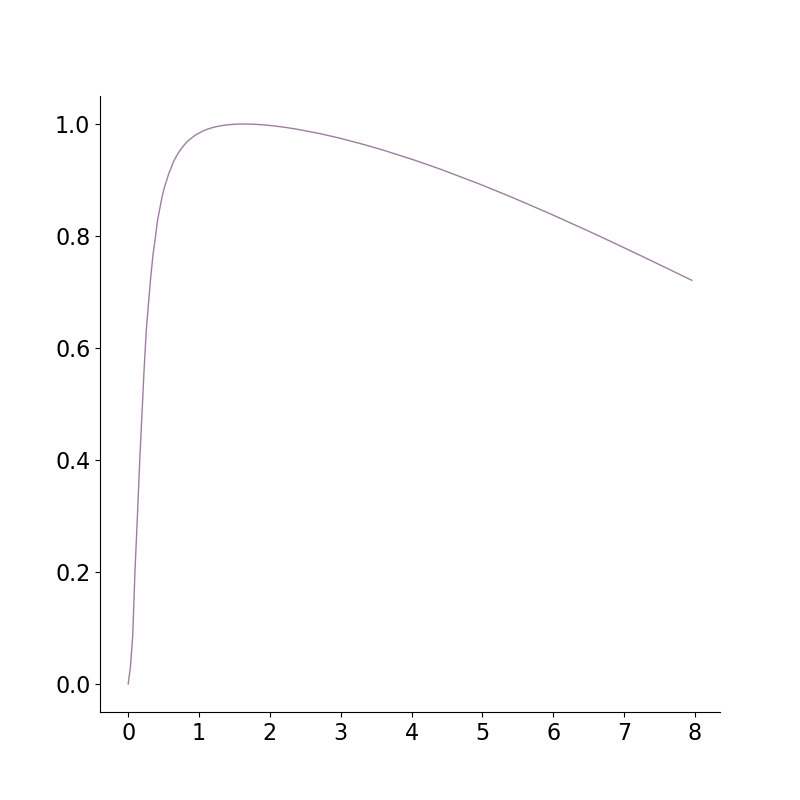

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_VIP
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_VMV1
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_VMV2
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_VMV3
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_VVC


0

In [22]:
#%%capture
#display(HTML("<style>div.output_scroll { height: 150em; }</style>"))
pl.close('all')
#generalized quantitative parameter plots
#'Eccentricity'#'Suppression Index (full)'#'Suppression Index#'Size (fwhmax)'#'Surround Size (fwatmin)'
#'Norm Param. B'#''Ratio (B/D)'#'Norm Param. D'#'RSq'#'CCrsq_task-1R'#'CSS Exponent'#'Amplitude'
#'Surround Amplitude'#'Size (sigma_1)'##'Size (sigma_2)'
#'Size ratio (sigma_2/sigma_1)'#C/A#'B/A'#'D/C'#'D/A'#'B/C'#'Surround volume (full)'#'Centre volume (full)'
#'(A+B)/(C+D)'#'(A*B)/(C*D)'#'(A*D)/(C*B)'#'(A+D)/(C+B)'#'Point-stim derivative'#'(C(A+B))/(A(C+D))'
#'Min/Max Response Ratio'#'Max/Min Response Ratio'#'A(C+D)/C(A+B)'##Min/Max Response Ratio (with BD)'
#'A/C'
####DoG
#'Surround volume (full)'
#'Surround/Centre Amplitude' 
#'Surround-Centre Amplitude'
#'Surround-Centre Volume'

parameters = ['Eccentricity', 'Norm Param. B', 'Norm Param. D', 'Size (sigma_1)','Size (sigma_2)', 'Polar Angle',
              '5-HT1A', '5-HT1B', '5-HT2A', '5-HT4', '5-HTT', 'GABA_A','Amplitude','Surround Amplitude', 'RSq']#,'Amplitude','Surround Amplitude']#'Size ratio (sigma_2/sigma_1)']# 'Size (sigma_1)', 'Size (sigma_2)', 'Amplitude','Surround Amplitude']

x_dims_idx = [0,1,2,3,4,5]
y_dims_idx = [12,13]

third_dim_sr_curves = '5-HT1A'#'Norm Param. D Norm_abcd'

#rois = ['custom.V1', 'custom.V2', 'custom.V3','custom.V3AB','custom.hV4','custom.LO','custom.TO','custom.VO','custom.IPS']
#rois = ['V1', 'V2', 'V3','V3AB','hV4','LO','TO','VO','IPS']#,'combined']#[roi for roi in vis_res.idx_rois['fsaverage'] if 'glasser' in roi] #'V1', 'V2', 'V3','V3AB','hV4','LO','TO','IPS','combined', 
rois = [roi for roi in vis_res.idx_rois['fsaverage'] if 'glasser' in roi]
#rois = ['glasser_V1','glasser_V2','glasser_V3','glasser_V4','glasser_V3A','glasser_V7','glasser_V3B','glasser_V3CD',
#'glasser_LO1','glasser_LO2','glasser_PIT','glasser_V8','glasser_VMV3',
#'glasser_IPS1','glasser_IP0','glasser_PGp','glasser_LO3','glasser_MT','glasser_V4t','glasser_FFC']
#rois = [ 'V1', 'V2', 'V3', 'hV4', 'VO1', 'VO2', 'PHC1', 'PHC2', 'TO2', 'TO1', 'LO2', 'LO1', 'V3B', 'V3A', 'IPS0', 'IPS1', 'IPS2', 'IPS3', 'IPS4', 'IPS5', 'SPL1', 'combined']
#rois = ['all_custom']
        
rsq_thresh = 0.2
save_figures = False
figure_path = '/Volumes/Crucial X8/PRFMapping/Figures/newfsarsqwmlowthr/size_response_glasser'

space_names = 'fsaverage'
#set to 'all' to plot all analyses
analysis_names = 'fit-task-BAR_fit-runs-all'

subject_ids = ['fsaverage_cvrsq']#'fsaverage_hcp1sthalf', 'fsaverage_hcp2ndhalf']

threshold_li = filters.threshold_li(vis_res.main_dict[space_names][analysis_names][subject_ids[0]]['Processed Results']['#Subjects with CVRSq>0']['Norm_abcd'])

vis_res.set_alpha(only_models=['Norm_abcd'], ecc_min=0.0, ecc_max=6.5, min_number_sjs=threshold_li)

vis_res.multidim_analysis(parameters, rois, rsq_thresh, save_figures, figure_path, space_names = space_names, parameter_toplevel='Receptor Maps', rsq_weights= True,
                    analysis_names = analysis_names, subject_ids = subject_ids, x_dims_idx=x_dims_idx, y_dims_idx=y_dims_idx,
                          zscore_data = False, zscore_data_across_rois = False, 
                          size_response_curves = True, third_dim_sr_curves = third_dim_sr_curves,
                          plot_corr_matrix = False, perform_ols = False, polar_plots = False,
                             cv_regression = False, bold_voxel_volume=4.096, zconfint_err_alpha=None, quantile_exclusion=0.999,
                            #vis_pca_comps_rois: fr which rois to make pca comp beta plots; 
                          #vis_pca_comps_axes: which comps to use in 2d plot of mean pca comp per roi
                        perform_pca = False, vis_pca_pycortex = False, vis_pca_comps_rois = ['combined'], vis_pca_comps_axes = [0,1], rsq_alpha_pca_plot = True,
                          perform_pls = False, vis_pls_pycortex = False)

os.system(f"open {sound_file}")

In [ ]:
[[3, 4], [2, 4], [2, 3], [1, 4], [1, 3], [1, 2], [0, 4], [0, 3], [0, 2], [0, 1]]

In [54]:
import itertools

N = 4
numbers = list(range(N+1))

combinations = []
for i in range(1, N+2):
    combinations.extend(itertools.combinations(numbers, i))

print(combinations[::-1])

[(0, 1, 2, 3, 4), (1, 2, 3, 4), (0, 2, 3, 4), (0, 1, 3, 4), (0, 1, 2, 4), (0, 1, 2, 3), (2, 3, 4), (1, 3, 4), (1, 2, 4), (1, 2, 3), (0, 3, 4), (0, 2, 4), (0, 2, 3), (0, 1, 4), (0, 1, 3), (0, 1, 2), (3, 4), (2, 4), (2, 3), (1, 4), (1, 3), (1, 2), (0, 4), (0, 3), (0, 2), (0, 1), (4,), (3,), (2,), (1,), (0,)]


# HCP Crossvalidation

## Simple viz

In [8]:
full_rsq = np.concatenate(tuple([vis_res.main_dict['HCP']['fit-task-BAR_fit-runs-CVmedian'][sj]['Processed Results']['RSq']['Norm_abcd'] for sj in vis_res.main_dict['HCP']['fit-task-BAR_fit-runs-CVmedian'].keys()]))
full_rsq_gauss = np.concatenate(tuple([vis_res.main_dict['HCP']['fit-task-BAR_fit-runs-CVmedian'][sj]['Processed Results']['RSq']['Gauss'] for sj in vis_res.main_dict['HCP']['fit-task-BAR_fit-runs-CVmedian'].keys()]))

In [9]:
nc = np.concatenate(tuple([vis_res.main_dict['HCP']['fit-task-BAR_fit-runs-CVmedian'][sj]['Processed Results']['Noise Ceiling']['Noise Ceiling (RSq)'] for sj in vis_res.main_dict['HCP']['fit-task-BAR_fit-runs-CVmedian'].keys()]))


In [19]:
thresh = -10
#mask_rsq = ((nc>thresh) + (full_rsq>thresh) + (full_rsq_gauss>thresh)) * (full_rsq_gauss!=0) * (full_rsq!=0) * ((nc>-5) * (full_rsq>-5) * (full_rsq_gauss>-5))
mask_rsq = (nc>thresh) * (full_rsq>thresh) * (full_rsq_gauss>thresh) #* (full_rsq_gauss!=0) * (full_rsq!=0) 

In [20]:
np.nanquantile(nc[mask_rsq],0.1)

-1.4964644742990552

<IPython.core.display.Javascript object>


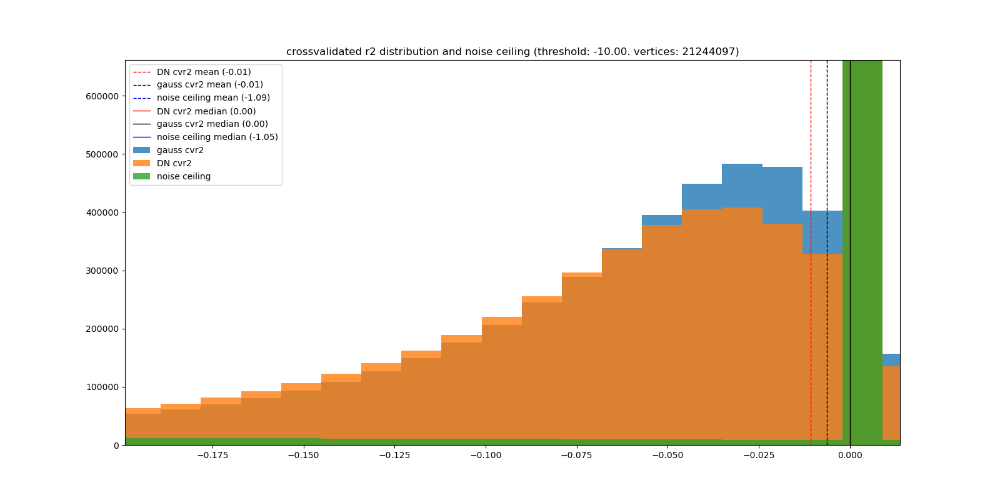

Text(0.5, 1.0, 'crossvalidated r2 distribution and noise ceiling (threshold: -10.00. vertices: 21244097)')

In [21]:
pl.figure(figsize=(16,8))
pl.hist(full_rsq_gauss[mask_rsq],bins=np.linspace(thresh,1,1000), label='gauss cvr2', alpha=0.8)
pl.hist(full_rsq[mask_rsq],bins=np.linspace(thresh,1,1000), label='DN cvr2', alpha=0.8)
pl.hist(nc[mask_rsq],bins=np.linspace(thresh,1,1000), label='noise ceiling', alpha=0.8)
pl.axvline(np.mean(full_rsq[mask_rsq]), color='r', linestyle='dashed', linewidth=1, label=f'DN cvr2 mean ({np.mean(full_rsq[mask_rsq]):.2f})')
pl.axvline(np.mean(full_rsq_gauss[mask_rsq]), color='k', linestyle='dashed', linewidth=1, label=f'gauss cvr2 mean ({np.mean(full_rsq_gauss[mask_rsq]):.2f})')
pl.axvline(np.mean(nc[mask_rsq]), color='b', linestyle='dashed', linewidth=1, label=f'noise ceiling mean ({np.mean(nc[mask_rsq]):.2f})')
pl.axvline(np.median(full_rsq[mask_rsq]), color='r', linewidth=1, label=f'DN cvr2 median ({np.median(full_rsq[mask_rsq]):.2f}) ')
pl.axvline(np.median(full_rsq_gauss[mask_rsq]), color='k', linewidth=1, label=f'gauss cvr2 median ({np.median(full_rsq_gauss[mask_rsq]):.2f})')
pl.axvline(np.median(nc[mask_rsq]), color='b', linewidth=1, label=f'noise ceiling median ({np.median(nc[mask_rsq]):.2f})')
pl.legend()

pl.title(f'crossvalidated r2 distribution and noise ceiling (threshold: {thresh:.2f}. vertices: {np.sum(mask_rsq)})')

In [ ]:
pl.figure(figsize=(16,8))
diff = full_rsq[mask_rsq]-full_rsq_gauss[mask_rsq]
pl.hist(diff,bins=1000, label='diff', alpha=0.8)
pl.axvline(np.mean(diff), color='k', linestyle='dashed', linewidth=1, label='diff cvr2 mean')
pl.axvline(np.median(diff), color='k', linewidth=1, label='diff cvr2 median')
pl.legend()
pl.xlim((-1,1))

## Combining no-cv results with CV-rsq and # of subjects map

In [18]:
#rsqwm have rsq-weighted means over subjects on fsaverage
#maindict_ #allall, allruns_sepcond_rsqwm, 5050CV, allruns_sepcond_zsc, HCP_181subjects_rsqwm, HCP_999999, 99mean181, 99split20, HCP_cv (tcfit), HCP_tc_nocv
with open('/Volumes/Crucial X8/maindict_HCP_cv.pickle', 'rb') as handle:
    dict_cv=dill.load(handle)

In [19]:
m = [sj for sj in dict_cv['HCP']['fit-task-BAR_fit-runs-CVmedian'].keys()]
m.sort()

In [20]:
l = [sj for sj in vis_res.main_dict['HCP']['fit-task-BAR_fit-runs-all'].keys()]
l.sort()

In [21]:
hcp_group_average = dict()
ds_pyc = dict()

#only works on fsaverage because 'HCP' is not treated as a common space so it has one fewer layer in depth
#create the HCP_cvrsq subject manually if you want to do it in HCP space
space = 'fsaverage'  
if space == 'fsaverage':
    pyc_sj = 'fsaverage'
else:
    pyc_sj = '999999'

weights = np.nan_to_num(np.array([dict_cv[space]['fit-task-BAR_fit-runs-CVmedian'][sj]['Processed Results']['RSq']['Norm_abcd'] for sj in m]))
weights[weights<=0] = 0

sj_number_map = np.sum(weights>0, axis=0)
threshold_li = filters.threshold_li(sj_number_map)
print(threshold_li)

for param in ['RSq', 'x_pos', 'y_pos','Norm Param. B','Norm Param. D','Amplitude', 'Surround Amplitude','Size (fwhmax)','Surround Size (fwatmin)','Size (sigma_1)','Size (sigma_2)']:
    if param == 'x_pos':
        data = np.nan_to_num(np.array([vis_res.main_dict[space]['fit-task-BAR_fit-runs-all'][sj]['Processed Results']['Eccentricity']['Norm_abcd'] for sj in m])*np.cos(np.array([vis_res.main_dict[space]['fit-task-BAR_fit-runs-all'][sj]['Processed Results']['Polar Angle']['Norm_abcd'] for sj in m])))
    elif param == 'y_pos':
        data = np.nan_to_num(np.array([vis_res.main_dict[space]['fit-task-BAR_fit-runs-all'][sj]['Processed Results']['Eccentricity']['Norm_abcd'] for sj in m])*np.sin(np.array([vis_res.main_dict[space]['fit-task-BAR_fit-runs-all'][sj]['Processed Results']['Polar Angle']['Norm_abcd'] for sj in m])))
    elif param == 'RSq':
        data = np.copy(weights)
    else:
        data = np.nan_to_num(np.array([vis_res.main_dict[space]['fit-task-BAR_fit-runs-all'][sj]['Processed Results'][param]['Norm_abcd'] for sj in m]))

    if param == 'RSq':
        hcp_group_average[param] = (data*(weights>0)).sum(0)/(weights>0).sum(0)
    else:
        hcp_group_average[param] = (data*weights).sum(0)/weights.sum(0)
    
hcp_group_average['Polar Angle'] = np.arctan2(hcp_group_average['y_pos'], hcp_group_average['x_pos'])
hcp_group_average['Eccentricity'] = np.sqrt(hcp_group_average['y_pos']**2 + hcp_group_average['x_pos']**2) 
hcp_group_average['#Subjects with CVRSq>0'] = np.copy(sj_number_map)

for param in hcp_group_average:
    vis_res.main_dict[space]['fit-task-BAR_fit-runs-all'][f'{space}_cvrsq']['Processed Results'][param]['Norm_abcd'] = np.copy(hcp_group_average[param])
    


22.89421547540501


/var/folders/vb/gdqfj5px0gb7r_bgl5hpf8n00000gn/T/ipykernel_67718/2076790375.py:28: RuntimeWarning: invalid value encountered in true_divide
  hcp_group_average[param] = (data*(weights>0)).sum(0)/(weights>0).sum(0)
/var/folders/vb/gdqfj5px0gb7r_bgl5hpf8n00000gn/T/ipykernel_67718/2076790375.py:30: RuntimeWarning: invalid value encountered in true_divide
  hcp_group_average[param] = (data*weights).sum(0)/weights.sum(0)


KeyError: 'RSq'

In [23]:

vis_res.main_dict['fsaverage']['fit-task-BAR_fit-runs-all'][f'fsaverage_cvrsq']['Processed Results']['RSq']['Norm_abcd']=np.nan_to_num(vis_res.main_dict['fsaverage']['fit-task-BAR_fit-runs-all'][f'fsaverage_cvrsq']['Processed Results']['RSq']['Norm_abcd'])
vis_res.main_dict['fsaverage']['fit-task-BAR_fit-runs-all'][f'fsaverage_cvrsq']['Processed Results']['Size ratio (sigma_2/sigma_1)']['Norm_abcd']=vis_res.main_dict['fsaverage']['fit-task-BAR_fit-runs-all'][f'fsaverage_cvrsq']['Processed Results']['Size (sigma_2)']['Norm_abcd']/vis_res.main_dict['fsaverage']['fit-task-BAR_fit-runs-all'][f'fsaverage_cvrsq']['Processed Results']['Size (sigma_1)']['Norm_abcd']
vis_res.main_dict['fsaverage']['fit-task-BAR_fit-runs-all'][f'fsaverage_cvrsq']['Processed Results']['Ratio (B/D)']['Norm_abcd']=vis_res.main_dict['fsaverage']['fit-task-BAR_fit-runs-all'][f'fsaverage_cvrsq']['Processed Results']['Norm Param. B']['Norm_abcd']/vis_res.main_dict['fsaverage']['fit-task-BAR_fit-runs-all'][f'fsaverage_cvrsq']['Processed Results']['Norm Param. D']['Norm_abcd']


/var/folders/vb/gdqfj5px0gb7r_bgl5hpf8n00000gn/T/ipykernel_65293/2405854770.py:1: RuntimeWarning: invalid value encountered in true_divide
  vis_res.main_dict['fsaverage']['fit-task-BAR_fit-runs-all'][f'fsaverage_cvrsq']['Processed Results']['Size ratio (sigma_2/sigma_1)']['Norm_abcd']=vis_res.main_dict['fsaverage']['fit-task-BAR_fit-runs-all'][f'fsaverage_cvrsq']['Processed Results']['Size (sigma_2)']['Norm_abcd']/vis_res.main_dict['fsaverage']['fit-task-BAR_fit-runs-all'][f'fsaverage_cvrsq']['Processed Results']['Size (sigma_1)']['Norm_abcd']


In [25]:
for param in hcp_group_average:
    if param == 'Polar Angle':
        pyc_cmap = 'hsvx2'
        vmin1 = -3.1415
        vmax1 = 3.1415
    else:
        pyc_cmap = 'nipy_spectral'
        vmin1 = np.nanquantile(hcp_group_average[param][sj_number_map>threshold_li],0.1)
        vmax1 = np.nanquantile(hcp_group_average[param][sj_number_map>threshold_li],0.9)
        
    ds_pyc[f"{param}"] = Vertex2D_fix(hcp_group_average[param], sj_number_map, subject=pyc_sj, 
                                                        vmin=vmin1, 
                                                        vmax=vmax1, 
                                                        vmin2=threshold_li, vmax2=69, cmap=pyc_cmap)

# select path for static viewer on disk
viewer_path = '/Users/marcoaqil/Downloads'

# create viewer
#cortex.webgl.make_static(outpath=viewer_path, data=ds_pyc, recache=True)
#cortex.webgl.show(ds_pyc)

Started server on port 4722


<JS: window.viewer>

## CVR2 maps tests (neg values not set to zero, median)

In [6]:
cvrsq_raw_mean = np.mean([vis_res.main_dict['HCP']['fit-task-BAR_fit-runs-CVmedian'][sj]['Processed Results']['RSq']['Norm_abcd'] for sj in vis_res.main_dict['HCP']['fit-task-BAR_fit-runs-CVmedian'].keys()], axis=0)
cvrsq_raw_median = np.median([vis_res.main_dict['HCP']['fit-task-BAR_fit-runs-CVmedian'][sj]['Processed Results']['RSq']['Norm_abcd'] for sj in vis_res.main_dict['HCP']['fit-task-BAR_fit-runs-CVmedian'].keys()], axis=0)

cvrsq_raw_number_sj = np.sum([vis_res.main_dict['HCP']['fit-task-BAR_fit-runs-CVmedian'][sj]['Processed Results']['RSq']['Norm_abcd']>0 for sj in vis_res.main_dict['HCP']['fit-task-BAR_fit-runs-CVmedian'].keys()], axis=0)


In [7]:
(cvrsq_raw_mean>0).sum()/len(cvrsq_raw_mean)

0.07713519530459421

In [92]:
rsq_thresh = 0.0
rsq_max_opacity = 0.15
ds_rsq=dict()
ds_rsq[f"cvrsq_raw_mean"] = cortex.Vertex(cvrsq_raw_mean, subject='999999', 
                                vmin=np.nanquantile(cvrsq_raw_mean,0.1), 
                                vmax=np.nanquantile(cvrsq_raw_mean,0.9), cmap='nipy_spectral')
ds_rsq[f"cvrsq_raw_median"] = cortex.Vertex(cvrsq_raw_median, subject='999999', 
                                vmin=np.nanquantile(cvrsq_raw_median,0.1), 
                                vmax=np.nanquantile(cvrsq_raw_median,0.9), cmap='nipy_spectral')
ds_rsq[f"cvrsq_raw_number_sj"] = cortex.Vertex(cvrsq_raw_number_sj, subject='999999', 
                                vmin=8, 
                                vmax=150, cmap='nipy_spectral')
cortex.webgl.show(ds_rsq)

Started server on port 54914


<JS: window.viewer>

In [78]:
from skimage import filters
threshold_yen = filters.threshold_yen(cvrsq_raw_number_sj) #yen=43, otsu=56, isodata=56, li=22, mean=16.54, minimum=89, triangle=8
threshold_otsu = filters.threshold_otsu(cvrsq_raw_number_sj)
threshold_isodata = filters.threshold_isodata(cvrsq_raw_number_sj)
threshold_li = filters.threshold_li(cvrsq_raw_number_sj)
threshold_mean = filters.threshold_mean(cvrsq_raw_number_sj)
threshold_minimum = filters.threshold_minimum(cvrsq_raw_number_sj)
threshold_triangle = filters.threshold_triangle(cvrsq_raw_number_sj)

In [77]:
thresh

8

In [57]:
np.sum(cvrsq_raw_number_sj>thresh)/len(cvrsq_raw_number_sj)

0.12439283545840923

<IPython.core.display.Javascript object>


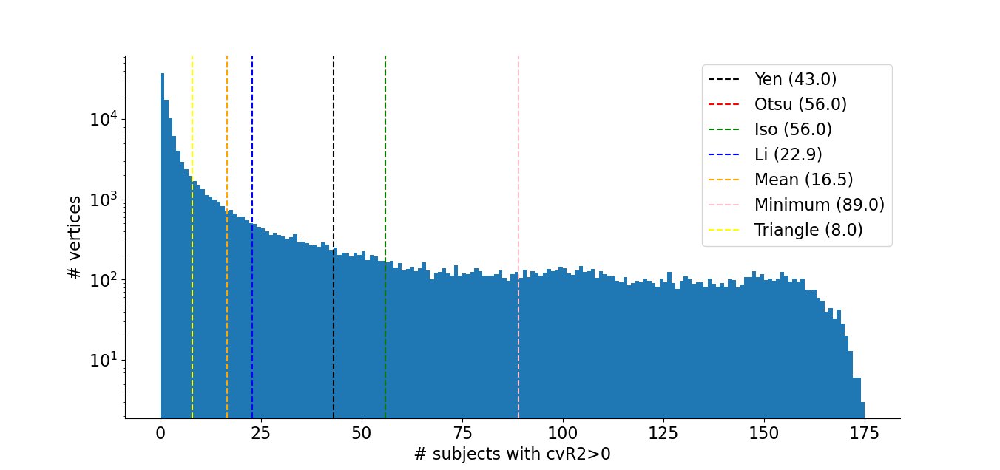

In [86]:
pl.figure()
pl.hist(cvrsq_raw_number_sj,bins=175)
pl.axvline(threshold_yen, linestyle='--', color='k', label = f"Yen ({threshold_yen:.1f})")
pl.axvline(threshold_otsu, linestyle='--', color='r', label = f"Otsu ({threshold_otsu:.1f})")
pl.axvline(threshold_isodata, linestyle='--', color='g', label = f"Iso ({threshold_isodata:.1f})")
pl.axvline(threshold_li, linestyle='--', color='b', label = f"Li ({threshold_li:.1f})")
pl.axvline(threshold_mean, linestyle='--', color='orange', label = f"Mean ({threshold_mean:.1f})")
pl.axvline(threshold_minimum, linestyle='--', color='pink', label = f"Minimum ({threshold_minimum:.1f})")
pl.axvline(threshold_triangle, linestyle='--', color='yellow', label = f"Triangle ({threshold_triangle:.1f})")
pl.xlabel('# subjects with cvR2>0')
pl.ylabel('# vertices')
pl.yscale('log')
pl.legend()

# Something wrong with subj 115017. investigate

In [43]:
vis_res.main_dict['HCP']['fit-task-all_fit-runs-all'][sj].keys()

dict_keys(['Results', 'mask', 'analysis_info', 'Timecourse Stats', 'Processed Results'])

In [6]:
for sj in vis_res.main_dict['HCP']['fit-task-all_fit-runs-all']:
    print(sj)
    print(vis_res.main_dict['HCP']['fit-task-all_fit-runs-all'][sj]['mask'].sum())
    print(vis_res.main_dict['HCP']['fit-task-all_fit-runs-all'][sj]['Results']['Gauss'].shape)

100610
108441
(118584, 6)
102311
108441
(118584, 6)
102816
108441
(118584, 6)
104416
108441
(118584, 6)
105923
108441
(118584, 6)
108323
108441
(118584, 6)
109123
108441
(118584, 6)
111514
108441
(118584, 6)
114823
108441
(118584, 6)
115825
108441
(118584, 6)
116726
108441
(118584, 6)
118225
108441
(118584, 6)
125525
108441
(118584, 6)
126426
108441
(118584, 6)
128935
108441
(118584, 6)
130114
108441
(118584, 6)
130518
108441
(118584, 6)
131217
108441
(118584, 6)
131722
108441
(118584, 6)
132118
108441
(118584, 6)
134627
108441
(118584, 6)
134829
108441
(118584, 6)
135124
108441
(118584, 6)
HCP_cvrsq


AttributeError: 'dict' object has no attribute 'sum'

In [52]:
#rsqwm have rsq-weighted means over subjects on fsaverage
#maindict_ #allall, allruns_sepcond_rsqwm, 5050CV, allruns_sepcond_zsc, HCP_181subjects_rsqwm, HCP_999999, 99mean181, 99split20, HCP_cv (tcfit), HCP_tc_nocv
with open('/Volumes/Crucial X8/maindict_HCP_cv.pickle', 'rb') as handle:
    dict_cv=dill.load(handle)

In [53]:
vis_res.main_dict[space][an_name].keys()

dict_keys(['100610', '102311', '102816', '104416', '105923', '108323', '109123', '111312', '111514', '114823', '115825', '116726', '118225', '125525', '126426', '128935', '130114', '130518', '131217', '131722', '132118', '134627', '134829', '135124', '137128', '145834', '146129', '146432', '146735', '146937', '148133', '150423', '156334', '157336', '159239', '162935', '164131', '164636', '165436', '167036', '167440', '169040', '169343', '169444', '169747', '171633', '172130', '173334', '175237', '176542', '177140', '177645', '177746', '178142', '178243', '178647'])

In [54]:
hcp_group_average = dict()
ds_pyc = dict()
an_name = 'fit-task-all_fit-runs-all'
space = 'HCP'  #'HCP'#fsaverage

m = [sj for sj in vis_res.main_dict[space][an_name].keys()]
m.sort()

if space == 'fsaverage':
    pyc_sj = 'fsaverage'
else:
    pyc_sj = '999999'

#cvrsq
weights = np.nan_to_num(np.array([dict_cv[space]['fit-task-BAR_fit-runs-CVmedian'][sj]['Processed Results']['RSq']['Norm_abcd'] for sj in m]))
#noncvrsq
#weights = np.nan_to_num(np.array([vis_res.main_dict[space][an_name][sj]['Processed Results']['RSq']['Norm_abcd'] for sj in m]))

weights[weights<=0] = 0

sj_number_map = np.sum(weights>0, axis=0)
threshold_li = filters.threshold_li(sj_number_map)
print(threshold_li)

for param in ['RSq', 'x_pos', 'y_pos','Norm Param. B','Norm Param. D','Amplitude', 'Surround Amplitude','Size (fwhmax)','Surround Size (fwatmin)','Size (sigma_1)','Size (sigma_2)']:
    if param == 'x_pos':
        data = np.nan_to_num(np.array([vis_res.main_dict[space][an_name][sj]['Processed Results']['Eccentricity']['Norm_abcd'] for sj in m])*np.cos(np.array([vis_res.main_dict[space][an_name][sj]['Processed Results']['Polar Angle']['Norm_abcd'] for sj in m])))
    elif param == 'y_pos':
        data = np.nan_to_num(np.array([vis_res.main_dict[space][an_name][sj]['Processed Results']['Eccentricity']['Norm_abcd'] for sj in m])*np.sin(np.array([vis_res.main_dict[space][an_name][sj]['Processed Results']['Polar Angle']['Norm_abcd'] for sj in m])))
    elif param == 'RSq':
        data = np.copy(weights)
    else:
        data = np.nan_to_num(np.array([vis_res.main_dict[space][an_name][sj]['Processed Results'][param]['Norm_abcd'] for sj in m]))

    if param == 'RSq':
        hcp_group_average[param] = (data*(weights>0)).sum(0)/(weights>0).sum(0)
    else:
        hcp_group_average[param] = (data*weights).sum(0)/weights.sum(0)
    
hcp_group_average['Polar Angle'] = np.arctan2(hcp_group_average['y_pos'], hcp_group_average['x_pos'])
hcp_group_average['Eccentricity'] = np.sqrt(hcp_group_average['y_pos']**2 + hcp_group_average['x_pos']**2) 
hcp_group_average['#Subjects with CVRSq>0'] = np.copy(sj_number_map)


6.737734616647669


/var/folders/vb/gdqfj5px0gb7r_bgl5hpf8n00000gn/T/ipykernel_68437/2611304242.py:36: RuntimeWarning: invalid value encountered in true_divide
  hcp_group_average[param] = (data*(weights>0)).sum(0)/(weights>0).sum(0)
/var/folders/vb/gdqfj5px0gb7r_bgl5hpf8n00000gn/T/ipykernel_68437/2611304242.py:38: RuntimeWarning: invalid value encountered in true_divide
  hcp_group_average[param] = (data*weights).sum(0)/weights.sum(0)


In [56]:
if space == 'HCP':
    vis_res.main_dict[space][an_name][f'{space}_cvrsq'] = dd(lambda:dd(dict))

for param in hcp_group_average:
    
    vis_res.main_dict[space][an_name][f'{space}_cvrsq']['Processed Results'][param]['Norm_abcd'] = np.copy(hcp_group_average[param])
    

vis_res.main_dict[space][an_name][f'{space}_cvrsq']['Processed Results']['RSq']['Norm_abcd']=np.nan_to_num(vis_res.main_dict[space][an_name][f'{space}_cvrsq']['Processed Results']['RSq']['Norm_abcd'])
vis_res.main_dict[space][an_name][f'{space}_cvrsq']['Processed Results']['Size ratio (sigma_2/sigma_1)']['Norm_abcd']=vis_res.main_dict[space][an_name][f'{space}_cvrsq']['Processed Results']['Size (sigma_2)']['Norm_abcd']/vis_res.main_dict[space][an_name][f'{space}_cvrsq']['Processed Results']['Size (sigma_1)']['Norm_abcd']
vis_res.main_dict[space][an_name][f'{space}_cvrsq']['Processed Results']['Ratio (B/D)']['Norm_abcd']=vis_res.main_dict[space][an_name][f'{space}_cvrsq']['Processed Results']['Norm Param. B']['Norm_abcd']/vis_res.main_dict[space][an_name][f'{space}_cvrsq']['Processed Results']['Norm Param. D']['Norm_abcd']


/var/folders/vb/gdqfj5px0gb7r_bgl5hpf8n00000gn/T/ipykernel_68437/970010375.py:10: RuntimeWarning: invalid value encountered in true_divide
  vis_res.main_dict[space][an_name][f'{space}_cvrsq']['Processed Results']['Size ratio (sigma_2/sigma_1)']['Norm_abcd']=vis_res.main_dict[space][an_name][f'{space}_cvrsq']['Processed Results']['Size (sigma_2)']['Norm_abcd']/vis_res.main_dict[space][an_name][f'{space}_cvrsq']['Processed Results']['Size (sigma_1)']['Norm_abcd']
/var/folders/vb/gdqfj5px0gb7r_bgl5hpf8n00000gn/T/ipykernel_68437/970010375.py:11: RuntimeWarning: invalid value encountered in true_divide
  vis_res.main_dict[space][an_name][f'{space}_cvrsq']['Processed Results']['Ratio (B/D)']['Norm_abcd']=vis_res.main_dict[space][an_name][f'{space}_cvrsq']['Processed Results']['Norm Param. B']['Norm_abcd']/vis_res.main_dict[space][an_name][f'{space}_cvrsq']['Processed Results']['Norm Param. D']['Norm_abcd']


In [55]:
for param in hcp_group_average:
    if param == 'Polar Angle':
        pyc_cmap = 'hsvx2'
        vmin1 = -3.1415
        vmax1 = 3.1415
    else:
        pyc_cmap = 'nipy_spectral'
        vmin1 = np.nanquantile(hcp_group_average[param][sj_number_map>threshold_li],0.1)
        vmax1 = np.nanquantile(hcp_group_average[param][sj_number_map>threshold_li],0.9)
        
    ds_pyc[f"{param}"] = Vertex2D_fix(hcp_group_average[param], sj_number_map, subject=pyc_sj, 
                                                        vmin=vmin1, 
                                                        vmax=vmax1, 
                                                        vmin2=threshold_li, vmax2=threshold_li+1, cmap=pyc_cmap)

# select path for static viewer on disk
viewer_path = '/Users/marcoaqil/Downloads'

# create viewer
#cortex.webgl.make_static(outpath=viewer_path, data=ds_pyc, recache=True)
cortex.webgl.show(ds_pyc)

Started server on port 4677


<JS: window.viewer>